In [1]:
# import relevant packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.stats as ss
import seaborn as sns

import torch
import torch_geometric
from torch_geometric.loader import DataLoader

# set figure parameters
sc.settings.set_figure_params(dpi=100)

In [2]:
device = 'cuda'

In [3]:
%load_ext autoreload
%autoreload 2

## define helper functions

In [4]:
# define a function to gather positions
def get_pos(n_x, n_y):
    # create the hex lattice
    xs = np.array([np.arange(0, n_x) + 0.5 if idx % 2 == 0 else np.arange(0, n_x) for idx in range(n_y)])
    # derive the y-step given a distance of one
    y_step = np.sqrt(1**2+0.5**2)
    ys = np.array([[y_step * idy] * n_x for idy in range(n_y)])
    # define the positions
    pos = np.vstack([xs.flatten(), ys.flatten()]).T
    return pos

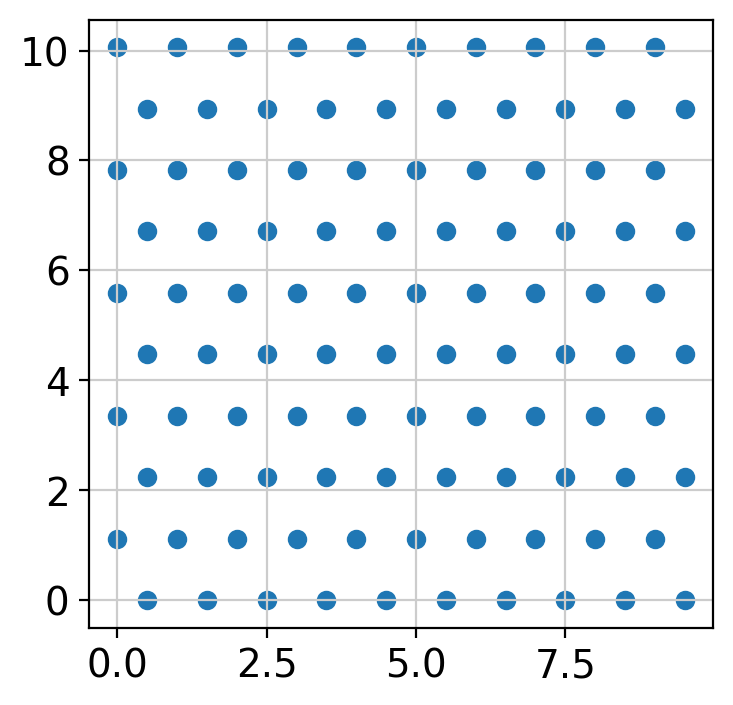

In [5]:
pos = get_pos(10, 10)
plt.scatter( pos[:,0], pos[:,1])

In [6]:
# define a function to derive the gex from the sphex
def calc_gex(sphex):
    """
    Calculates the gene expression matrix from the spherical
    """
    # setup the gex
    n_genes = sphex.shape[1]+1
    gex = torch.from_numpy(np.ones((sphex.shape[0], n_genes)).astype('float32')).to(device)
    # compute the gex
    for idx in range(n_genes):
        for idx_ in range(idx):
            gex[:,idx] *= torch.sin(sphex[:,idx_])
        if idx < n_genes-1:
            gex[:,idx] *= torch.cos(sphex[:,idx])
    return torch.nan_to_num(gex).to(device)

In [7]:
from torch_geometric.nn import GCNConv
from sklearn.neighbors import kneighbors_graph
# define the number of neighbors (six for visium)
n_neighbors = 6
# define the simcomen class
class simcomen(torch.nn.Module):
    # define initialization function
    def __init__(self, input_dim, output_dim, n_neighbors, seed=0):
        super(simcomen, self).__init__()
        # define the seed
        torch.manual_seed(seed)
        # set up the graph convolution
        self.conv1 = GCNConv(input_dim, output_dim, add_self_loops=False)
        # set up the linear layer for intracellular gene regulation
        self.lin = torch.nn.Linear(input_dim, output_dim)
        # define the neighbors
        self.n_neighbors = n_neighbors
        # define a tracking variable for the gene expression x matrix
        self.sphex = None
        self.gex = None

    # define a function to artificially set the g2g matrix
    def set_g2g(self, g2g):
        """
        Artifically sets the core g2g matrix to be a specified interaction matrix
        """
        # set the weight as the input
        self.conv1.lin.weight = torch.nn.Parameter(g2g, requires_grad=False)
        # and then set the bias as all zeros
        self.conv1.bias = torch.nn.Parameter(torch.from_numpy(np.zeros(n_genes).astype('float32')), requires_grad=False)

    # define a function to artificially set the g2g matrix
    def set_g2g_intra(self, g2g_intra):
        """
        Artifically sets the core g2g intracellular matrix to be a specified matrix
        """
        # set the weight as the input
        self.lin.weight = torch.nn.Parameter(g2g_intra, requires_grad=False)
        # and then set the bias as all zeros
        self.lin.bias = torch.nn.Parameter(torch.from_numpy(np.zeros(len(g2g_intra)).astype('float32')), requires_grad=False)

    # define a function to artificially set the sphex matrix
    def set_sphex(self, sphex):
        """
        Artifically sets the current sphex matrix
        """
        self.sphex = torch.nn.Parameter(sphex, requires_grad=True)
        
    # define the forward pass
    def forward(self, edge_index, batch):
        """
        Forward pass for prediction or training,
        convolutes the input by the expected interactions and returns log(Z_mft)
        """
        # compute the gex
        self.gex = calc_gex(self.sphex)
        # print
        # print(f"device of self.gex is {self.gex.get_device()}")
        # print(f"device of edge_index is {edge_index.get_device()}")
        edge_index = edge_index.to(device)
        # print(f"device of edge_index is {edge_index.get_device()}")
        # print(f"device of model is {self.get_device()}")
        
        # compute the message
        msg = self.conv1(self.gex, edge_index)
        # compute intracellular message
        msg_intra = self.lin(self.gex)
        # compute the log z mft
        log_z_mft = self.log_Z_mft(edge_index, batch)
        return msg, msg_intra, log_z_mft

    # define approximation function
    def log_Z_mft(self, edge_index, batch):
        """
        Mean Field Theory approximation to the partition function. Assumptions used are:
        - expression of values of genes are close to their mean values over the visium slide
        - \sum_b g_{a,b} m^b >0 \forall a, where m is the mean gene expression and g is the gene-gene
          interaction matrix.
        """
        # retrieve number of spots
        num_spots = self.gex.shape[0]
        # calculate mean gene expression        
        mean_genes = torch.mean(self.gex, axis=0).reshape(-1,1)  # the mean should be per connected graph
        # calculate the norm of the sum of mean genes
        g = torch.norm(torch.mm( self.n_neighbors*self.conv1.lin.weight + 2*self.lin.weight, mean_genes))   # maybe needs to change to g = torch.norm(torch.mm(mean_genes, self.conv1.lin.weight))
        # calculate the contribution for mean values        
        z_mean = - num_spots  * torch.mm(torch.mm(torch.t(mean_genes), self.lin.weight + 0.5 * self.n_neighbors * self.conv1.lin.weight),  mean_genes)
        # calculate the contribution gene interactions
        z_interaction = self.z_interaction(num_spots=num_spots, g=g)
        # add the two contributions        
        log_z_mft = z_mean + z_interaction
        return log_z_mft

    def z_interaction(self, num_spots, g):
        """
        Avoid exploding exponentials by returning an approximate interaction term for the partition function.
        """
        if g>20:
            z_interaction = num_spots * ( g - torch.log( g) )
        else:
            z_interaction = num_spots * torch.log((torch.exp( g) - torch.exp(- g))/( g))
        return z_interaction

In [8]:
# define the celcomen class
class celcomen(torch.nn.Module):
    # define initialization function
    def __init__(self, input_dim, output_dim, n_neighbors, seed=0):
        super(celcomen, self).__init__()
        # define the seed
        torch.manual_seed(seed)
        # set up the graph convolution
        self.conv1 = GCNConv(input_dim, output_dim, add_self_loops=False)
        # set up the linear layer for intracellular gene regulation
        self.lin = torch.nn.Linear(input_dim, output_dim)
        # define the neighbors
        self.n_neighbors = n_neighbors
        # define a tracking variable for the gene expression x matrix
        self.gex = None

    # define a function to artificially set the g2g matrix
    def set_g2g(self, g2g):
        """
        Artifically sets the core g2g matrix to be a specified interaction matrix
        """
        # set the weight as the input
        self.conv1.lin.weight = torch.nn.Parameter(g2g, requires_grad=True)
        # and then set the bias as all zeros
        self.conv1.bias = torch.nn.Parameter(torch.from_numpy(np.zeros(len(g2g)).astype('float32')), requires_grad=False)

    # define a function to artificially set the g2g matrix
    def set_g2g_intra(self, g2g_intra):
        """
        Artifically sets the core g2g intracellular matrix to be a specified matrix
        """
        # set the weight as the input
        self.lin.weight = torch.nn.Parameter(g2g_intra, requires_grad=True)
        # and then set the bias as all zeros
        self.lin.bias = torch.nn.Parameter(torch.from_numpy(np.zeros(len(g2g_intra)).astype('float32')), requires_grad=False)

    # define a function to artificially set the sphex matrix
    def set_gex(self, gex):
        """
        Artifically sets the current sphex matrix
        """
        self.gex = torch.nn.Parameter(gex, requires_grad=False)
        
    # define the forward pass
    def forward(self, edge_index, batch):
        """
        Forward pass for prediction or training,
        convolutes the input by the expected interactions and returns log(Z_mft)
        """
        # compute the message
        msg = self.conv1(self.gex, edge_index)
        # compute intracellular message
        msg_intra = self.lin(self.gex)
        # compute the log z mft
        log_z_mft = self.log_Z_mft(edge_index, batch)
        return msg, msg_intra, log_z_mft

    # define approximation function
    def log_Z_mft(self, edge_index, batch):
        """
        Mean Field Theory approximation to the partition function. Assumptions used are:
        - expression of values of genes are close to their mean values over the visium slide
        - \sum_b g_{a,b} m^b >0 \forall a, where m is the mean gene expression and g is the gene-gene
          interaction matrix.
        """
        # retrieve number of spots
        num_spots = self.gex.shape[0]
        # calculate mean gene expression        
        mean_genes = torch.mean(self.gex, axis=0).reshape(-1,1)  # the mean should be per connected graph
        # calculate the norm of the sum of mean genes
        g = torch.norm(torch.mm( self.n_neighbors*self.conv1.lin.weight + 2*self.lin.weight, mean_genes))   # maybe needs to change to g = torch.norm(torch.mm(mean_genes, self.conv1.lin.weight))
        # calculate the contribution for mean values        
        z_mean = - num_spots  * torch.mm(torch.mm(torch.t(mean_genes), self.lin.weight + 0.5 * self.n_neighbors * self.conv1.lin.weight),  mean_genes)
        # calculate the contribution gene interactions
        z_interaction = self.z_interaction(num_spots=num_spots, g=g)
        # add the two contributions        
        log_z_mft = z_mean + z_interaction
        return log_z_mft

    def z_interaction(self, num_spots, g):
        """
        Avoid exploding exponentials by returning an approximate interaction term for the partition function.
        """
        if g>20:
            z_interaction = num_spots * ( g - torch.log( g) )
        else:
            z_interaction = num_spots * torch.log((torch.exp( g) - torch.exp(- g))/( g))
        return z_interaction

In [9]:
# define a function to normalize the g2g
def normalize_g2g(g2g):
    """
    Addresses any small fluctuations in symmetrical weights
    """
    # symmetrize the values
    g2g = (g2g + g2g.T) / 2
    # force them to be between 0-1
    g2g[g2g < 0] = 0
    g2g[g2g > 1] = 1
    # force the central line to be 1
    for idx in range(len(g2g)):
        g2g[idx, idx] = 1
    return g2g

## perform simulations

In [10]:
# jump start loss0


# def run_scc(input_g2g, params, plot=False):
#     # define the hyperparameters
#     n_x, n_y, n_genes = params[:3]
#     learning_rate = params[3]
#     zmft_scalar = params[4]
#     seed = params[5]
#     epochs = params[6]
#     # instantiate the model, input and output will be the same
#     model = simcomen(input_dim=n_genes, output_dim=n_genes, n_neighbors=n_neighbors, seed=seed)
    
#     # now perform the simulation
#     np.random.seed(seed)
#     # retrieve the positions
#     pos = torch.from_numpy(get_pos(n_x, n_y).astype('float32'))
#     # find the edges via kneighbors, not including self because we are considering intercellular
#     edge_index = kneighbors_graph(pos, n_neighbors, include_self=False).todense()
#     edge_index = torch.from_numpy(np.array(np.where(edge_index)))
#     # artifically set the g2g matrix
#     model.set_g2g(input_g2g)
#     model.set_g2g_intra(input_g2g)

#     # initialize a gene expression matrix
#     input_sphex = np.random.normal(np.pi/4, np.pi/8, size=(pos.shape[0], n_genes-1)).astype('float32')
#     model.set_sphex(torch.from_numpy(input_sphex.copy()))

#     # move to device
#     model.to(device)
#     # train the model
#     model.train()

#     # keep changing the initialization until you have a good starting point
#     loss0 = 2000
#     while loss0>200:
#         msg, msg_intra, log_z_mft = model(edge_index, 1)
#         loss0 = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model.gex))) )
#         input_sphex = np.random.normal(np.pi/4, np.pi/8, size=(pos.shape[0], n_genes-1)).astype('float32')
#         model.set_sphex(torch.from_numpy(input_sphex.copy()))
#         model.to(device)
#         model.train()
            
#     # set up the optimizer
#     optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0)
#     # keep track of the losses per data object
#     loss, losses = None, []

#     # work through epochs
#     for epoch in range(epochs):
#         # derive the message as well as the mean field approximation
#         msg, msg_intra, log_z_mft = model(edge_index, 1)
#         if epoch == 0:
#             input_gex, input_msg = model.gex.clone().detach().cpu().numpy(), msg.clone().detach().cpu().numpy()
#         # compute the loss and track it
#         loss = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model.gex))) )
#         losses.append(loss.detach().cpu().numpy()[0][0])
#         # derive the gradients, update, and clear
#         loss.backward()
#         optimizer.step()
#         optimizer.zero_grad()

    
    
#     # create the plot
#     if plot:
#         fig, ax = plt.subplots(figsize=[6, 4])
#         ax.grid(False)
#         ax.plot(losses, lw=2, color='#fe86a4')
#         ax.set_xlim(0, epochs)
#         vmin, vmax = min(min(losses), 0), max(losses)
#         vstep = (vmax - vmin) * 0.01
#         ax.set_ylim(vmin-vstep, vmax+vstep)
#         ax.set(xlabel='epochs', ylabel='loss')
    
#     # retrieve the data
#     output_gex = model.gex.detach().cpu().numpy()
#     output_msg = msg.detach().cpu().numpy()
#     exp_g2g = input_g2g.detach().cpu().numpy()
#     # plot the correlations
#     if plot:
#         for matrix in [input_gex, input_msg, output_gex, output_msg]:
#             g = sns.clustermap(pd.DataFrame(matrix).corr(method='spearman'), cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
#                                figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
#             g.ax_heatmap.grid(False)
#             g.ax_cbar.grid(False)
#             g.ax_heatmap.tick_params(labelrotation=0)
#         # plot the expected g2g matrix
#         g = sns.clustermap(exp_g2g, cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
#                            figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
#         g.ax_heatmap.grid(False)
#         g.ax_cbar.grid(False)
#         g.ax_heatmap.tick_params(labelrotation=0)
        
#     return losses, input_gex, output_gex, exp_g2g

In [11]:
# jump start by looking at entire loss history


# def run_scc(input_g2g, params, plot=False):
#     # define the hyperparameters
#     n_x, n_y, n_genes = params[:3]
#     learning_rate = params[3]
#     zmft_scalar = params[4]
#     seed = params[5]
#     epochs = params[6]

#     spearman_corr = 0.0

#     while spearman_corr>-0.5:
#         np.random.seed(seed)
#             # instantiate the model, input and output will be the same
#         model = simcomen(input_dim=n_genes, output_dim=n_genes, n_neighbors=n_neighbors, seed=seed)
        
#         # now perform the simulation
#         # retrieve the positions
#         pos = torch.from_numpy(get_pos(n_x, n_y).astype('float32'))
#         # find the edges via kneighbors, not including self because we are considering intercellular
#         edge_index = kneighbors_graph(pos, n_neighbors, include_self=False).todense()
#         edge_index = torch.from_numpy(np.array(np.where(edge_index)))
#         # artifically set the g2g matrix
#         model.set_g2g(input_g2g)
#         model.set_g2g_intra(input_g2g)

#         # initialize a gene expression matrix
#         input_sphex = np.random.normal(np.pi/4, np.pi/8, size=(pos.shape[0], n_genes-1)).astype('float32')
#         model.set_sphex(torch.from_numpy(input_sphex.copy()))
    
#         # move to device
#         model.to(device)
#         # train the model
#         model.train()
    
#         # keep changing the initialization until you have a good starting point
#         # loss0 = 2000
#         # while loss0>200:
#         #     msg, msg_intra, log_z_mft = model(edge_index, 1)
#         #     loss0 = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model.gex))) )
#         #     input_sphex = np.random.normal(np.pi/4, np.pi/8, size=(pos.shape[0], n_genes-1)).astype('float32')
#         #     model.set_sphex(torch.from_numpy(input_sphex.copy()))
#         #     model.to(device)
#         #     model.train()
                
#         # set up the optimizer
#         optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0)
#         # keep track of the losses per data object
#         loss, losses = None, []
    
#         # work through epochs
#         for epoch in range(epochs):
#             # derive the message as well as the mean field approximation
#             msg, msg_intra, log_z_mft = model(edge_index, 1)
#             if epoch == 0:
#                 input_gex, input_msg = model.gex.clone().detach().cpu().numpy(), msg.clone().detach().cpu().numpy()
#             # compute the loss and track it
#             loss = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model.gex))) )
#             losses.append(loss.detach().cpu().numpy()[0][0])
#             # derive the gradients, update, and clear
#             loss.backward()
#             optimizer.step()
#             optimizer.zero_grad()
            
#         # create the plot
#         if plot:
#             fig, ax = plt.subplots(figsize=[6, 4])
#             ax.grid(False)
#             ax.plot(losses, lw=2, color='#fe86a4')
#             ax.set_xlim(0, epochs)
#             vmin, vmax = min(min(losses), 0), max(losses)
#             vstep = (vmax - vmin) * 0.01
#             ax.set_ylim(vmin-vstep, vmax+vstep)
#             ax.set(xlabel='epochs', ylabel='loss')

#         spearman_corr, pval = ss.spearmanr( losses, sorted(losses) )
#         print(f"spearman_corr={spearman_corr}")
#         seed += 1 
        
    
#     # retrieve the data
#     output_gex = model.gex.detach().cpu().numpy()
#     output_msg = msg.detach().cpu().numpy()
#     exp_g2g = input_g2g.detach().cpu().numpy()
#     # plot the correlations
#     if plot:
#         for matrix in [input_gex, input_msg, output_gex, output_msg]:
#             g = sns.clustermap(pd.DataFrame(matrix).corr(method='spearman'), cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
#                                figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
#             g.ax_heatmap.grid(False)
#             g.ax_cbar.grid(False)
#             g.ax_heatmap.tick_params(labelrotation=0)
#         # plot the expected g2g matrix
#         g = sns.clustermap(exp_g2g, cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
#                            figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
#         g.ax_heatmap.grid(False)
#         g.ax_cbar.grid(False)
#         g.ax_heatmap.tick_params(labelrotation=0)
        
#     return losses, input_gex, output_gex, exp_g2g

In [12]:
# original: NO jump start


def run_scc(input_g2g, params, plot=False):
    # define the hyperparameters
    n_x, n_y, n_genes = params[:3]
    learning_rate = params[3]
    zmft_scalar = params[4]
    seed = params[5]
    epochs = params[6]
    # instantiate the model, input and output will be the same
    model = simcomen(input_dim=n_genes, output_dim=n_genes, n_neighbors=n_neighbors, seed=seed)
    
    # now perform the simulation
    np.random.seed(seed)
    # retrieve the positions
    pos = torch.from_numpy(get_pos(n_x, n_y).astype('float32'))
    # find the edges via kneighbors, not including self because we are considering intercellular
    edge_index = kneighbors_graph(pos, n_neighbors, include_self=False).todense()
    edge_index = torch.from_numpy(np.array(np.where(edge_index)))
    # artifically set the g2g matrix
    model.set_g2g(input_g2g)
    model.set_g2g_intra(input_g2g)

    # initialize a gene expression matrix
    input_sphex = np.random.normal(np.pi/4, np.pi/8, size=(pos.shape[0], n_genes-1)).astype('float32')
    model.set_sphex(torch.from_numpy(input_sphex.copy()))

    # move to device
    model.to(device)
    # train the model
    model.train()
            
    # set up the optimizer
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=0)
    # keep track of the losses per data object
    loss, losses = None, []

    # work through epochs
    for epoch in range(epochs):
        # derive the message as well as the mean field approximation
        msg, msg_intra, log_z_mft = model(edge_index, 1)
        if epoch == 0:
            input_gex, input_msg = model.gex.clone().detach().cpu().numpy(), msg.clone().detach().cpu().numpy()
        # compute the loss and track it
        loss = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model.gex))) )
        losses.append(loss.detach().cpu().numpy()[0][0])
        # derive the gradients, update, and clear
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        
    # create the plot
    if plot:
        fig, ax = plt.subplots(figsize=[6, 4])
        ax.grid(False)
        ax.plot(losses, lw=2, color='#fe86a4')
        ax.set_xlim(0, epochs)
        vmin, vmax = min(min(losses), 0), max(losses)
        vstep = (vmax - vmin) * 0.01
        ax.set_ylim(vmin-vstep, vmax+vstep)
        ax.set(xlabel='epochs', ylabel='loss')

    spearman_corr, pval = ss.spearmanr( losses, sorted(losses) )
    print(f"spearman_corr={spearman_corr}")

    # retrieve the data
    output_gex = model.gex.detach().cpu().numpy()
    output_msg = msg.detach().cpu().numpy()
    exp_g2g = input_g2g.detach().cpu().numpy()
    # plot the correlations
    if plot:
        for matrix in [input_gex, input_msg, output_gex, output_msg]:
            g = sns.clustermap(pd.DataFrame(matrix).corr(method='spearman'), cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
                               figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
            g.ax_heatmap.grid(False)
            g.ax_cbar.grid(False)
            g.ax_heatmap.tick_params(labelrotation=0)
        # plot the expected g2g matrix
        g = sns.clustermap(exp_g2g, cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
                           figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
        g.ax_heatmap.grid(False)
        g.ax_cbar.grid(False)
        g.ax_heatmap.tick_params(labelrotation=0)
        
    return losses, input_gex, output_gex, exp_g2g

In [13]:
def run_ccc_from_scc(output_gex, params, plot=False):
    # define the hyperparameters
    n_x, n_y, n_genes = params[:3]
    learning_rate = params[3]
    zmft_scalar = params[4]
    seed = params[5]
    epochs = params[6]
    
    # retrieve the positions
    pos = torch.from_numpy(get_pos(n_x, n_y).astype('float32'))
    # find the edges via kneighbors, not including self because we are considering intercellular
    edge_index = kneighbors_graph(pos, n_neighbors, include_self=False).todense()
    edge_index = torch.from_numpy(np.array(np.where(edge_index)))
    edge_index = edge_index.to(device)
    
    # instantiate the model, input and output will be the same
    model_rev = celcomen(input_dim=n_genes, output_dim=n_genes, n_neighbors=n_neighbors, seed=seed)
    
    # now perform the simulation
    np.random.seed(seed)
    # artifically set the g2g matrix
    input_g2g = np.random.uniform(size=(n_genes, n_genes)).astype('float32')
    input_g2g = normalize_g2g((input_g2g + input_g2g.T) / 2)
    model_rev.set_g2g(torch.from_numpy(input_g2g))
    model_rev.set_g2g_intra(torch.from_numpy(input_g2g))
    # initialize a gene expression matrix
    model_rev.set_gex(torch.from_numpy(output_gex))
    
    # setup the initial optimizer
    optimizer = torch.optim.SGD(model_rev.parameters(), lr=learning_rate, momentum=0)
    # keep track of the losses per data object
    loss, losses = None, []
    # train the model
    model_rev.train()
    model_rev.to(device)
    
    # work through epochs
    for epoch in range(epochs):
        # derive the message as well as the mean field approximation
        msg, msg_intra, log_z_mft = model_rev(edge_index, 1)
        # compute the loss and track it
        loss = -(-log_z_mft + zmft_scalar * torch.trace(torch.mm(msg, torch.t(model_rev.gex))) + zmft_scalar * torch.trace(torch.mm(msg_intra, torch.t(model_rev.gex))) )
        losses.append(loss.detach().cpu().numpy()[0][0])
        # derive the gradients, update, and clear
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        # repeatedly force a normalization
        model_rev.conv1.lin.weight = torch.nn.Parameter(normalize_g2g(model_rev.conv1.lin.weight), requires_grad=True)
        model_rev.lin.weight = torch.nn.Parameter(normalize_g2g(model_rev.lin.weight), requires_grad=True)
        optimizer = torch.optim.SGD(model_rev.parameters(), lr=learning_rate, momentum=0)
        
    # create the plot
    if plot:
        fig, ax = plt.subplots(figsize=[6, 4])
        ax.grid(False)
        ax.plot(losses, lw=2, color='#fe86a4')
        ax.set_xlim(0, epochs)
        vmin, vmax = min(min(losses), 0), max(losses)
        vstep = (vmax - vmin) * 0.01
        ax.set_ylim(vmin-vstep, vmax+vstep)
        ax.set(xlabel='epochs', ylabel='loss')
    
    # retrieve the data
    obs_g2g_ccc = model_rev.conv1.lin.weight.clone().detach().cpu().numpy()
    if plot:
        g = sns.clustermap(obs_g2g_ccc, cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
                           figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
        g.ax_heatmap.grid(False)
        g.ax_cbar.grid(False)
        g.ax_heatmap.tick_params(labelrotation=0)
    obs_g2g_intra = model_rev.lin.weight.clone().detach().cpu().numpy()
    if plot:
        g = sns.clustermap(obs_g2g_intra, cmap='seismic', row_cluster=False, col_cluster=False, vmin=-1, vmax=1,
                           figsize=[1+n_genes*0.5, 1+n_genes*0.5], dendrogram_ratio=0.1, cbar_pos=(-0.1, 1, .02, .12))
        g.ax_heatmap.grid(False)
        g.ax_cbar.grid(False)
        g.ax_heatmap.tick_params(labelrotation=0)

    return losses, obs_g2g_ccc, obs_g2g_intra

In [14]:
# define a function to generate a random g2g interaction matrix
def gen_g2g(n_genes):
    # sample the interaction terms and guarantee at least one interaction
    p = ss.uniform.rvs(size=1)[0]
    intrxns = [0]
    # we continously sample until we get interactions that do are not all empty or full
    while (np.mean(intrxns) == 0.0) | (np.mean(intrxns) == 1.0):
        intrxns = ss.binom.rvs(1, p, size=sum(list(range(n_genes))))
    # fill in the input g2g with the appropriate terms
    input_g2g = np.ones((n_genes, n_genes)).astype('float32')
    idz = 0
    for idx in range(n_genes-1):
        for idy in range(idx+1, n_genes):
            input_g2g[idx, idy] = intrxns[idz]
            input_g2g[idy, idx] = intrxns[idz]
            idz += 1
    input_g2g = torch.tensor(input_g2g)
    return input_g2g

In [15]:
def gen_g2g_uni(n_genes):
    # sample the interaction terms and guarantee at least one interaction
    # intrxns = ss.randint.rvs(size=sum(list(range(n_genes))))
    intrxns = np.random.randint(0, sum(list(range(n_genes))),size=sum(list(range(n_genes)))   )/sum(list(range(n_genes)))
    # fill in the input g2g with the appropriate terms
    input_g2g = np.ones((n_genes, n_genes)).astype('float32')
    idz = 0
    for idx in range(n_genes-1):
        for idy in range(idx+1, n_genes):
            input_g2g[idx, idy] = intrxns[idz]
            input_g2g[idy, idx] = intrxns[idz]
            idz += 1
    input_g2g = torch.tensor(input_g2g)
    return input_g2g

# gen_g2g_uni(10)

In [16]:
def run_sim(params):
    # unpack the parameters
    n_x, n_y, n_genes, learning_rate, zmft_scalar, seed, epochs = params
    # set the seed
    np.random.seed(seed)
    # define the input g2g
    #input_g2g = gen_g2g(n_genes)
    input_g2g = gen_g2g_uni(n_genes)
    # run the simulation
    losses_scc, input_gex, output_gex, exp_g2g = run_scc(input_g2g, params)
    
    print("plot losses_scc")
    fig, ax = plt.subplots(figsize=[6, 4])
    ax.grid(False)
    ax.plot(losses_scc, lw=2, color='#fe86a4')
    ax.set_xlim(0, 2000)
    vmin, vmax = min(min(losses_scc), 0), max(losses_scc)
    vstep = (vmax - vmin) * 0.01
    ax.set_ylim(vmin-vstep, vmax+vstep)
    ax.set(xlabel='epochs', ylabel='loss')
    plt.show()

    # define results from ccc
    losses_ccc, obs_g2g_ccc, obs_g2g_intra = run_ccc_from_scc(output_gex, params)
    obs_g2g = obs_g2g_ccc.copy()
    # instantiate a series of the results
    results = pd.Series()
    results.loc['loss_scc'] = losses_scc[-1]
    results.loc['loss_ccc'] = losses_ccc[-1]

    print("plot losses_ccc")
    fig, ax = plt.subplots(figsize=[6, 4])
    ax.grid(False)
    ax.plot(losses_ccc, lw=2, color='#fe86a4')
    ax.set_xlim(0, 2000)
    vmin, vmax = min(min(losses_ccc), 0), max(losses_ccc)
    vstep = (vmax - vmin) * 0.01
    ax.set_ylim(vmin-vstep, vmax+vstep)
    ax.set(xlabel='epochs', ylabel='loss')
    plt.show()
    
    # derive the correlation (from ccc)
    rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())
    rhos_list.append(rho)
    print(f"rho={rho}")
    print(f"pval={pval}")
    print(f"obs_g2g={np.round(obs_g2g, 2)}")
    print(f"exp_g2g={np.round(exp_g2g,2)}")
    results.loc['spearman_ccc_out_vs_scc_in.r'] = rho
    results.loc['spearman_ccc_out_vs_scc_in.p'] = pval
    
    # derive the correlation (correlations of the gex)
    gex_corr = pd.DataFrame(output_gex).corr(method='spearman').values
    rho, pval = ss.spearmanr(gex_corr.flatten(), exp_g2g.flatten())
    results.loc['spearman_scc_gex_corr_vs_scc_in.r'] = rho
    results.loc['spearman_scc_gex_corr_vs_scc_in.p'] = pval
    
    # derive the correlation (correlations of the gex)
    gex_corr = pd.DataFrame(input_gex).corr(method='spearman').values
    rho, pval = ss.spearmanr(gex_corr.flatten(), exp_g2g.flatten())
    results.loc['spearman_in_gex_corr_vs_scc_in.r'] = rho
    results.loc['spearman_in_gex_corr_vs_scc_in.p'] = pval
    
    # name it based on the seed
    results.name = f'seed_{seed}'
    results_ccc = results.copy()

    # define results from ccc
    obs_g2g = obs_g2g_intra.copy()
    # instantiate a series of the results
    results = pd.Series()
    results.loc['loss_scc'] = losses_scc[-1]
    results.loc['loss_ccc'] = losses_ccc[-1]
    
    # derive the correlation (from ccc)
    rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())
    print(f"rho={rho}")
    print(f"pval={pval}")
    
    results.loc['spearman_ccc_out_vs_scc_in.r'] = rho
    results.loc['spearman_ccc_out_vs_scc_in.p'] = pval
    
    # derive the correlation (correlations of the gex)
    gex_corr = pd.DataFrame(output_gex).corr(method='spearman').values
    rho, pval = ss.spearmanr(gex_corr.flatten(), exp_g2g.flatten())
    results.loc['spearman_scc_gex_corr_vs_scc_in.r'] = rho
    results.loc['spearman_scc_gex_corr_vs_scc_in.p'] = pval
    
    # derive the correlation (correlations of the gex)
    gex_corr = pd.DataFrame(input_gex).corr(method='spearman').values
    rho, pval = ss.spearmanr(gex_corr.flatten(), exp_g2g.flatten())
    results.loc['spearman_in_gex_corr_vs_scc_in.r'] = rho
    results.loc['spearman_in_gex_corr_vs_scc_in.p'] = pval
    
    # name it based on the seed
    results.name = f'seed_{seed}'
    results_intra = results.copy()
    
    return results_ccc, results_intra

simulation 0; time passed: 6.461143493652344e-05
spearman_corr=-0.9578676751092932
plot losses_scc


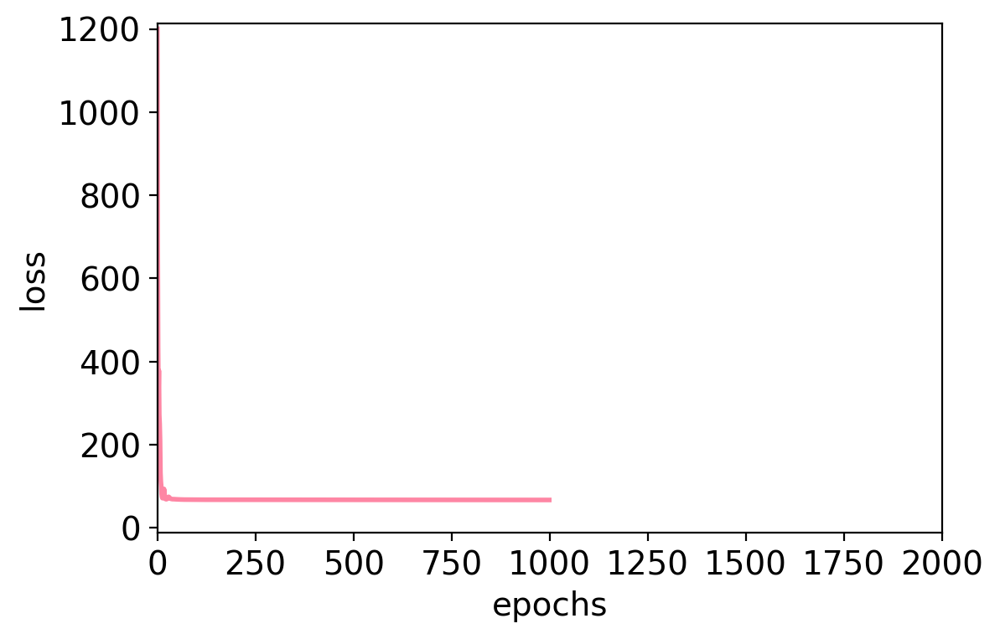

plot losses_ccc


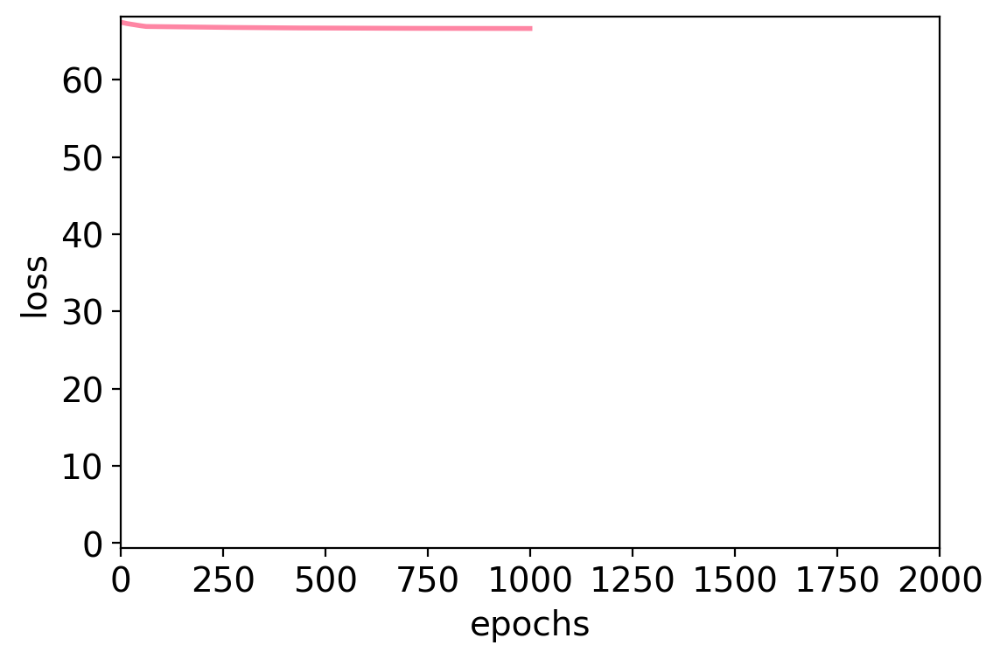

rho=0.3584672667894611
pval=0.003631106544075634
obs_g2g=[[1.   0.23 0.   0.9  0.   0.   0.24 0.55]
 [0.23 1.   1.   1.   0.46 0.32 0.49 0.44]
 [0.   1.   1.   1.   0.09 0.22 0.81 0.82]
 [0.9  1.   1.   1.   0.06 0.   0.45 0.62]
 [0.   0.46 0.09 0.06 1.   0.   0.33 0.  ]
 [0.   0.32 0.22 0.   0.   1.   0.   0.  ]
 [0.24 0.49 0.81 0.45 0.33 0.   1.   0.38]
 [0.55 0.44 0.82 0.62 0.   0.   0.38 1.  ]]
exp_g2g=[[1.   0.43 0.54 0.75 0.   0.11 0.96 0.11]
 [0.43 1.   0.25 0.32 0.68 0.75 0.64 0.14]
 [0.54 0.25 1.   0.82 0.21 0.86 0.86 0.43]
 [0.75 0.32 0.82 1.   0.93 0.04 0.21 0.25]
 [0.   0.68 0.21 0.93 1.   0.82 0.5  0.86]
 [0.11 0.75 0.86 0.04 0.82 1.   0.61 0.18]
 [0.96 0.64 0.86 0.21 0.5  0.61 1.   0.89]
 [0.11 0.14 0.43 0.25 0.86 0.18 0.89 1.  ]]
rho=0.055774188209943114
pval=0.6615744767652718
simulation 1; time passed: 13.178162813186646
spearman_corr=-0.5655044175044175
plot losses_scc


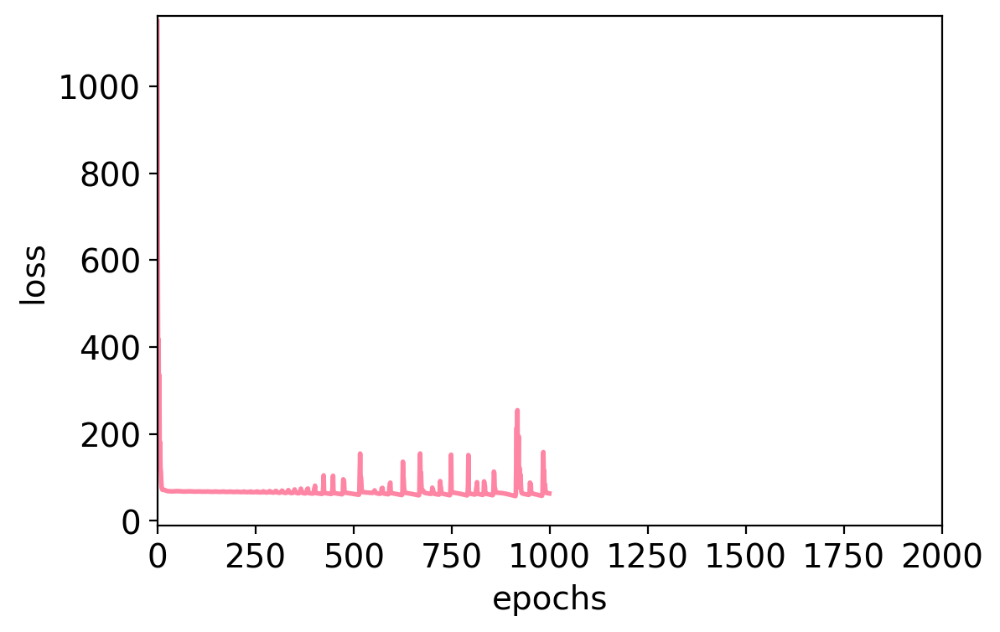

plot losses_ccc


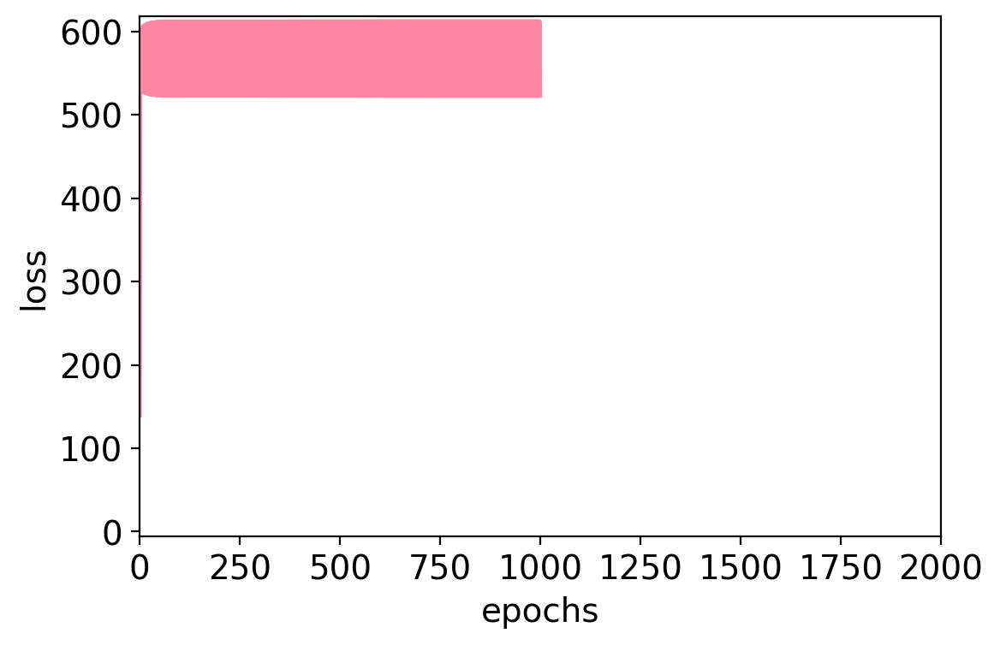

rho=0.2461399198843247
pval=0.04992714968667622
obs_g2g=[[1.   0.   0.   1.   1.   0.   0.   1.  ]
 [0.   1.   1.   0.   0.   1.   1.   0.  ]
 [0.   1.   1.   0.   0.   1.   1.   0.  ]
 [1.   0.   0.   1.   1.   0.   0.   1.  ]
 [1.   0.   0.   1.   1.   0.   0.   0.95]
 [0.   1.   1.   0.   0.   1.   1.   0.  ]
 [0.   1.   1.   0.   0.   1.   1.   0.  ]
 [1.   0.   0.   1.   0.95 0.   0.   1.  ]]
exp_g2g=[[1.   0.29 0.86 0.11 0.25 0.82 0.54 0.57]
 [0.29 1.   0.36 0.71 0.07 0.75 0.07 0.07]
 [0.86 0.36 1.   0.5  0.07 0.61 0.57 0.86]
 [0.11 0.71 0.5  1.   0.54 0.14 0.39 0.93]
 [0.25 0.07 0.07 0.54 1.   0.57 0.96 0.32]
 [0.82 0.75 0.61 0.14 0.57 1.   0.79 0.07]
 [0.54 0.07 0.57 0.39 0.96 0.79 1.   0.96]
 [0.57 0.07 0.86 0.93 0.32 0.07 0.96 1.  ]]
rho=0.22270798530970135
pval=0.0769210543955139
simulation 2; time passed: 26.364460945129395
spearman_corr=-0.9999921099920153
plot losses_scc


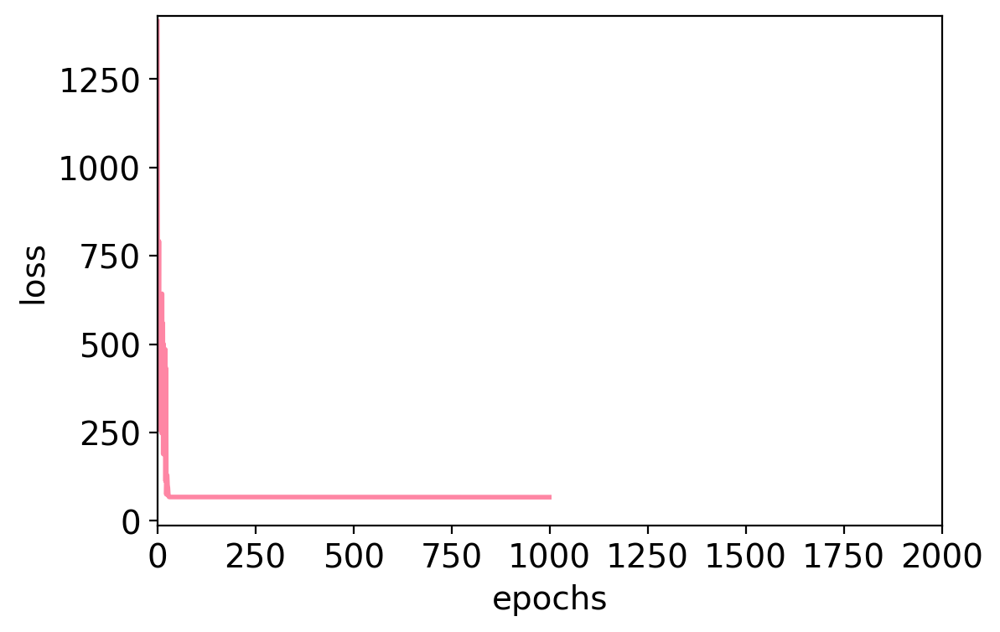

plot losses_ccc


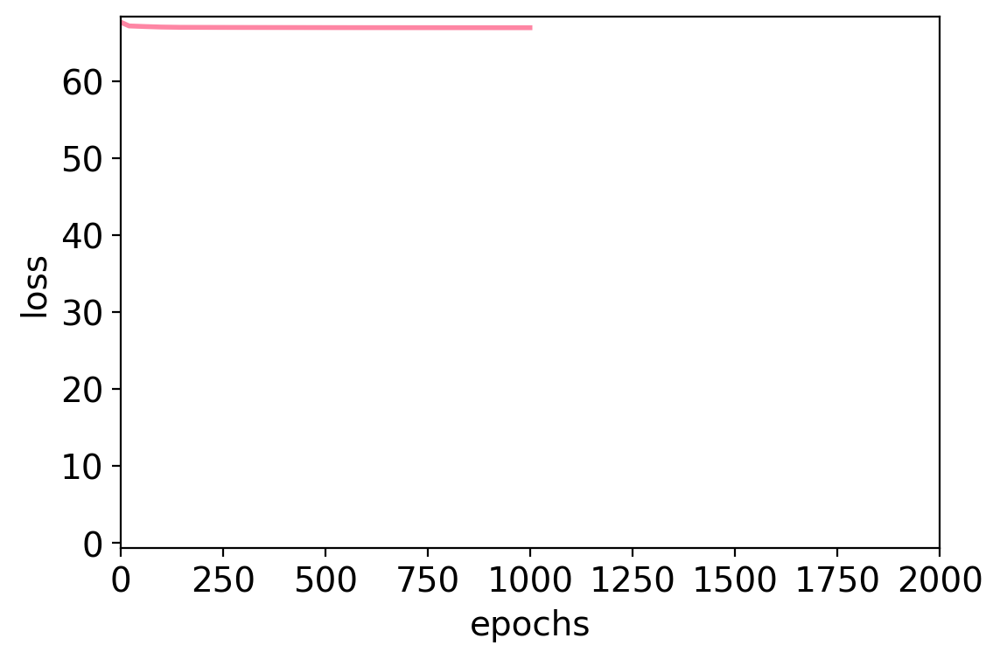

rho=0.45579809294445917
pval=0.00015381736655073667
obs_g2g=[[1.   1.   1.   1.   0.8  0.5  0.39 0.67]
 [1.   1.   1.   1.   0.66 0.81 0.83 0.37]
 [1.   1.   1.   1.   0.45 0.64 0.86 0.33]
 [1.   1.   1.   1.   0.78 0.54 0.79 0.45]
 [0.8  0.66 0.45 0.78 1.   0.56 0.35 0.31]
 [0.5  0.81 0.64 0.54 0.56 1.   0.67 0.63]
 [0.39 0.83 0.86 0.79 0.35 0.67 1.   0.2 ]
 [0.67 0.37 0.33 0.45 0.31 0.63 0.2  1.  ]]
exp_g2g=[[1.   0.93 0.32 0.57 0.14 0.36 0.82 0.43]
 [0.93 1.   0.54 0.89 0.5  0.96 0.89 0.89]
 [0.32 0.54 1.   0.39 0.21 0.36 0.86 0.04]
 [0.57 0.89 0.39 1.   0.25 0.68 0.96 0.32]
 [0.14 0.5  0.21 0.25 1.   0.54 0.04 0.5 ]
 [0.36 0.96 0.36 0.68 0.54 1.   0.82 0.75]
 [0.82 0.89 0.86 0.96 0.04 0.82 1.   0.86]
 [0.43 0.89 0.04 0.32 0.5  0.75 0.86 1.  ]]
rho=0.4038936278460448
pval=0.0009340129825118083
simulation 3; time passed: 39.50862407684326
spearman_corr=-0.9653109533109534
plot losses_scc


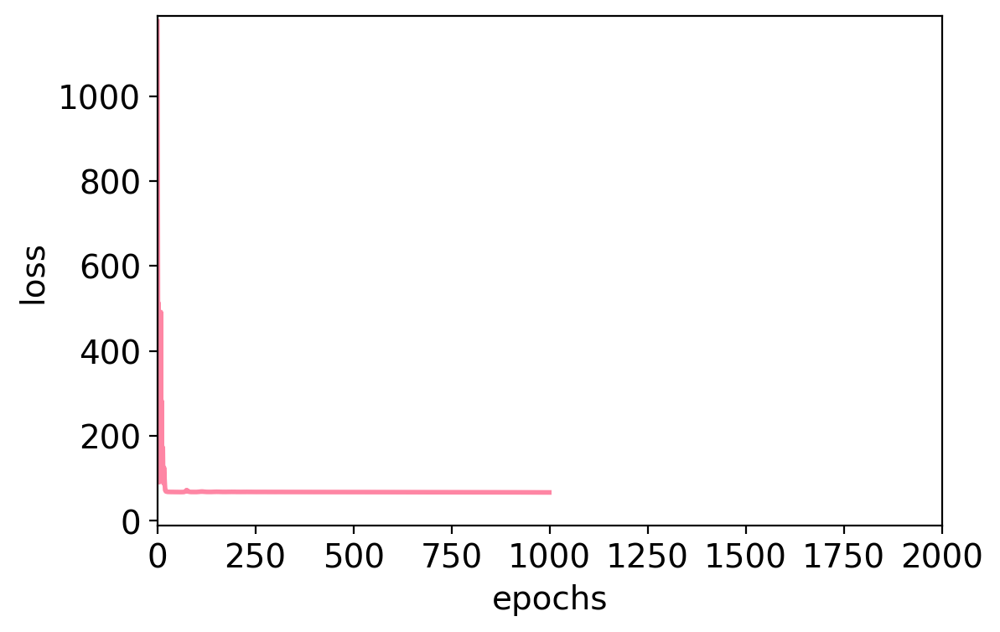

plot losses_ccc


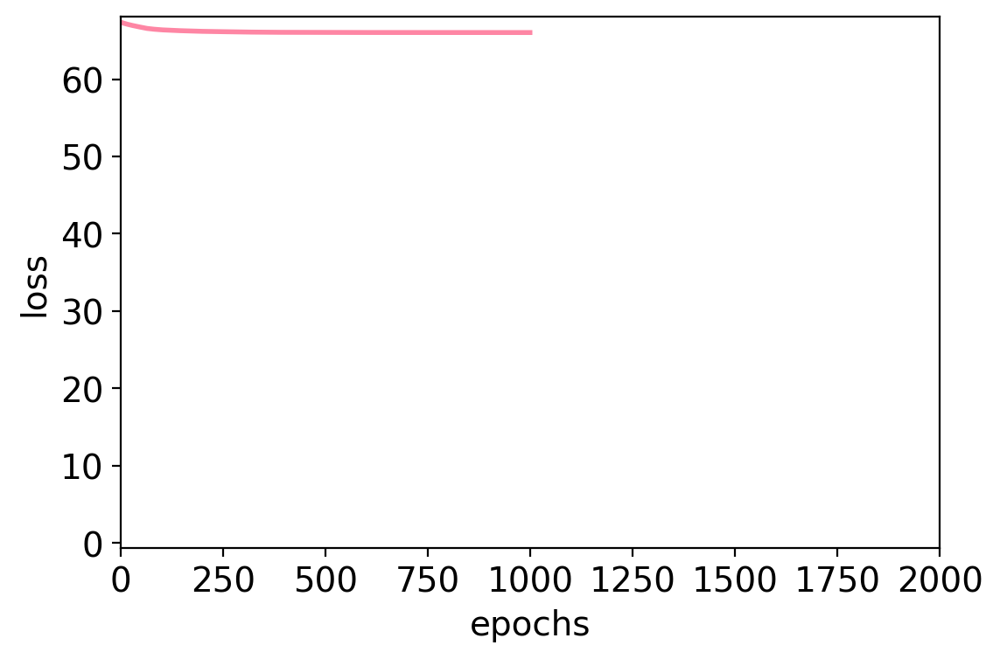

rho=0.38448892111542265
pval=0.0017079239486537448
obs_g2g=[[1.   1.   0.4  1.   1.   1.   1.   1.  ]
 [1.   1.   1.   0.92 0.85 0.87 0.93 0.45]
 [0.4  1.   1.   1.   1.   0.71 0.72 0.48]
 [1.   0.92 1.   1.   1.   1.   1.   0.58]
 [1.   0.85 1.   1.   1.   1.   1.   0.52]
 [1.   0.87 0.71 1.   1.   1.   1.   0.9 ]
 [1.   0.93 0.72 1.   1.   1.   1.   0.71]
 [1.   0.45 0.48 0.58 0.52 0.9  0.71 1.  ]]
exp_g2g=[[1.   0.61 0.04 0.75 0.36 0.36 0.32 0.75]
 [0.61 1.   0.96 0.25 0.79 0.89 0.32 0.43]
 [0.04 0.96 1.   0.79 0.64 0.11 0.68 0.11]
 [0.75 0.25 0.79 1.   0.71 0.   0.07 0.18]
 [0.36 0.79 0.64 0.71 1.   0.68 0.43 0.61]
 [0.36 0.89 0.11 0.   0.68 1.   0.32 0.32]
 [0.32 0.32 0.68 0.07 0.43 0.32 1.   0.25]
 [0.75 0.43 0.11 0.18 0.61 0.32 0.25 1.  ]]
rho=nan
pval=nan
simulation 4; time passed: 52.64781212806702


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.9999989619989559
plot losses_scc


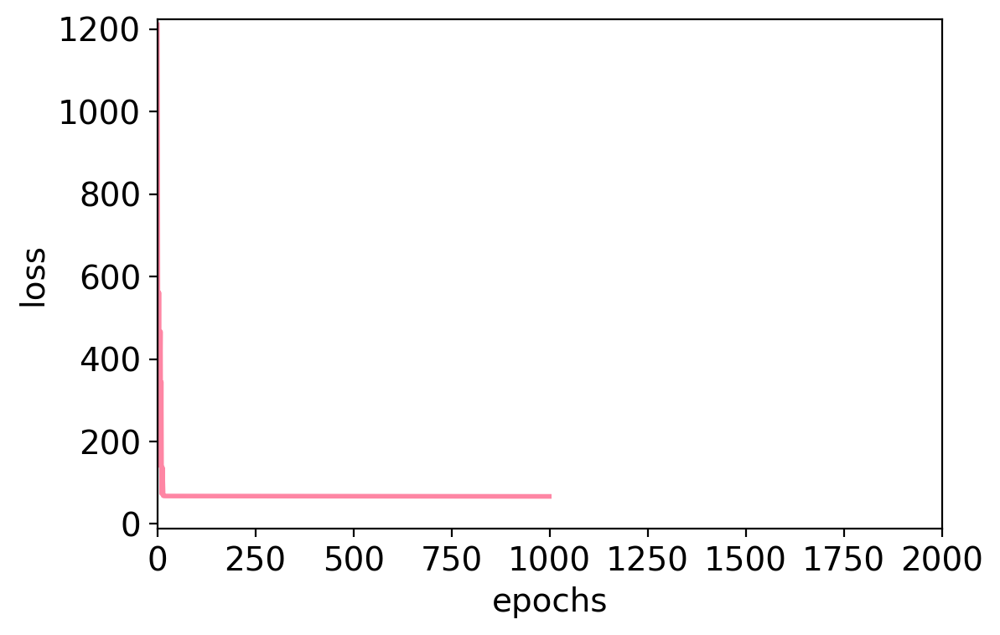

plot losses_ccc


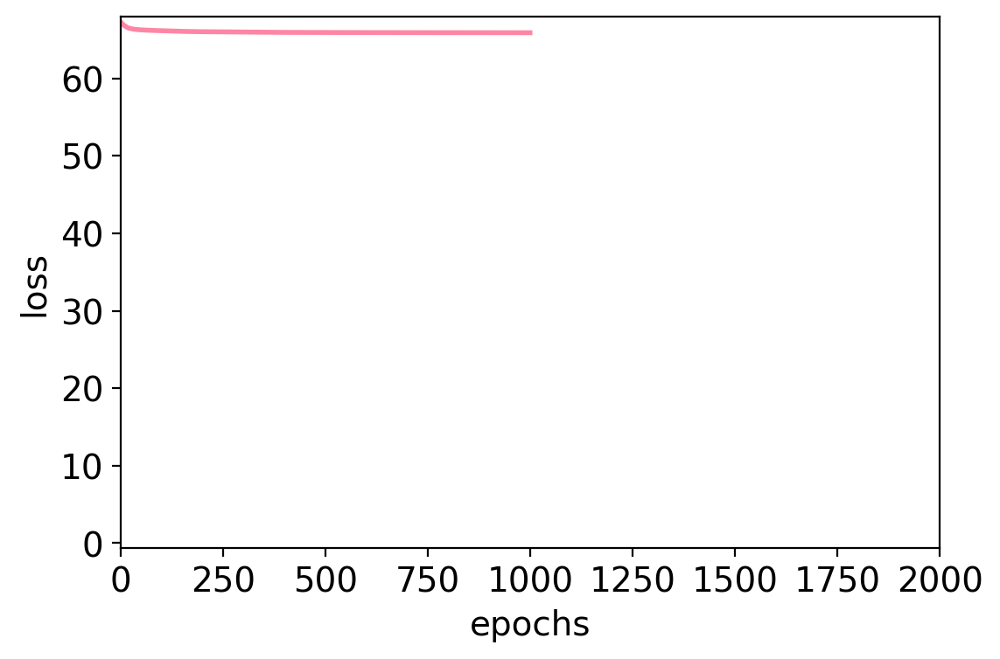

rho=0.47682990195692304
pval=6.794370515931547e-05
obs_g2g=[[1.   0.86 1.   1.   1.   1.   0.37 0.26]
 [0.86 1.   1.   0.48 0.47 0.8  0.15 0.22]
 [1.   1.   1.   1.   1.   1.   0.45 0.19]
 [1.   0.48 1.   1.   0.77 1.   0.59 0.7 ]
 [1.   0.47 1.   0.77 1.   0.6  0.54 0.48]
 [1.   0.8  1.   1.   0.6  1.   0.69 0.39]
 [0.37 0.15 0.45 0.59 0.54 0.69 1.   0.02]
 [0.26 0.22 0.19 0.7  0.48 0.39 0.02 1.  ]]
exp_g2g=[[1.   0.54 0.89 0.43 0.68 0.82 0.21 0.75]
 [0.54 1.   0.29 0.39 0.21 0.96 0.21 0.07]
 [0.89 0.29 1.   0.04 0.25 0.5  0.61 0.18]
 [0.43 0.39 0.04 1.   0.64 0.82 0.75 0.5 ]
 [0.68 0.21 0.25 0.64 1.   0.14 0.11 0.61]
 [0.82 0.96 0.5  0.82 0.14 1.   0.64 0.5 ]
 [0.21 0.21 0.61 0.75 0.11 0.64 1.   0.43]
 [0.75 0.07 0.18 0.5  0.61 0.5  0.43 1.  ]]
rho=0.28060620486107307
pval=0.024708020337117668
simulation 5; time passed: 65.83995938301086
spearman_corr=-0.9282798162798163
plot losses_scc


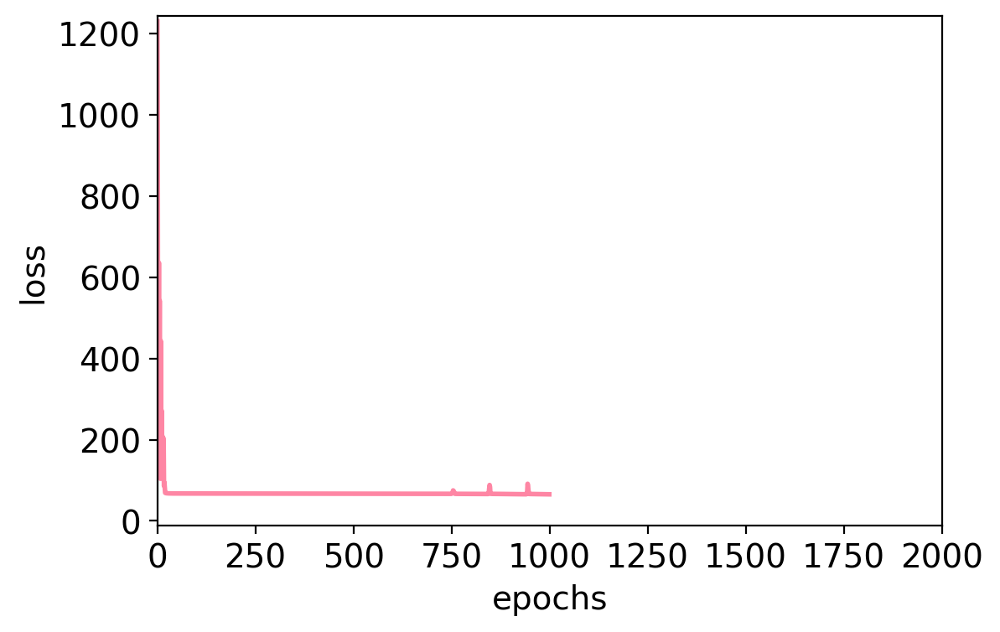

plot losses_ccc


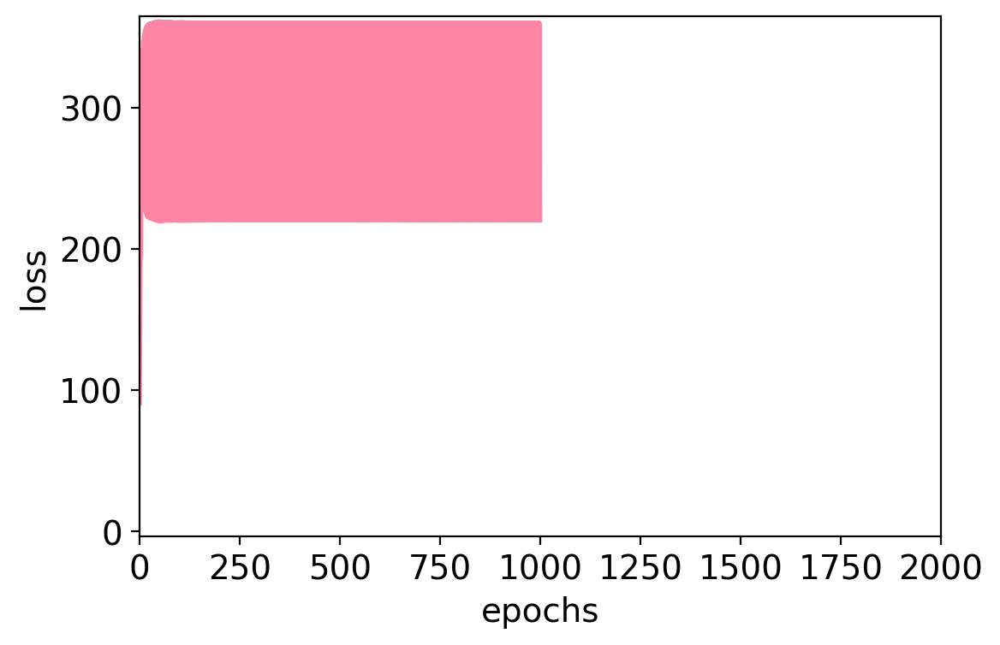

rho=0.1615893189432946
pval=0.20208336848952282
obs_g2g=[[1.   0.   1.   0.91 1.   0.   0.76 0.  ]
 [0.   1.   0.   0.   0.   1.   0.   1.  ]
 [1.   0.   1.   0.59 1.   0.   0.68 0.  ]
 [0.91 0.   0.59 1.   1.   0.   0.92 0.  ]
 [1.   0.   1.   1.   1.   0.   1.   0.  ]
 [0.   1.   0.   0.   0.   1.   0.   1.  ]
 [0.76 0.   0.68 0.92 1.   0.   1.   0.  ]
 [0.   1.   0.   0.   0.   1.   0.   1.  ]]
exp_g2g=[[1.   0.93 0.82 0.04 0.61 0.5  0.29 0.25]
 [0.93 1.   0.46 0.46 0.61 0.61 0.75 0.32]
 [0.82 0.46 1.   0.07 0.36 0.64 0.68 0.46]
 [0.04 0.46 0.07 1.   0.21 0.29 0.82 0.54]
 [0.61 0.61 0.36 0.21 1.   0.86 0.36 0.5 ]
 [0.5  0.61 0.64 0.29 0.86 1.   0.46 0.46]
 [0.29 0.75 0.68 0.82 0.36 0.46 1.   0.07]
 [0.25 0.32 0.46 0.54 0.5  0.46 0.07 1.  ]]
rho=0.13452135093936093
pval=0.28924176076325586
simulation 6; time passed: 79.03296732902527
spearman_corr=-0.5528683328683329
plot losses_scc


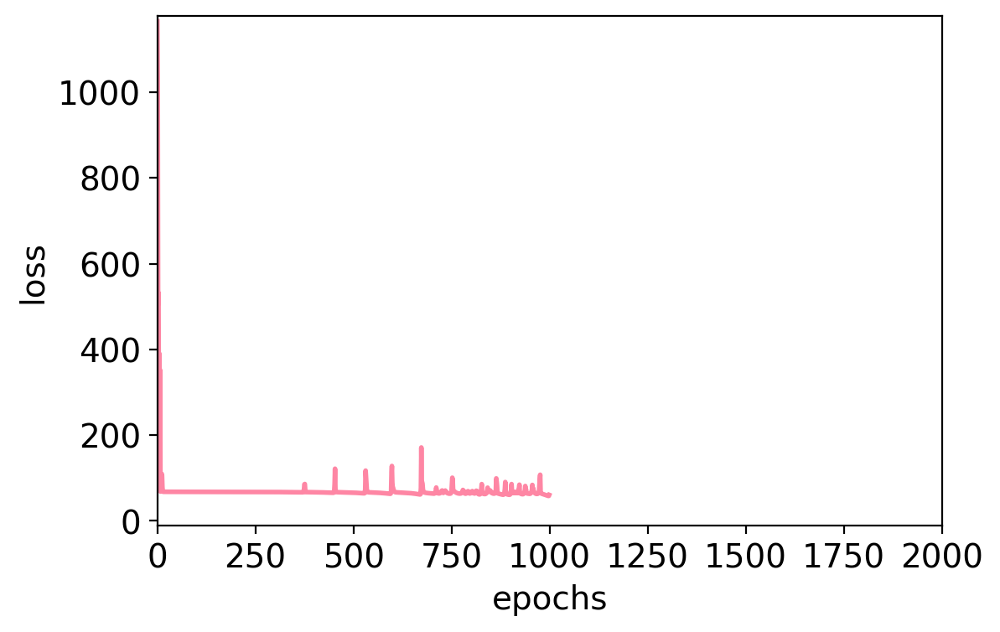

plot losses_ccc


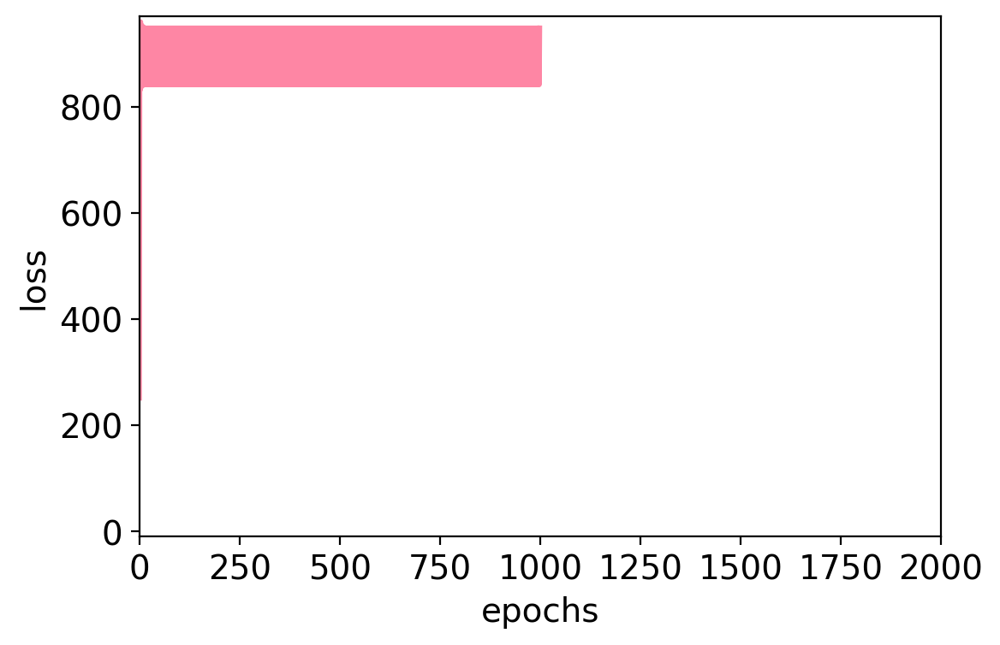

rho=0.1595283948260007
pval=0.20797413722791144
obs_g2g=[[1. 0. 1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1. 0. 1.]
 [1. 0. 1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1. 0. 1.]
 [1. 0. 1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1. 0. 1.]
 [1. 0. 1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1. 0. 1.]]
exp_g2g=[[1.   0.14 0.39 0.39 0.96 0.93 0.68 0.54]
 [0.14 1.   0.36 0.71 0.93 0.04 0.18 0.18]
 [0.39 0.36 1.   0.68 0.14 0.54 0.18 0.75]
 [0.39 0.71 0.68 1.   0.43 0.21 0.21 0.39]
 [0.96 0.93 0.14 0.43 1.   0.18 0.   0.11]
 [0.93 0.04 0.54 0.21 0.18 1.   0.07 0.71]
 [0.68 0.18 0.18 0.21 0.   0.07 1.   0.36]
 [0.54 0.18 0.75 0.39 0.11 0.71 0.36 1.  ]]
rho=0.1595283948260007
pval=0.20797413722791144
simulation 7; time passed: 92.23119711875916
spearman_corr=-0.9997591837591839
plot losses_scc


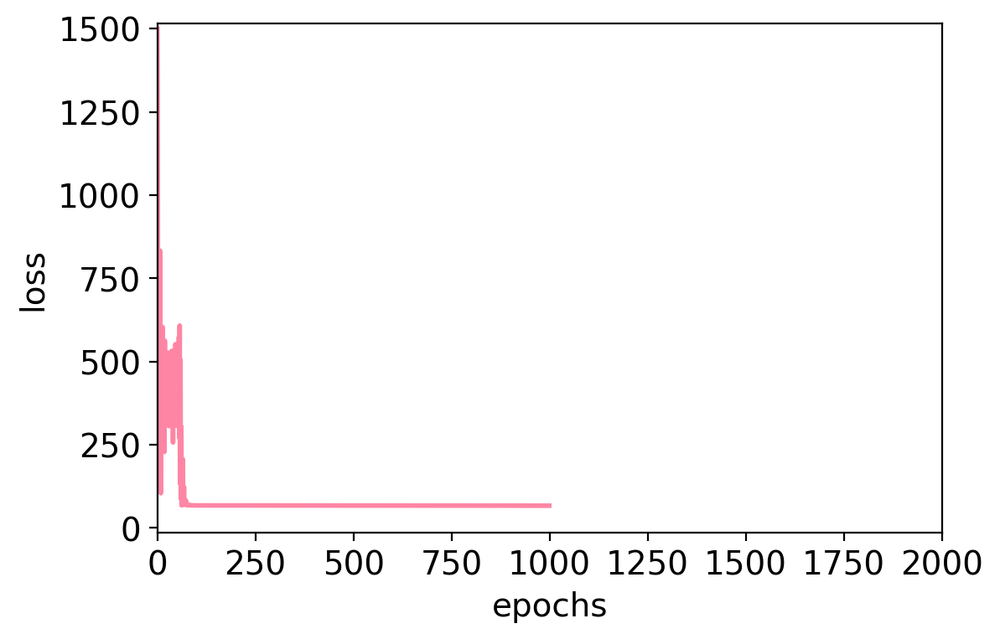

plot losses_ccc


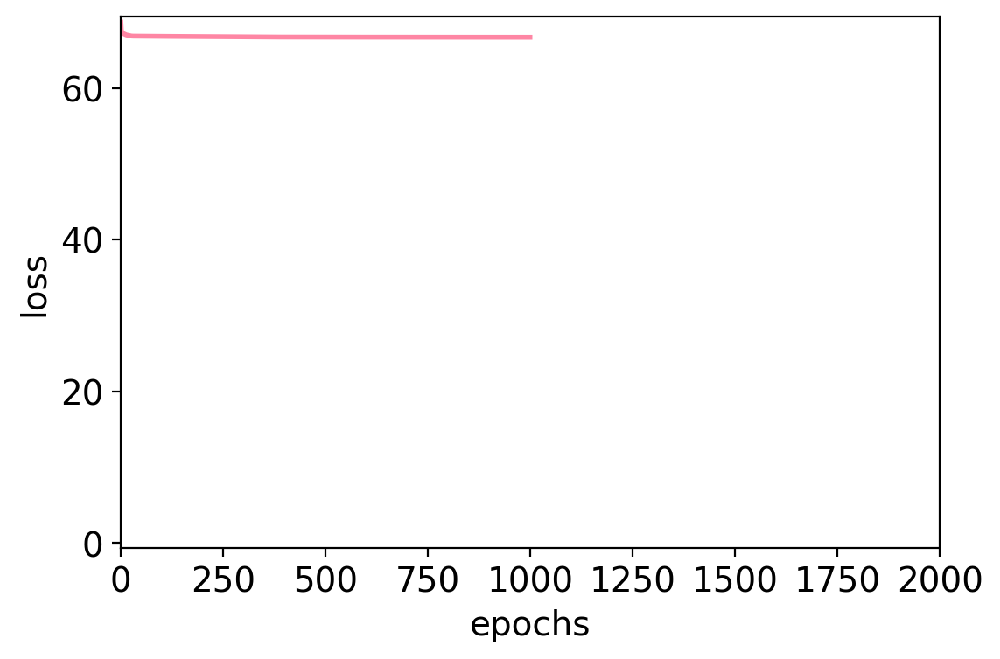

rho=0.3540901986429394
pval=0.004097926530666667
obs_g2g=[[1.   0.25 1.   1.   0.43 0.16 0.52 0.28]
 [0.25 1.   0.66 0.97 0.96 0.78 0.28 0.53]
 [1.   0.66 1.   0.82 0.38 0.24 0.94 0.35]
 [1.   0.97 0.82 1.   0.44 0.79 0.89 0.57]
 [0.43 0.96 0.38 0.44 1.   0.75 0.6  0.67]
 [0.16 0.78 0.24 0.79 0.75 1.   0.66 0.37]
 [0.52 0.28 0.94 0.89 0.6  0.66 1.   0.61]
 [0.28 0.53 0.35 0.57 0.67 0.37 0.61 1.  ]]
exp_g2g=[[1.   0.82 0.96 0.25 0.61 0.75 0.64 0.11]
 [0.82 1.   0.93 0.29 0.93 0.79 0.57 0.64]
 [0.96 0.93 1.   0.79 0.29 0.86 0.32 0.14]
 [0.25 0.29 0.79 1.   0.89 0.61 0.75 0.71]
 [0.61 0.93 0.29 0.89 1.   0.11 0.07 0.68]
 [0.75 0.79 0.86 0.61 0.11 1.   0.57 0.54]
 [0.64 0.57 0.32 0.75 0.07 0.57 1.   0.61]
 [0.11 0.64 0.14 0.71 0.68 0.54 0.61 1.  ]]
rho=0.6255557529109615
pval=3.2642987431993714e-08
simulation 8; time passed: 105.20204854011536
spearman_corr=-0.9999908319907221
plot losses_scc


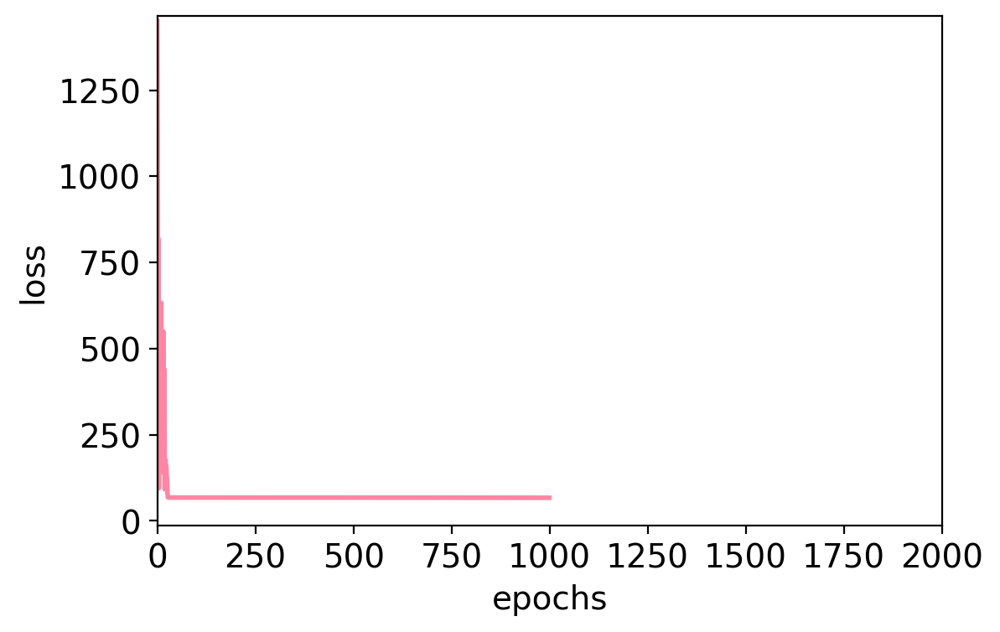

plot losses_ccc


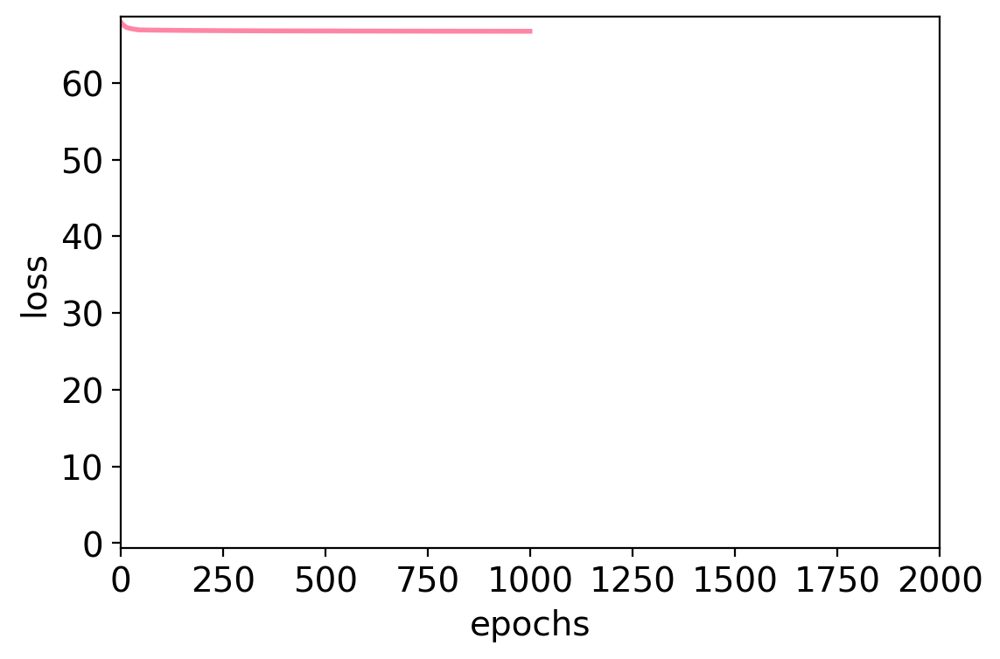

rho=0.44493513081359454
pval=0.00022986181000381664
obs_g2g=[[1.   1.   1.   0.86 0.65 1.   0.37 0.29]
 [1.   1.   1.   0.   0.36 1.   0.64 0.89]
 [1.   1.   1.   0.52 0.37 0.51 0.63 0.49]
 [0.86 0.   0.52 1.   0.85 0.66 0.57 0.83]
 [0.65 0.36 0.37 0.85 1.   0.02 0.37 0.  ]
 [1.   1.   0.51 0.66 0.02 1.   0.47 0.75]
 [0.37 0.64 0.63 0.57 0.37 0.47 1.   0.6 ]
 [0.29 0.89 0.49 0.83 0.   0.75 0.6  1.  ]]
exp_g2g=[[1.   0.54 0.93 0.68 0.89 0.54 0.43 0.93]
 [0.54 1.   0.64 0.07 0.04 0.57 0.79 0.61]
 [0.93 0.64 1.   0.39 0.75 0.21 0.79 0.75]
 [0.68 0.07 0.39 1.   0.57 0.46 0.43 0.96]
 [0.89 0.04 0.75 0.57 1.   0.04 0.29 0.79]
 [0.54 0.57 0.21 0.46 0.04 1.   0.68 0.07]
 [0.43 0.79 0.79 0.43 0.29 0.68 1.   0.64]
 [0.93 0.61 0.75 0.96 0.79 0.07 0.64 1.  ]]
rho=0.34260266480317997
pval=0.0055848939992957855
simulation 9; time passed: 118.36203455924988
spearman_corr=-0.2701923874346961
plot losses_scc


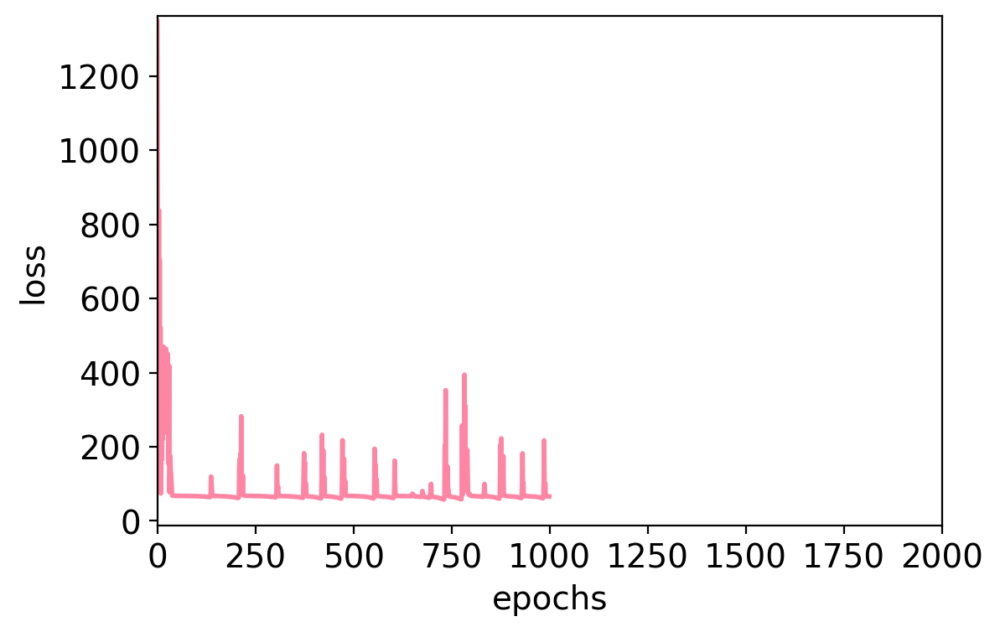

plot losses_ccc


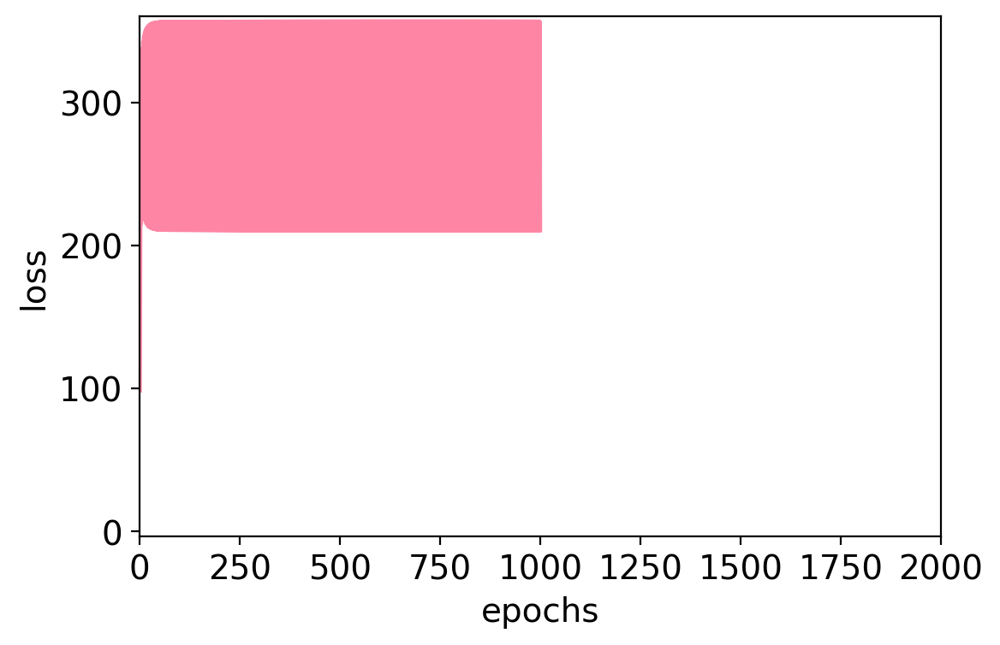

rho=0.2002658654752174
pval=0.11258728517970666
obs_g2g=[[1.   0.   1.   0.   0.   1.   0.   0.  ]
 [0.   1.   0.   1.   1.   0.   1.   1.  ]
 [1.   0.   1.   0.   0.   1.   0.   0.  ]
 [0.   1.   0.   1.   1.   0.   1.   1.  ]
 [0.   1.   0.   1.   1.   0.   1.   1.  ]
 [1.   0.   1.   0.   0.   1.   0.31 0.36]
 [0.   1.   0.   1.   1.   0.31 1.   0.59]
 [0.   1.   0.   1.   1.   0.36 0.59 1.  ]]
exp_g2g=[[1.   0.79 0.61 0.86 0.43 0.32 0.21 0.57]
 [0.79 1.   0.68 0.82 0.79 0.96 0.   0.46]
 [0.61 0.68 1.   0.29 0.86 0.86 0.39 0.64]
 [0.86 0.82 0.29 1.   0.04 0.11 0.25 0.61]
 [0.43 0.79 0.86 0.04 1.   0.32 0.68 0.89]
 [0.32 0.96 0.86 0.11 0.32 1.   0.5  0.86]
 [0.21 0.   0.39 0.25 0.68 0.5  1.   0.86]
 [0.57 0.46 0.64 0.61 0.89 0.86 0.86 1.  ]]
rho=0.258412251899181
pval=0.03923497558460322
simulation 10; time passed: 131.8413918018341
spearman_corr=-0.5780956220956222
plot losses_scc


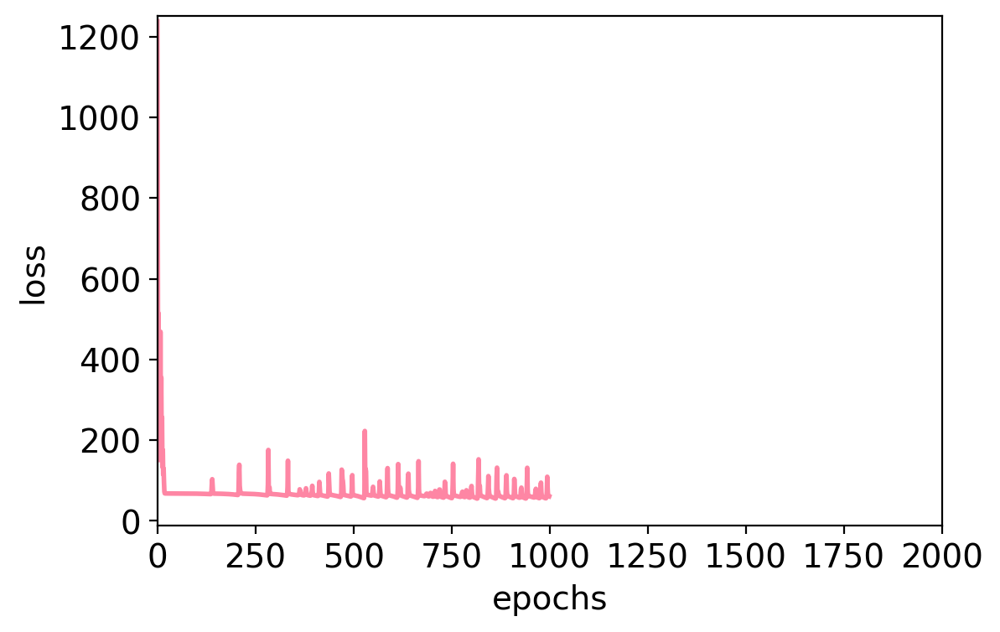

plot losses_ccc


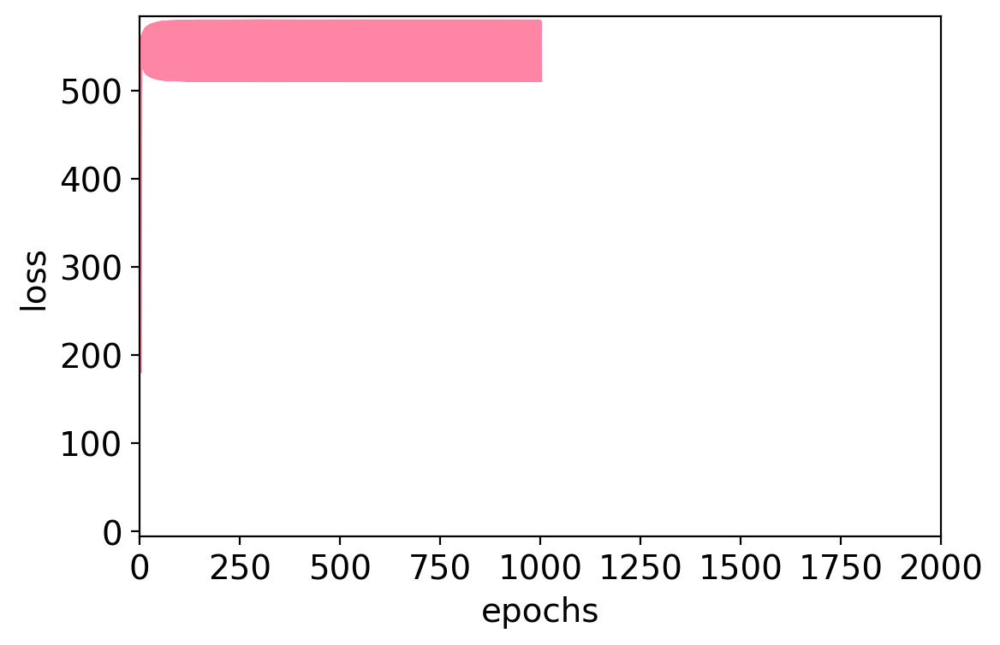

rho=0.19553606398838075
pval=0.12151477674852315
obs_g2g=[[1.   0.   1.   1.   0.83 0.   0.   0.43]
 [0.   1.   0.   0.   1.   0.   1.   0.  ]
 [1.   0.   1.   1.   0.   1.   0.   1.  ]
 [1.   0.   1.   1.   0.   0.29 0.   1.  ]
 [0.83 1.   0.   0.   1.   1.   1.   1.  ]
 [0.   0.   1.   0.29 1.   1.   1.   0.  ]
 [0.   1.   0.   0.   1.   1.   1.   0.  ]
 [0.43 0.   1.   1.   1.   0.   0.   1.  ]]
exp_g2g=[[1.   0.68 0.82 0.25 0.   0.96 0.04 0.  ]
 [0.68 1.   0.89 0.46 0.29 0.32 0.96 0.14]
 [0.82 0.89 1.   0.46 0.54 0.36 0.93 0.32]
 [0.25 0.46 0.46 1.   0.14 0.71 0.64 0.32]
 [0.   0.29 0.54 0.14 1.   0.86 0.64 0.71]
 [0.96 0.32 0.36 0.71 0.86 1.   0.46 0.64]
 [0.04 0.96 0.93 0.64 0.64 0.46 1.   0.75]
 [0.   0.14 0.32 0.32 0.71 0.64 0.75 1.  ]]
rho=0.12410304026209172
pval=0.3285492072861361
simulation 11; time passed: 145.10666251182556
spearman_corr=-0.8297004617004619
plot losses_scc


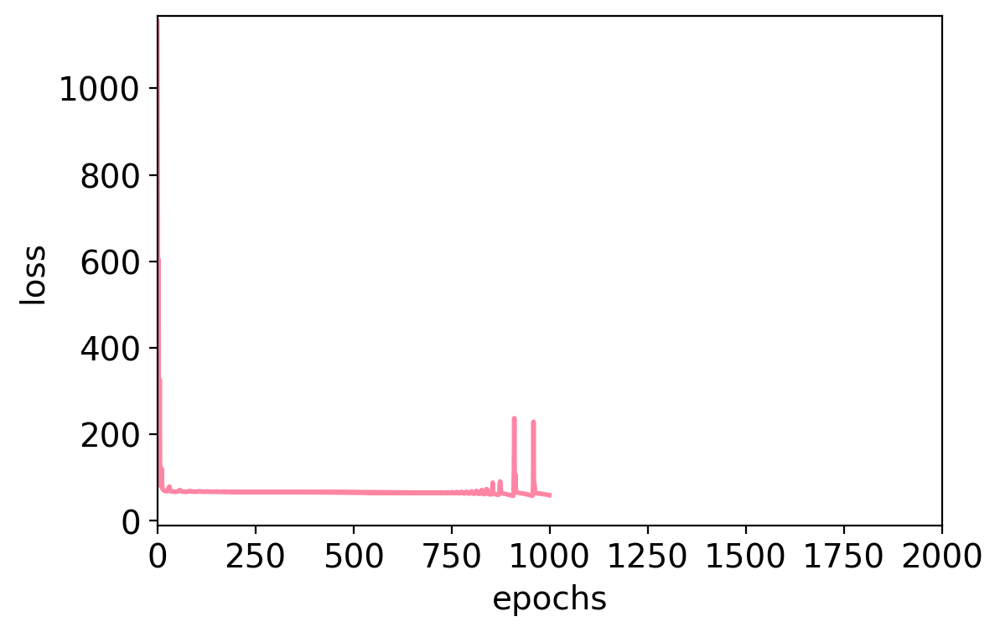

plot losses_ccc


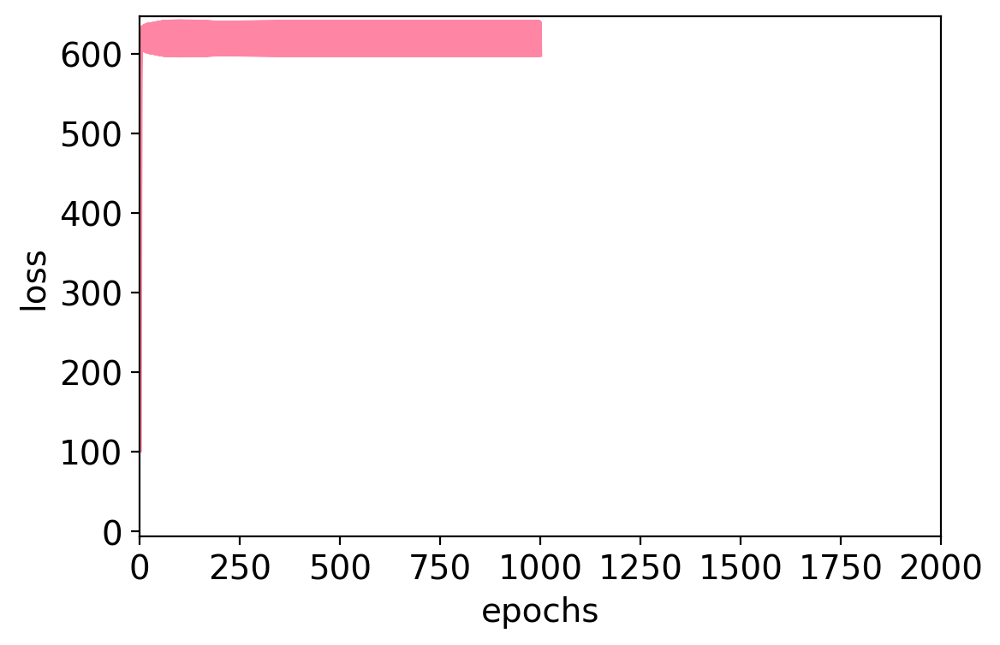

rho=0.1576690043819802
pval=0.21339219672119836
obs_g2g=[[1.   0.   0.   0.   0.   1.   0.   0.  ]
 [0.   1.   0.08 1.   0.   1.   0.   1.  ]
 [0.   0.08 1.   1.   0.62 1.   0.   1.  ]
 [0.   1.   1.   1.   1.   0.   1.   1.  ]
 [0.   0.   0.62 1.   1.   0.23 0.07 1.  ]
 [1.   1.   1.   0.   0.23 1.   1.   0.  ]
 [0.   0.   0.   1.   0.07 1.   1.   1.  ]
 [0.   1.   1.   1.   1.   0.   1.   1.  ]]
exp_g2g=[[1.   0.21 0.46 0.54 0.57 0.68 0.29 0.5 ]
 [0.21 1.   0.71 0.14 0.25 0.93 0.54 0.39]
 [0.46 0.71 1.   0.54 0.11 0.   0.93 0.82]
 [0.54 0.14 0.54 1.   0.57 0.93 0.57 0.14]
 [0.57 0.25 0.11 0.57 1.   0.25 0.36 0.39]
 [0.68 0.93 0.   0.93 0.25 1.   0.29 0.25]
 [0.29 0.54 0.93 0.57 0.36 0.29 1.   0.29]
 [0.5  0.39 0.82 0.14 0.39 0.25 0.29 1.  ]]
rho=0.13905146243949357
pval=0.27315715705103205
simulation 12; time passed: 158.0949206352234
spearman_corr=-0.9689970808110634
plot losses_scc


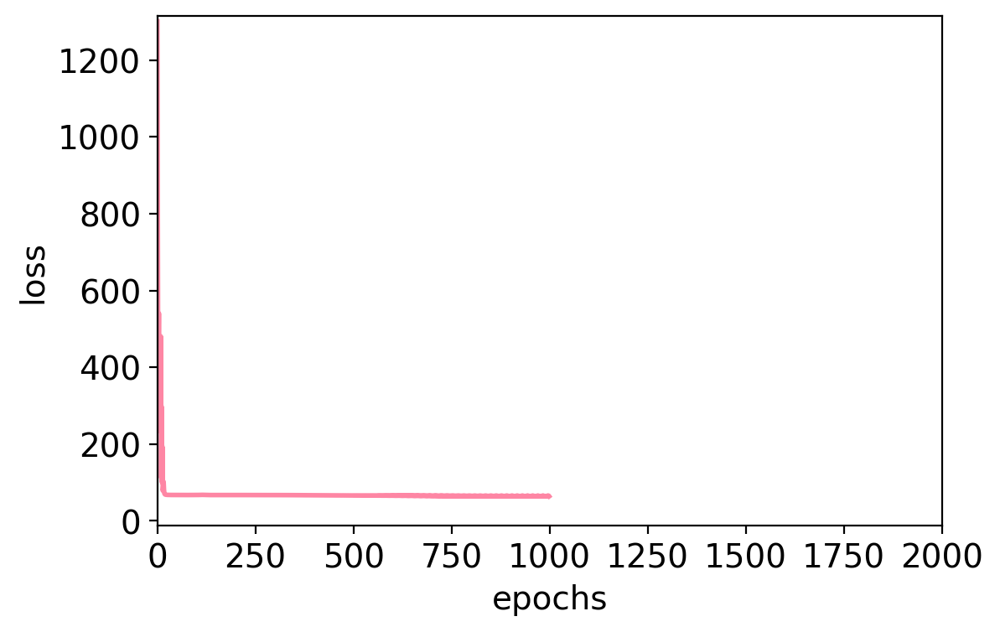

plot losses_ccc


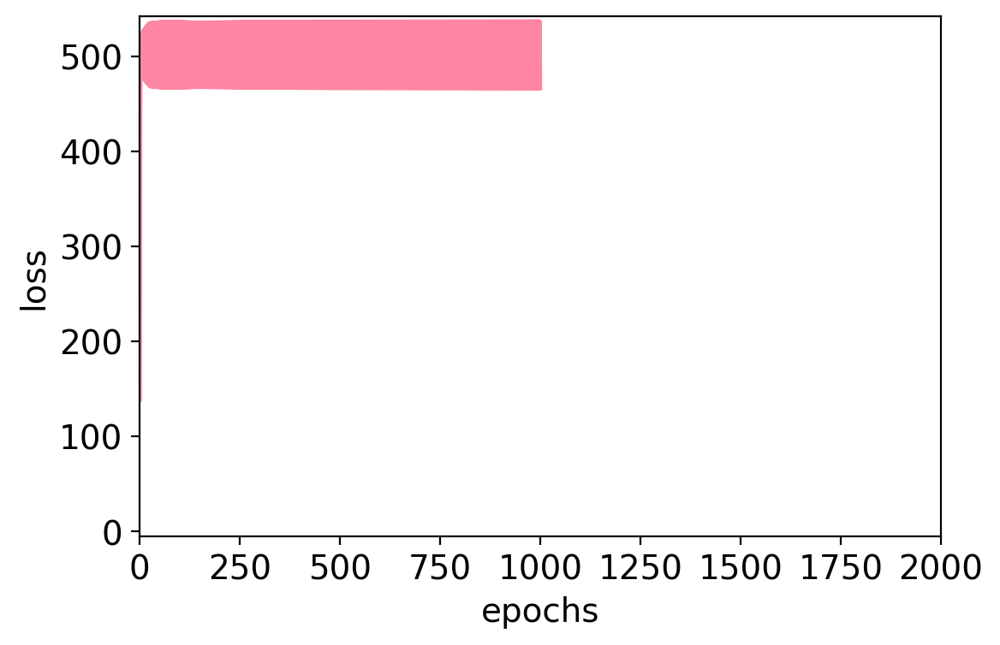

rho=0.17371375130090105
pval=0.16981994257622843
obs_g2g=[[1.   1.   1.   1.   0.   0.   0.   0.  ]
 [1.   1.   0.   1.   0.   0.   0.   0.26]
 [1.   0.   1.   0.   1.   0.   1.   1.  ]
 [1.   1.   0.   1.   0.   0.   0.   0.44]
 [0.   0.   1.   0.   1.   1.   1.   0.  ]
 [0.   0.   0.   0.   1.   1.   1.   1.  ]
 [0.   0.   1.   0.   1.   1.   1.   0.27]
 [0.   0.26 1.   0.44 0.   1.   0.27 1.  ]]
exp_g2g=[[1.   0.68 0.89 0.25 0.   0.64 0.75 0.46]
 [0.68 1.   0.29 0.04 0.93 0.75 0.68 0.79]
 [0.89 0.29 1.   0.64 0.18 0.75 0.96 0.25]
 [0.25 0.04 0.64 1.   0.75 0.14 0.5  0.79]
 [0.   0.93 0.18 0.75 1.   0.14 0.18 0.25]
 [0.64 0.75 0.75 0.14 0.14 1.   0.71 0.79]
 [0.75 0.68 0.96 0.5  0.18 0.71 1.   0.46]
 [0.46 0.79 0.25 0.79 0.25 0.79 0.46 1.  ]]
rho=0.18339988996009904
pval=0.14688631293123597
simulation 13; time passed: 171.16865253448486
spearman_corr=-0.9284537560195362
plot losses_scc


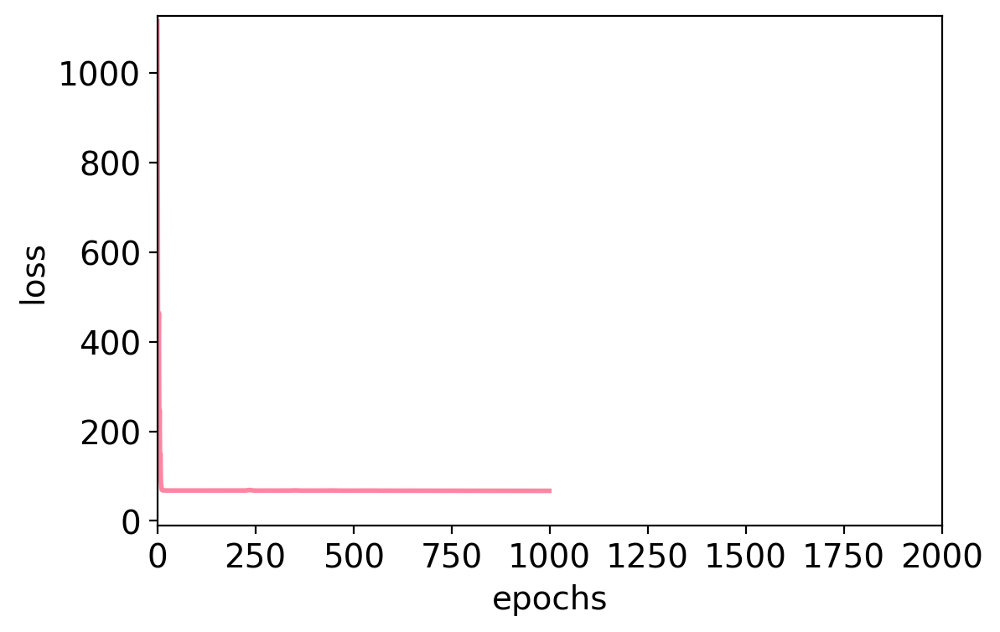

plot losses_ccc


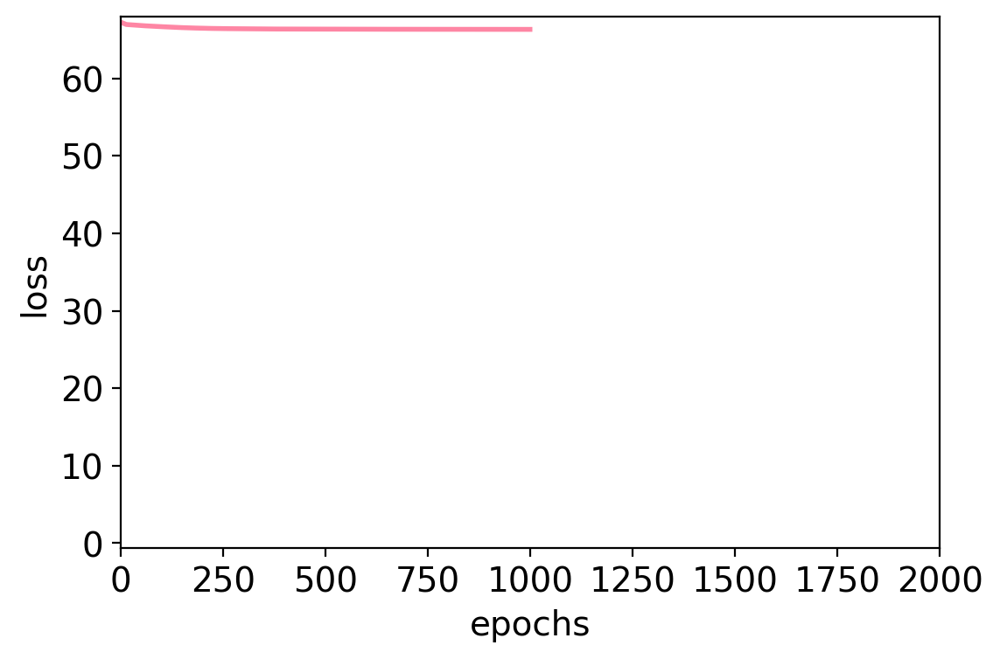

rho=0.5857872524704253
pval=3.677991190642335e-07
obs_g2g=[[1.   1.   0.   0.01 0.12 0.47 0.31 0.52]
 [1.   1.   0.   1.   0.76 0.82 0.82 0.71]
 [0.   0.   1.   0.   0.   0.19 0.06 0.  ]
 [0.01 1.   0.   1.   0.34 0.39 0.   0.27]
 [0.12 0.76 0.   0.34 1.   0.   0.39 0.  ]
 [0.47 0.82 0.19 0.39 0.   1.   0.33 0.14]
 [0.31 0.82 0.06 0.   0.39 0.33 1.   0.08]
 [0.52 0.71 0.   0.27 0.   0.14 0.08 1.  ]]
exp_g2g=[[1.   0.93 0.04 0.04 0.07 0.68 0.54 0.79]
 [0.93 1.   0.   0.57 0.36 0.11 0.36 0.61]
 [0.04 0.   1.   0.11 0.25 0.61 0.75 0.89]
 [0.04 0.57 0.11 1.   0.07 0.39 0.   0.39]
 [0.07 0.36 0.25 0.07 1.   0.57 0.71 0.21]
 [0.68 0.11 0.61 0.39 0.57 1.   0.89 0.86]
 [0.54 0.36 0.75 0.   0.71 0.89 1.   0.14]
 [0.79 0.61 0.89 0.39 0.21 0.86 0.14 1.  ]]
rho=nan
pval=nan
simulation 14; time passed: 184.25465774536133


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.3113659673659674
plot losses_scc


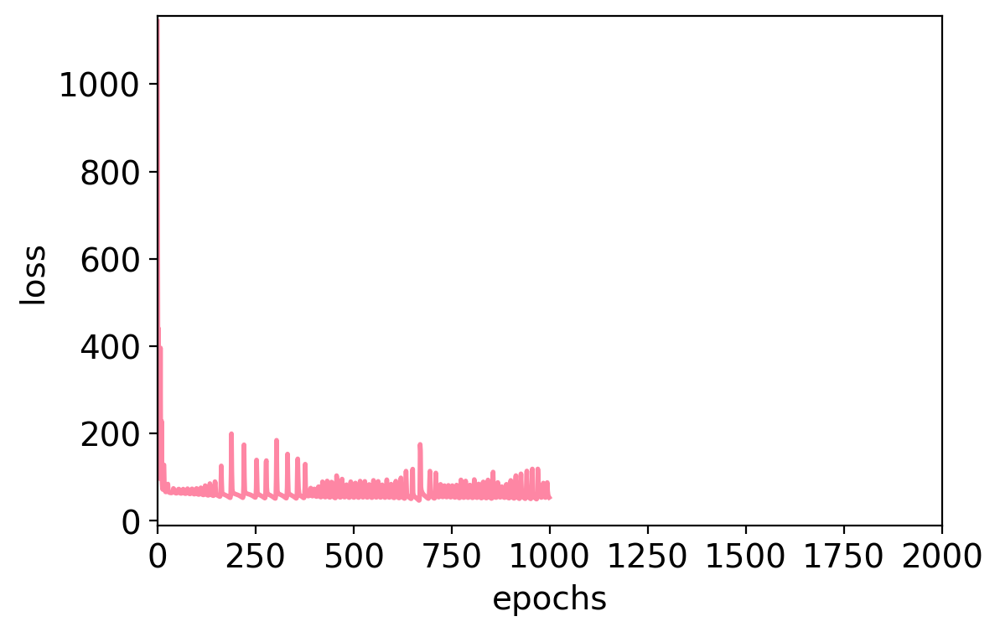

plot losses_ccc


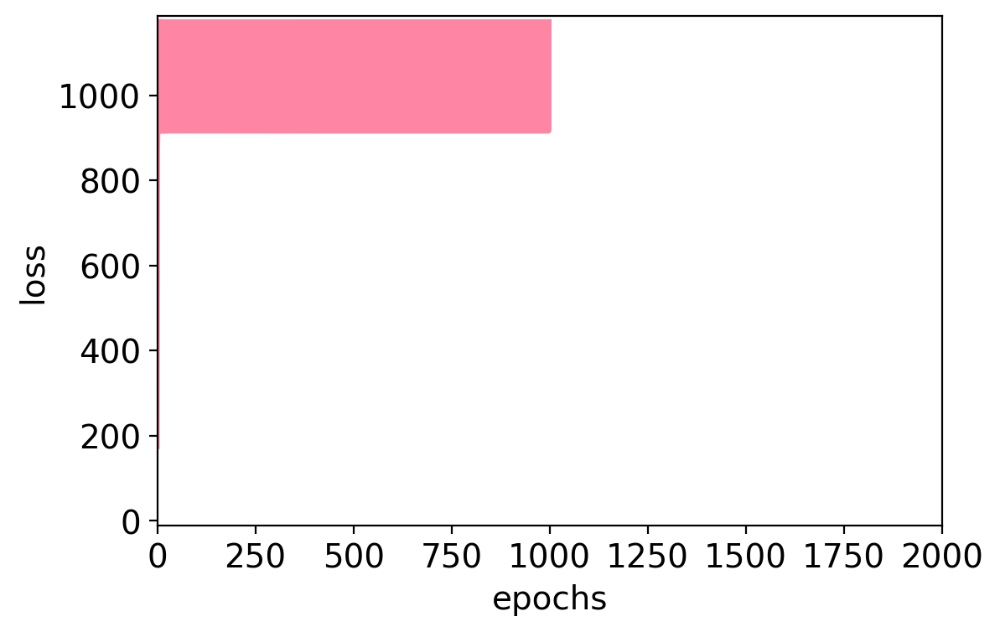

rho=0.14984632331899658
pval=0.23727296807697695
obs_g2g=[[1.   1.   0.   1.   0.   0.   1.   0.  ]
 [1.   1.   0.   1.   0.   0.   1.   0.  ]
 [0.   0.   1.   0.   1.   1.   0.   1.  ]
 [1.   1.   0.   1.   0.   0.   1.   0.  ]
 [0.   0.   1.   0.   1.   1.   0.   1.  ]
 [0.   0.   1.   0.   1.   1.   1.   0.  ]
 [1.   1.   0.   1.   0.   1.   1.   0.18]
 [0.   0.   1.   0.   1.   0.   0.18 1.  ]]
exp_g2g=[[1.   0.39 0.75 0.04 0.25 0.5  0.39 0.5 ]
 [0.39 1.   0.29 0.18 0.93 0.29 0.54 0.04]
 [0.75 0.29 1.   0.29 0.68 0.86 0.89 0.86]
 [0.04 0.18 0.29 1.   0.71 0.46 0.61 0.71]
 [0.25 0.93 0.68 0.71 1.   0.14 0.04 0.25]
 [0.5  0.29 0.86 0.46 0.14 1.   0.5  0.68]
 [0.39 0.54 0.89 0.61 0.04 0.5  1.   0.04]
 [0.5  0.04 0.86 0.71 0.25 0.68 0.04 1.  ]]
rho=0.10372243675874414
pval=0.41471265989461925
simulation 15; time passed: 197.52767324447632
spearman_corr=-0.9996681516681518
plot losses_scc


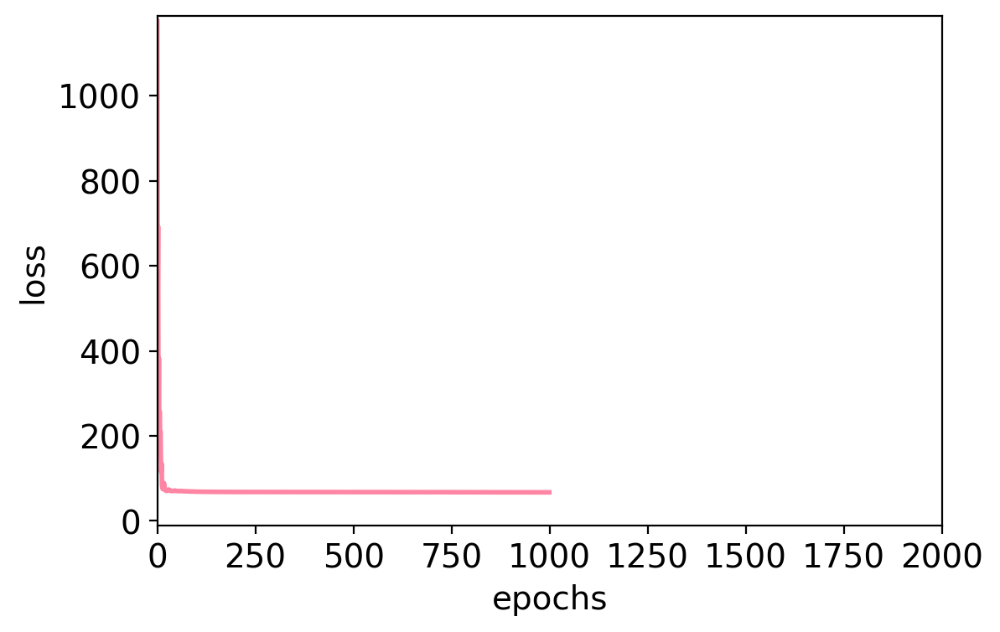

plot losses_ccc


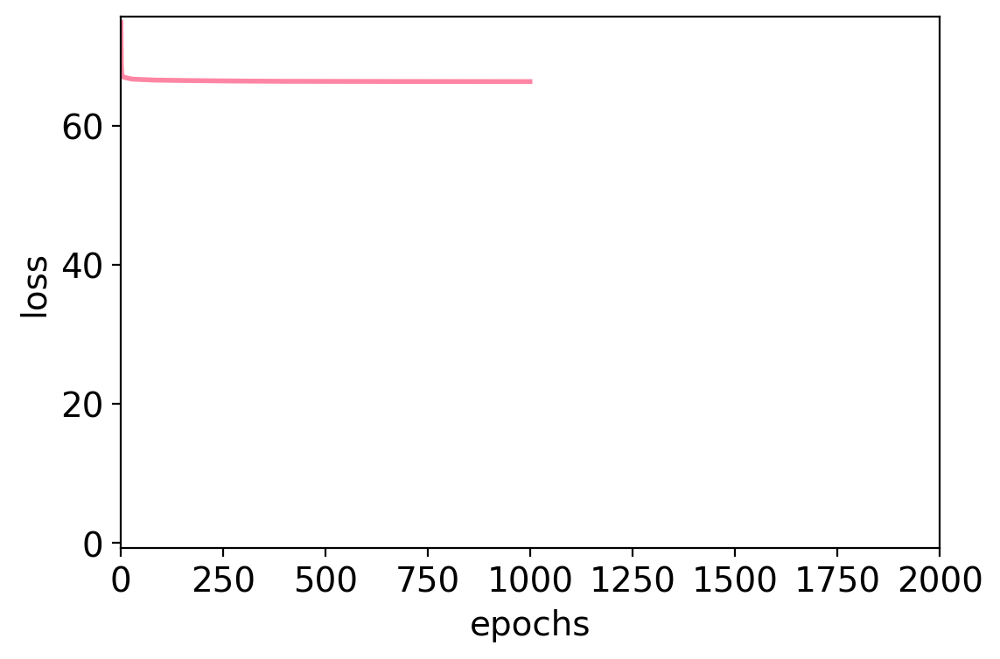

rho=0.4395174196041286
pval=0.000279459685686531
obs_g2g=[[1.   1.   1.   0.   0.41 0.63 0.   0.19]
 [1.   1.   0.62 1.   0.37 0.42 0.08 1.  ]
 [1.   0.62 1.   0.83 0.   0.22 0.   0.9 ]
 [0.   1.   0.83 1.   1.   0.82 1.   0.41]
 [0.41 0.37 0.   1.   1.   0.   0.   0.77]
 [0.63 0.42 0.22 0.82 0.   1.   0.   0.42]
 [0.   0.08 0.   1.   0.   0.   1.   0.94]
 [0.19 1.   0.9  0.41 0.77 0.42 0.94 1.  ]]
exp_g2g=[[1.   0.68 0.39 0.04 0.5  0.07 0.32 0.54]
 [0.68 1.   0.68 0.57 0.86 0.36 0.61 0.96]
 [0.39 0.68 1.   0.25 0.82 0.61 0.25 0.5 ]
 [0.04 0.57 0.25 1.   0.54 0.64 0.64 0.18]
 [0.5  0.86 0.82 0.54 1.   0.04 0.57 0.68]
 [0.07 0.36 0.61 0.64 0.04 1.   0.71 0.68]
 [0.32 0.61 0.25 0.64 0.57 0.71 1.   0.68]
 [0.54 0.96 0.5  0.18 0.68 0.68 0.68 1.  ]]
rho=0.2850255609174651
pval=0.022439792412511296
simulation 16; time passed: 210.7110230922699
spearman_corr=-0.6504158784158784
plot losses_scc


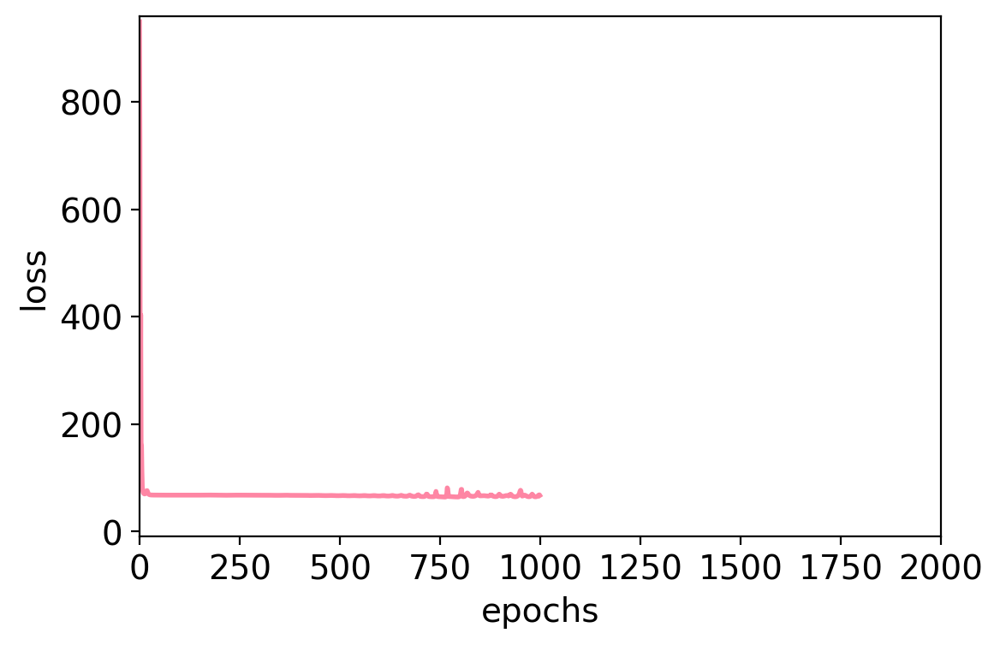

plot losses_ccc


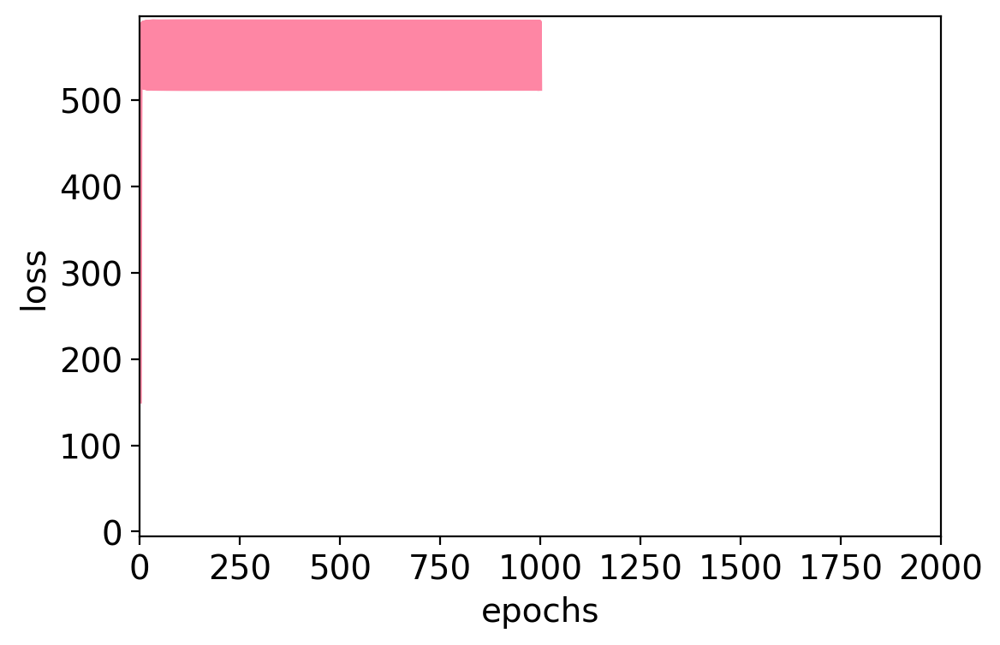

rho=0.04273547692902718
pval=0.7373996992150751
obs_g2g=[[1.   1.   1.   0.   0.   0.   1.   1.  ]
 [1.   1.   1.   0.   0.   0.33 1.   1.  ]
 [1.   1.   1.   0.   0.   1.   1.   1.  ]
 [0.   0.   0.   1.   1.   0.   0.   0.  ]
 [0.   0.   0.   1.   1.   0.   0.   0.  ]
 [0.   0.33 1.   0.   0.   1.   0.66 1.  ]
 [1.   1.   1.   0.   0.   0.66 1.   1.  ]
 [1.   1.   1.   0.   0.   1.   1.   1.  ]]
exp_g2g=[[1.   0.14 0.25 0.25 0.5  0.54 0.96 0.18]
 [0.14 1.   0.11 0.36 0.32 0.75 0.43 0.21]
 [0.25 0.11 1.   0.79 0.07 0.5  0.   0.11]
 [0.25 0.36 0.79 1.   0.14 0.11 0.46 0.  ]
 [0.5  0.32 0.07 0.14 1.   0.46 0.82 0.96]
 [0.54 0.75 0.5  0.11 0.46 1.   0.07 0.18]
 [0.96 0.43 0.   0.46 0.82 0.07 1.   0.93]
 [0.18 0.21 0.11 0.   0.96 0.18 0.93 1.  ]]
rho=0.036434435339115986
pval=0.7750116716238256
simulation 17; time passed: 223.92217469215393
spearman_corr=-0.9636426156426158
plot losses_scc


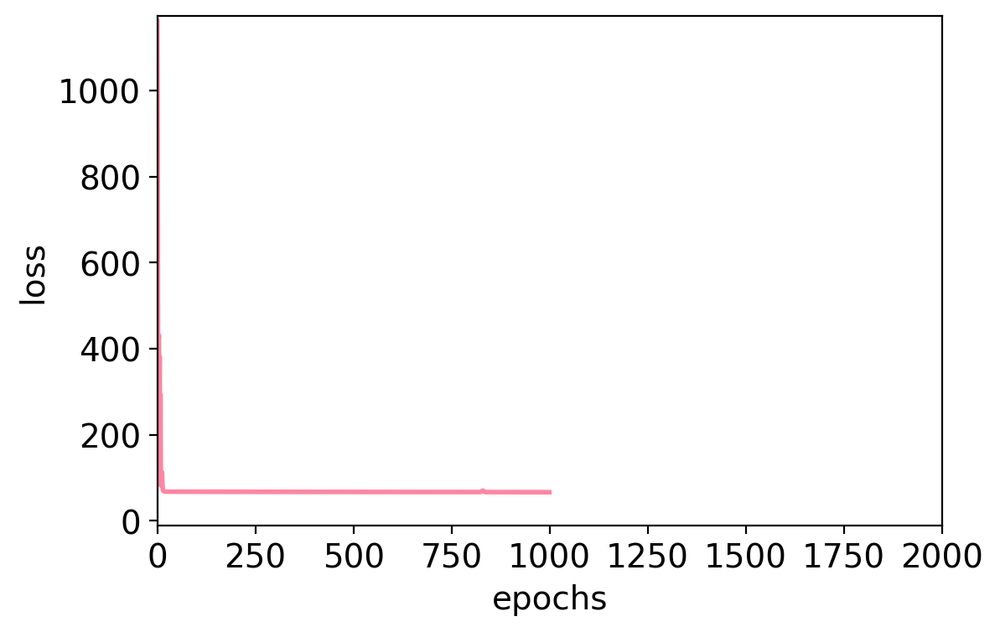

plot losses_ccc


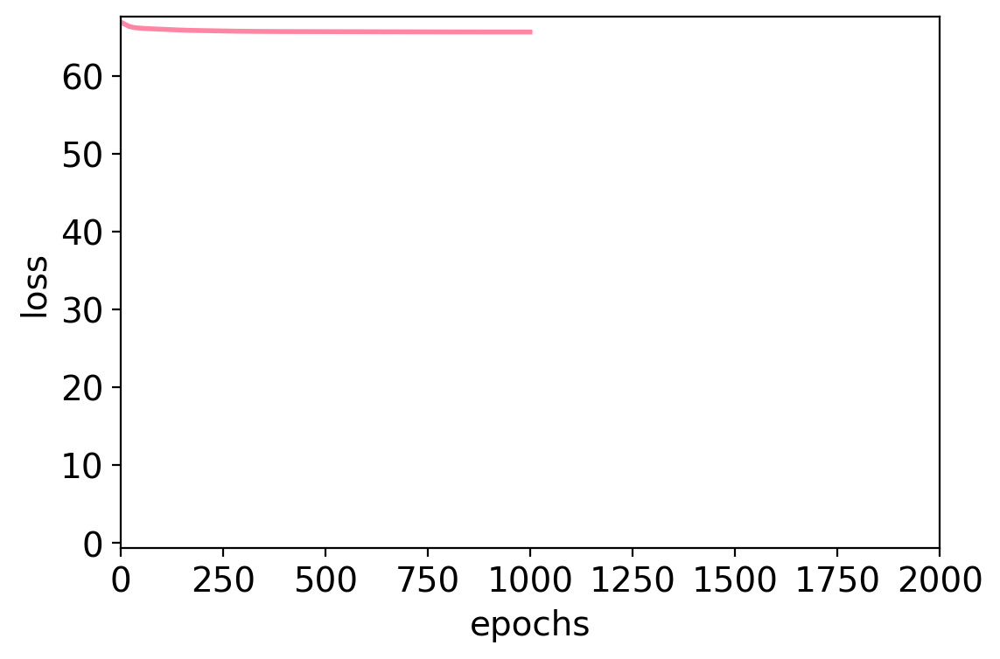

rho=0.2935371679115371
pval=0.018566080670285288
obs_g2g=[[1.   0.   1.   1.   0.96 1.   1.   1.  ]
 [0.   1.   0.   0.22 0.83 1.   1.   1.  ]
 [1.   0.   1.   1.   1.   1.   1.   1.  ]
 [1.   0.22 1.   1.   0.74 1.   0.84 0.62]
 [0.96 0.83 1.   0.74 1.   1.   1.   0.57]
 [1.   1.   1.   1.   1.   1.   0.85 0.95]
 [1.   1.   1.   0.84 1.   0.85 1.   0.93]
 [1.   1.   1.   0.62 0.57 0.95 0.93 1.  ]]
exp_g2g=[[1.   0.75 0.82 0.25 0.29 0.86 0.46 0.68]
 [0.75 1.   0.21 0.11 0.18 0.68 0.82 0.  ]
 [0.82 0.21 1.   0.89 0.43 0.   0.21 0.07]
 [0.25 0.11 0.89 1.   0.25 0.46 0.32 0.71]
 [0.29 0.18 0.43 0.25 1.   0.79 0.71 0.14]
 [0.86 0.68 0.   0.46 0.79 1.   0.82 0.36]
 [0.46 0.82 0.21 0.32 0.71 0.82 1.   0.93]
 [0.68 0.   0.07 0.71 0.14 0.36 0.93 1.  ]]
rho=nan
pval=nan
simulation 18; time passed: 237.13470673561096


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.7094768894768895
plot losses_scc


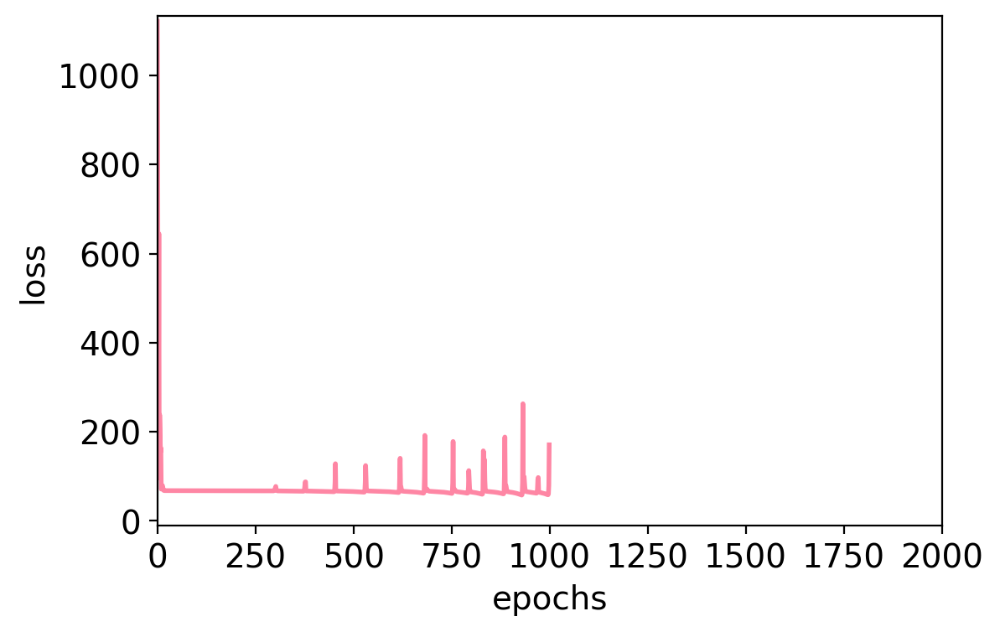

plot losses_ccc


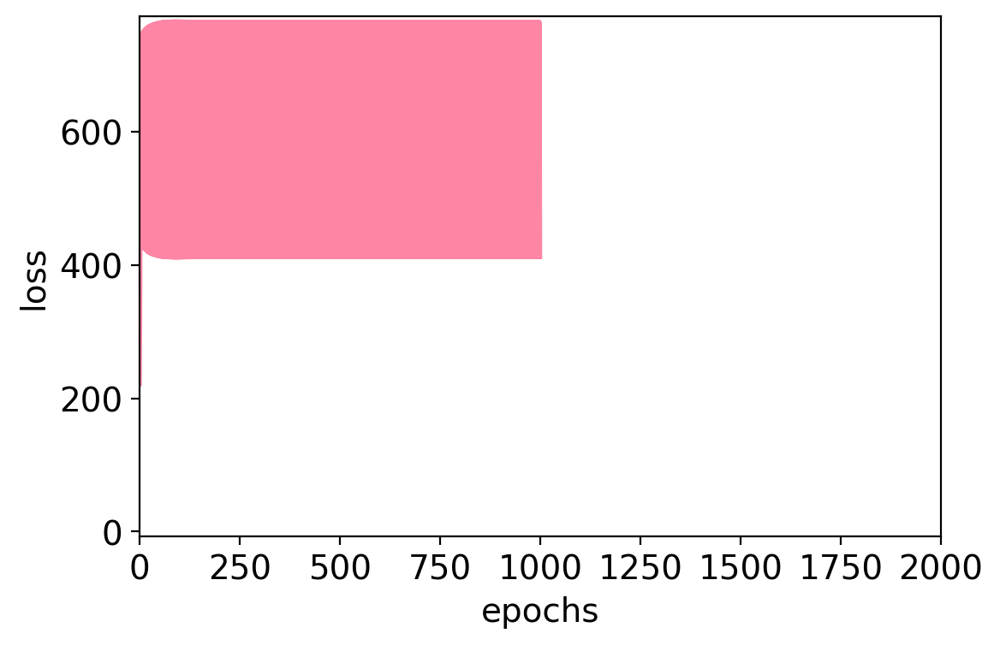

rho=0.057298162583645736
pval=0.6529118594521311
obs_g2g=[[1.   1.   0.1  0.   0.14 0.   1.   0.96]
 [1.   1.   1.   0.   1.   1.   1.   1.  ]
 [0.1  1.   1.   0.   1.   0.   1.   1.  ]
 [0.   0.   0.   1.   0.   0.   0.   0.  ]
 [0.14 1.   1.   0.   1.   0.   1.   1.  ]
 [0.   1.   0.   0.   0.   1.   1.   0.8 ]
 [1.   1.   1.   0.   1.   1.   1.   1.  ]
 [0.96 1.   1.   0.   1.   0.8  1.   1.  ]]
exp_g2g=[[1.   0.21 0.82 0.39 0.61 0.   0.82 0.5 ]
 [0.21 1.   0.93 0.68 0.71 0.29 0.29 0.46]
 [0.82 0.93 1.   0.32 0.11 0.5  0.07 0.04]
 [0.39 0.68 0.32 1.   0.36 0.29 0.5  0.71]
 [0.61 0.71 0.11 0.36 1.   0.61 0.18 0.32]
 [0.   0.29 0.5  0.29 0.61 1.   0.32 0.61]
 [0.82 0.29 0.07 0.5  0.18 0.32 1.   0.93]
 [0.5  0.46 0.04 0.71 0.32 0.61 0.93 1.  ]]
rho=0.01937183831954009
pval=0.8792386043399273
simulation 19; time passed: 250.4052586555481
spearman_corr=-0.993155258785643
plot losses_scc


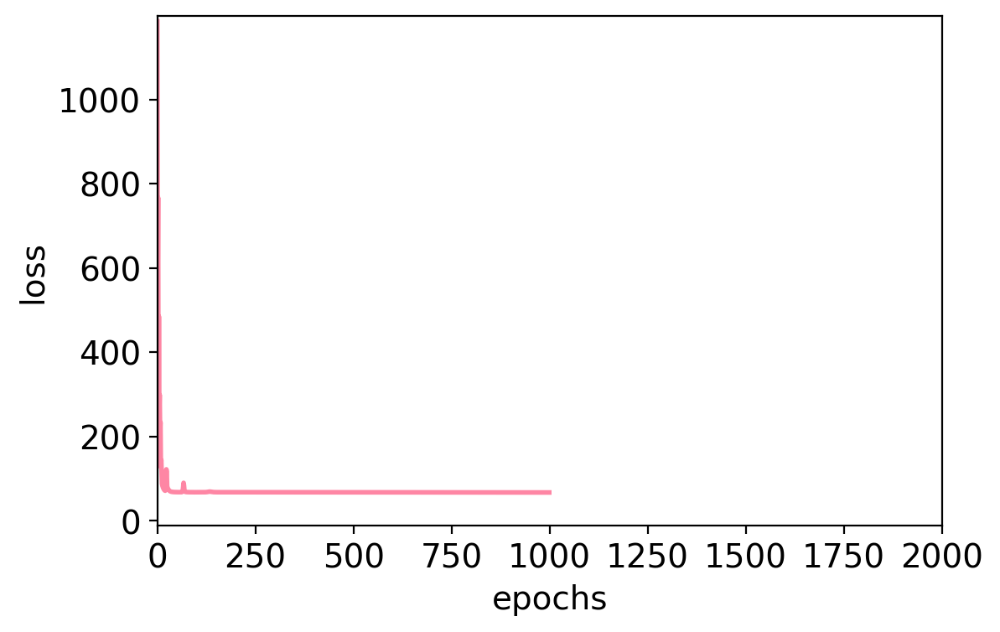

plot losses_ccc


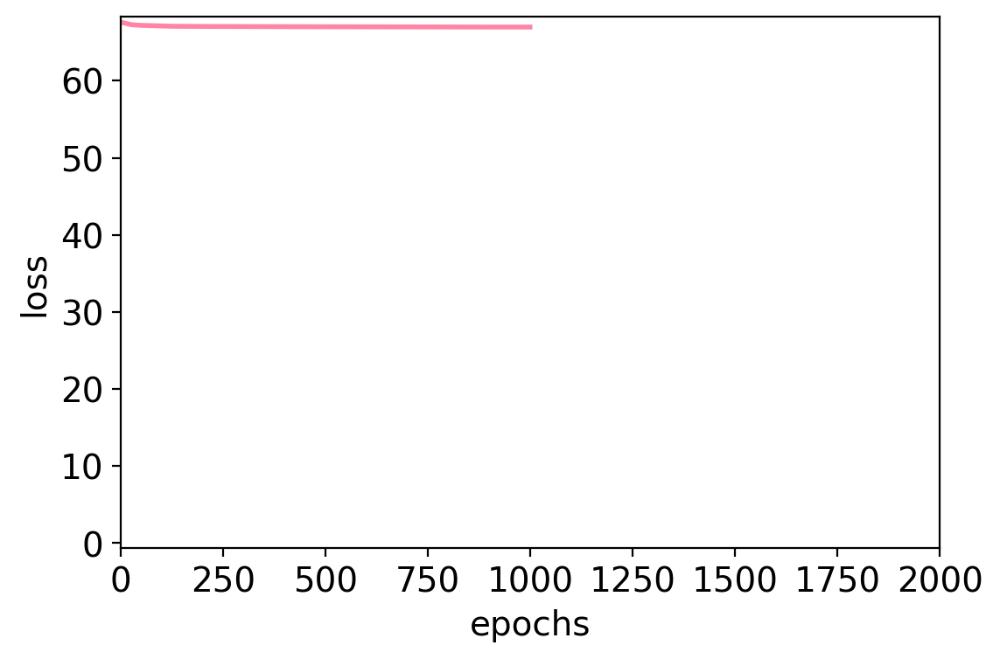

rho=0.4068503490203087
pval=0.0008492096249251166
obs_g2g=[[1.   1.   1.   0.75 0.63 0.18 0.41 1.  ]
 [1.   1.   1.   1.   0.17 0.66 0.41 0.61]
 [1.   1.   1.   0.97 0.18 0.47 0.18 0.51]
 [0.75 1.   0.97 1.   0.36 0.41 0.26 0.93]
 [0.63 0.17 0.18 0.36 1.   0.32 0.61 0.72]
 [0.18 0.66 0.47 0.41 0.32 1.   0.3  0.58]
 [0.41 0.41 0.18 0.26 0.61 0.3  1.   0.22]
 [1.   0.61 0.51 0.93 0.72 0.58 0.22 1.  ]]
exp_g2g=[[1.   0.54 0.54 0.64 0.68 0.36 0.14 0.18]
 [0.54 1.   0.79 0.89 0.11 0.21 0.14 0.04]
 [0.54 0.79 1.   0.75 0.68 0.18 0.   0.82]
 [0.64 0.89 0.75 1.   0.75 0.93 0.93 0.32]
 [0.68 0.11 0.68 0.75 1.   0.54 0.86 0.96]
 [0.36 0.21 0.18 0.93 0.54 1.   0.32 0.5 ]
 [0.14 0.14 0.   0.93 0.86 0.32 1.   0.82]
 [0.18 0.04 0.82 0.32 0.96 0.5  0.82 1.  ]]
rho=0.5048325216764896
pval=2.1002859288694178e-05
simulation 20; time passed: 263.61103558540344
spearman_corr=-0.9505511662544733
plot losses_scc


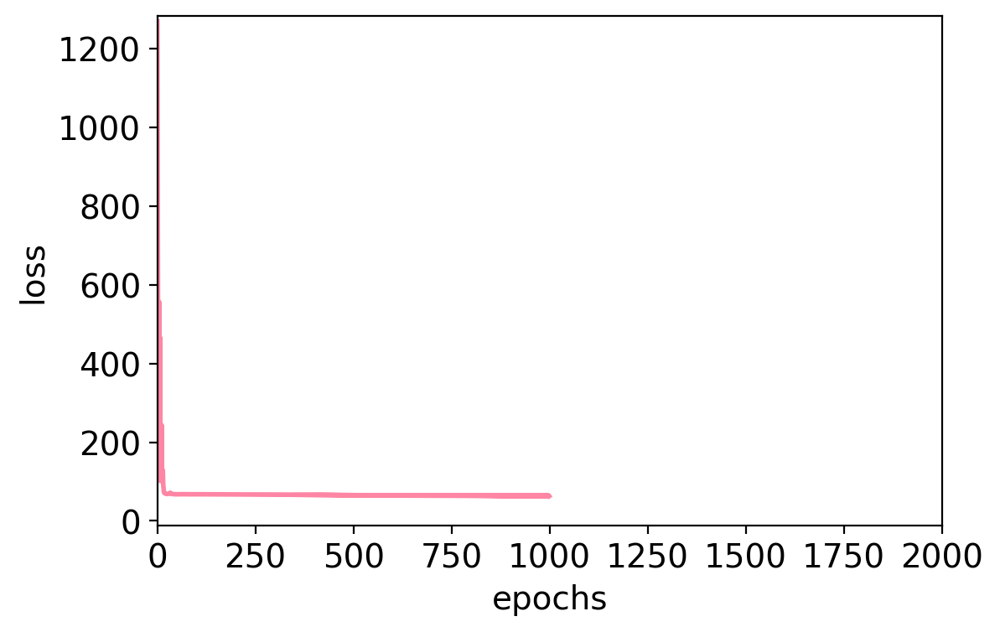

plot losses_ccc


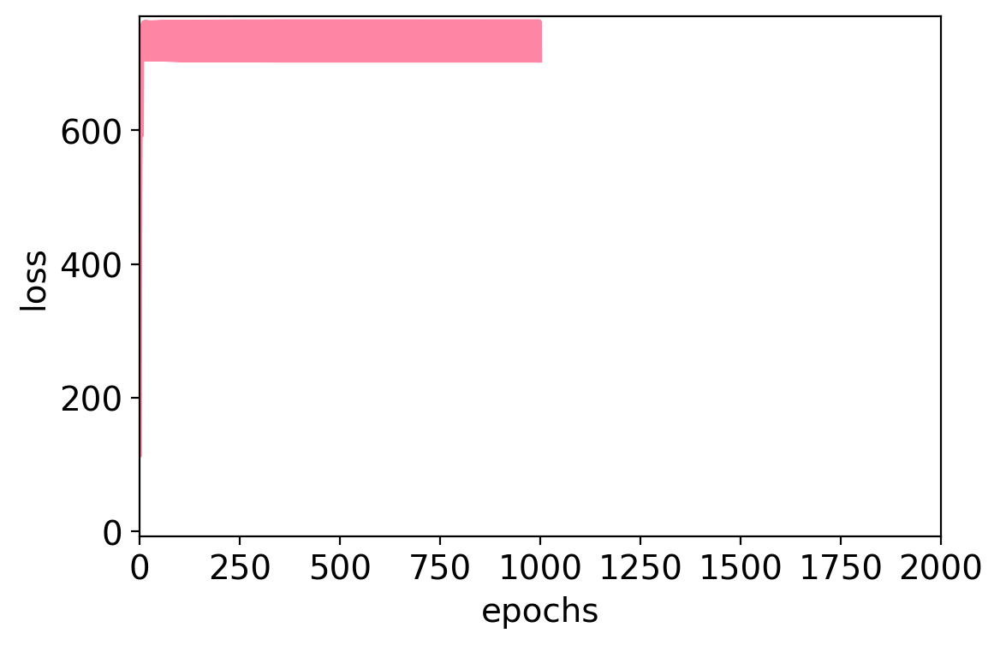

rho=-0.030257398527607116
pval=0.8123909329331146
obs_g2g=[[1.   1.   0.   0.   0.   0.   0.   0.  ]
 [1.   1.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   1.   1.   0.17 1.   1.   1.  ]
 [0.   0.   1.   1.   0.08 1.   1.   1.  ]
 [0.   0.   0.17 0.08 1.   1.   1.   1.  ]
 [0.   0.   1.   1.   1.   1.   1.   1.  ]
 [0.   0.   1.   1.   1.   1.   1.   1.  ]
 [0.   0.   1.   1.   1.   1.   1.   1.  ]]
exp_g2g=[[1.   0.79 0.29 0.5  0.46 0.79 0.96 0.14]
 [0.79 1.   0.64 0.82 0.5  0.14 0.54 0.96]
 [0.29 0.64 1.   0.07 0.39 0.04 0.5  0.43]
 [0.5  0.82 0.07 1.   0.82 0.25 0.89 0.46]
 [0.46 0.5  0.39 0.82 1.   0.96 0.   0.36]
 [0.79 0.14 0.04 0.25 0.96 1.   0.79 0.04]
 [0.96 0.54 0.5  0.89 0.   0.79 1.   0.25]
 [0.14 0.96 0.43 0.46 0.36 0.04 0.25 1.  ]]
rho=-0.022801491636378863
pval=0.8580633788560147
simulation 21; time passed: 276.83215856552124
spearman_corr=-0.8310713688949357
plot losses_scc


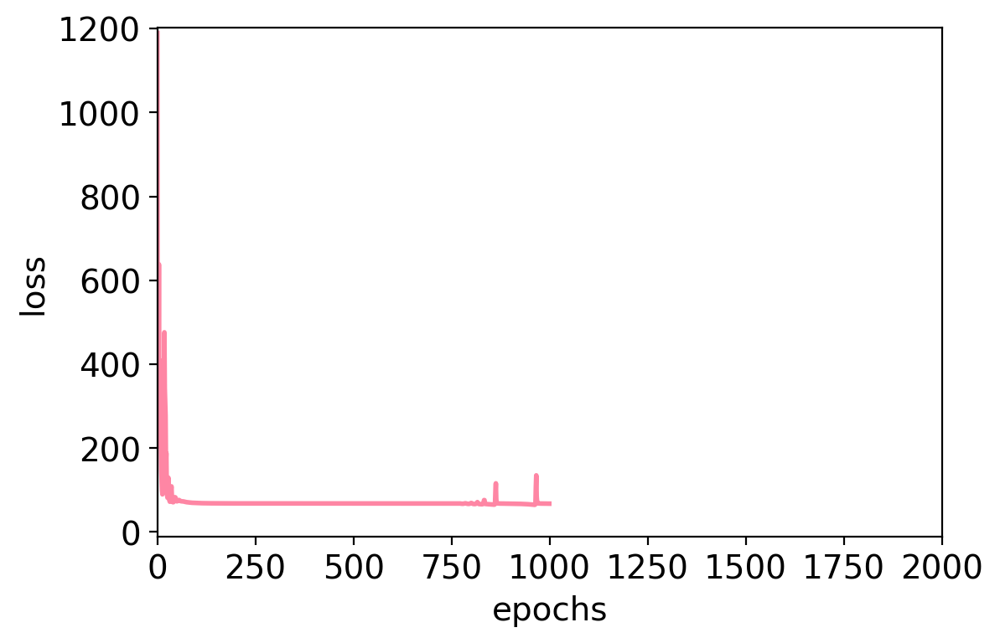

plot losses_ccc


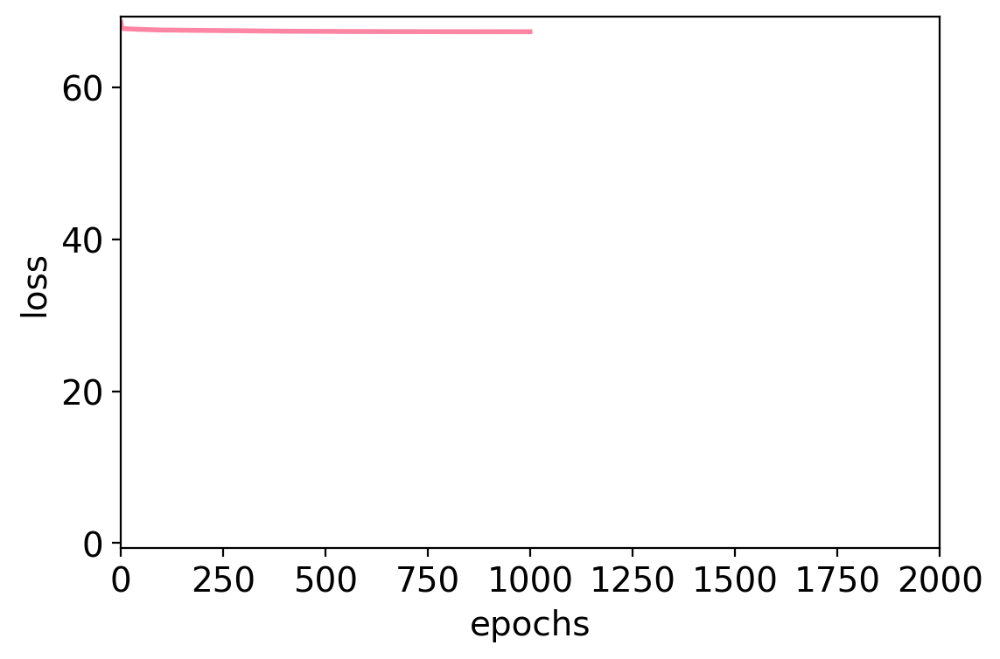

rho=0.6922229403780494
pval=2.366793437022859e-10
obs_g2g=[[1.   0.   0.   0.04 0.   0.31 0.14 0.29]
 [0.   1.   0.48 0.09 0.47 0.43 0.47 0.63]
 [0.   0.48 1.   0.66 0.49 0.48 0.22 0.52]
 [0.04 0.09 0.66 1.   0.28 0.4  0.18 0.28]
 [0.   0.47 0.49 0.28 1.   0.69 0.12 0.6 ]
 [0.31 0.43 0.48 0.4  0.69 1.   0.08 0.49]
 [0.14 0.47 0.22 0.18 0.12 0.08 1.   0.36]
 [0.29 0.63 0.52 0.28 0.6  0.49 0.36 1.  ]]
exp_g2g=[[1.   0.11 0.21 0.46 0.25 0.29 0.07 0.21]
 [0.11 1.   0.96 0.89 0.43 0.39 0.96 0.57]
 [0.21 0.96 1.   0.57 0.93 0.86 0.86 0.68]
 [0.46 0.89 0.57 1.   0.68 0.71 0.32 0.14]
 [0.25 0.43 0.93 0.68 1.   0.75 0.36 0.86]
 [0.29 0.39 0.86 0.71 0.75 1.   0.5  0.75]
 [0.07 0.96 0.86 0.32 0.36 0.5  1.   0.93]
 [0.21 0.57 0.68 0.14 0.86 0.75 0.93 1.  ]]
rho=0.14542390299571045
pval=0.2515596870340723
simulation 22; time passed: 290.0064971446991
spearman_corr=-0.9810335421231521
plot losses_scc


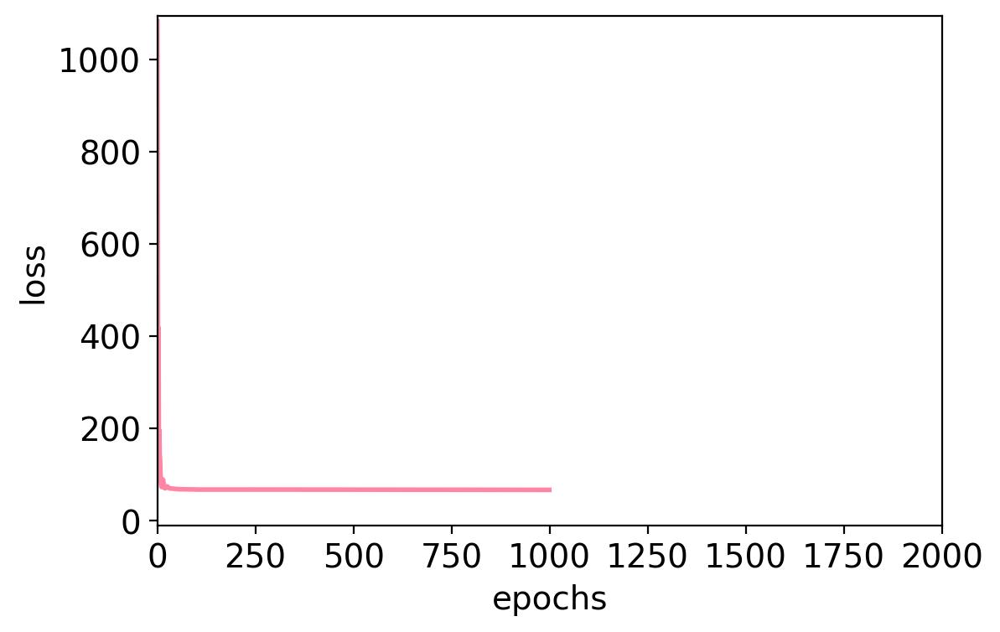

plot losses_ccc


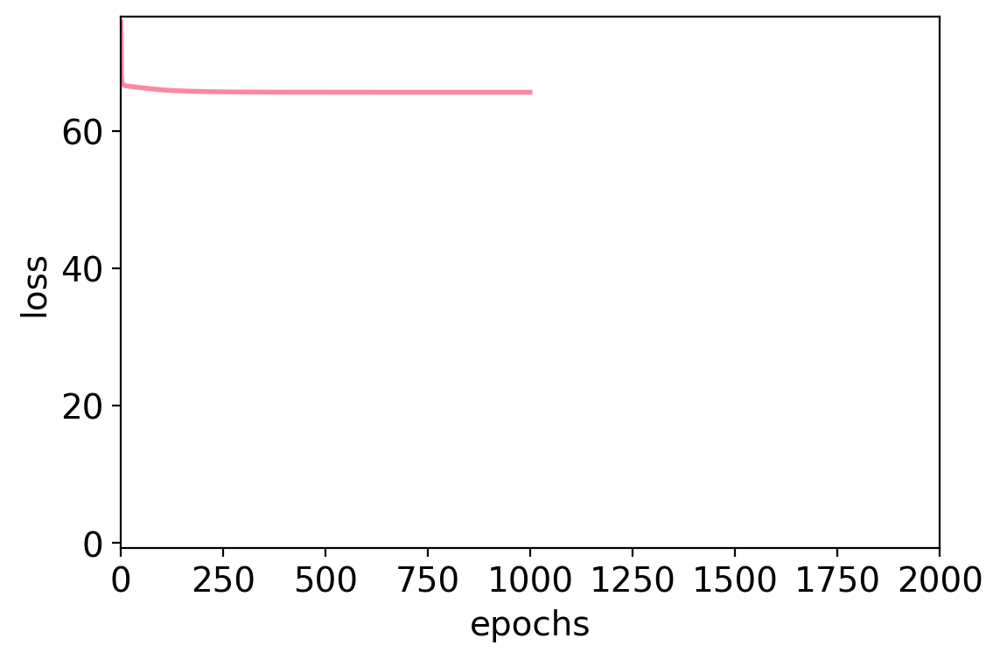

rho=0.4181662976485915
pval=0.0005851633000734155
obs_g2g=[[1.   0.   0.65 0.   0.   0.5  0.53 0.78]
 [0.   1.   1.   1.   1.   0.98 1.   0.72]
 [0.65 1.   1.   1.   0.47 1.   1.   1.  ]
 [0.   1.   1.   1.   0.47 0.75 0.62 0.35]
 [0.   1.   0.47 0.47 1.   0.62 0.68 0.4 ]
 [0.5  0.98 1.   0.75 0.62 1.   1.   1.  ]
 [0.53 1.   1.   0.62 0.68 1.   1.   1.  ]
 [0.78 0.72 1.   0.35 0.4  1.   1.   1.  ]]
exp_g2g=[[1.   0.18 0.32 0.43 0.21 0.29 0.5  0.86]
 [0.18 1.   0.32 0.75 0.57 0.11 0.43 0.86]
 [0.32 0.32 1.   0.29 0.18 0.93 0.21 0.  ]
 [0.43 0.75 0.29 1.   0.29 0.54 0.86 0.36]
 [0.21 0.57 0.18 0.29 1.   0.89 0.29 0.18]
 [0.29 0.11 0.93 0.54 0.89 1.   0.82 0.86]
 [0.5  0.43 0.21 0.86 0.29 0.82 1.   0.36]
 [0.86 0.86 0.   0.36 0.18 0.86 0.36 1.  ]]
rho=nan
pval=nan
simulation 23; time passed: 303.15805554389954


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.7549802029802031
plot losses_scc


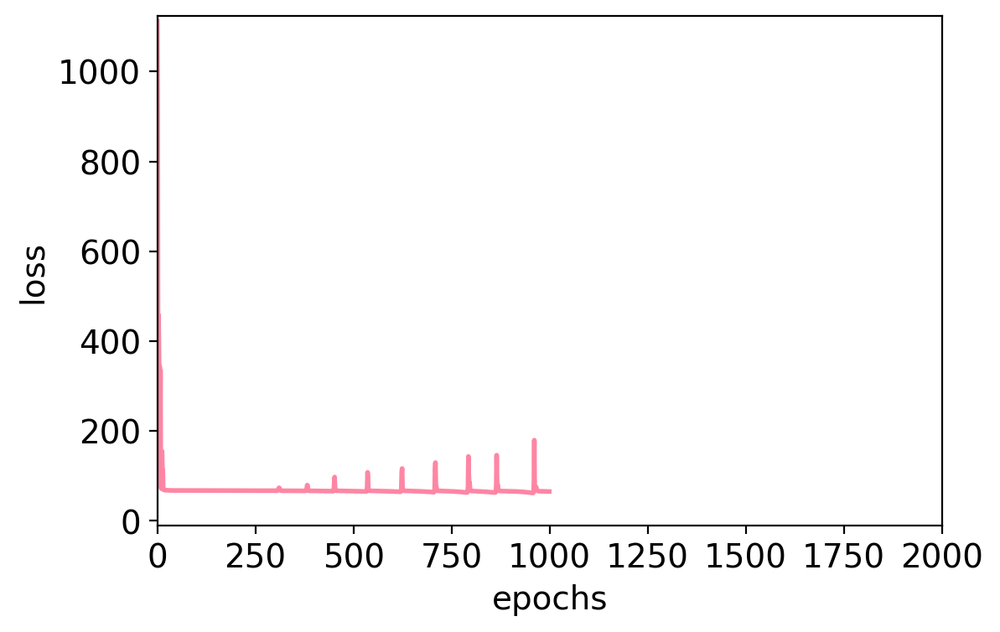

plot losses_ccc


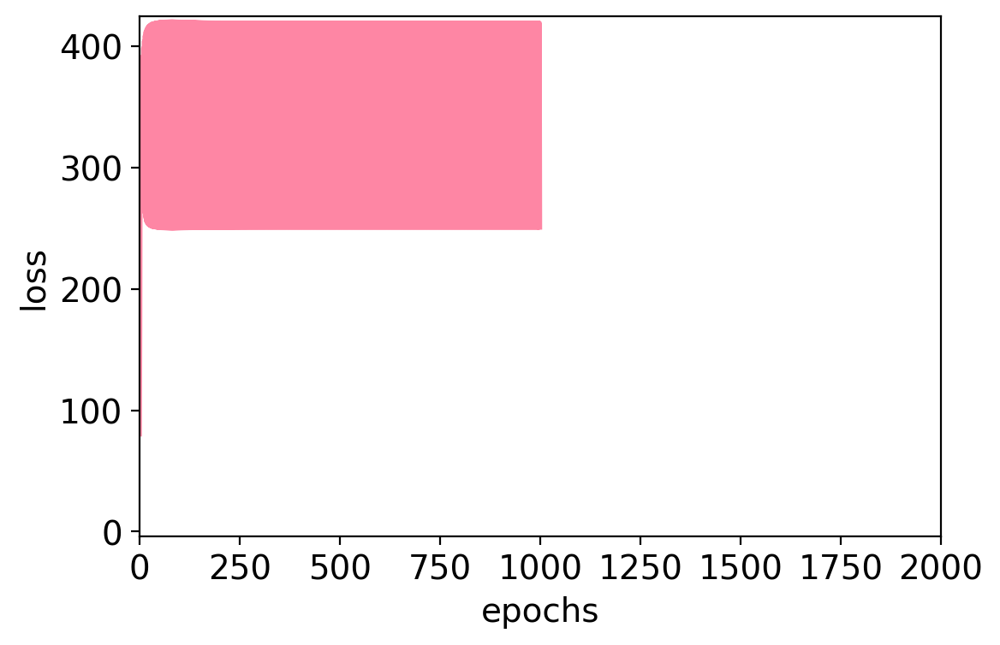

rho=0.06801113178285767
pval=0.5933523041187398
obs_g2g=[[1. 0. 1. 1. 1. 0. 0. 1.]
 [0. 1. 0. 0. 0. 1. 1. 0.]
 [1. 0. 1. 1. 1. 0. 0. 1.]
 [1. 0. 1. 1. 1. 0. 0. 1.]
 [1. 0. 1. 1. 1. 0. 0. 1.]
 [0. 1. 0. 0. 0. 1. 1. 0.]
 [0. 1. 0. 0. 0. 1. 1. 0.]
 [1. 0. 1. 1. 1. 0. 0. 1.]]
exp_g2g=[[1.   0.64 0.36 0.79 0.11 0.96 0.25 0.  ]
 [0.64 1.   0.61 0.64 0.04 0.43 0.5  0.64]
 [0.36 0.61 1.   0.5  0.86 0.14 0.54 0.04]
 [0.79 0.64 0.5  1.   0.14 0.18 0.96 0.21]
 [0.11 0.04 0.86 0.14 1.   0.82 0.25 0.86]
 [0.96 0.43 0.14 0.18 0.82 1.   0.04 0.04]
 [0.25 0.5  0.54 0.96 0.25 0.04 1.   0.18]
 [0.   0.64 0.04 0.21 0.86 0.04 0.18 1.  ]]
rho=0.04110611636080767
pval=0.7470709578597181
simulation 24; time passed: 316.3303987979889
spearman_corr=-0.987720542910099
plot losses_scc


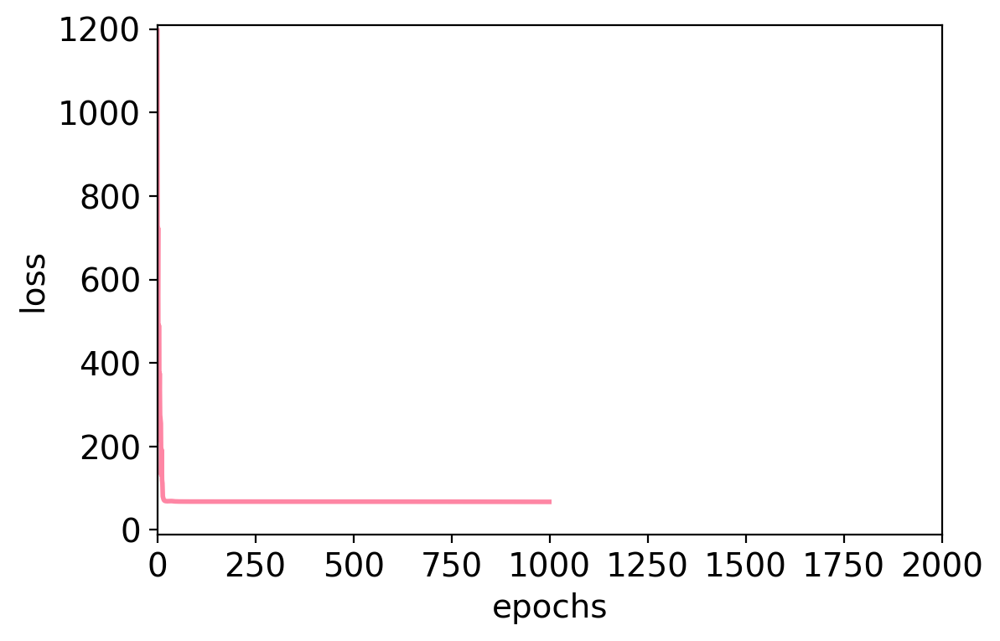

plot losses_ccc


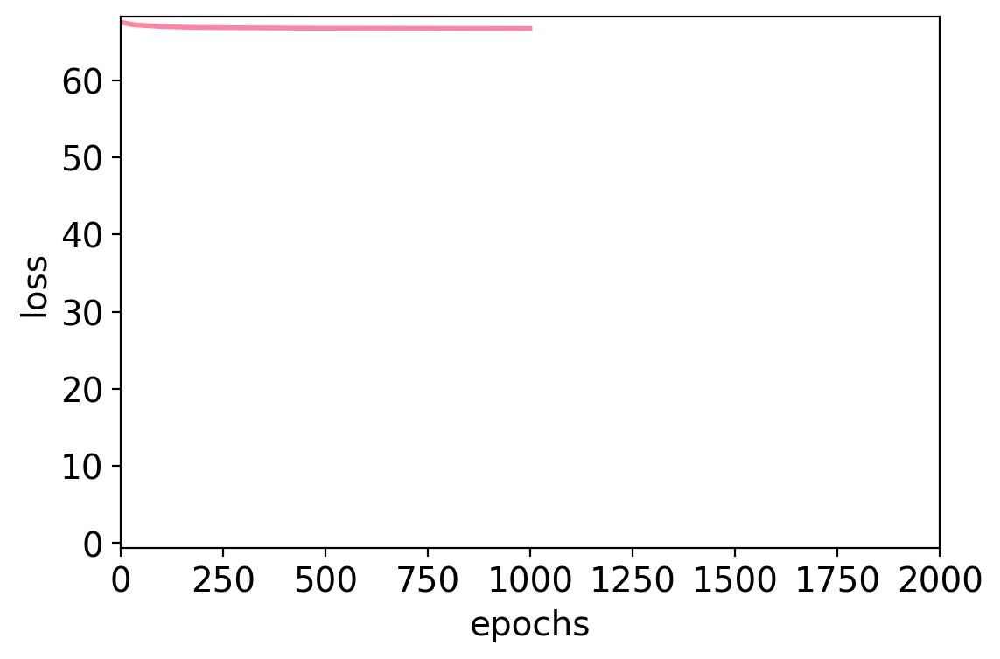

rho=0.37093980152901845
pval=0.002548878766262702
obs_g2g=[[1.   1.   1.   1.   0.96 0.98 0.08 0.75]
 [1.   1.   0.04 1.   0.72 0.43 0.   0.53]
 [1.   0.04 1.   0.53 0.26 0.38 0.   0.  ]
 [1.   1.   0.53 1.   0.73 0.69 0.02 0.59]
 [0.96 0.72 0.26 0.73 1.   0.6  0.   0.11]
 [0.98 0.43 0.38 0.69 0.6  1.   0.34 0.77]
 [0.08 0.   0.   0.02 0.   0.34 1.   0.  ]
 [0.75 0.53 0.   0.59 0.11 0.77 0.   1.  ]]
exp_g2g=[[1.   0.54 0.21 0.43 0.32 0.96 0.5  0.04]
 [0.54 1.   0.   0.89 0.86 0.29 0.14 0.96]
 [0.21 0.   1.   0.64 0.   0.36 0.18 0.86]
 [0.43 0.89 0.64 1.   0.86 0.71 0.11 0.11]
 [0.32 0.86 0.   0.86 1.   0.89 0.89 0.68]
 [0.96 0.29 0.36 0.71 0.89 1.   0.79 0.57]
 [0.5  0.14 0.18 0.11 0.89 0.79 1.   0.89]
 [0.04 0.96 0.86 0.11 0.68 0.57 0.89 1.  ]]
rho=0.2130449878954169
pval=0.0909833238839198
simulation 25; time passed: 329.5184864997864
spearman_corr=-0.9971353451181573
plot losses_scc


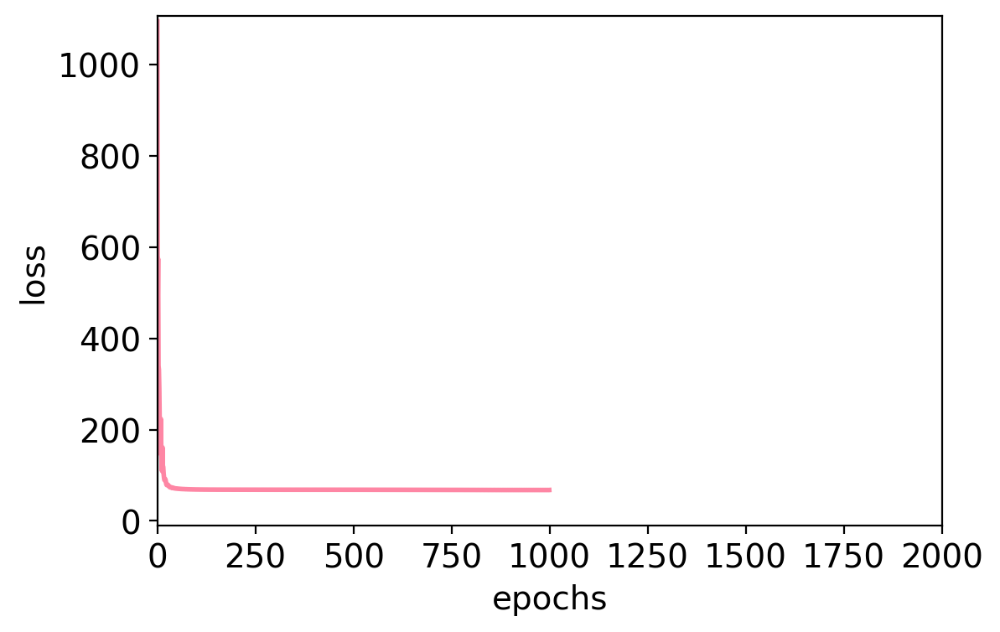

plot losses_ccc


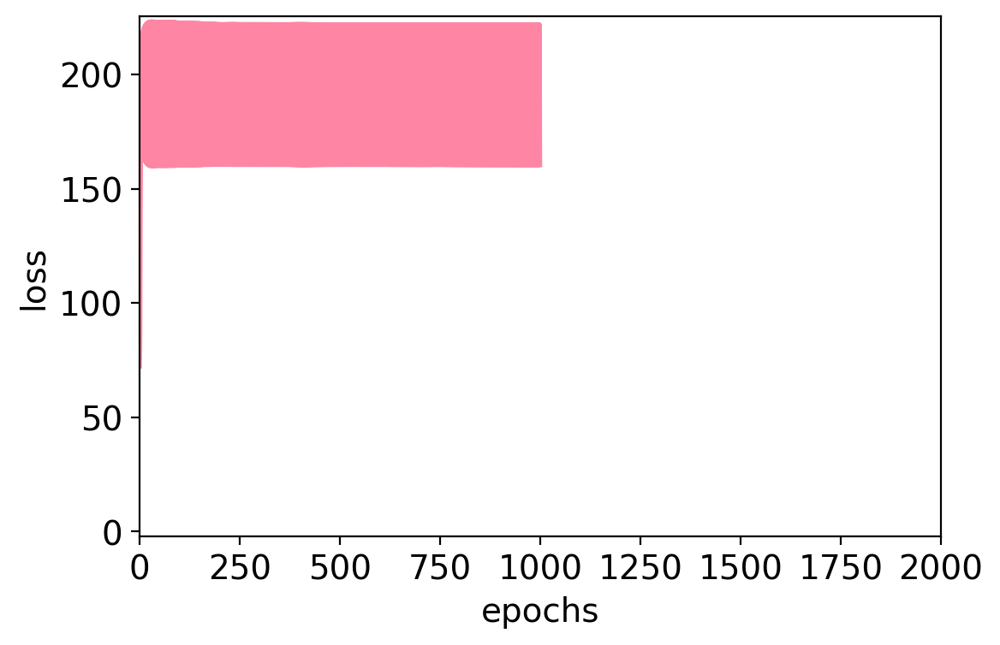

rho=0.1897226325346654
pval=0.13321564082896262
obs_g2g=[[1.   0.   1.   0.   0.27 0.51 1.   0.  ]
 [0.   1.   0.   1.   0.   0.   0.   1.  ]
 [1.   0.   1.   0.   0.95 0.78 1.   0.  ]
 [0.   1.   0.   1.   0.   0.   0.   1.  ]
 [0.27 0.   0.95 0.   1.   0.83 0.36 0.47]
 [0.51 0.   0.78 0.   0.83 1.   0.42 0.47]
 [1.   0.   1.   0.   0.36 0.42 1.   0.  ]
 [0.   1.   0.   1.   0.47 0.47 0.   1.  ]]
exp_g2g=[[1.   0.14 0.68 0.71 0.   0.   0.04 0.21]
 [0.14 1.   0.93 0.39 0.68 0.07 0.61 0.29]
 [0.68 0.93 1.   0.07 0.89 0.54 0.82 0.93]
 [0.71 0.39 0.07 1.   0.68 0.79 0.5  0.36]
 [0.   0.68 0.89 0.68 1.   0.89 0.61 0.07]
 [0.   0.07 0.54 0.79 0.89 1.   0.57 0.39]
 [0.04 0.61 0.82 0.5  0.61 0.57 1.   0.5 ]
 [0.21 0.29 0.93 0.36 0.07 0.39 0.5  1.  ]]
rho=0.27081491209620057
pval=0.03043042548046051
simulation 26; time passed: 342.5415852069855
spearman_corr=-0.7212511484912588
plot losses_scc


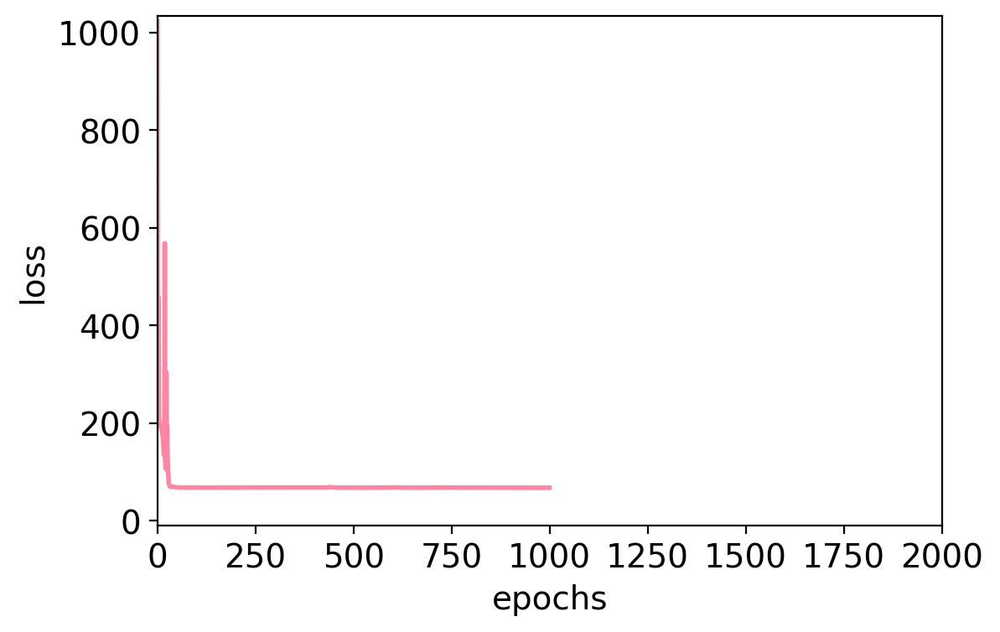

plot losses_ccc


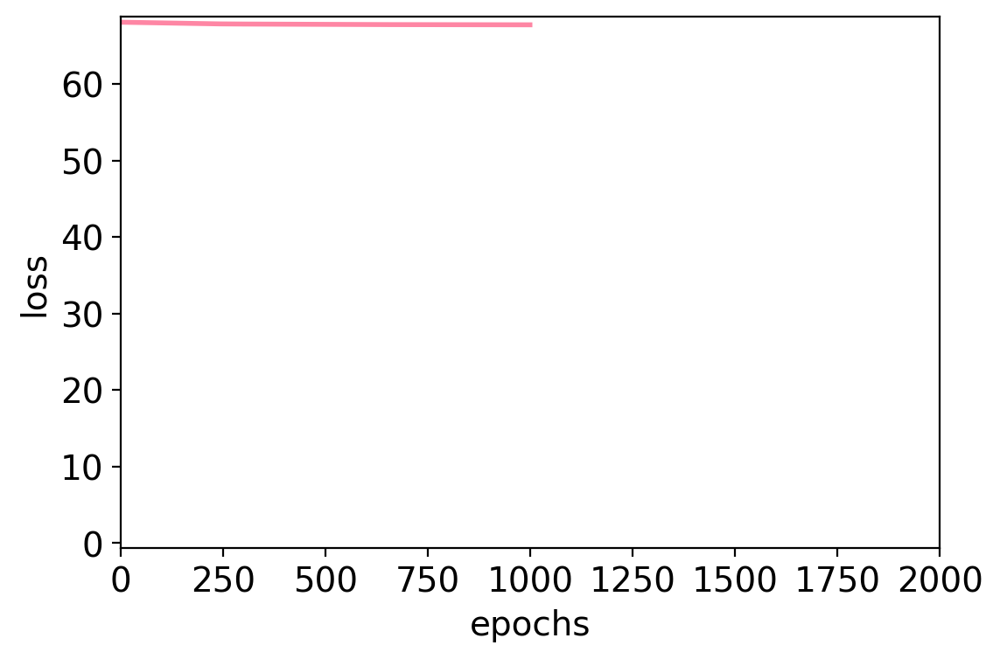

rho=0.21385747815538642
pval=0.0897283238346694
obs_g2g=[[1.   0.19 0.4  1.   1.   0.68 0.39 0.23]
 [0.19 1.   0.   0.51 0.46 1.   0.35 0.29]
 [0.4  0.   1.   0.19 0.47 0.53 0.   0.18]
 [1.   0.51 0.19 1.   0.47 0.84 0.32 0.47]
 [1.   0.46 0.47 0.47 1.   0.8  0.33 0.34]
 [0.68 1.   0.53 0.84 0.8  1.   0.47 0.7 ]
 [0.39 0.35 0.   0.32 0.33 0.47 1.   0.18]
 [0.23 0.29 0.18 0.47 0.34 0.7  0.18 1.  ]]
exp_g2g=[[1.   0.14 0.21 0.07 0.21 0.25 0.14 0.07]
 [0.14 1.   0.25 0.96 0.71 0.14 0.93 0.  ]
 [0.21 0.25 1.   0.86 0.71 0.57 0.21 0.86]
 [0.07 0.96 0.86 1.   0.86 0.32 0.43 0.68]
 [0.21 0.71 0.71 0.86 1.   0.54 0.29 0.93]
 [0.25 0.14 0.57 0.32 0.54 1.   0.61 0.57]
 [0.14 0.93 0.21 0.43 0.29 0.61 1.   0.93]
 [0.07 0.   0.86 0.68 0.93 0.57 0.93 1.  ]]
rho=0.3394467730179
pval=0.00606880475325752
simulation 27; time passed: 355.46325612068176
spearman_corr=-0.9999977979977848
plot losses_scc


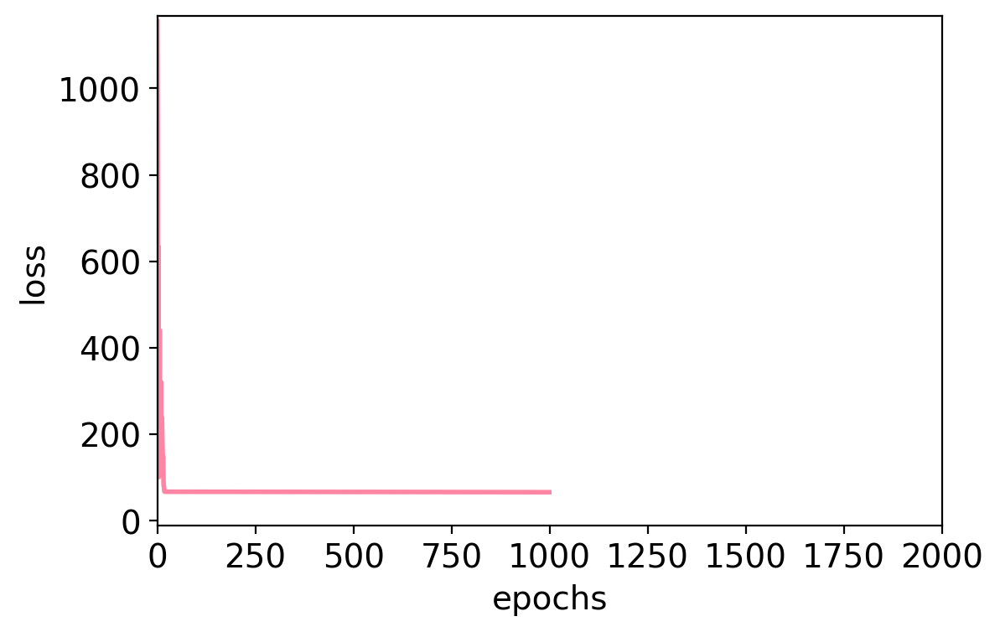

plot losses_ccc


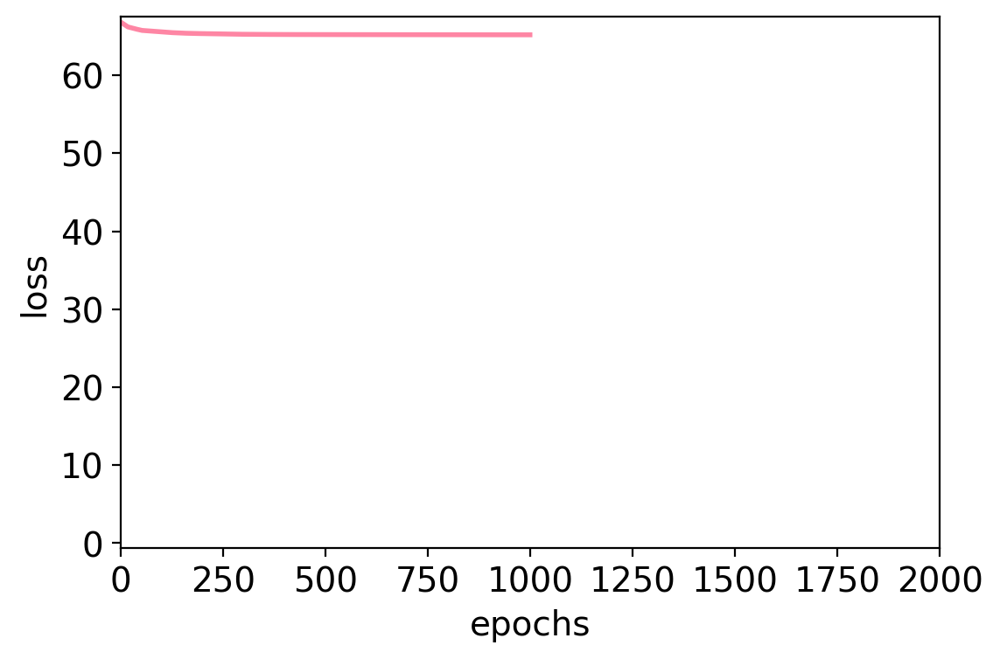

rho=0.5518932173209714
pval=2.2768846025708536e-06
obs_g2g=[[1.   1.   0.5  1.   0.96 1.   0.71 0.53]
 [1.   1.   1.   1.   1.   1.   0.89 0.78]
 [0.5  1.   1.   1.   0.78 0.93 0.91 0.55]
 [1.   1.   1.   1.   0.93 0.81 0.56 0.87]
 [0.96 1.   0.78 0.93 1.   0.53 0.34 0.55]
 [1.   1.   0.93 0.81 0.53 1.   0.66 0.5 ]
 [0.71 0.89 0.91 0.56 0.34 0.66 1.   0.34]
 [0.53 0.78 0.55 0.87 0.55 0.5  0.34 1.  ]]
exp_g2g=[[1.   0.86 0.14 0.68 0.04 0.68 0.14 0.82]
 [0.86 1.   0.25 0.96 0.71 0.46 0.07 0.75]
 [0.14 0.25 1.   0.54 0.11 0.5  0.82 0.71]
 [0.68 0.96 0.54 1.   0.25 0.04 0.21 0.21]
 [0.04 0.71 0.11 0.25 1.   0.32 0.18 0.36]
 [0.68 0.46 0.5  0.04 0.32 1.   0.71 0.07]
 [0.14 0.07 0.82 0.21 0.18 0.71 1.   0.  ]
 [0.82 0.75 0.71 0.21 0.36 0.07 0.   1.  ]]
rho=nan
pval=nan
simulation 28; time passed: 368.7240388393402


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.9999991839991743
plot losses_scc


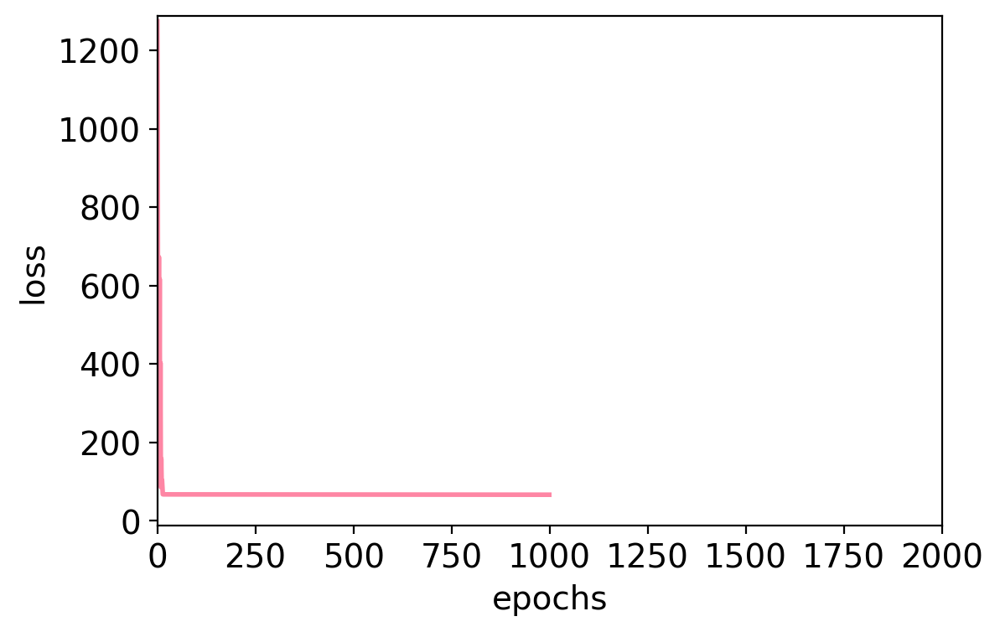

plot losses_ccc


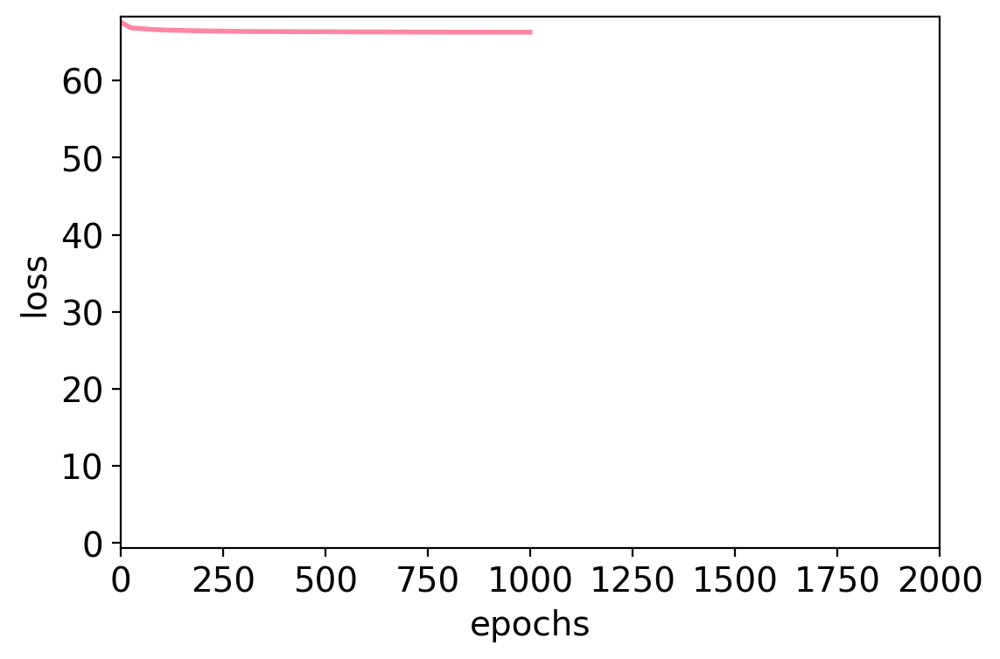

rho=0.45435614567262855
pval=0.00016236815415006755
obs_g2g=[[1.   1.   0.   1.   0.78 1.   1.   0.74]
 [1.   1.   0.   0.78 0.93 1.   1.   0.75]
 [0.   0.   1.   0.32 0.75 0.36 0.66 0.4 ]
 [1.   0.78 0.32 1.   0.53 0.75 0.42 0.74]
 [0.78 0.93 0.75 0.53 1.   0.44 0.59 0.55]
 [1.   1.   0.36 0.75 0.44 1.   0.3  0.74]
 [1.   1.   0.66 0.42 0.59 0.3  1.   0.53]
 [0.74 0.75 0.4  0.74 0.55 0.74 0.53 1.  ]]
exp_g2g=[[1.   0.89 0.75 0.82 0.04 0.93 0.39 0.  ]
 [0.89 1.   0.   0.71 0.14 0.5  0.75 0.39]
 [0.75 0.   1.   0.89 0.14 0.14 0.89 0.32]
 [0.82 0.71 0.89 1.   0.11 0.39 0.82 0.89]
 [0.04 0.14 0.14 0.11 1.   0.75 0.39 0.36]
 [0.93 0.5  0.14 0.39 0.75 1.   0.21 0.86]
 [0.39 0.75 0.89 0.82 0.39 0.21 1.   0.18]
 [0.   0.39 0.32 0.89 0.36 0.86 0.18 1.  ]]
rho=0.2848874287298956
pval=0.022507917407158996
simulation 29; time passed: 381.87355399131775
spearman_corr=-0.7346132546132547
plot losses_scc


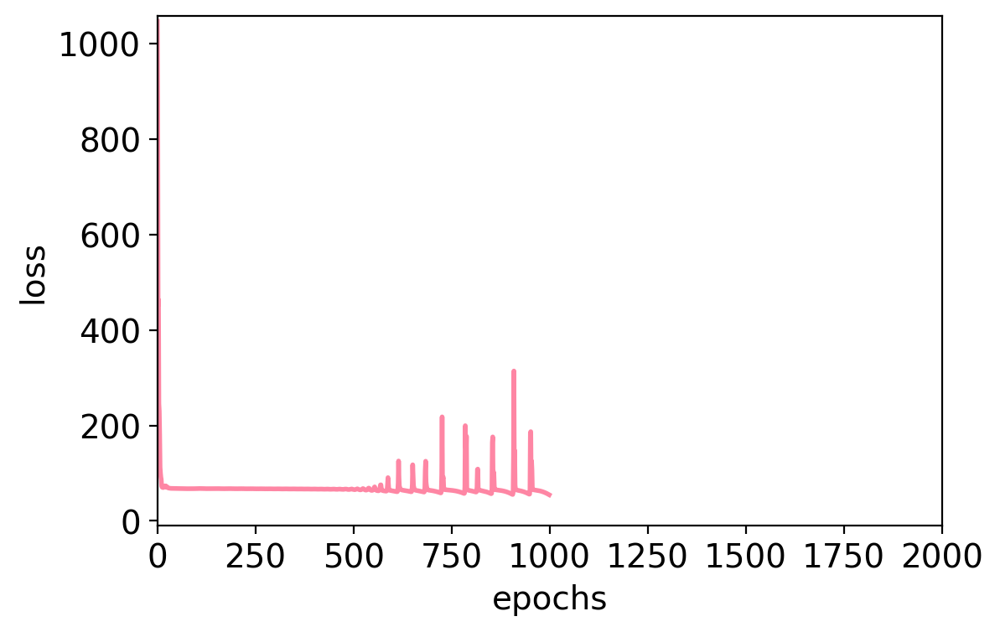

plot losses_ccc


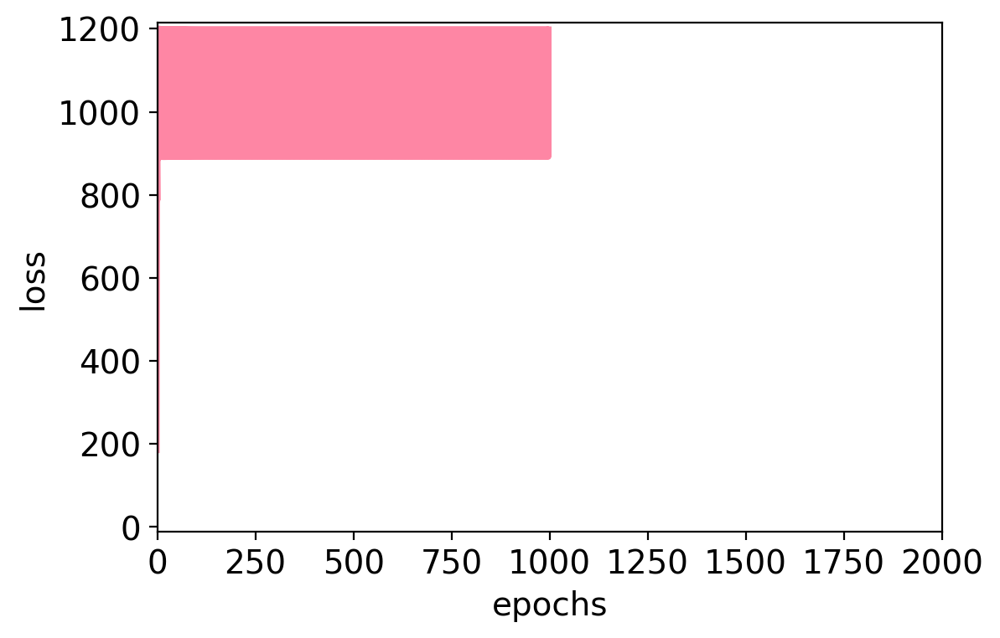

rho=0.10295392511393124
pval=0.41819727440716326
obs_g2g=[[1.   0.   1.   0.   1.   1.   0.   0.  ]
 [0.   1.   0.69 1.   0.   0.   1.   1.  ]
 [1.   0.69 1.   0.26 1.   1.   0.   1.  ]
 [0.   1.   0.26 1.   0.   0.   1.   1.  ]
 [1.   0.   1.   0.   1.   1.   0.   0.  ]
 [1.   0.   1.   0.   1.   1.   0.   0.  ]
 [0.   1.   0.   1.   0.   0.   1.   1.  ]
 [0.   1.   1.   1.   0.   0.   1.   1.  ]]
exp_g2g=[[1.   0.61 0.86 0.   0.21 0.46 0.86 0.04]
 [0.61 1.   0.14 0.32 0.46 0.14 0.68 0.  ]
 [0.86 0.14 1.   0.61 0.61 0.07 0.79 0.5 ]
 [0.   0.32 0.61 1.   0.71 0.36 0.21 0.11]
 [0.21 0.46 0.61 0.71 1.   0.07 0.   0.5 ]
 [0.46 0.14 0.07 0.36 0.07 1.   0.79 0.39]
 [0.86 0.68 0.79 0.21 0.   0.79 1.   0.46]
 [0.04 0.   0.5  0.11 0.5  0.39 0.46 1.  ]]
rho=0.12876866742049542
pval=0.310546765062796
simulation 30; time passed: 395.06251978874207
spearman_corr=-0.2993910671874136
plot losses_scc


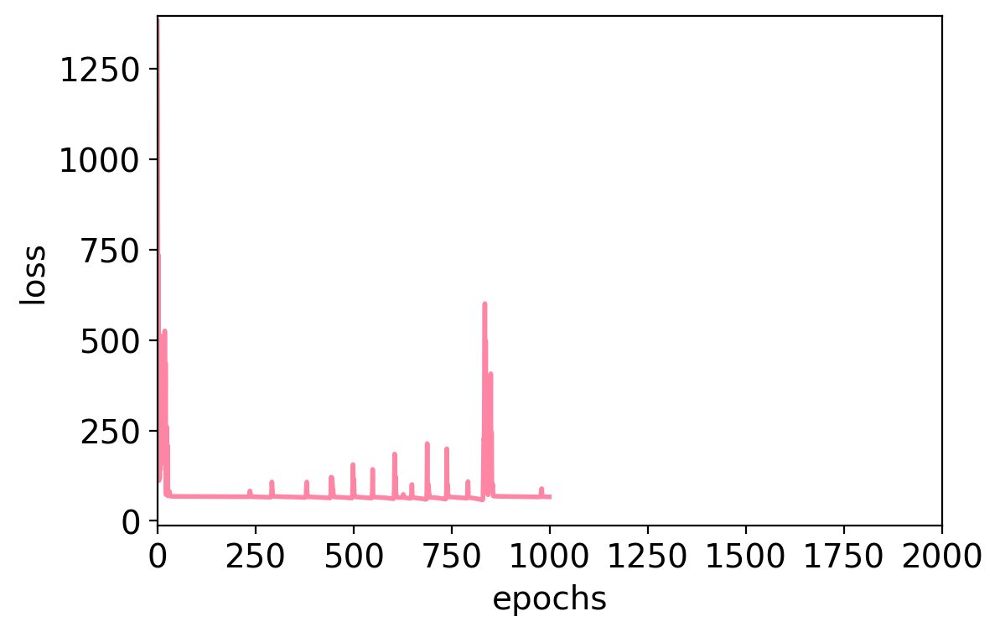

plot losses_ccc


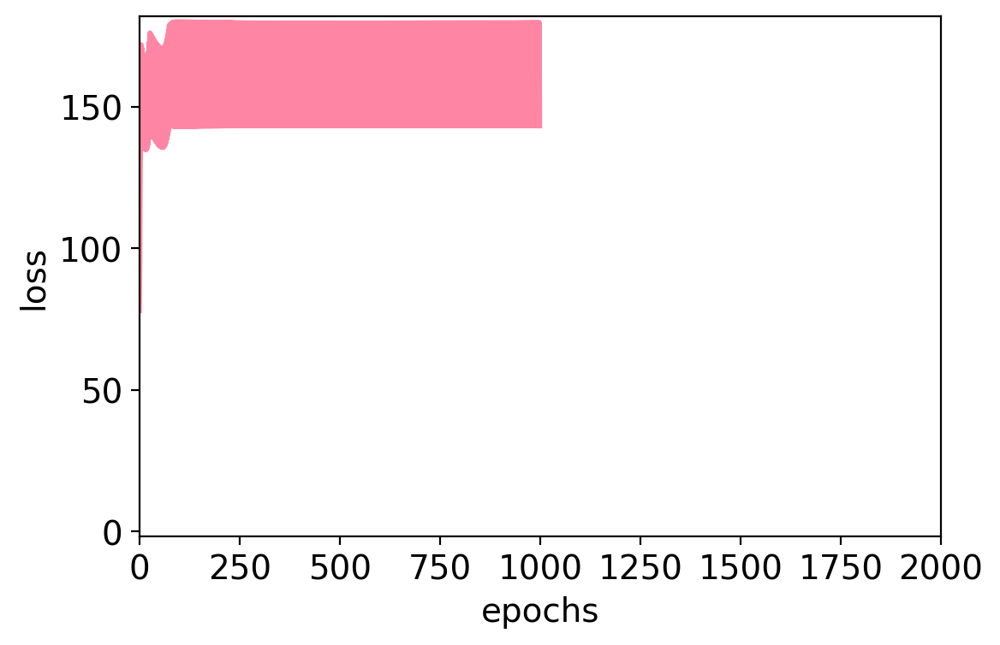

rho=0.07714766749127479
pval=0.5445670104794709
obs_g2g=[[1.   0.18 0.   0.01 0.11 0.85 0.   1.  ]
 [0.18 1.   1.   1.   0.9  0.46 0.57 0.  ]
 [0.   1.   1.   1.   1.   0.   1.   0.  ]
 [0.01 1.   1.   1.   0.88 0.21 1.   0.  ]
 [0.11 0.9  1.   0.88 1.   0.58 0.47 0.  ]
 [0.85 0.46 0.   0.21 0.58 1.   0.5  1.  ]
 [0.   0.57 1.   1.   0.47 0.5  1.   0.  ]
 [1.   0.   0.   0.   0.   1.   0.   1.  ]]
exp_g2g=[[1.   0.68 0.86 0.04 0.5  0.75 0.93 0.71]
 [0.68 1.   0.89 0.5  0.07 0.29 0.32 0.93]
 [0.86 0.89 1.   0.32 0.54 0.46 0.86 0.64]
 [0.04 0.5  0.32 1.   0.96 0.29 0.07 0.93]
 [0.5  0.07 0.54 0.96 1.   0.39 0.07 0.57]
 [0.75 0.29 0.46 0.29 0.39 1.   0.11 0.04]
 [0.93 0.32 0.86 0.07 0.07 0.11 1.   0.54]
 [0.71 0.93 0.64 0.93 0.57 0.04 0.54 1.  ]]
rho=0.23993717693909267
pval=0.056176525112533196
simulation 31; time passed: 408.21642088890076
spearman_corr=-0.9398755115147648
plot losses_scc


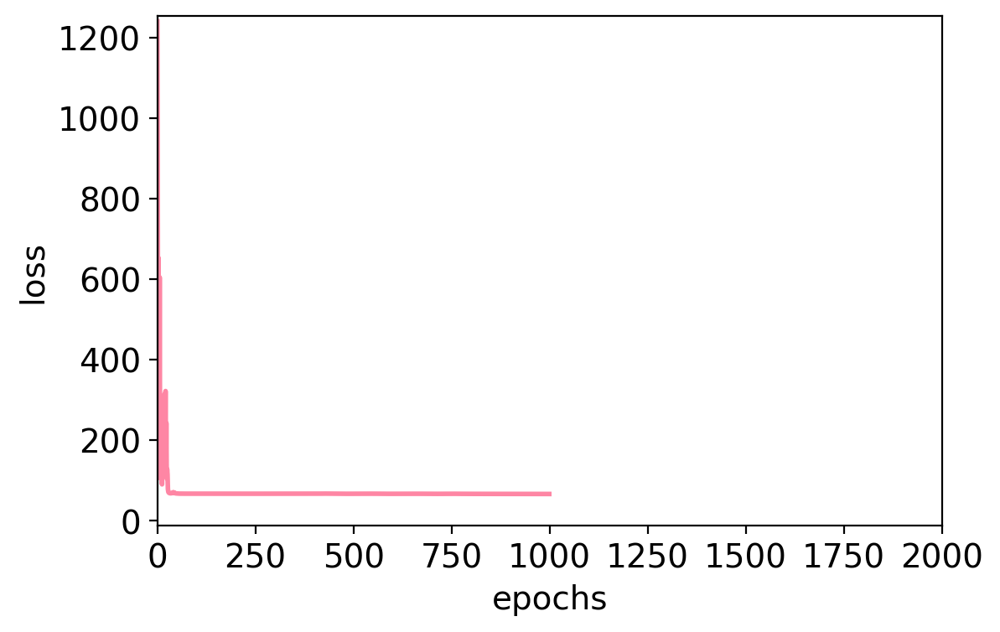

plot losses_ccc


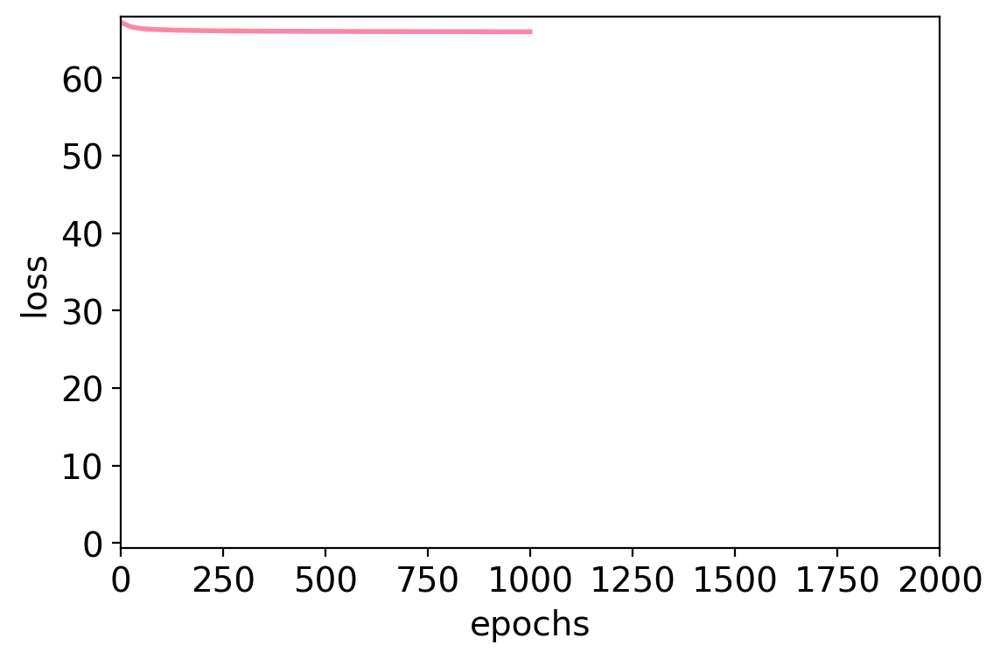

rho=0.41117933353652947
pval=0.0007375759232128036
obs_g2g=[[1.   1.   1.   0.52 0.91 1.   0.39 0.48]
 [1.   1.   0.64 0.53 0.8  0.45 0.34 0.26]
 [1.   0.64 1.   1.   1.   0.8  0.23 0.37]
 [0.52 0.53 1.   1.   0.97 1.   0.69 0.56]
 [0.91 0.8  1.   0.97 1.   0.83 0.6  0.  ]
 [1.   0.45 0.8  1.   0.83 1.   0.76 0.06]
 [0.39 0.34 0.23 0.69 0.6  0.76 1.   0.  ]
 [0.48 0.26 0.37 0.56 0.   0.06 0.   1.  ]]
exp_g2g=[[1.   0.89 0.79 0.18 0.18 0.96 0.14 0.39]
 [0.89 1.   0.14 0.89 0.54 0.29 0.89 0.36]
 [0.79 0.14 1.   0.39 0.21 0.89 0.96 0.5 ]
 [0.18 0.89 0.39 1.   0.14 0.71 0.57 0.61]
 [0.18 0.54 0.21 0.14 1.   0.5  0.14 0.04]
 [0.96 0.29 0.89 0.71 0.5  1.   0.36 0.61]
 [0.14 0.89 0.96 0.57 0.14 0.36 1.   0.21]
 [0.39 0.36 0.5  0.61 0.04 0.61 0.21 1.  ]]
rho=0.24396090486916353
pval=0.05205434082943302
simulation 32; time passed: 421.35685181617737
spearman_corr=-0.49440300240300245
plot losses_scc


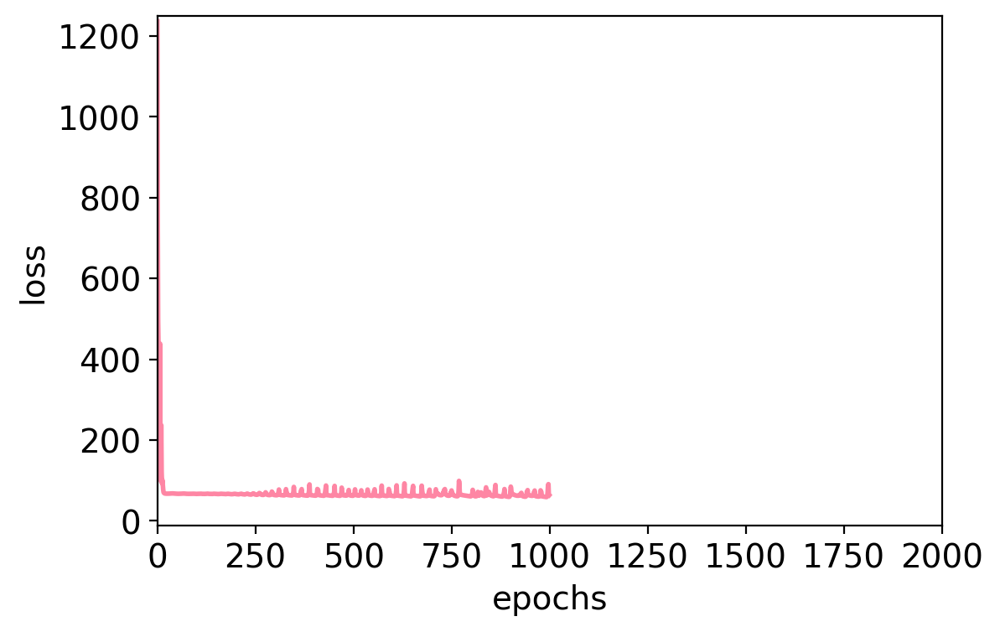

plot losses_ccc


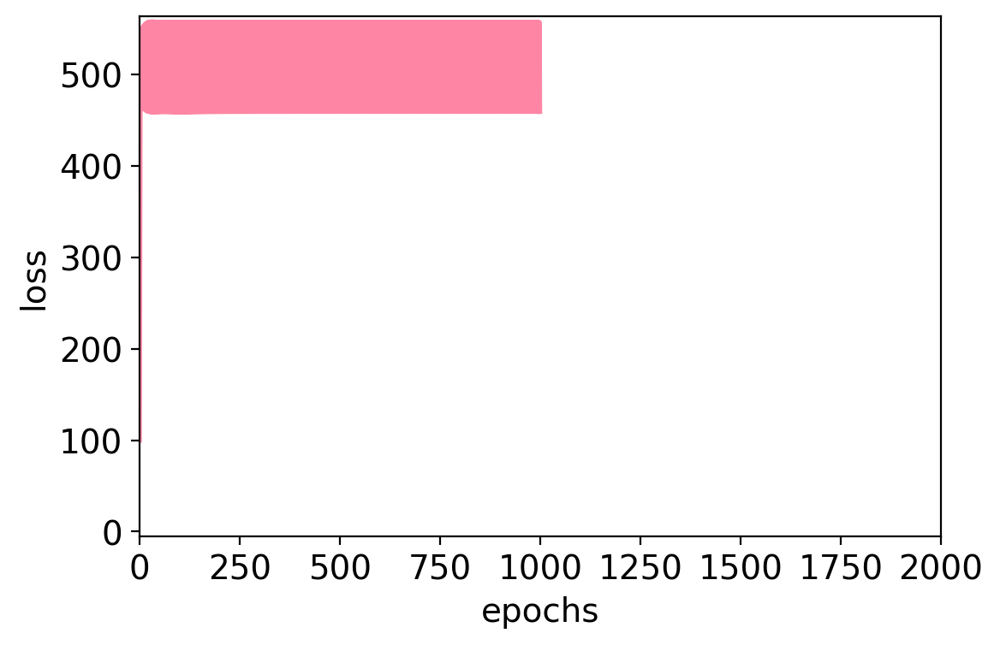

rho=0.20624854387275227
pval=0.10202787415245294
obs_g2g=[[1.   1.   1.   0.   0.   0.   0.   1.  ]
 [1.   1.   0.75 0.3  0.   0.   0.   0.  ]
 [1.   0.75 1.   0.   0.   0.   0.   1.  ]
 [0.   0.3  0.   1.   1.   1.   1.   0.  ]
 [0.   0.   0.   1.   1.   1.   1.   0.  ]
 [0.   0.   0.   1.   1.   1.   1.   0.  ]
 [0.   0.   0.   1.   1.   1.   1.   0.  ]
 [1.   0.   1.   0.   0.   0.   0.   1.  ]]
exp_g2g=[[1.   0.18 0.36 0.43 0.61 0.86 0.89 0.25]
 [0.18 1.   0.68 0.18 0.25 0.04 0.71 0.46]
 [0.36 0.68 1.   0.96 0.75 0.04 0.5  0.46]
 [0.43 0.18 0.96 1.   0.14 0.89 0.82 0.29]
 [0.61 0.25 0.75 0.14 1.   0.29 0.61 0.32]
 [0.86 0.04 0.04 0.89 0.29 1.   0.79 0.04]
 [0.89 0.71 0.5  0.82 0.61 0.79 1.   0.82]
 [0.25 0.46 0.46 0.29 0.32 0.04 0.82 1.  ]]
rho=0.18404576693641622
pval=0.14544364856935288
simulation 33; time passed: 434.5005362033844
spearman_corr=-0.9313446065207418
plot losses_scc


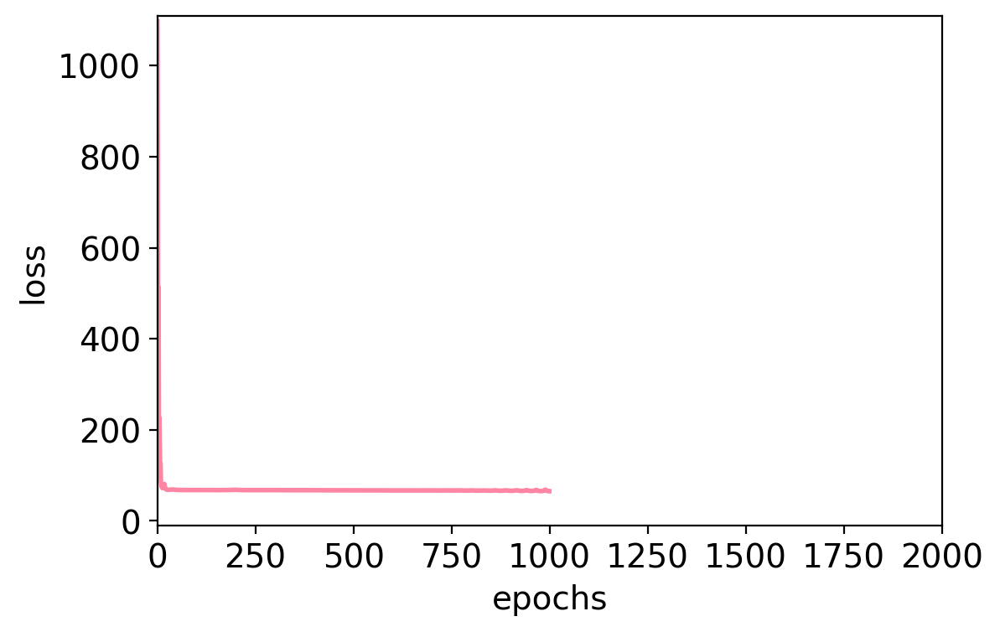

plot losses_ccc


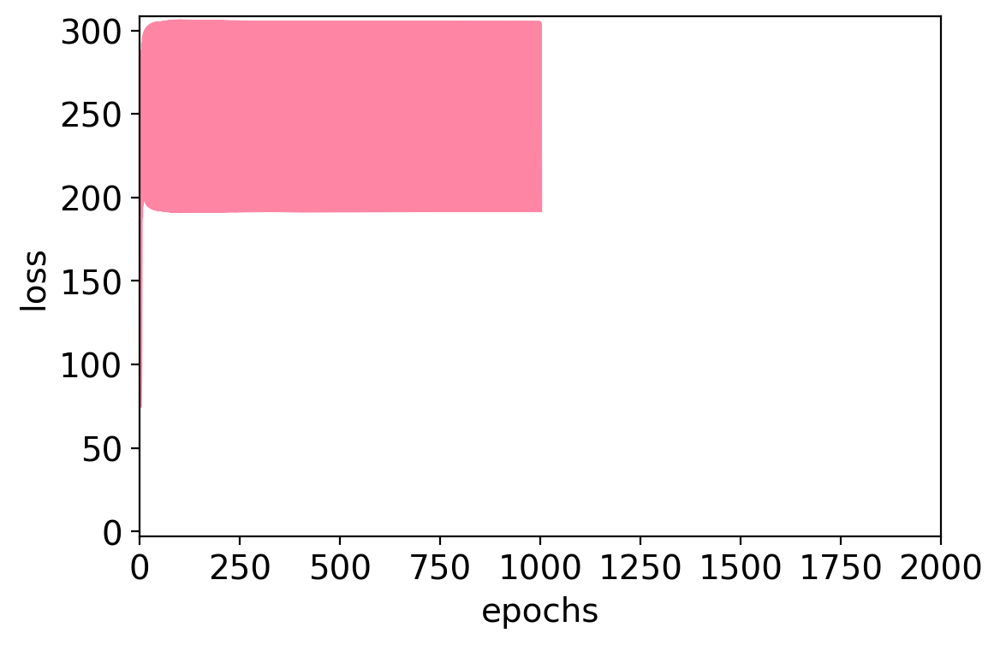

rho=0.17194481120417918
pval=0.17427649733616463
obs_g2g=[[1.   0.   1.   1.   1.   0.   0.   1.  ]
 [0.   1.   0.   0.   0.   1.   1.   0.73]
 [1.   0.   1.   0.8  1.   0.   0.   1.  ]
 [1.   0.   0.8  1.   1.   0.   0.   0.94]
 [1.   0.   1.   1.   1.   0.   0.   0.91]
 [0.   1.   0.   0.   0.   1.   1.   0.  ]
 [0.   1.   0.   0.   0.   1.   1.   0.08]
 [1.   0.73 1.   0.94 0.91 0.   0.08 1.  ]]
exp_g2g=[[1.   0.18 0.54 0.54 0.75 0.86 0.57 0.21]
 [0.18 1.   0.39 0.07 0.96 0.68 0.21 0.18]
 [0.54 0.39 1.   0.04 0.07 0.18 0.07 0.18]
 [0.54 0.07 0.04 1.   0.25 0.68 0.29 0.61]
 [0.75 0.96 0.07 0.25 1.   0.57 0.5  0.57]
 [0.86 0.68 0.18 0.68 0.57 1.   0.5  0.61]
 [0.57 0.21 0.07 0.29 0.5  0.5  1.   0.68]
 [0.21 0.18 0.18 0.61 0.57 0.61 0.68 1.  ]]
rho=0.08735872921578382
pval=0.4924548019118635
simulation 34; time passed: 447.48235988616943
spearman_corr=-0.5786399521117918
plot losses_scc


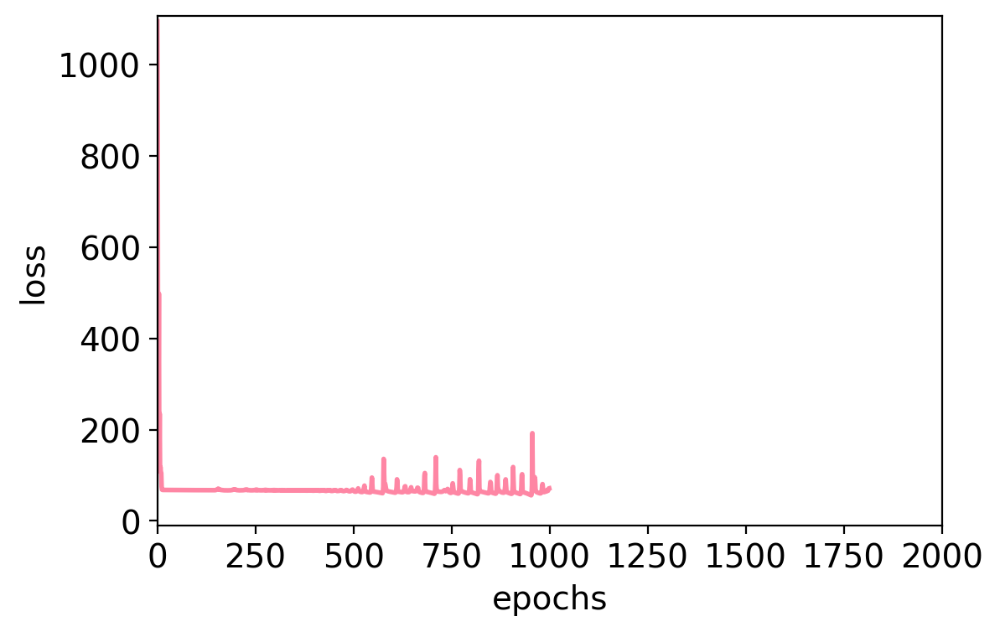

plot losses_ccc


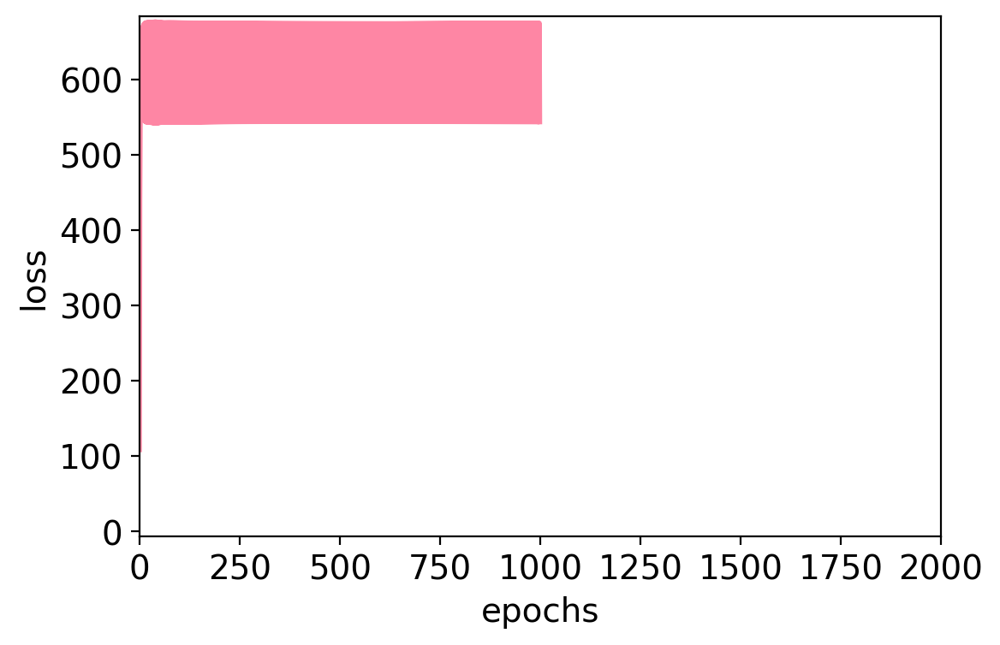

rho=0.057825449882620734
pval=0.6499251639655734
obs_g2g=[[1. 1. 0. 1. 1. 1. 0. 1.]
 [1. 1. 0. 0. 1. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0. 1. 0.]
 [1. 0. 0. 1. 1. 0. 0. 1.]
 [1. 1. 0. 1. 1. 1. 0. 1.]
 [1. 0. 0. 0. 1. 1. 0. 1.]
 [0. 0. 1. 0. 0. 0. 1. 0.]
 [1. 1. 0. 1. 1. 1. 0. 1.]]
exp_g2g=[[1.   0.11 0.39 0.93 0.07 0.21 0.93 0.39]
 [0.11 1.   0.36 0.54 0.07 0.64 0.21 0.89]
 [0.39 0.36 1.   0.86 0.93 0.14 0.89 0.46]
 [0.93 0.54 0.86 1.   0.11 0.04 0.04 0.11]
 [0.07 0.07 0.93 0.11 1.   0.   0.11 0.18]
 [0.21 0.64 0.14 0.04 0.   1.   0.21 0.43]
 [0.93 0.21 0.89 0.04 0.11 0.21 1.   0.54]
 [0.39 0.89 0.46 0.11 0.18 0.43 0.54 1.  ]]
rho=-0.004847549160500332
pval=0.9696747093530114
simulation 35; time passed: 460.6491320133209
spearman_corr=-0.9408762638120366
plot losses_scc


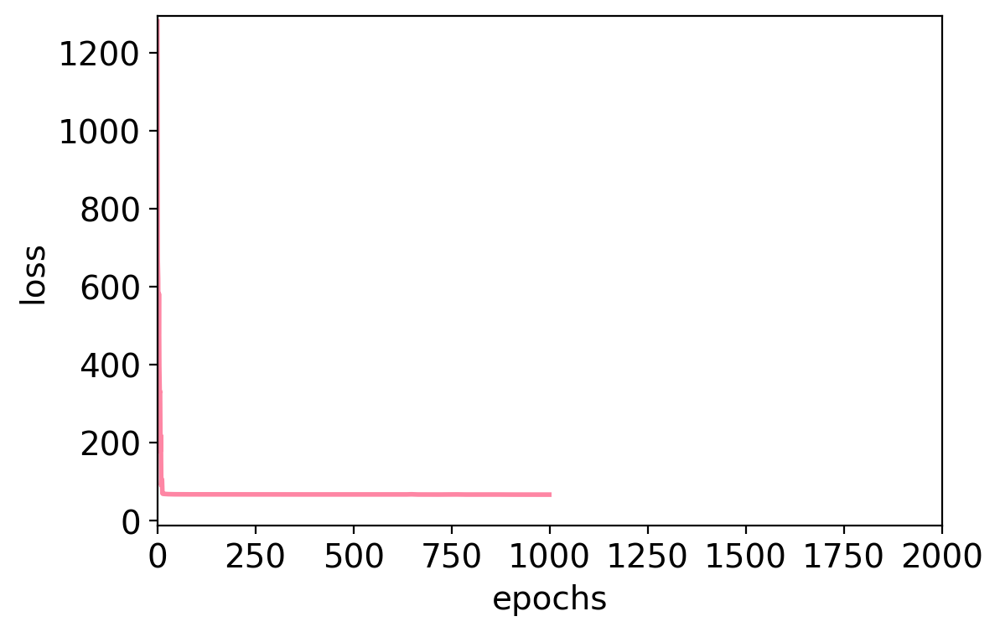

plot losses_ccc


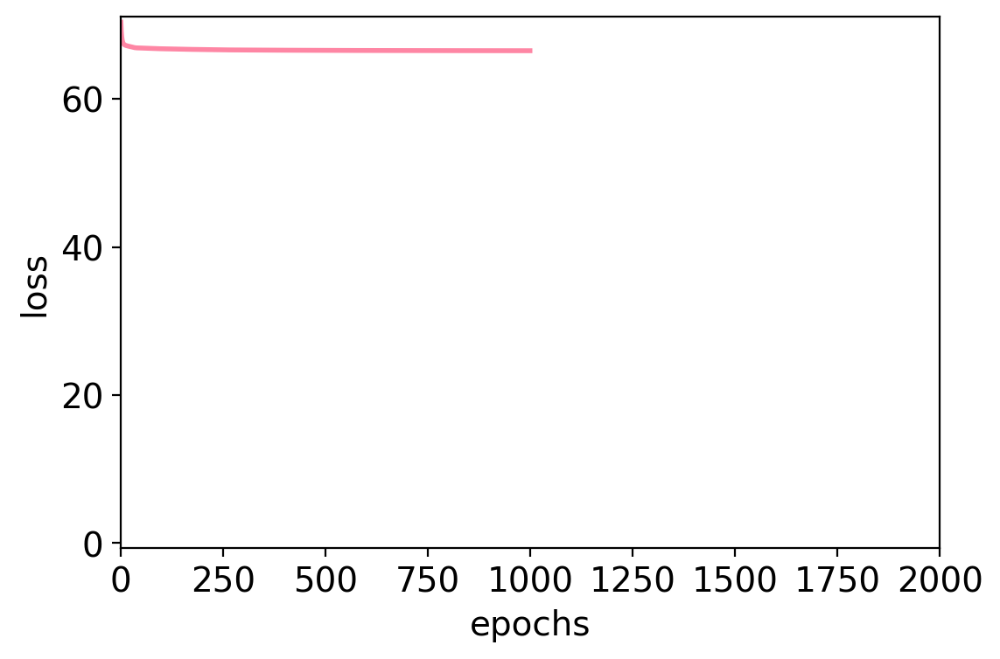

rho=0.25658759001972414
pval=0.04069282741948103
obs_g2g=[[1.   0.86 1.   0.89 0.77 0.42 0.56 0.35]
 [0.86 1.   1.   1.   0.72 0.46 0.76 0.38]
 [1.   1.   1.   0.86 0.42 0.24 0.6  0.74]
 [0.89 1.   0.86 1.   0.28 0.57 0.61 0.23]
 [0.77 0.72 0.42 0.28 1.   0.5  0.63 0.85]
 [0.42 0.46 0.24 0.57 0.5  1.   0.36 0.66]
 [0.56 0.76 0.6  0.61 0.63 0.36 1.   0.  ]
 [0.35 0.38 0.74 0.23 0.85 0.66 0.   1.  ]]
exp_g2g=[[1.   0.32 0.68 0.64 0.54 0.89 0.64 0.29]
 [0.32 1.   0.39 0.71 0.68 0.11 0.5  0.04]
 [0.68 0.39 1.   0.5  0.07 0.54 0.5  0.18]
 [0.64 0.71 0.5  1.   0.86 0.79 0.46 0.89]
 [0.54 0.68 0.07 0.86 1.   0.64 0.75 0.71]
 [0.89 0.11 0.54 0.79 0.64 1.   0.79 0.96]
 [0.64 0.5  0.5  0.46 0.75 0.79 1.   0.57]
 [0.29 0.04 0.18 0.89 0.71 0.96 0.57 1.  ]]
rho=0.02748534580643769
pval=0.8293075508701632
simulation 36; time passed: 473.74002504348755
spearman_corr=-0.9222889302889303
plot losses_scc


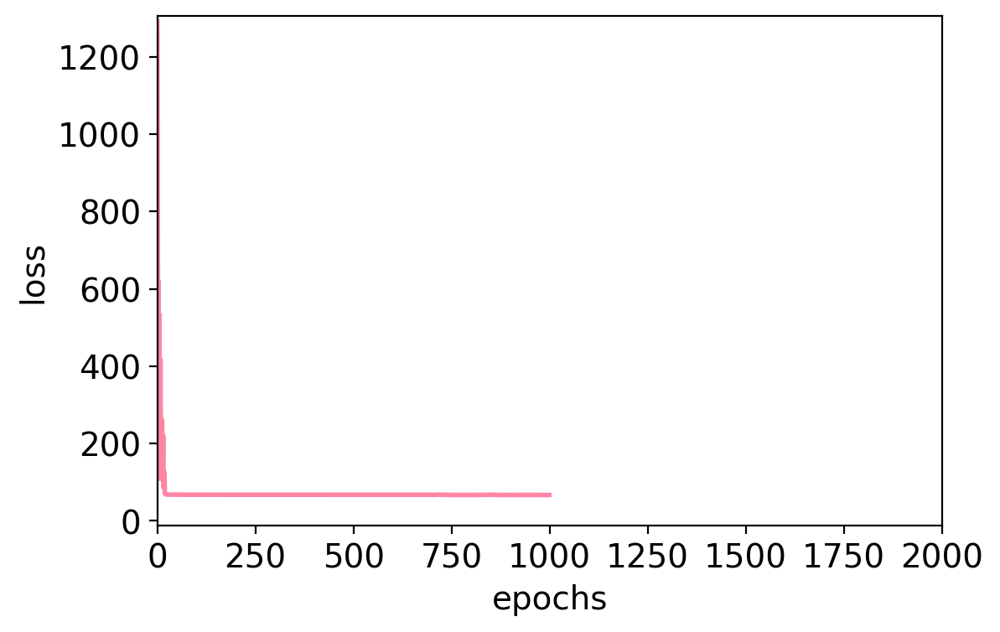

plot losses_ccc


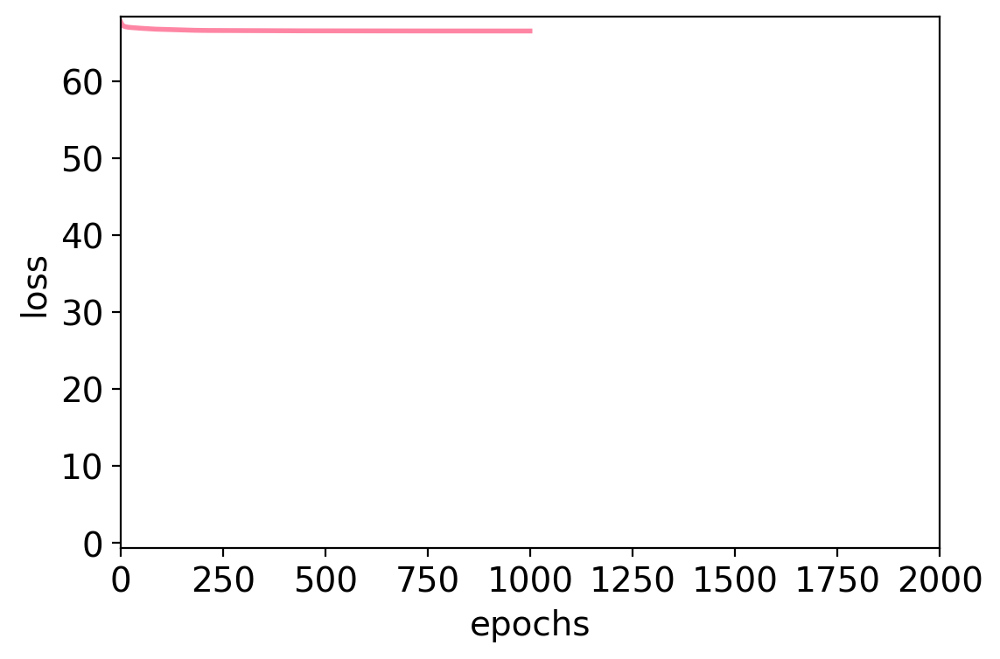

rho=0.5273687681908834
pval=7.554135692497836e-06
obs_g2g=[[1.   1.   0.   0.3  0.87 0.91 0.7  0.82]
 [1.   1.   0.   0.   1.   1.   1.   0.64]
 [0.   0.   1.   0.84 0.47 0.15 0.57 0.22]
 [0.3  0.   0.84 1.   0.6  0.3  0.77 0.32]
 [0.87 1.   0.47 0.6  1.   0.63 0.62 0.73]
 [0.91 1.   0.15 0.3  0.63 1.   0.51 0.71]
 [0.7  1.   0.57 0.77 0.62 0.51 1.   0.12]
 [0.82 0.64 0.22 0.32 0.73 0.71 0.12 1.  ]]
exp_g2g=[[1.   0.96 0.5  0.32 0.86 0.29 0.46 0.68]
 [0.96 1.   0.25 0.36 0.5  0.82 0.57 0.04]
 [0.5  0.25 1.   0.82 0.5  0.5  0.86 0.5 ]
 [0.32 0.36 0.82 1.   0.14 0.96 0.96 0.18]
 [0.86 0.5  0.5  0.14 1.   0.29 0.   0.68]
 [0.29 0.82 0.5  0.96 0.29 1.   0.61 0.68]
 [0.46 0.57 0.86 0.96 0.   0.61 1.   0.68]
 [0.68 0.04 0.5  0.18 0.68 0.68 0.68 1.  ]]
rho=0.050962568846969446
pval=0.6892116464301239
simulation 37; time passed: 487.36233258247375
spearman_corr=-0.9188733483865885
plot losses_scc


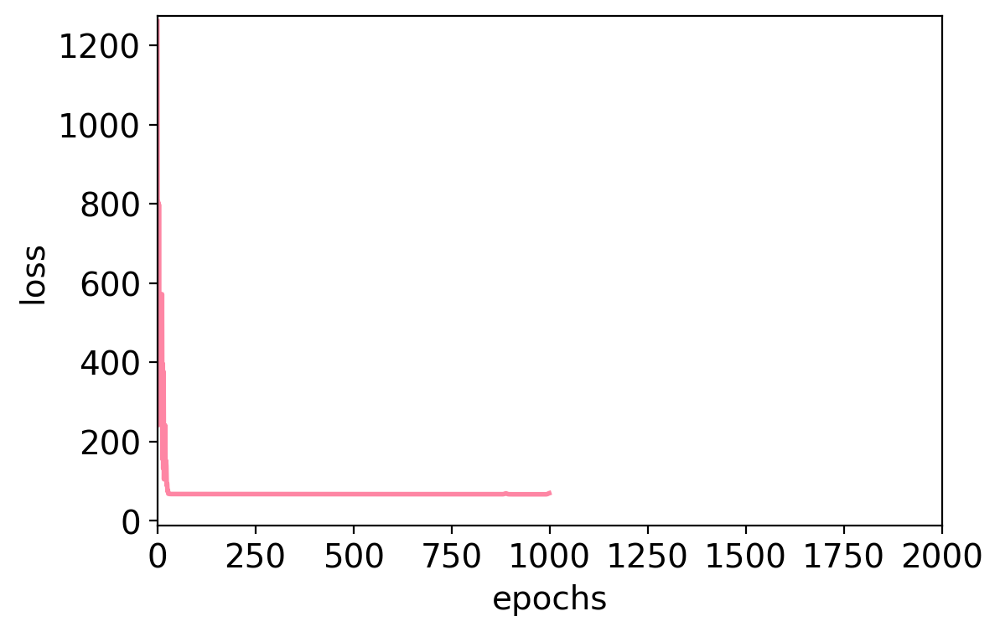

plot losses_ccc


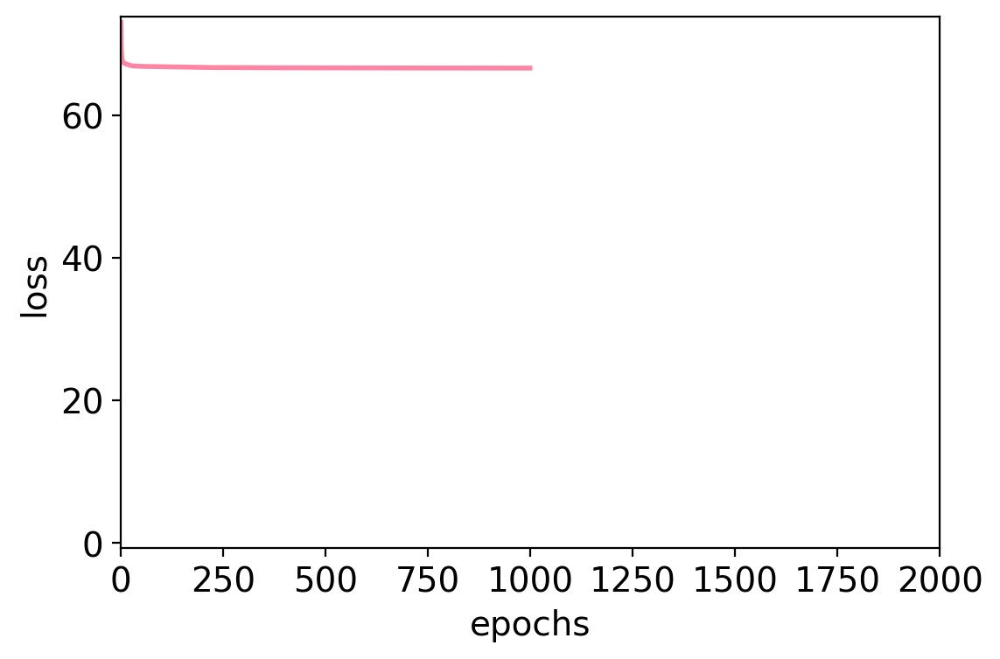

rho=0.4386691952141928
pval=0.00028805566282802685
obs_g2g=[[1.   1.   1.   0.76 0.53 0.31 0.9  0.92]
 [1.   1.   1.   0.23 0.16 0.15 0.77 0.54]
 [1.   1.   1.   0.87 0.36 0.22 1.   0.56]
 [0.76 0.23 0.87 1.   0.89 0.66 0.66 0.94]
 [0.53 0.16 0.36 0.89 1.   0.1  0.47 0.31]
 [0.31 0.15 0.22 0.66 0.1  1.   0.39 0.69]
 [0.9  0.77 1.   0.66 0.47 0.39 1.   0.55]
 [0.92 0.54 0.56 0.94 0.31 0.69 0.55 1.  ]]
exp_g2g=[[1.   0.82 0.82 0.68 0.43 0.11 0.14 0.21]
 [0.82 1.   0.43 0.54 0.86 0.18 0.71 0.96]
 [0.82 0.43 1.   0.36 0.57 0.75 0.86 0.46]
 [0.68 0.54 0.36 1.   0.93 0.29 0.39 0.75]
 [0.43 0.86 0.57 0.93 1.   0.54 0.82 0.14]
 [0.11 0.18 0.75 0.29 0.54 1.   0.39 0.82]
 [0.14 0.71 0.86 0.39 0.82 0.39 1.   0.11]
 [0.21 0.96 0.46 0.75 0.14 0.82 0.11 1.  ]]
rho=0.5391467360098162
pval=4.296900019329008e-06
simulation 38; time passed: 500.3065299987793
spearman_corr=-0.27857516657516657
plot losses_scc


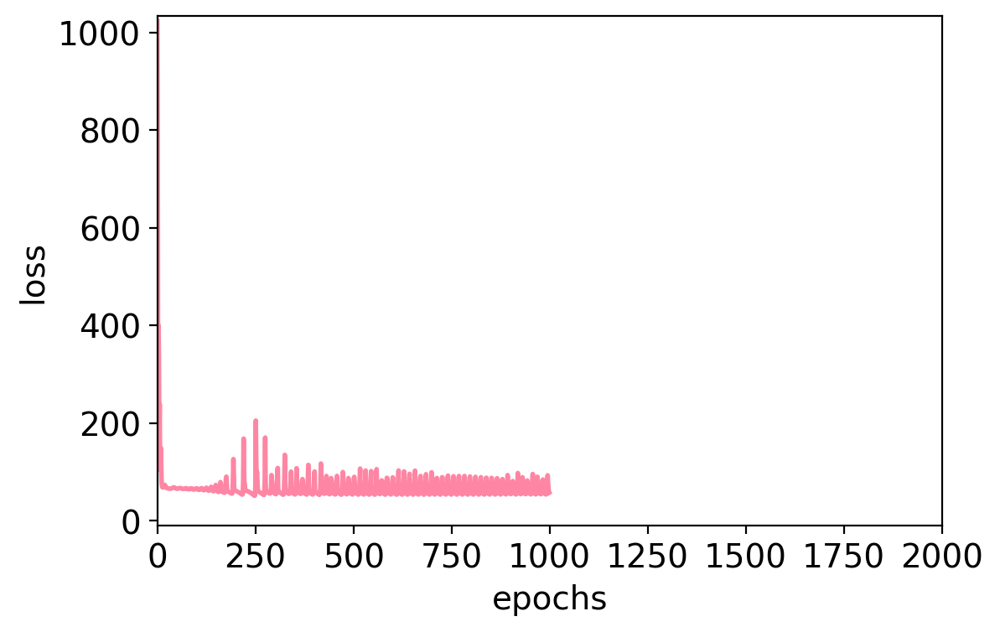

plot losses_ccc


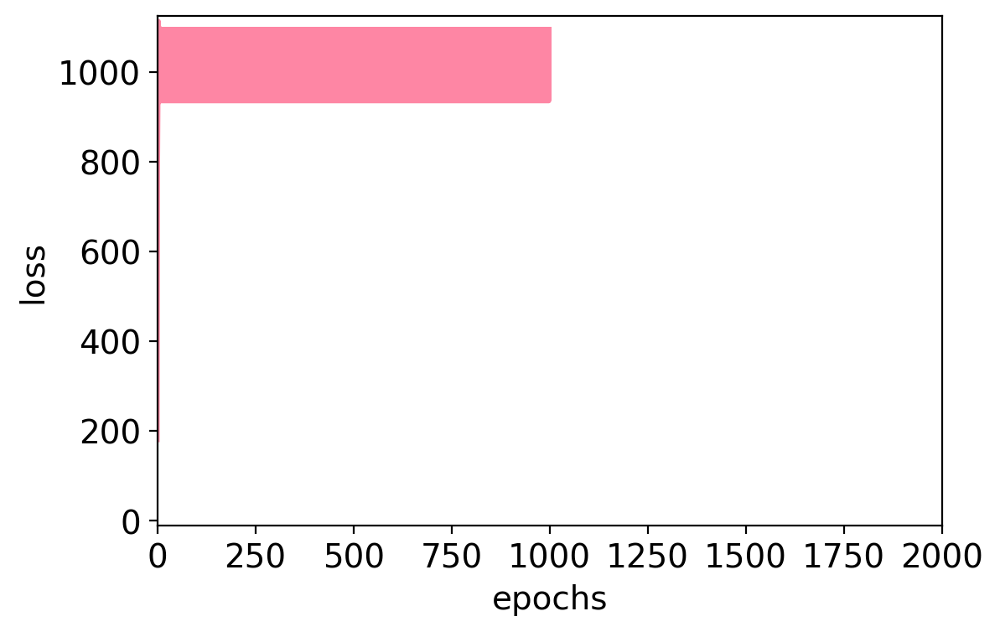

rho=0.12917354635177936
pval=0.30901507240069703
obs_g2g=[[1. 0. 1. 0. 1. 0. 0. 0.]
 [0. 1. 0. 1. 0. 1. 1. 1.]
 [1. 0. 1. 0. 1. 0. 0. 0.]
 [0. 1. 0. 1. 0. 1. 1. 1.]
 [1. 0. 1. 0. 1. 0. 0. 0.]
 [0. 1. 0. 1. 0. 1. 1. 1.]
 [0. 1. 0. 1. 0. 1. 1. 1.]
 [0. 1. 0. 1. 0. 1. 1. 1.]]
exp_g2g=[[1.   0.57 0.39 0.11 0.21 0.93 0.32 0.57]
 [0.57 1.   0.46 0.25 0.32 0.14 0.54 0.29]
 [0.39 0.46 1.   0.79 0.39 0.   0.79 0.5 ]
 [0.11 0.25 0.79 1.   0.32 0.61 0.39 0.25]
 [0.21 0.32 0.39 0.32 1.   0.   0.14 0.75]
 [0.93 0.14 0.   0.61 0.   1.   0.25 0.71]
 [0.32 0.54 0.79 0.39 0.14 0.25 1.   0.64]
 [0.57 0.29 0.5  0.25 0.75 0.71 0.64 1.  ]]
rho=0.12917354635177936
pval=0.30901507240069703
simulation 39; time passed: 513.3598878383636
spearman_corr=-0.9999784059782766
plot losses_scc


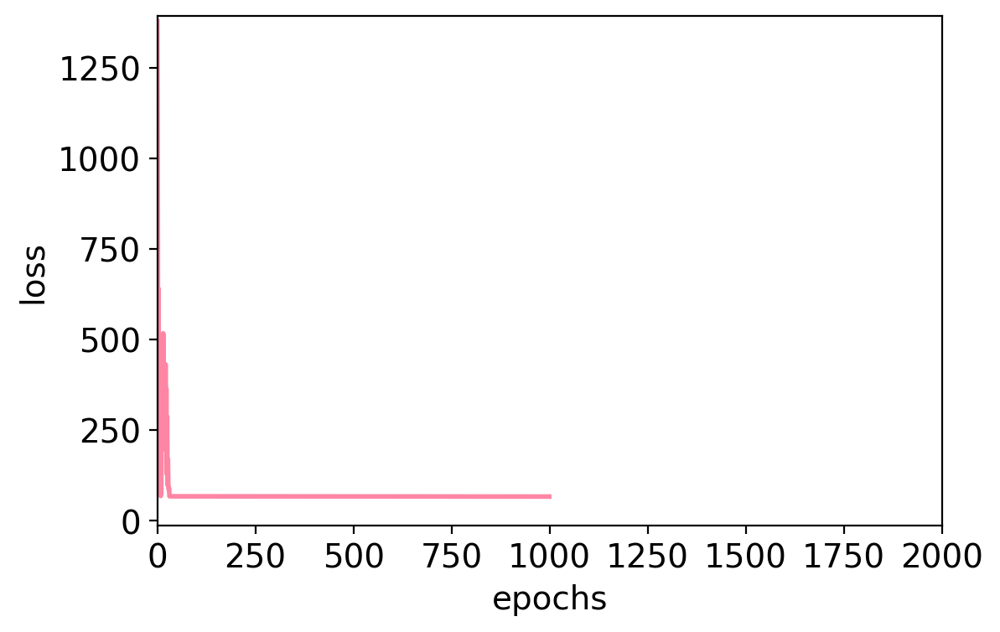

plot losses_ccc


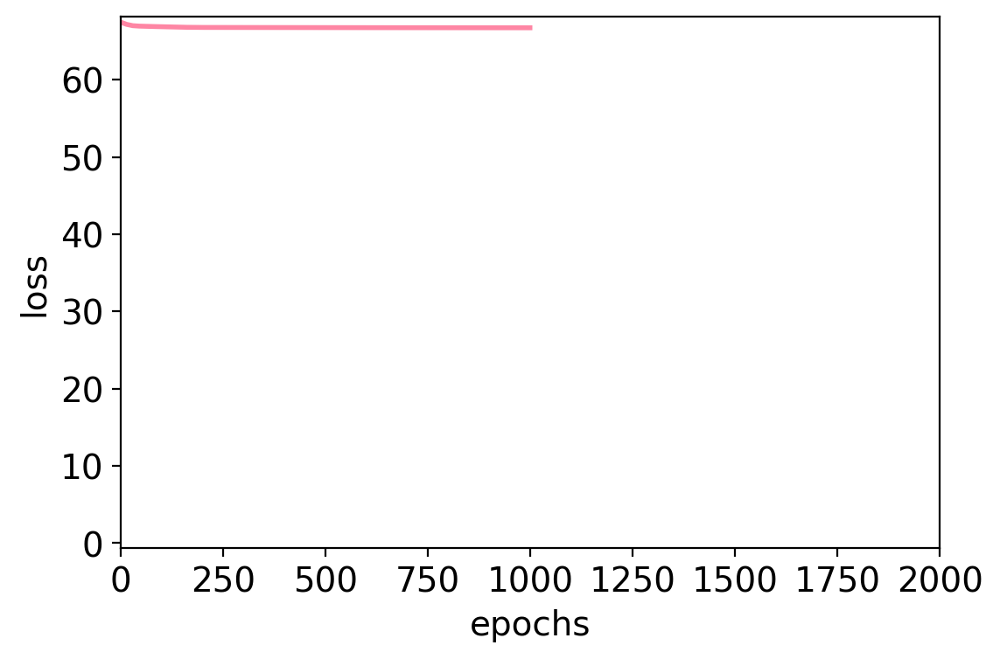

rho=0.48796811432536963
pval=4.311733989150795e-05
obs_g2g=[[1.   1.   1.   0.38 0.   1.   0.   0.61]
 [1.   1.   1.   1.   0.26 0.76 0.36 0.77]
 [1.   1.   1.   0.54 0.28 1.   0.2  0.53]
 [0.38 1.   0.54 1.   0.66 0.97 0.63 0.36]
 [0.   0.26 0.28 0.66 1.   0.77 0.73 0.56]
 [1.   0.76 1.   0.97 0.77 1.   0.7  0.6 ]
 [0.   0.36 0.2  0.63 0.73 0.7  1.   0.66]
 [0.61 0.77 0.53 0.36 0.56 0.6  0.66 1.  ]]
exp_g2g=[[1.   0.36 0.96 0.46 0.14 0.79 0.18 0.93]
 [0.36 1.   0.79 0.79 0.11 0.21 0.5  0.71]
 [0.96 0.79 1.   0.89 0.39 0.07 0.75 0.86]
 [0.46 0.79 0.89 1.   0.79 0.21 0.71 0.04]
 [0.14 0.11 0.39 0.79 1.   0.79 0.79 0.57]
 [0.79 0.21 0.07 0.21 0.79 1.   0.43 0.21]
 [0.18 0.5  0.75 0.71 0.79 0.43 1.   0.61]
 [0.93 0.71 0.86 0.04 0.57 0.21 0.61 1.  ]]
rho=0.5545958565175598
pval=1.983292098515254e-06
simulation 40; time passed: 526.3513660430908
spearman_corr=-0.8637587149412672
plot losses_scc


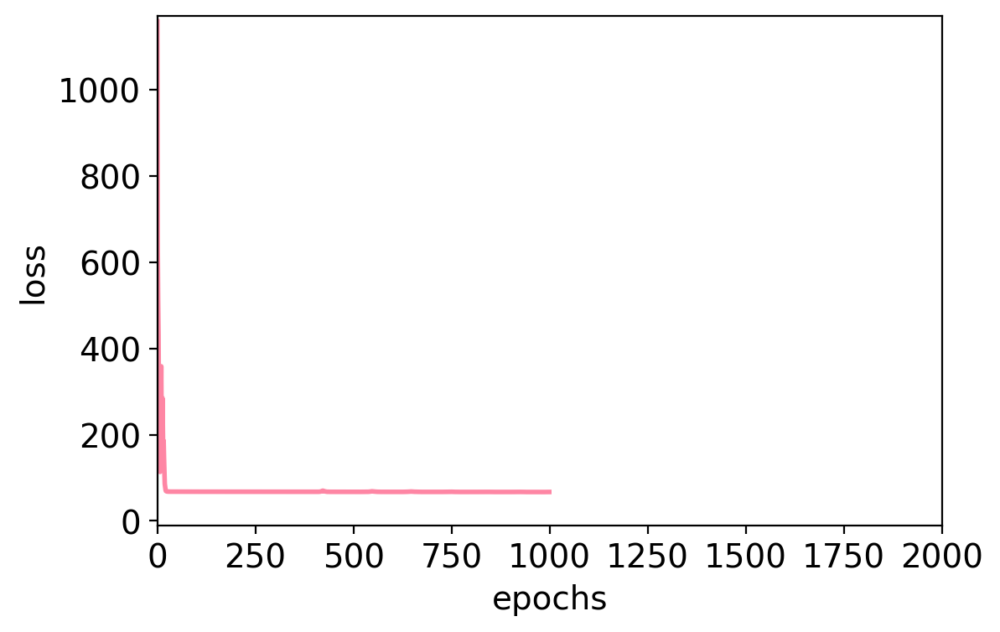

plot losses_ccc


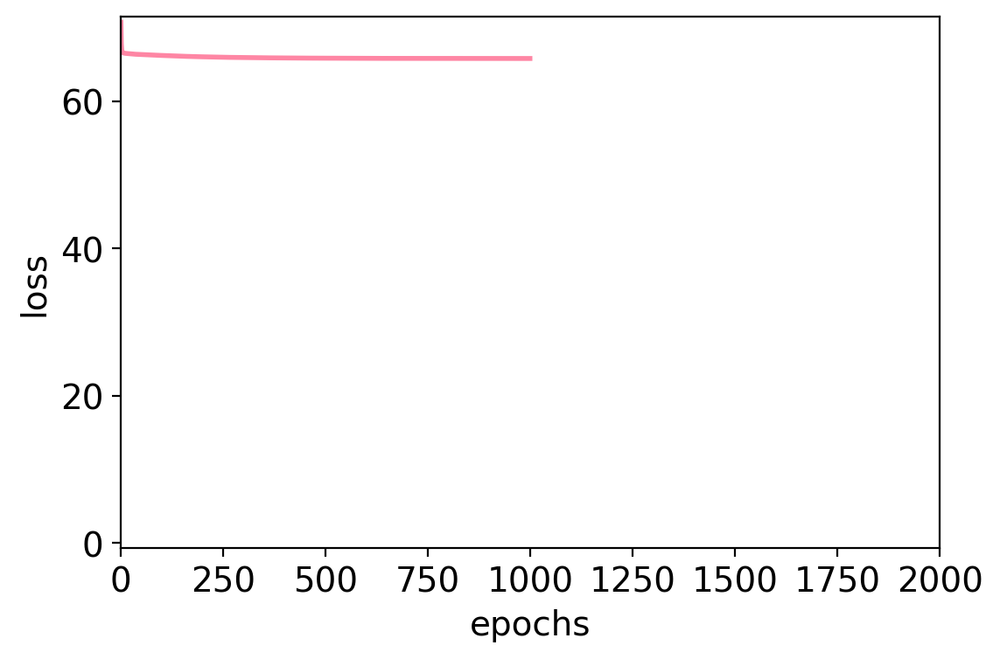

rho=0.09942175223212195
pval=0.43442776569897457
obs_g2g=[[1.   1.   1.   1.   1.   1.   0.9  0.66]
 [1.   1.   1.   1.   1.   1.   0.9  0.75]
 [1.   1.   1.   0.74 1.   0.97 0.48 0.67]
 [1.   1.   0.74 1.   1.   0.95 0.72 0.53]
 [1.   1.   1.   1.   1.   0.99 0.62 0.88]
 [1.   1.   0.97 0.95 0.99 1.   0.71 0.9 ]
 [0.9  0.9  0.48 0.72 0.62 0.71 1.   0.09]
 [0.66 0.75 0.67 0.53 0.88 0.9  0.09 1.  ]]
exp_g2g=[[1.   0.75 0.21 0.36 0.   0.96 0.25 0.  ]
 [0.75 1.   0.54 0.07 0.86 0.11 0.86 0.89]
 [0.21 0.54 1.   0.5  0.54 0.54 0.75 0.57]
 [0.36 0.07 0.5  1.   0.46 0.21 0.96 0.14]
 [0.   0.86 0.54 0.46 1.   0.5  0.96 0.36]
 [0.96 0.11 0.54 0.21 0.5  1.   0.14 0.86]
 [0.25 0.86 0.75 0.96 0.96 0.14 1.   0.68]
 [0.   0.89 0.57 0.14 0.36 0.86 0.68 1.  ]]
rho=-0.04875613032606334
pval=0.702024405924274
simulation 41; time passed: 539.5065014362335
spearman_corr=-0.9179856954936098
plot losses_scc


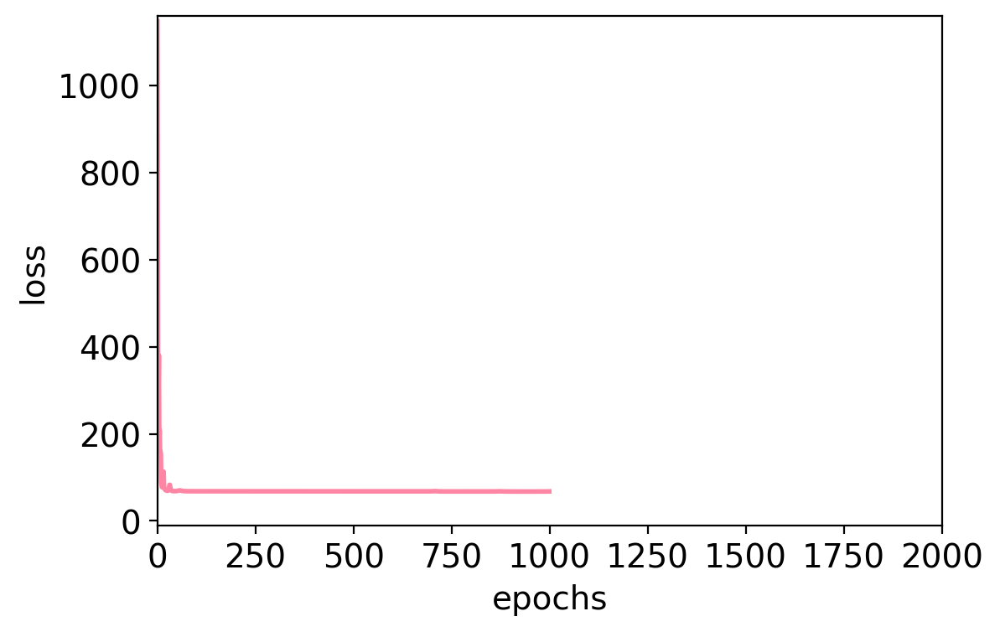

plot losses_ccc


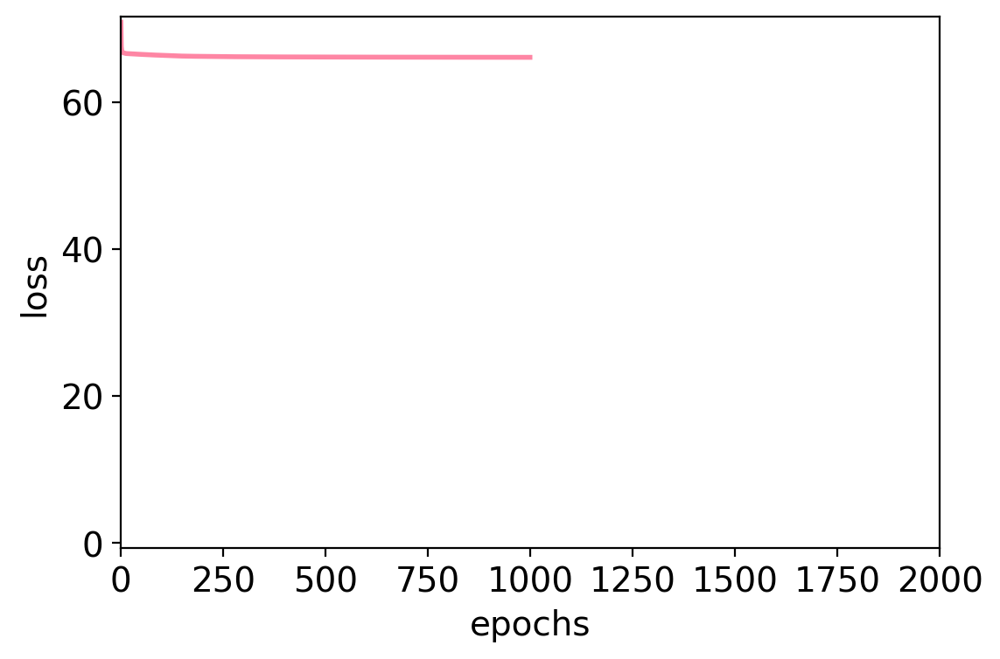

rho=0.4919712406065379
pval=3.647404709826646e-05
obs_g2g=[[1.   1.   0.   0.45 0.65 0.38 0.46 0.18]
 [1.   1.   0.02 0.71 0.33 0.   0.05 0.15]
 [0.   0.02 1.   0.43 0.69 0.93 0.86 0.34]
 [0.45 0.71 0.43 1.   0.93 1.   0.67 0.11]
 [0.65 0.33 0.69 0.93 1.   0.72 0.61 0.45]
 [0.38 0.   0.93 1.   0.72 1.   0.94 0.38]
 [0.46 0.05 0.86 0.67 0.61 0.94 1.   0.78]
 [0.18 0.15 0.34 0.11 0.45 0.38 0.78 1.  ]]
exp_g2g=[[1.   0.57 0.25 0.32 0.25 0.68 0.   0.79]
 [0.57 1.   0.36 0.57 0.57 0.75 0.   0.25]
 [0.25 0.36 1.   0.   0.04 0.79 0.57 0.86]
 [0.32 0.57 0.   1.   0.43 0.96 0.43 0.79]
 [0.25 0.57 0.04 0.43 1.   0.07 0.82 0.14]
 [0.68 0.75 0.79 0.96 0.07 1.   0.89 0.  ]
 [0.   0.   0.57 0.43 0.82 0.89 1.   0.82]
 [0.79 0.25 0.86 0.79 0.14 0.   0.82 1.  ]]
rho=0.2677443115804103
pval=0.03243906958673977
simulation 42; time passed: 552.6509947776794
spearman_corr=-0.7060567300567302
plot losses_scc


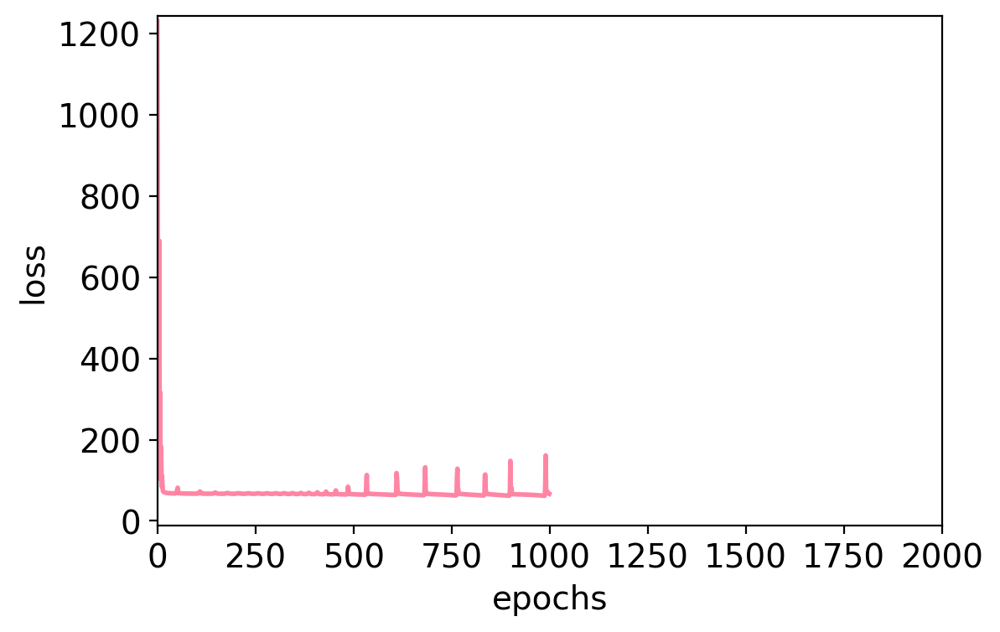

plot losses_ccc


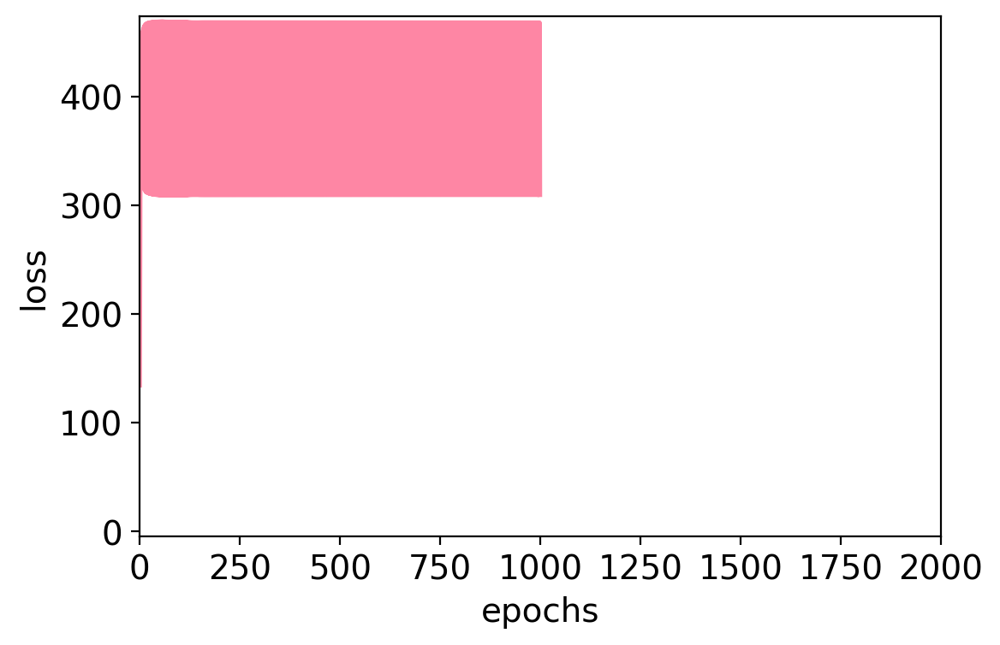

rho=0.0076821539213653926
pval=0.9519590536174438
obs_g2g=[[1.   1.   0.   1.   0.   0.   0.   0.  ]
 [1.   1.   0.   1.   0.25 0.   0.   0.  ]
 [0.   0.   1.   0.   1.   1.   1.   1.  ]
 [1.   1.   0.   1.   0.73 0.   0.   0.  ]
 [0.   0.25 1.   0.73 1.   1.   1.   1.  ]
 [0.   0.   1.   0.   1.   1.   1.   1.  ]
 [0.   0.   1.   0.   1.   1.   1.   1.  ]
 [0.   0.   1.   0.   1.   1.   1.   1.  ]]
exp_g2g=[[1.   0.11 0.71 0.71 0.68 0.5  0.64 0.46]
 [0.11 1.   0.54 0.82 0.07 0.43 0.61 0.25]
 [0.71 0.54 1.   0.71 0.43 0.89 0.29 0.11]
 [0.71 0.82 0.71 1.   0.14 0.43 0.64 0.75]
 [0.68 0.07 0.43 0.14 1.   0.54 0.39 0.29]
 [0.5  0.43 0.89 0.43 0.54 1.   0.11 0.  ]
 [0.64 0.61 0.29 0.64 0.39 0.11 1.   0.71]
 [0.46 0.25 0.11 0.75 0.29 0.   0.71 1.  ]]
rho=0.016975003204480307
pval=0.8940881459532075
simulation 43; time passed: 565.8307757377625
spearman_corr=-0.9388076173390001
plot losses_scc


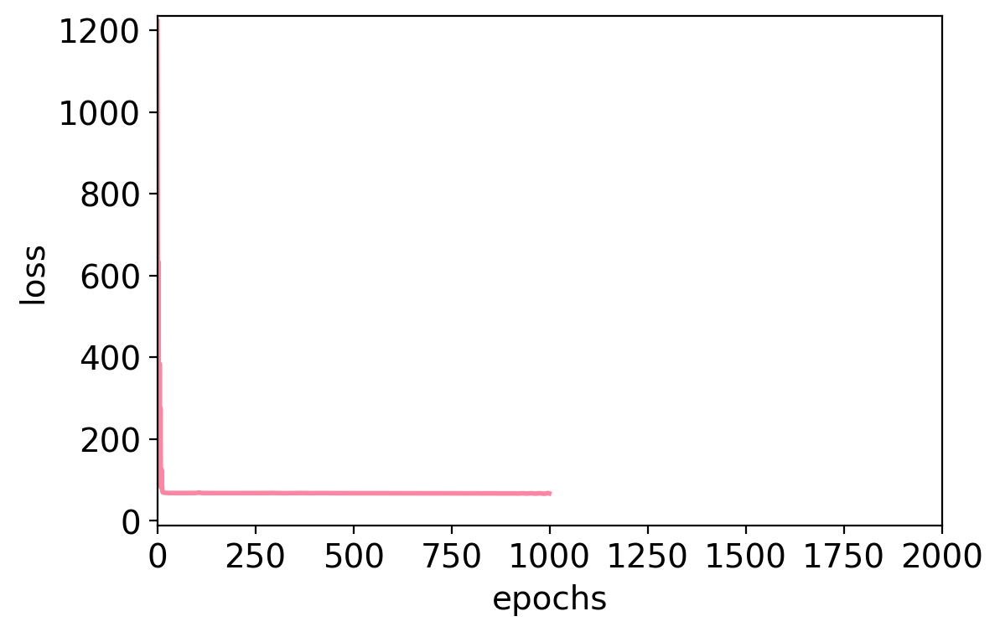

plot losses_ccc


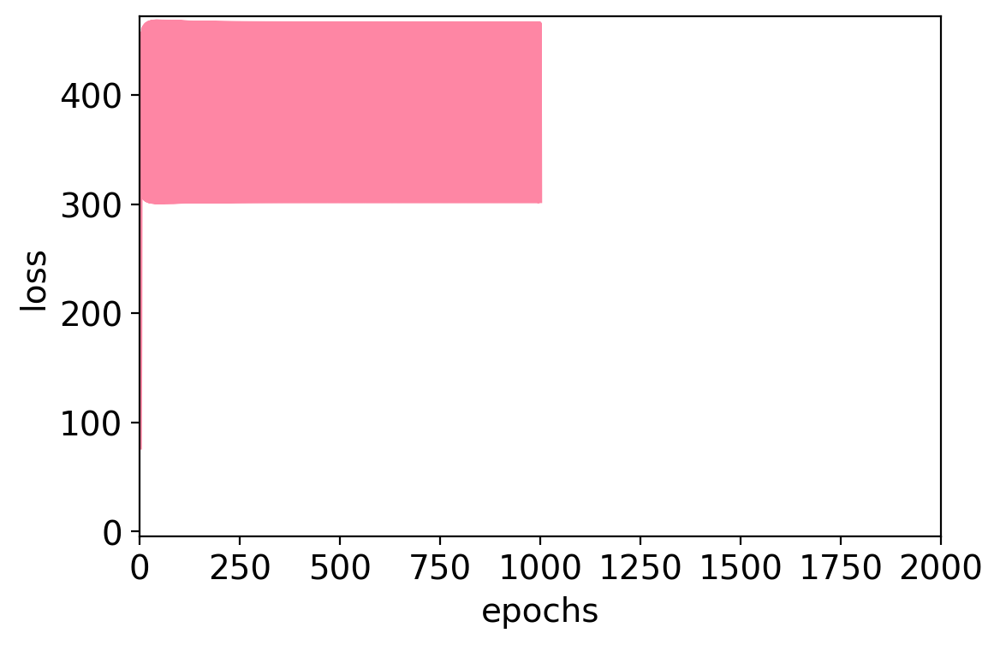

rho=0.06134016253961234
pval=0.6301587522223295
obs_g2g=[[1. 0. 0. 1. 1. 0. 0. 0.]
 [0. 1. 1. 0. 0. 1. 1. 1.]
 [0. 1. 1. 0. 0. 1. 1. 1.]
 [1. 0. 0. 1. 1. 0. 0. 0.]
 [1. 0. 0. 1. 1. 0. 0. 0.]
 [0. 1. 1. 0. 0. 1. 1. 1.]
 [0. 1. 1. 0. 0. 1. 1. 1.]
 [0. 1. 1. 0. 0. 1. 1. 1.]]
exp_g2g=[[1.   0.25 0.25 0.39 0.39 0.96 0.79 0.64]
 [0.25 1.   0.14 0.79 0.43 0.64 0.61 0.18]
 [0.25 0.14 1.   0.25 0.39 0.39 0.39 0.36]
 [0.39 0.79 0.25 1.   0.11 0.04 0.82 0.39]
 [0.39 0.43 0.39 0.11 1.   0.93 0.54 0.5 ]
 [0.96 0.64 0.39 0.04 0.93 1.   0.96 0.32]
 [0.79 0.61 0.39 0.82 0.54 0.96 1.   0.82]
 [0.64 0.18 0.36 0.39 0.5  0.32 0.82 1.  ]]
rho=0.02933654686013414
pval=0.8180014215522555
simulation 44; time passed: 579.012610912323
spearman_corr=-0.9999668619666633
plot losses_scc


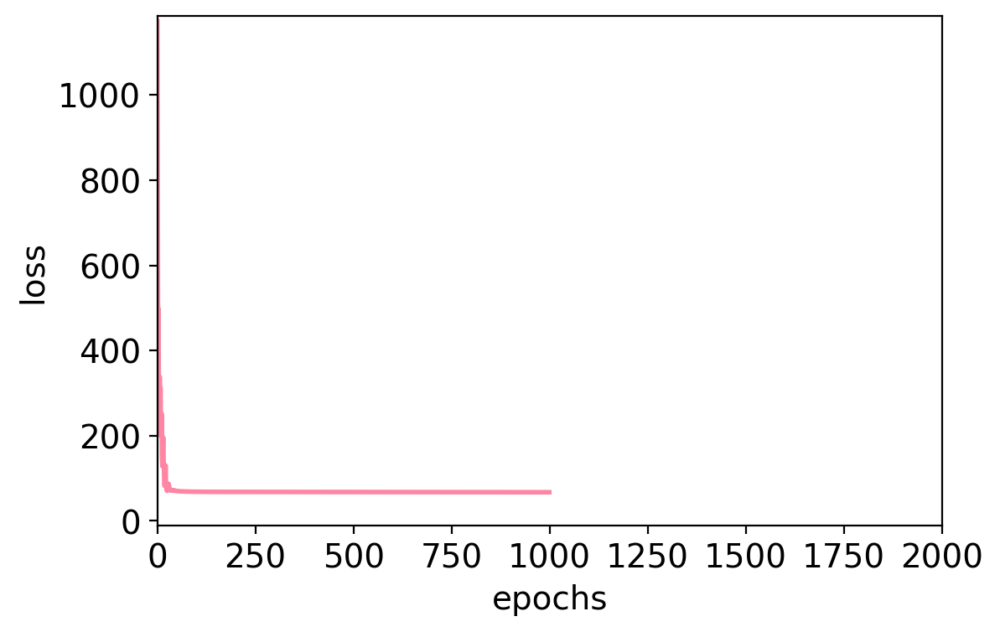

plot losses_ccc


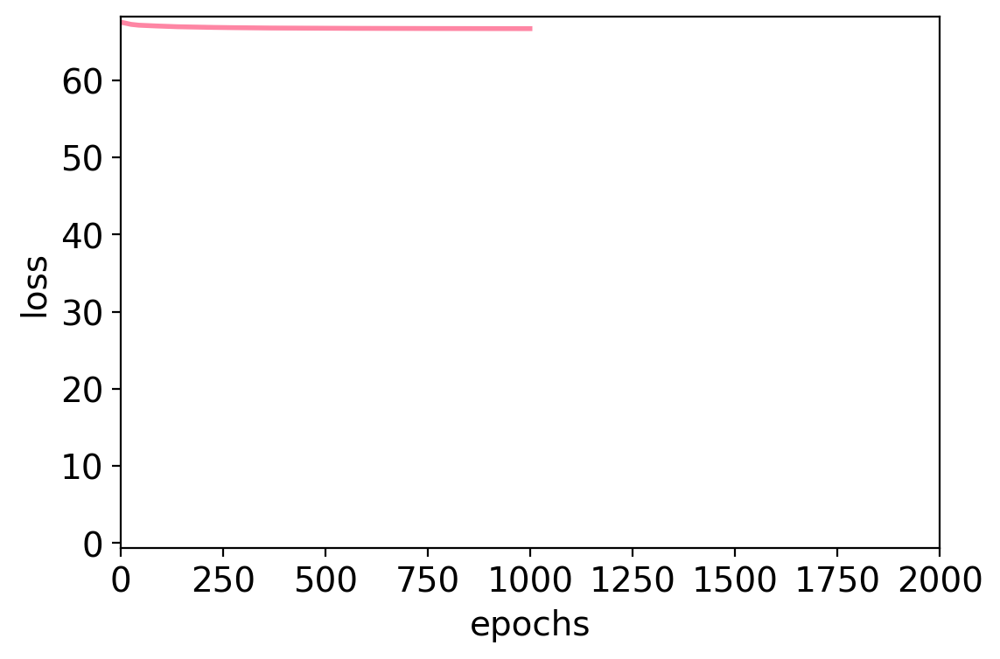

rho=0.1550181021382789
pval=0.22128729320221588
obs_g2g=[[1.   1.   1.   0.78 1.   0.6  1.   0.39]
 [1.   1.   0.73 0.45 0.99 0.04 0.56 0.64]
 [1.   0.73 1.   1.   1.   0.36 1.   0.93]
 [0.78 0.45 1.   1.   0.45 0.13 0.76 0.35]
 [1.   0.99 1.   0.45 1.   0.49 1.   0.42]
 [0.6  0.04 0.36 0.13 0.49 1.   0.45 0.36]
 [1.   0.56 1.   0.76 1.   0.45 1.   0.66]
 [0.39 0.64 0.93 0.35 0.42 0.36 0.66 1.  ]]
exp_g2g=[[1.   0.75 0.86 0.11 0.25 0.18 0.14 0.75]
 [0.75 1.   0.11 0.68 0.79 0.11 0.54 0.75]
 [0.86 0.11 1.   0.89 0.5  0.89 0.57 0.04]
 [0.11 0.68 0.89 1.   0.21 0.93 0.68 0.29]
 [0.25 0.79 0.5  0.21 1.   0.29 0.21 0.86]
 [0.18 0.11 0.89 0.93 0.29 1.   0.32 0.79]
 [0.14 0.54 0.57 0.68 0.21 0.32 1.   0.71]
 [0.75 0.75 0.04 0.29 0.86 0.79 0.71 1.  ]]
rho=0.0805466458963611
pval=0.5269280207841833
simulation 45; time passed: 592.1301305294037
spearman_corr=-0.5555876675876676
plot losses_scc


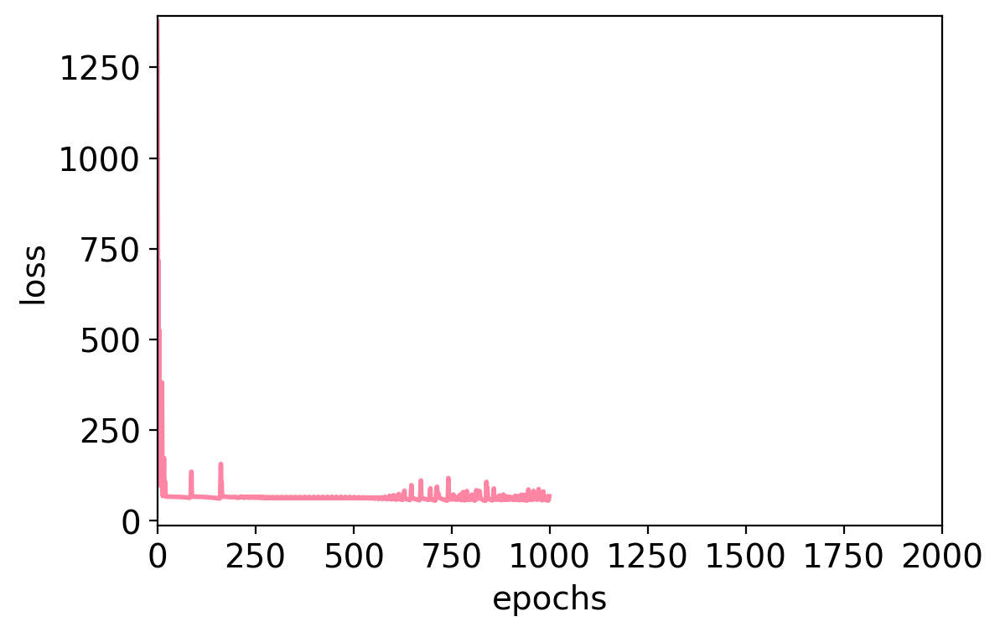

plot losses_ccc


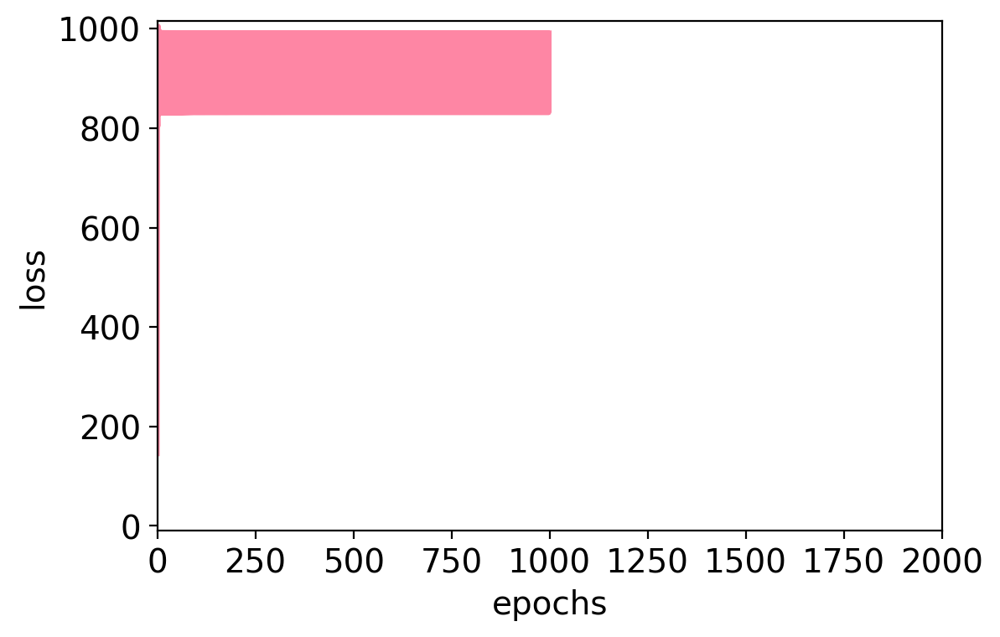

rho=0.17788172076849978
pval=0.15964999904208882
obs_g2g=[[1.   1.   1.   0.   0.   1.   0.   0.  ]
 [1.   1.   1.   0.   0.   0.27 0.   0.  ]
 [1.   1.   1.   0.   0.   1.   0.   0.  ]
 [0.   0.   0.   1.   1.   0.   1.   1.  ]
 [0.   0.   0.   1.   1.   0.91 1.   1.  ]
 [1.   0.27 1.   0.   0.91 1.   0.44 0.  ]
 [0.   0.   0.   1.   1.   0.44 1.   1.  ]
 [0.   0.   0.   1.   1.   0.   1.   1.  ]]
exp_g2g=[[1.   0.21 0.61 0.61 0.57 0.93 0.25 0.96]
 [0.21 1.   0.79 0.07 0.18 0.5  0.64 0.89]
 [0.61 0.79 1.   0.82 0.   0.11 0.86 0.61]
 [0.61 0.07 0.82 1.   0.   0.68 0.04 0.86]
 [0.57 0.18 0.   0.   1.   0.07 0.71 0.64]
 [0.93 0.5  0.11 0.68 0.07 1.   0.46 0.79]
 [0.25 0.64 0.86 0.04 0.71 0.46 1.   0.82]
 [0.96 0.89 0.61 0.86 0.64 0.79 0.82 1.  ]]
rho=0.1587730424704161
pval=0.21016329312040966
simulation 46; time passed: 605.2967193126678
spearman_corr=-0.9960829438714228
plot losses_scc


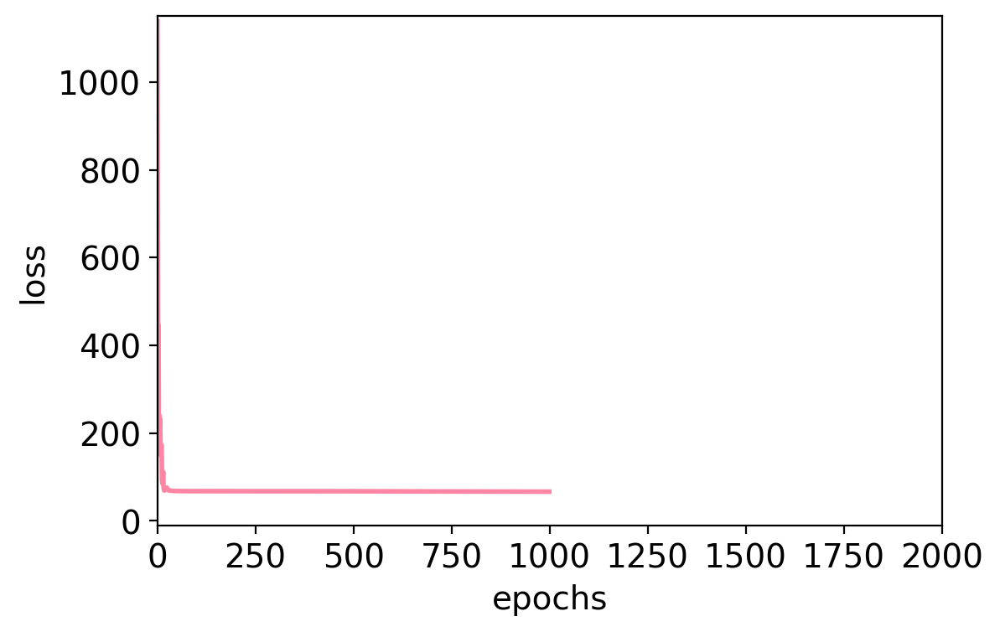

plot losses_ccc


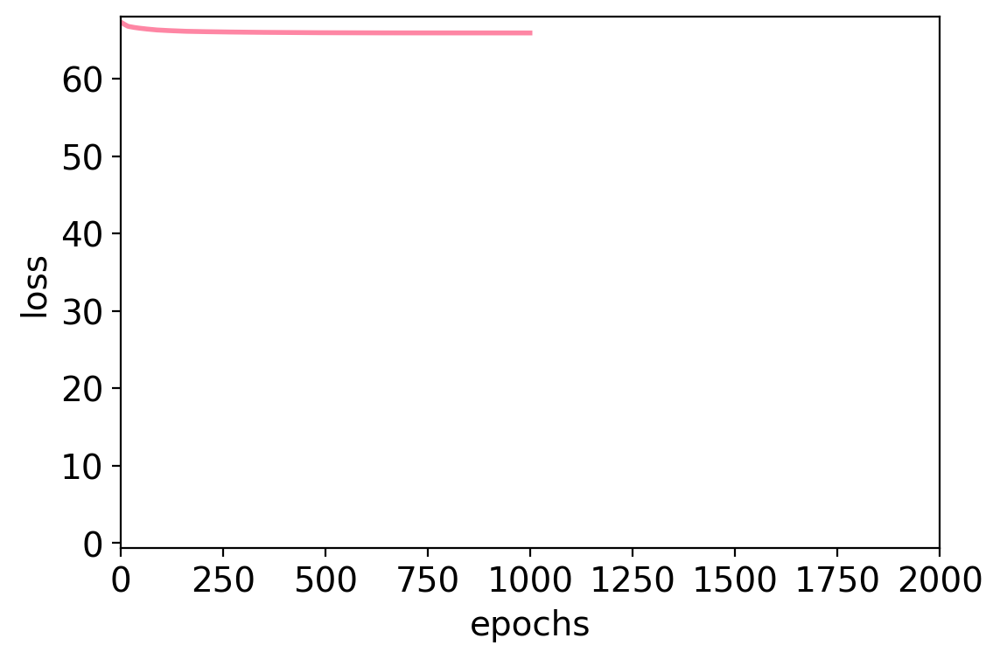

rho=0.3672802516565725
pval=0.0028318282517615983
obs_g2g=[[1.   1.   0.   1.   1.   1.   1.   1.  ]
 [1.   1.   0.   1.   1.   0.76 1.   0.42]
 [0.   0.   1.   0.   0.   0.32 0.02 0.61]
 [1.   1.   0.   1.   1.   1.   0.92 1.  ]
 [1.   1.   0.   1.   1.   0.79 1.   1.  ]
 [1.   0.76 0.32 1.   0.79 1.   1.   1.  ]
 [1.   1.   0.02 0.92 1.   1.   1.   1.  ]
 [1.   0.42 0.61 1.   1.   1.   1.   1.  ]]
exp_g2g=[[1.   0.89 0.04 0.57 0.21 0.43 0.04 0.86]
 [0.89 1.   0.14 0.29 0.54 0.07 0.82 0.57]
 [0.04 0.14 1.   0.86 0.04 0.46 0.54 0.32]
 [0.57 0.29 0.86 1.   0.93 0.32 0.54 0.89]
 [0.21 0.54 0.04 0.93 1.   0.61 0.57 0.07]
 [0.43 0.07 0.46 0.32 0.61 1.   0.96 0.  ]
 [0.04 0.82 0.54 0.54 0.57 0.96 1.   0.86]
 [0.86 0.57 0.32 0.89 0.07 0.   0.86 1.  ]]
rho=0.17953215837306502
pval=0.15574962277267373
simulation 47; time passed: 618.4890866279602
spearman_corr=-0.47703174903174905
plot losses_scc


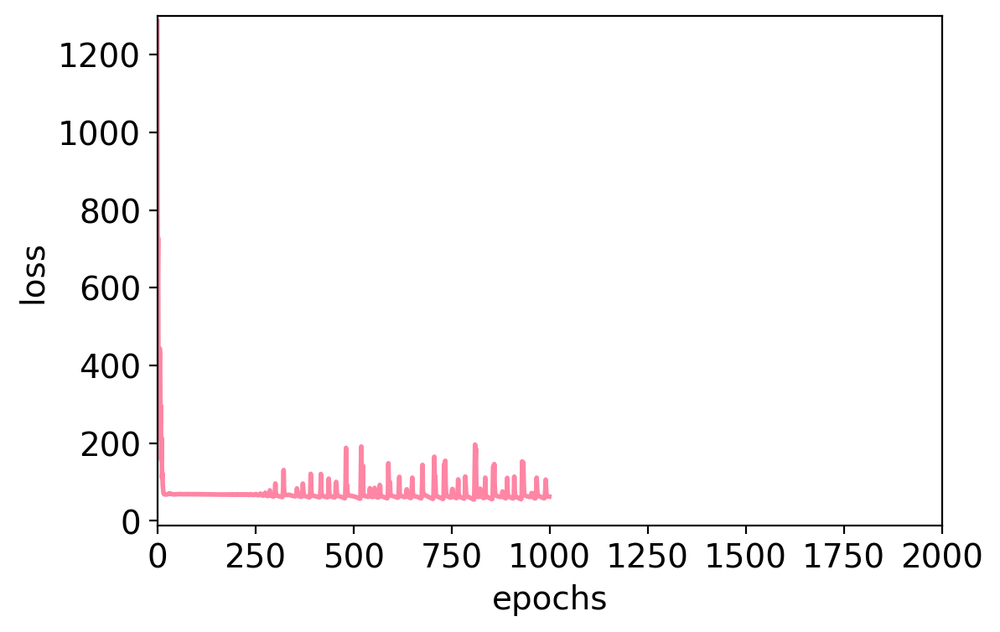

plot losses_ccc


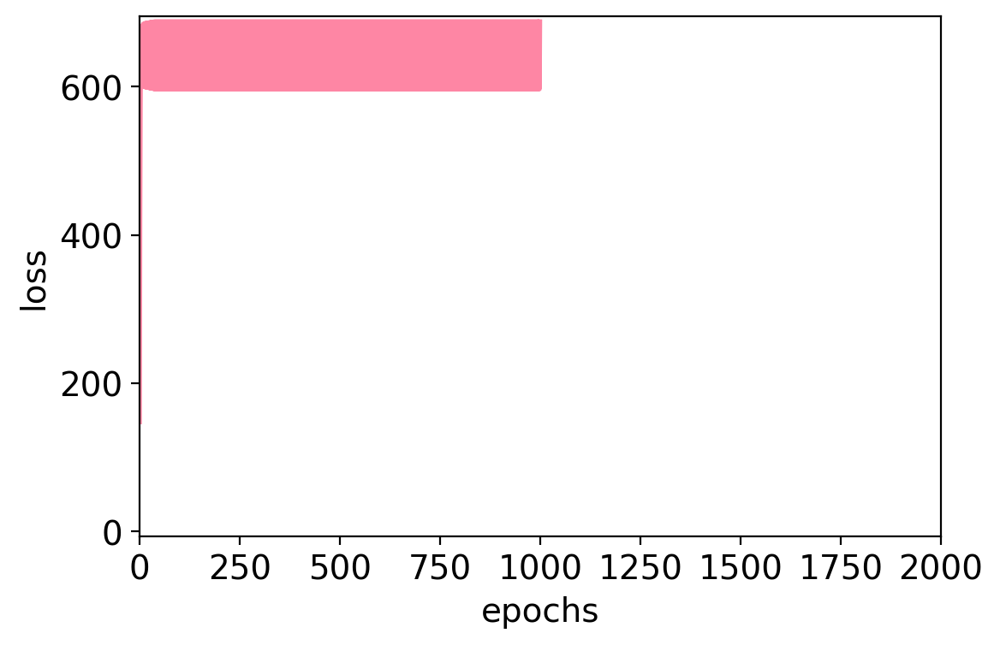

rho=0.303230984654269
pval=0.014863703289399836
obs_g2g=[[1.   0.   1.   0.   0.   1.   1.   0.  ]
 [0.   1.   1.   0.   0.   1.   0.86 0.  ]
 [1.   1.   1.   1.   1.   0.   0.   1.  ]
 [0.   0.   1.   1.   0.   1.   1.   0.  ]
 [0.   0.   1.   0.   1.   1.   0.61 0.14]
 [1.   1.   0.   1.   1.   1.   0.2  1.  ]
 [1.   0.86 0.   1.   0.61 0.2  1.   0.26]
 [0.   0.   1.   0.   0.14 1.   0.26 1.  ]]
exp_g2g=[[1.   0.11 0.39 0.07 0.29 0.54 0.82 0.68]
 [0.11 1.   0.64 0.75 0.71 0.71 0.07 0.25]
 [0.39 0.64 1.   0.71 0.75 0.39 0.89 0.86]
 [0.07 0.75 0.71 1.   0.82 0.36 0.86 0.89]
 [0.29 0.71 0.75 0.82 1.   0.46 0.64 0.18]
 [0.54 0.71 0.39 0.36 0.46 1.   0.25 0.18]
 [0.82 0.07 0.89 0.86 0.64 0.25 1.   0.29]
 [0.68 0.25 0.86 0.89 0.18 0.18 0.29 1.  ]]
rho=0.3070330045192576
pval=0.013595504125732991
simulation 48; time passed: 631.7127590179443
spearman_corr=-0.7177182817182818
plot losses_scc


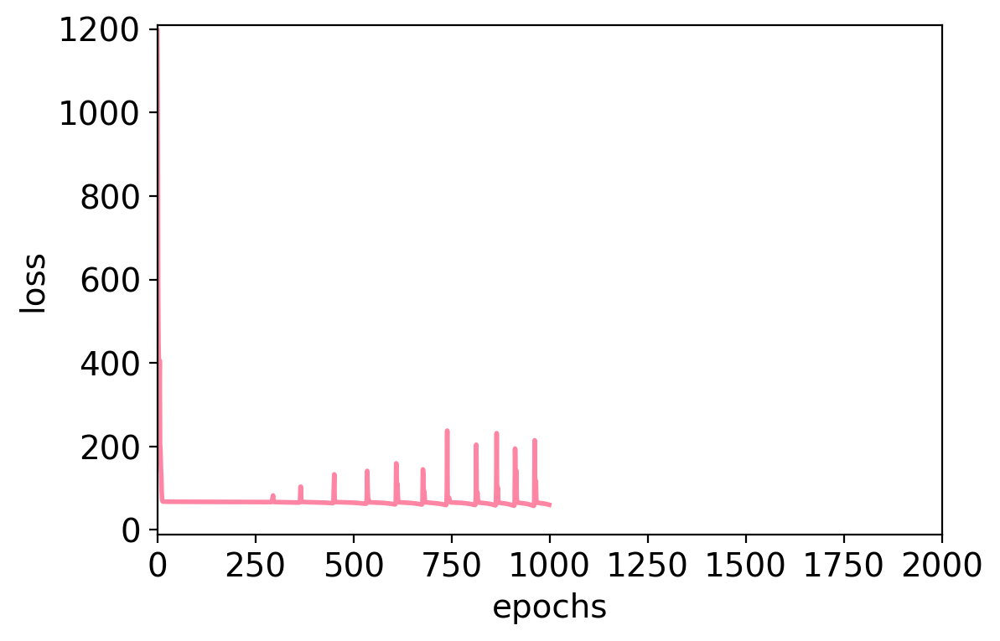

plot losses_ccc


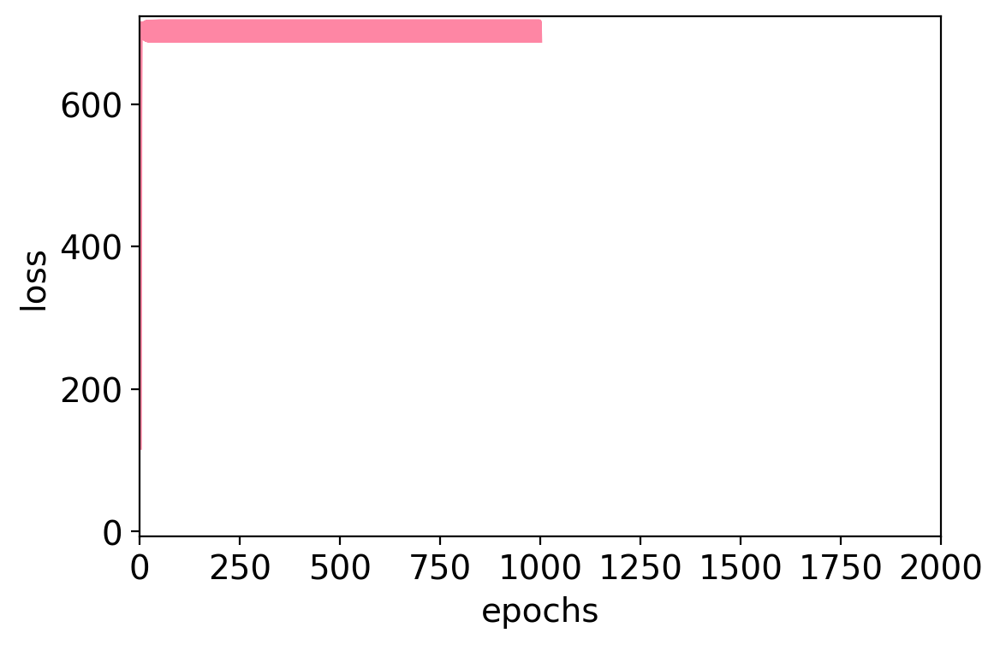

rho=0.15262745757623175
pval=0.2285804497942089
obs_g2g=[[1. 1. 0. 1. 0. 0. 0. 1.]
 [1. 1. 0. 1. 0. 0. 0. 1.]
 [0. 0. 1. 0. 1. 1. 1. 0.]
 [1. 1. 0. 1. 0. 0. 0. 1.]
 [0. 0. 1. 0. 1. 1. 1. 0.]
 [0. 0. 1. 0. 1. 1. 1. 0.]
 [0. 0. 1. 0. 1. 1. 1. 0.]
 [1. 1. 0. 1. 0. 0. 0. 1.]]
exp_g2g=[[1.   0.96 0.79 0.11 0.11 0.46 0.61 0.93]
 [0.96 1.   0.64 0.29 0.14 0.75 0.07 0.07]
 [0.79 0.64 1.   0.5  0.11 0.25 0.57 0.29]
 [0.11 0.29 0.5  1.   0.21 0.82 0.43 0.21]
 [0.11 0.14 0.11 0.21 1.   0.82 0.04 0.93]
 [0.46 0.75 0.25 0.82 0.82 1.   0.89 0.43]
 [0.61 0.07 0.57 0.43 0.04 0.89 1.   0.43]
 [0.93 0.07 0.29 0.21 0.93 0.43 0.43 1.  ]]
rho=0.15262745757623175
pval=0.2285804497942089
simulation 49; time passed: 644.9081408977509
spearman_corr=-0.867840475461604
plot losses_scc


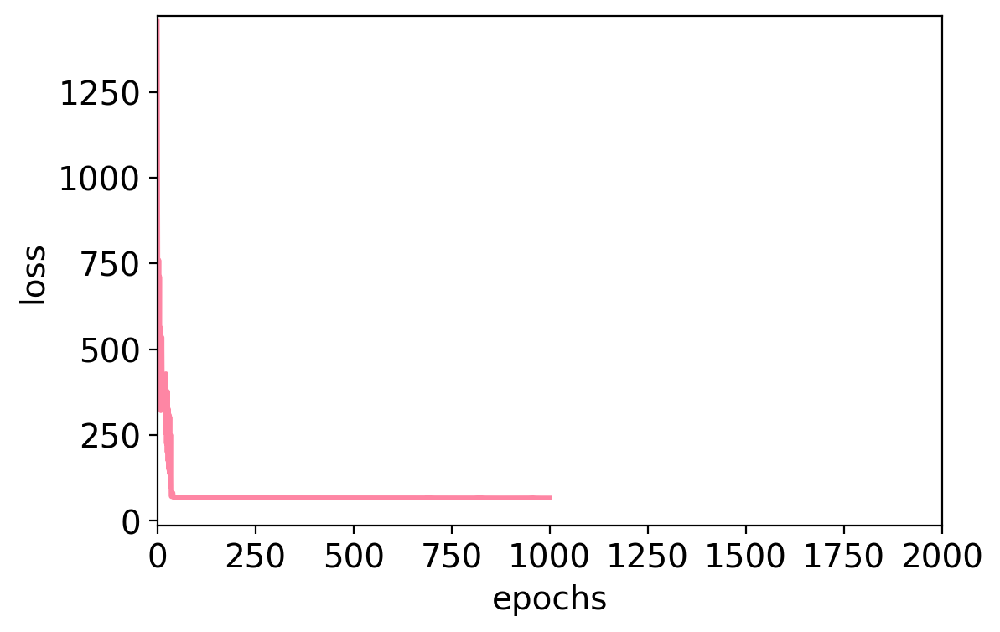

plot losses_ccc


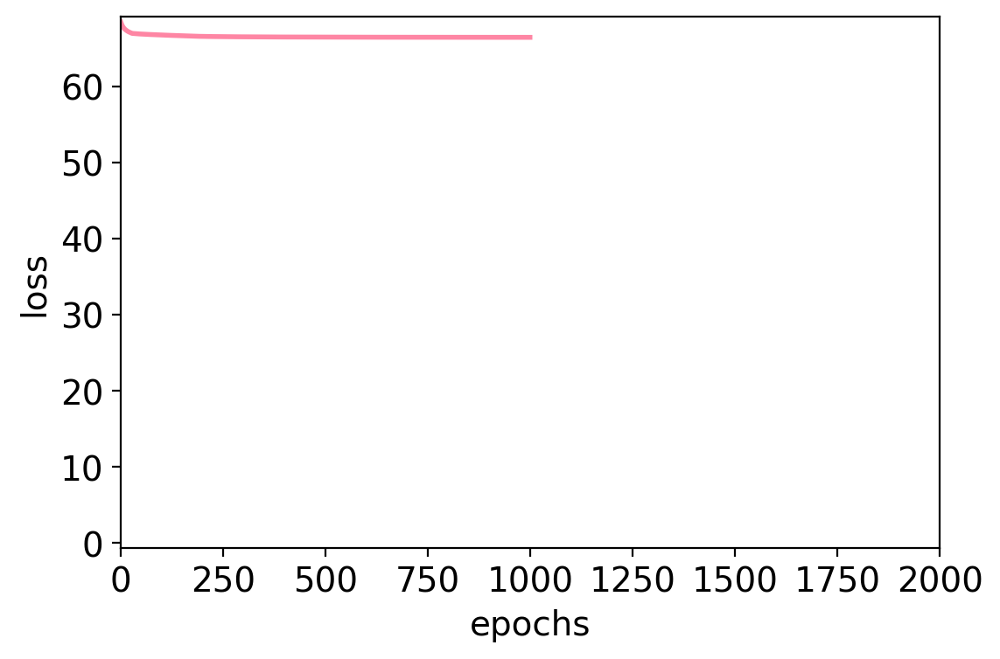

rho=0.4500511174160578
pval=0.00019055928855450763
obs_g2g=[[1.   1.   0.   1.   1.   1.   1.   1.  ]
 [1.   1.   1.   0.79 1.   1.   1.   0.22]
 [0.   1.   1.   0.89 0.74 0.36 0.73 0.23]
 [1.   0.79 0.89 1.   0.54 0.93 0.53 0.02]
 [1.   1.   0.74 0.54 1.   0.81 1.   0.63]
 [1.   1.   0.36 0.93 0.81 1.   0.33 0.65]
 [1.   1.   0.73 0.53 1.   0.33 1.   0.84]
 [1.   0.22 0.23 0.02 0.63 0.65 0.84 1.  ]]
exp_g2g=[[1.   0.68 0.14 0.82 0.89 0.25 0.57 0.5 ]
 [0.68 1.   0.71 0.32 0.93 0.79 0.64 0.96]
 [0.14 0.71 1.   0.68 0.93 0.46 0.14 0.39]
 [0.82 0.32 0.68 1.   0.93 0.57 0.86 0.07]
 [0.89 0.93 0.93 0.93 1.   0.61 0.43 0.18]
 [0.25 0.79 0.46 0.57 0.61 1.   0.29 0.5 ]
 [0.57 0.64 0.14 0.86 0.43 0.29 1.   0.25]
 [0.5  0.96 0.39 0.07 0.18 0.5  0.25 1.  ]]
rho=0.5828321137455761
pval=4.3473832964348316e-07
simulation 50; time passed: 658.1065123081207
spearman_corr=-0.9964179300955437
plot losses_scc


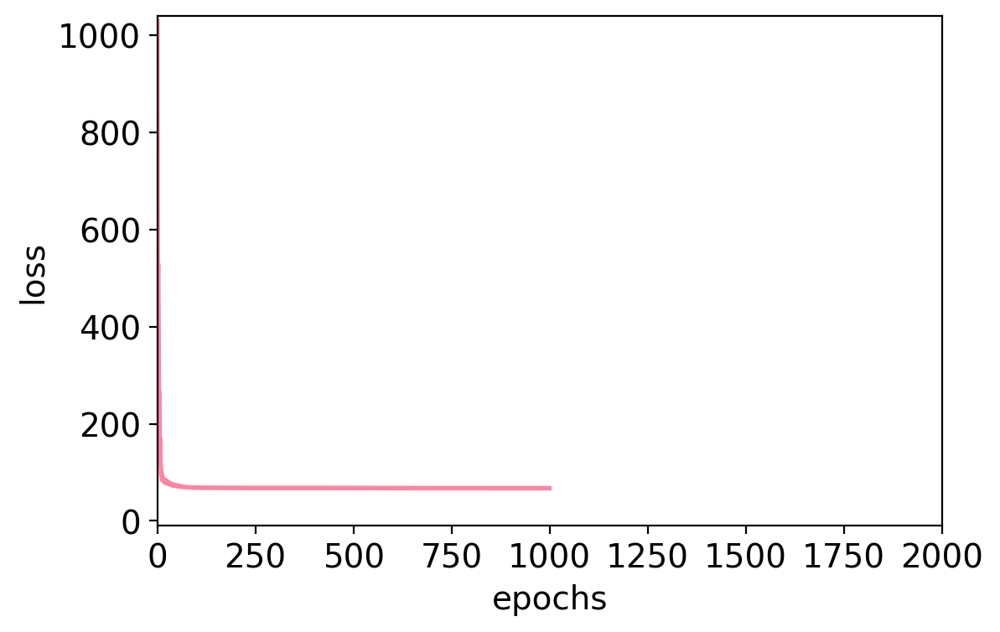

plot losses_ccc


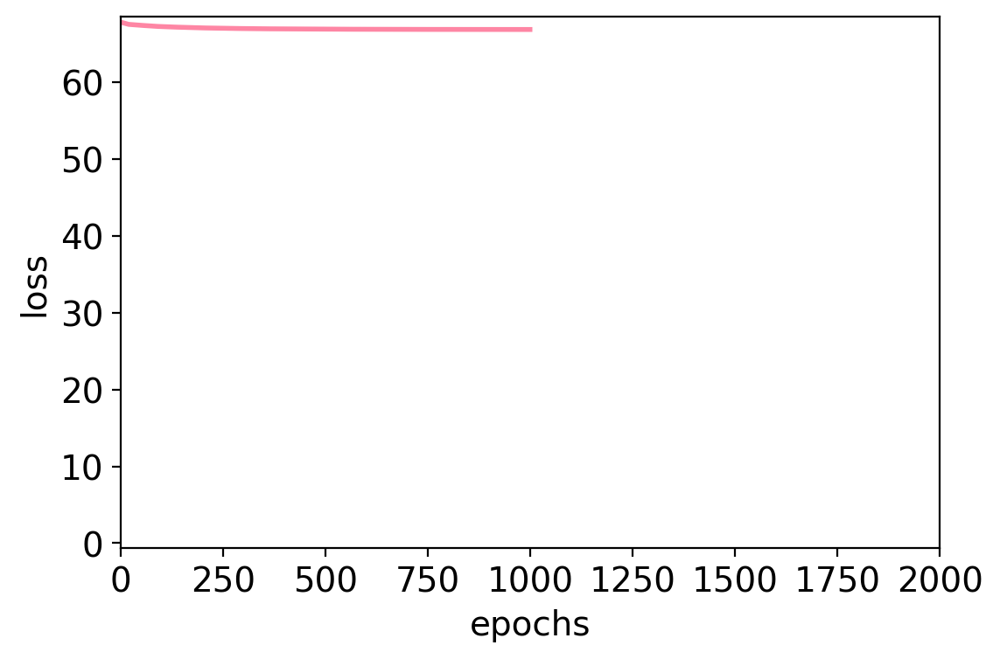

rho=0.5090309870770168
pval=1.745485038777902e-05
obs_g2g=[[1.   1.   0.   1.   0.   1.   0.69 0.  ]
 [1.   1.   0.   1.   0.   1.   0.11 0.  ]
 [0.   0.   1.   0.   0.   0.   0.   0.  ]
 [1.   1.   0.   1.   0.   1.   0.71 0.  ]
 [0.   0.   0.   0.   1.   0.09 0.   0.  ]
 [1.   1.   0.   1.   0.09 1.   0.94 0.  ]
 [0.69 0.11 0.   0.71 0.   0.94 1.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.   1.  ]]
exp_g2g=[[1.   0.96 0.07 0.04 0.04 0.07 0.5  0.11]
 [0.96 1.   0.   0.96 0.75 0.93 0.68 0.11]
 [0.07 0.   1.   0.61 0.5  0.36 0.11 0.  ]
 [0.04 0.96 0.61 1.   0.71 0.18 0.96 0.07]
 [0.04 0.75 0.5  0.71 1.   0.43 0.43 0.46]
 [0.07 0.93 0.36 0.18 0.43 1.   0.89 0.57]
 [0.5  0.68 0.11 0.96 0.43 0.89 1.   0.93]
 [0.11 0.11 0.   0.07 0.46 0.57 0.93 1.  ]]
rho=0.42166594255113976
pval=0.0005201207353717439
simulation 51; time passed: 671.3168802261353
spearman_corr=-0.9909276067098691
plot losses_scc


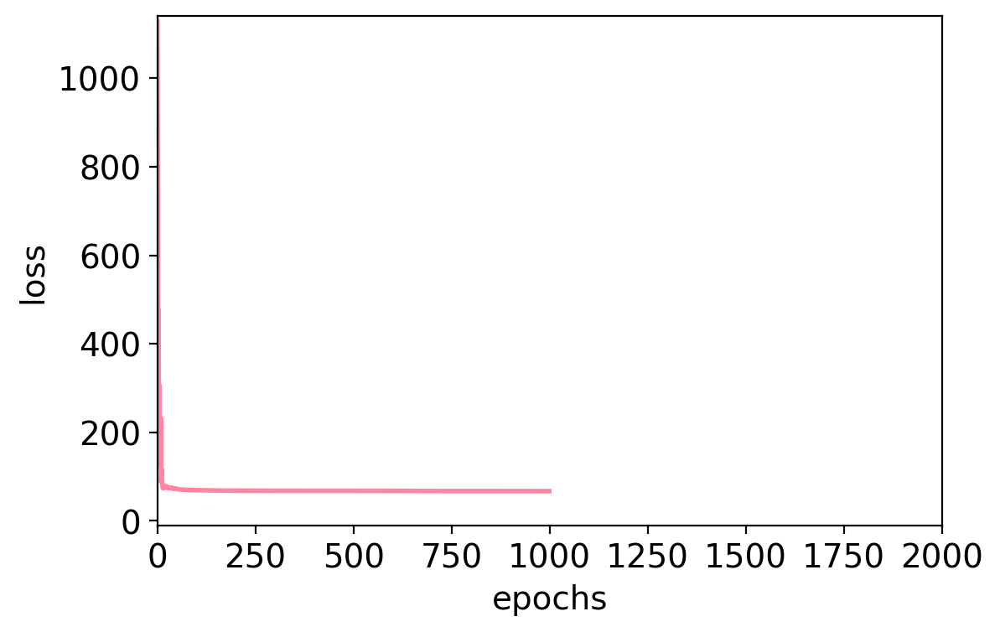

plot losses_ccc


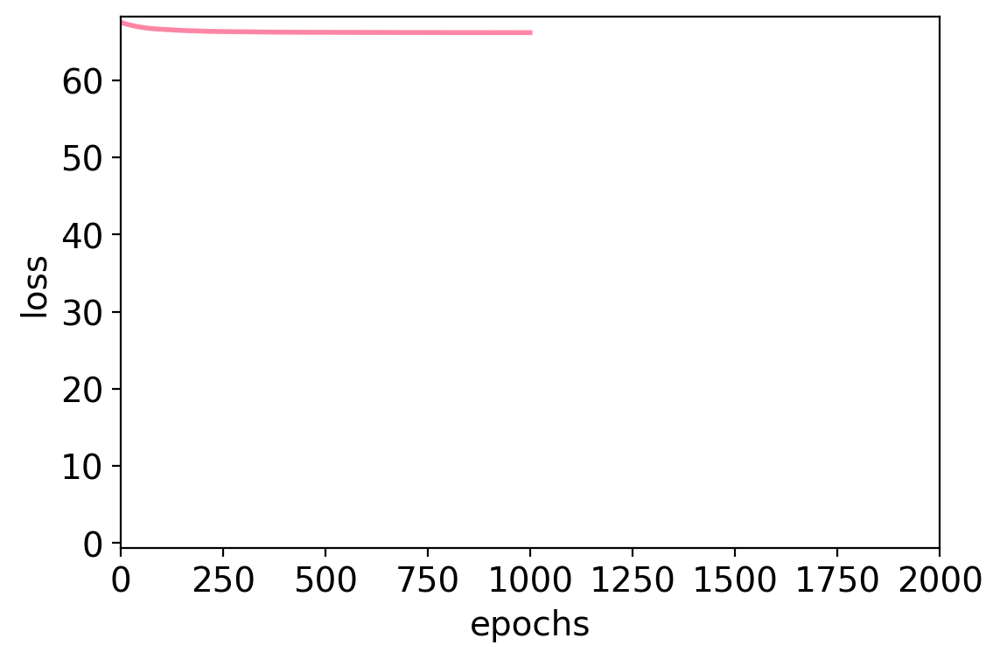

rho=0.2928589318837026
pval=0.018852268715406406
obs_g2g=[[1.   1.   0.53 0.76 1.   1.   0.   0.93]
 [1.   1.   1.   1.   1.   1.   0.01 1.  ]
 [0.53 1.   1.   0.88 1.   0.88 0.38 1.  ]
 [0.76 1.   0.88 1.   0.71 0.85 0.   0.67]
 [1.   1.   1.   0.71 1.   0.4  0.28 1.  ]
 [1.   1.   0.88 0.85 0.4  1.   0.   0.81]
 [0.   0.01 0.38 0.   0.28 0.   1.   0.23]
 [0.93 1.   1.   0.67 1.   0.81 0.23 1.  ]]
exp_g2g=[[1.   0.25 0.5  0.36 0.07 0.89 0.07 0.64]
 [0.25 1.   0.89 0.68 0.79 0.36 0.93 0.36]
 [0.5  0.89 1.   0.57 0.39 0.64 0.54 0.04]
 [0.36 0.68 0.57 1.   0.39 0.14 0.14 0.07]
 [0.07 0.79 0.39 0.39 1.   0.89 0.43 0.36]
 [0.89 0.36 0.64 0.14 0.89 1.   0.04 0.14]
 [0.07 0.93 0.54 0.14 0.43 0.04 1.   0.5 ]
 [0.64 0.36 0.04 0.07 0.36 0.14 0.5  1.  ]]
rho=0.43261802365547225
pval=0.000356737866426008
simulation 52; time passed: 684.3742668628693
spearman_corr=-0.9889032825038008
plot losses_scc


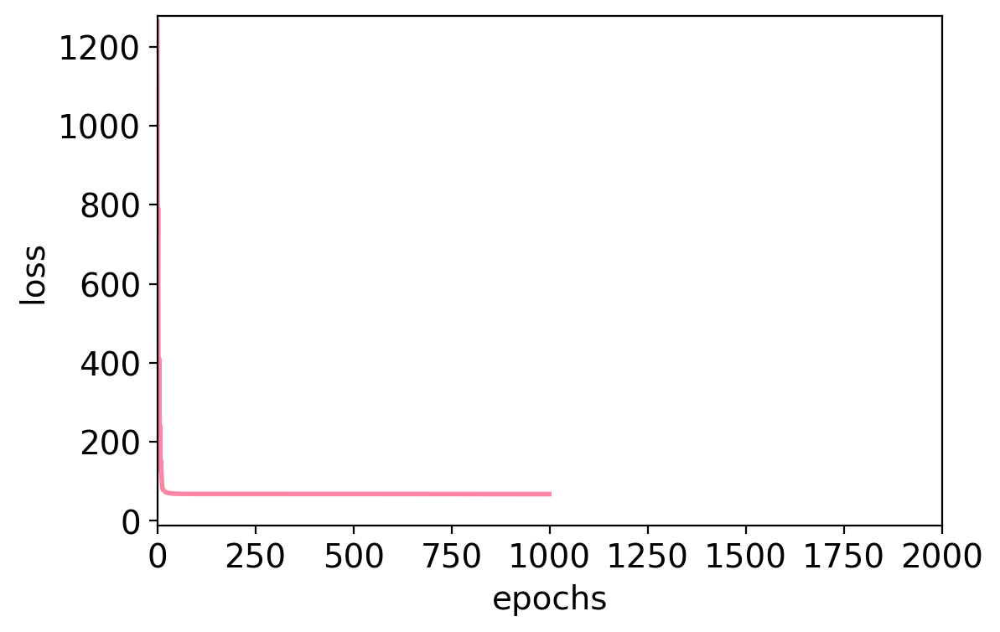

plot losses_ccc


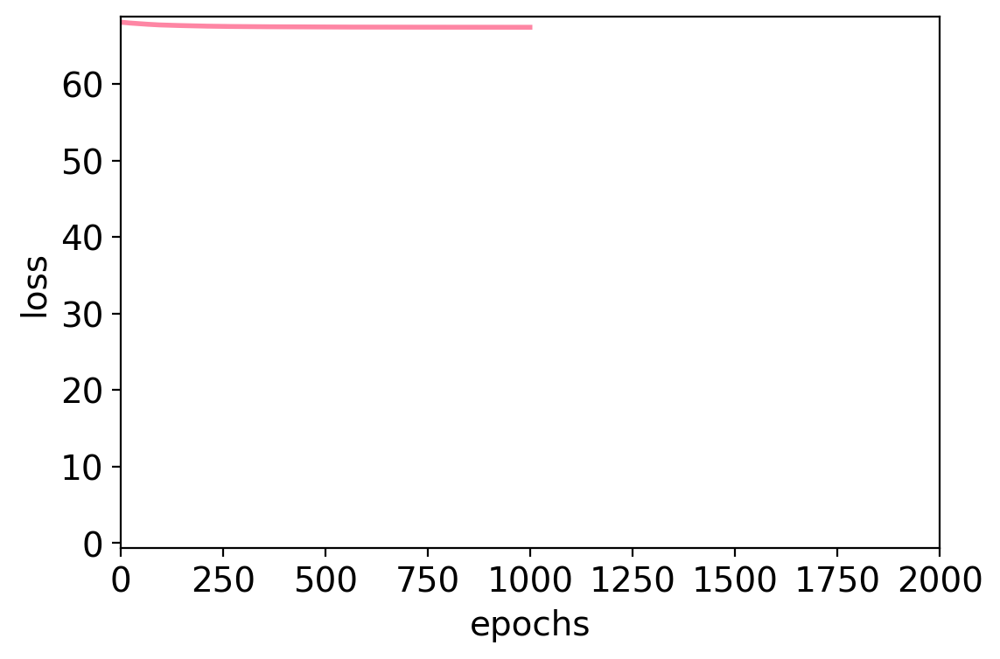

rho=0.587050242332883
pval=3.4225901926087226e-07
obs_g2g=[[1.   0.06 0.   0.   0.   0.18 0.01 0.  ]
 [0.06 1.   1.   0.78 0.32 1.   0.29 0.  ]
 [0.   1.   1.   0.54 0.73 1.   0.94 0.  ]
 [0.   0.78 0.54 1.   0.   0.87 1.   0.06]
 [0.   0.32 0.73 0.   1.   0.39 0.39 0.  ]
 [0.18 1.   1.   0.87 0.39 1.   1.   0.14]
 [0.01 0.29 0.94 1.   0.39 1.   1.   0.19]
 [0.   0.   0.   0.06 0.   0.14 0.19 1.  ]]
exp_g2g=[[1.   0.21 0.07 0.61 0.14 0.79 0.68 0.11]
 [0.21 1.   0.79 0.29 0.64 0.82 0.04 0.36]
 [0.07 0.79 1.   0.93 0.64 0.64 0.82 0.68]
 [0.61 0.29 0.93 1.   0.75 0.86 0.89 0.82]
 [0.14 0.64 0.64 0.75 1.   0.04 0.25 0.14]
 [0.79 0.82 0.64 0.86 0.04 1.   0.46 0.61]
 [0.68 0.04 0.82 0.89 0.25 0.46 1.   0.14]
 [0.11 0.36 0.68 0.82 0.14 0.61 0.14 1.  ]]
rho=0.4505719396530777
pval=0.00018692501821409086
simulation 53; time passed: 697.4081292152405
spearman_corr=-0.9095652930226847
plot losses_scc


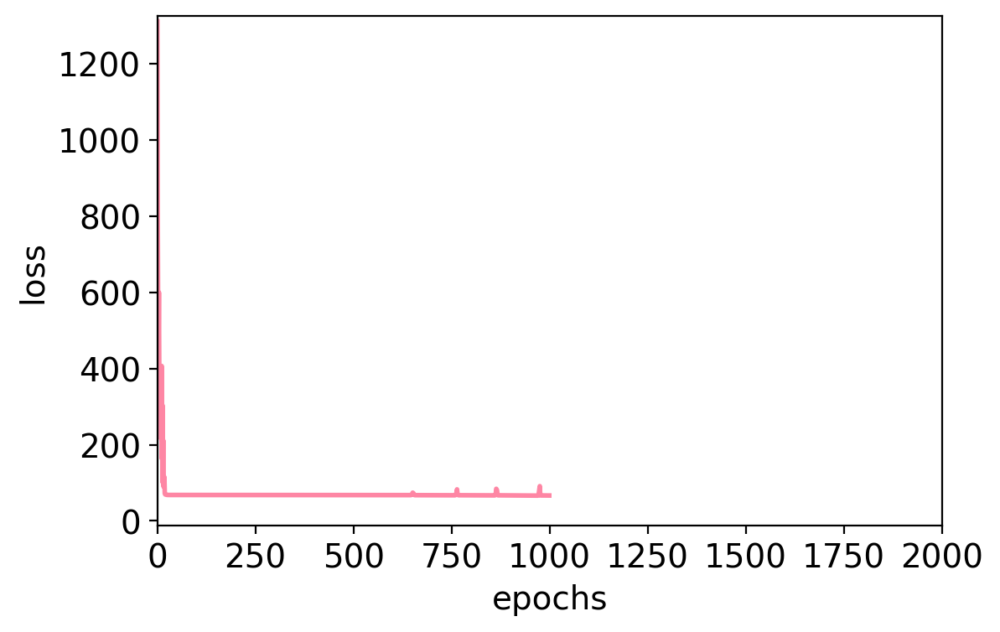

plot losses_ccc


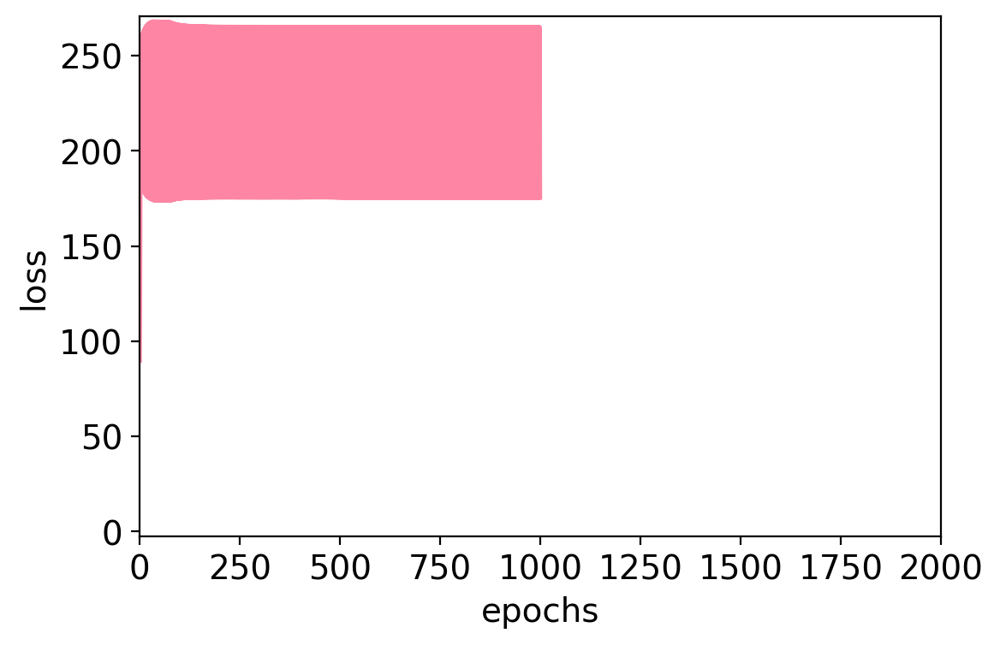

rho=0.166628513254407
pval=0.18818184816953706
obs_g2g=[[1.   1.   1.   0.77 0.   0.   0.   0.  ]
 [1.   1.   0.77 1.   0.   0.   0.   0.  ]
 [1.   0.77 1.   0.81 0.02 0.   0.   0.04]
 [0.77 1.   0.81 1.   1.   1.   0.69 0.85]
 [0.   0.   0.02 1.   1.   1.   1.   1.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]
 [0.   0.   0.   0.69 1.   1.   1.   1.  ]
 [0.   0.   0.04 0.85 1.   1.   1.   1.  ]]
exp_g2g=[[1.   0.39 0.54 0.5  0.71 0.64 0.18 0.93]
 [0.39 1.   0.04 0.86 0.43 0.79 0.71 0.14]
 [0.54 0.04 1.   0.79 0.25 0.61 0.75 0.07]
 [0.5  0.86 0.79 1.   0.57 0.61 0.96 0.18]
 [0.71 0.43 0.25 0.57 1.   0.89 0.14 0.46]
 [0.64 0.79 0.61 0.61 0.89 1.   0.57 0.93]
 [0.18 0.71 0.75 0.96 0.14 0.57 1.   0.25]
 [0.93 0.14 0.07 0.18 0.46 0.93 0.25 1.  ]]
rho=0.16699069417113171
pval=0.18720991149657268
simulation 54; time passed: 710.6279344558716
spearman_corr=-0.9462803982803983
plot losses_scc


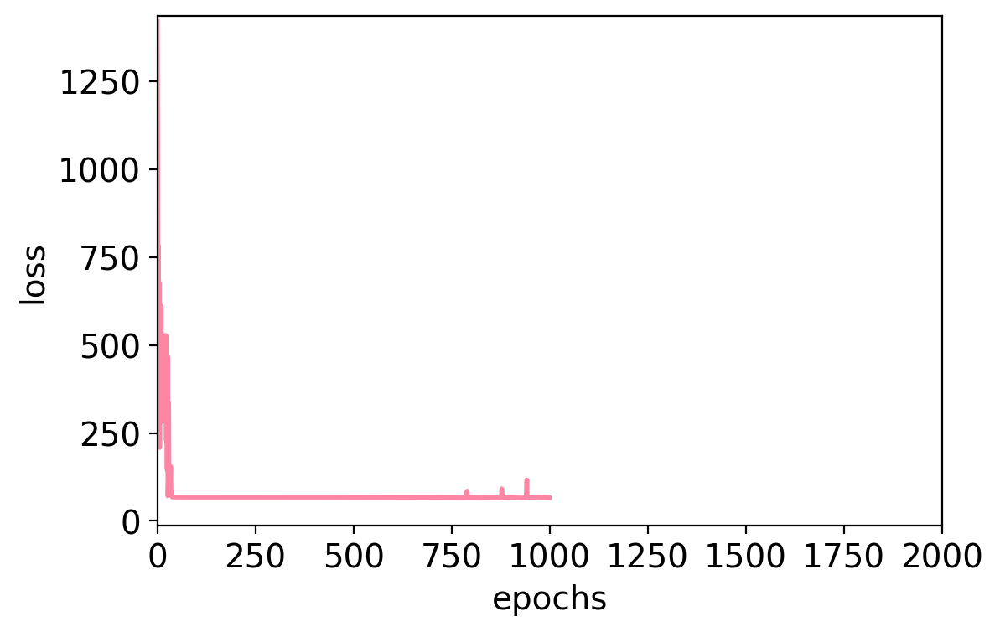

plot losses_ccc


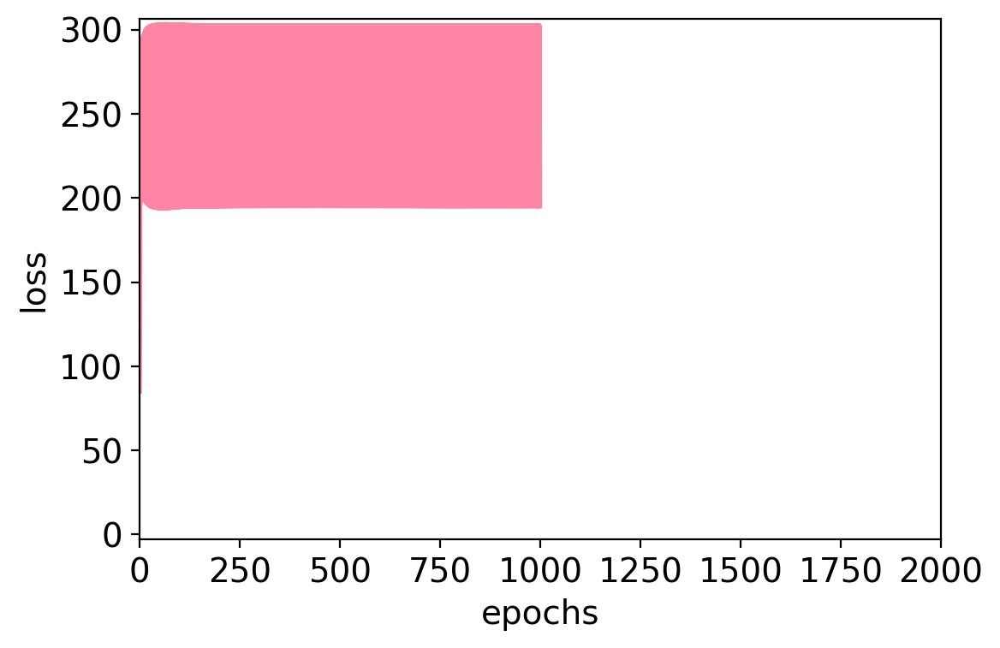

rho=0.17288807607571435
pval=0.17188961041362816
obs_g2g=[[1.   1.   0.   1.   0.   0.   0.   0.  ]
 [1.   1.   0.   1.   0.   0.   0.   0.  ]
 [0.   0.   1.   0.   1.   0.52 1.   0.95]
 [1.   1.   0.   1.   0.   0.   0.   0.  ]
 [0.   0.   1.   0.   1.   0.62 1.   1.  ]
 [0.   0.   0.52 0.   0.62 1.   0.43 0.3 ]
 [0.   0.   1.   0.   1.   0.43 1.   0.81]
 [0.   0.   0.95 0.   1.   0.3  0.81 1.  ]]
exp_g2g=[[1.   0.82 0.71 0.39 0.36 0.46 0.71 0.93]
 [0.82 1.   0.46 0.86 0.89 0.89 0.46 0.61]
 [0.71 0.46 1.   0.46 0.04 0.79 0.61 0.75]
 [0.39 0.86 0.46 1.   0.71 0.36 0.46 0.29]
 [0.36 0.89 0.04 0.71 1.   0.46 0.21 0.68]
 [0.46 0.89 0.79 0.36 0.46 1.   0.11 0.32]
 [0.71 0.46 0.61 0.46 0.21 0.11 1.   0.21]
 [0.93 0.61 0.75 0.29 0.68 0.32 0.21 1.  ]]
rho=0.13316809723587386
pval=0.29416492468954014
simulation 55; time passed: 723.8180332183838
spearman_corr=-0.7215364455364456
plot losses_scc


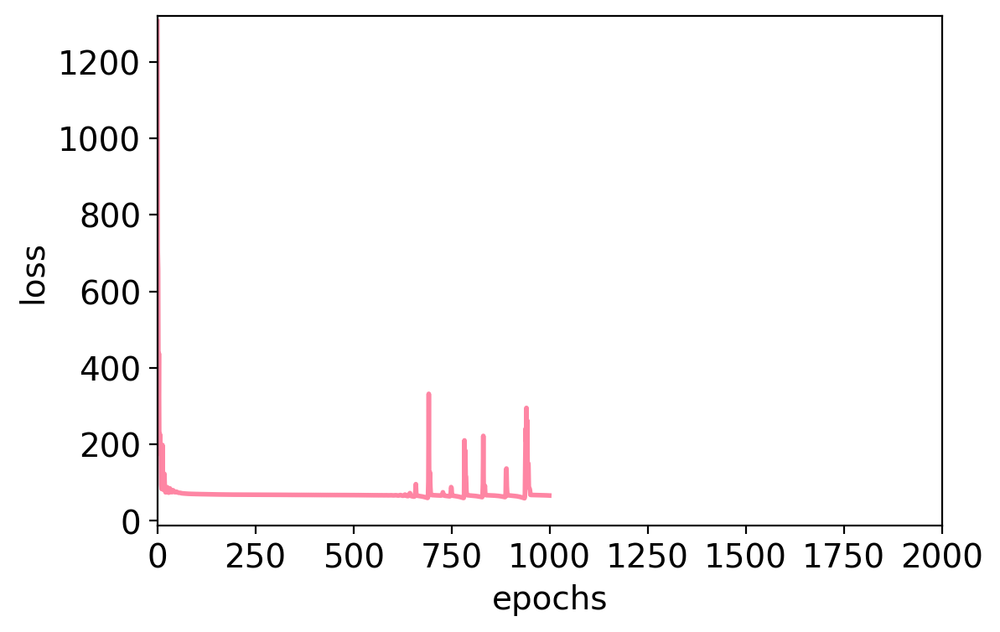

plot losses_ccc


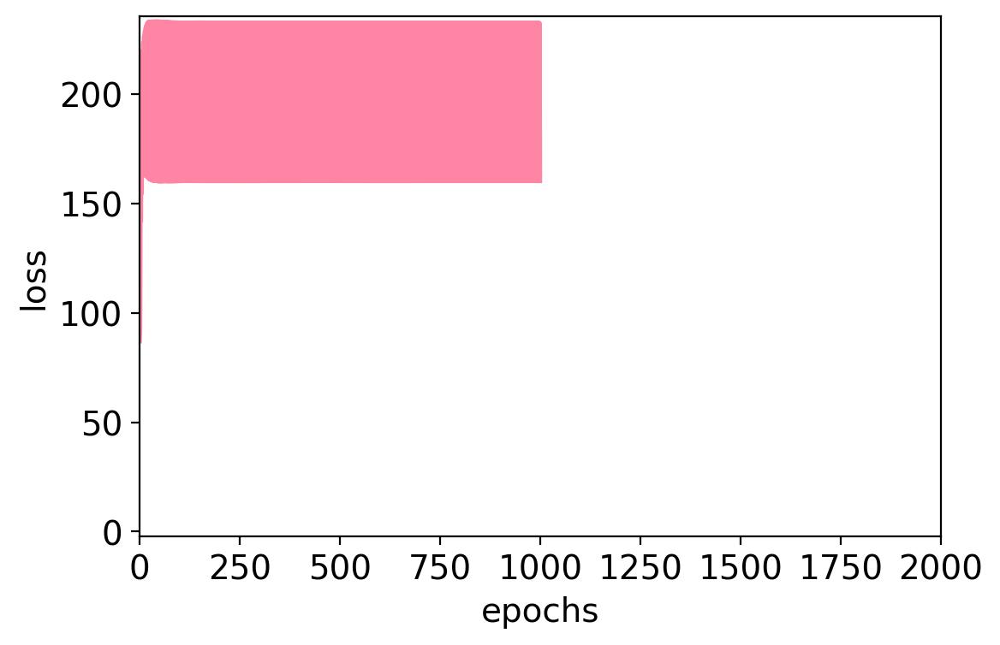

rho=0.24222702170372912
pval=0.05379932537458204
obs_g2g=[[1.   0.   1.   0.   0.   0.   0.99 0.37]
 [0.   1.   0.   1.   1.   1.   0.   1.  ]
 [1.   0.   1.   0.   0.05 0.   1.   0.67]
 [0.   1.   0.   1.   1.   1.   0.09 1.  ]
 [0.   1.   0.05 1.   1.   1.   0.63 1.  ]
 [0.   1.   0.   1.   1.   1.   0.   1.  ]
 [0.99 0.   1.   0.09 0.63 0.   1.   0.74]
 [0.37 1.   0.67 1.   1.   1.   0.74 1.  ]]
exp_g2g=[[1.   0.21 0.18 0.18 0.29 0.86 0.29 0.75]
 [0.21 1.   0.75 0.36 0.79 0.96 0.71 0.93]
 [0.18 0.75 1.   0.89 0.21 0.46 0.07 0.5 ]
 [0.18 0.36 0.89 1.   0.68 0.68 0.21 0.14]
 [0.29 0.79 0.21 0.68 1.   0.21 0.89 0.79]
 [0.86 0.96 0.46 0.68 0.21 1.   0.32 0.89]
 [0.29 0.71 0.07 0.21 0.89 0.32 1.   0.07]
 [0.75 0.93 0.5  0.14 0.79 0.89 0.07 1.  ]]
rho=0.3891605888031652
pval=0.0014818246782062445
simulation 56; time passed: 737.0413365364075
spearman_corr=-0.9781366980055183
plot losses_scc


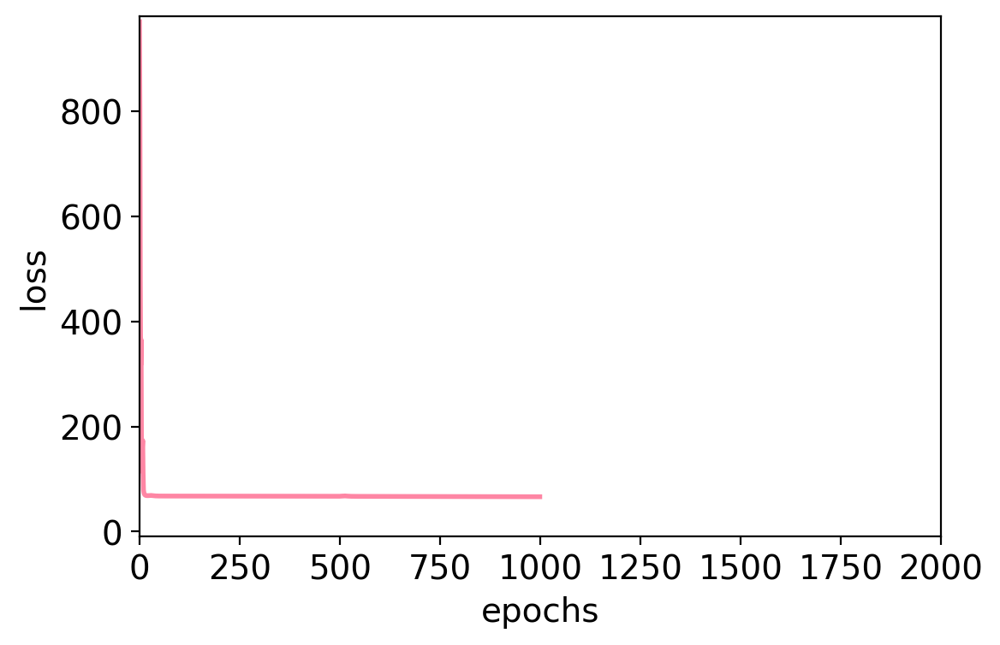

plot losses_ccc


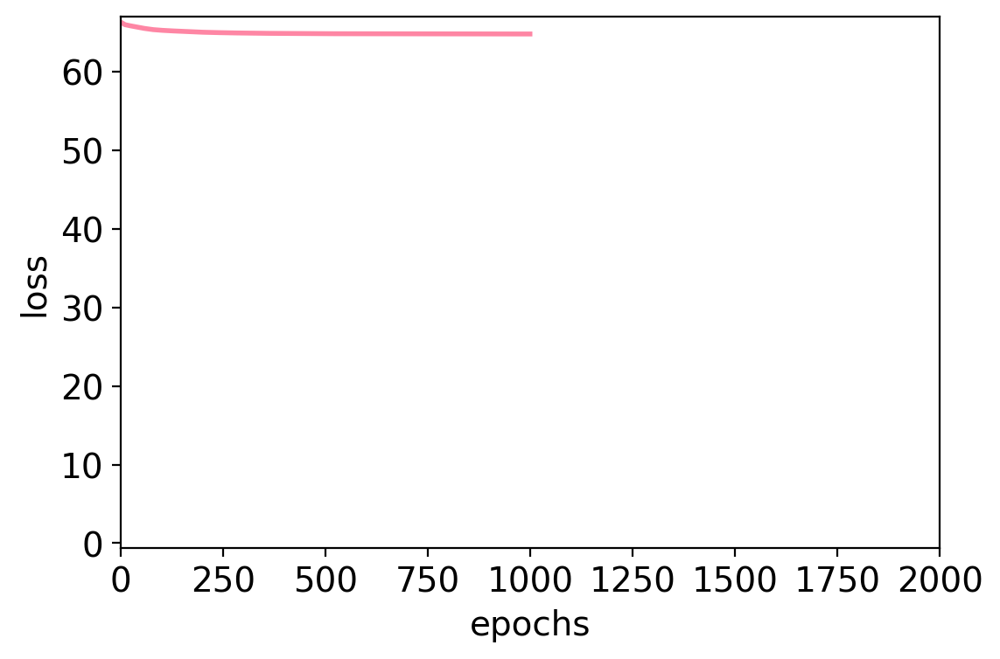

rho=0.019059926911942207
pval=0.8811688125673597
obs_g2g=[[1.   1.   1.   1.   1.   1.   0.96 1.  ]
 [1.   1.   1.   1.   1.   1.   1.   1.  ]
 [1.   1.   1.   1.   1.   1.   1.   1.  ]
 [1.   1.   1.   1.   1.   1.   1.   1.  ]
 [1.   1.   1.   1.   1.   1.   1.   1.  ]
 [1.   1.   1.   1.   1.   1.   0.75 0.81]
 [0.96 1.   1.   1.   1.   0.75 1.   0.56]
 [1.   1.   1.   1.   1.   0.81 0.56 1.  ]]
exp_g2g=[[1.   0.89 0.04 0.64 0.18 0.14 0.18 0.75]
 [0.89 1.   0.5  0.07 0.68 0.25 0.57 0.25]
 [0.04 0.5  1.   0.5  0.29 0.5  0.25 0.14]
 [0.64 0.07 0.5  1.   0.68 0.18 0.07 0.04]
 [0.18 0.68 0.29 0.68 1.   0.25 0.86 0.61]
 [0.14 0.25 0.5  0.18 0.25 1.   0.79 0.5 ]
 [0.18 0.57 0.25 0.07 0.86 0.79 1.   0.25]
 [0.75 0.25 0.14 0.04 0.61 0.5  0.25 1.  ]]
rho=nan
pval=nan
simulation 57; time passed: 750.2541341781616


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.25395421395421397
plot losses_scc


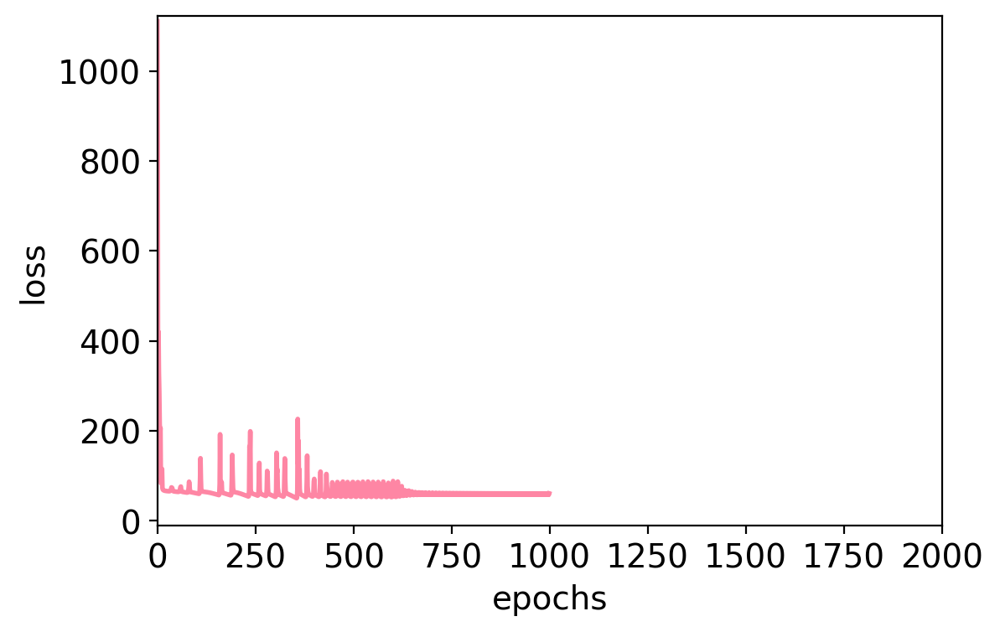

plot losses_ccc


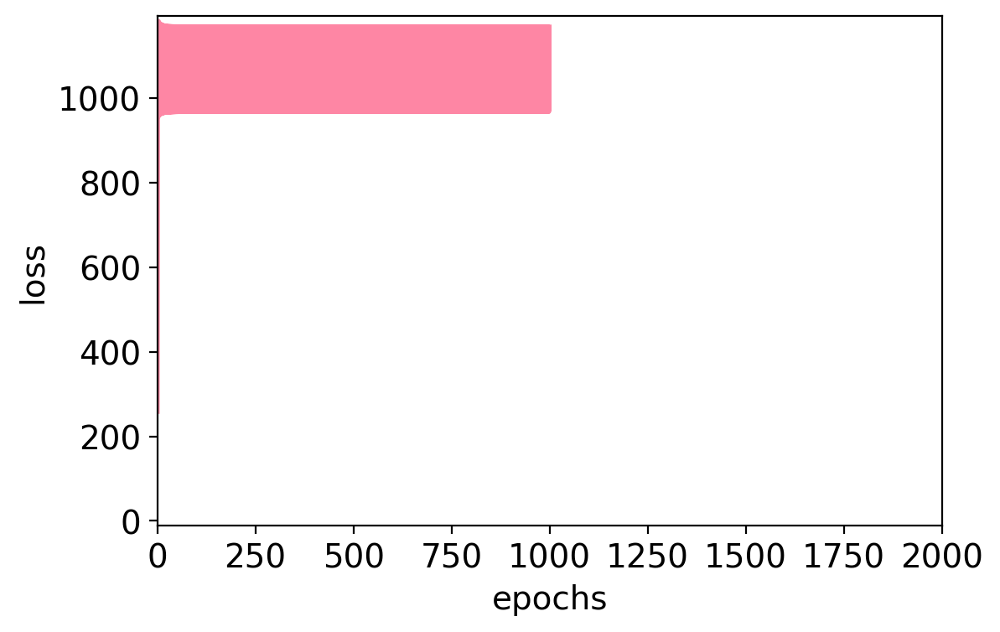

rho=0.2107664375540357
pval=0.09457637980954388
obs_g2g=[[1. 0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 1. 1. 0. 1. 1. 1.]
 [0. 1. 1. 1. 0. 1. 1. 1.]
 [0. 1. 1. 1. 0. 1. 1. 1.]
 [1. 0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 1. 1. 0. 1. 1. 1.]
 [0. 1. 1. 1. 0. 1. 1. 0.]
 [0. 1. 1. 1. 0. 1. 0. 1.]]
exp_g2g=[[1.   0.46 0.54 0.71 0.11 0.25 0.68 0.39]
 [0.46 1.   0.39 0.32 0.25 0.29 0.39 0.86]
 [0.54 0.39 1.   0.46 0.14 0.04 0.68 0.82]
 [0.71 0.32 0.46 1.   0.29 0.57 0.39 0.21]
 [0.11 0.25 0.14 0.29 1.   0.61 0.11 0.61]
 [0.25 0.29 0.04 0.57 0.61 1.   0.68 0.57]
 [0.68 0.39 0.68 0.39 0.11 0.68 1.   0.5 ]
 [0.39 0.86 0.82 0.21 0.61 0.57 0.5  1.  ]]
rho=0.2107664375540357
pval=0.09457637980954388
simulation 58; time passed: 763.3985002040863
spearman_corr=-0.9458539225544166
plot losses_scc


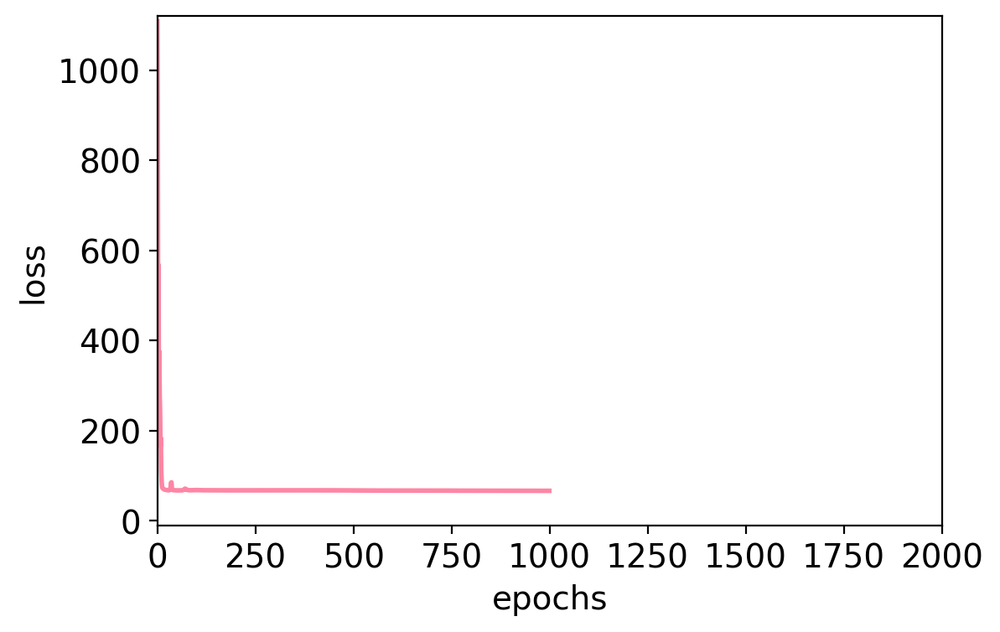

plot losses_ccc


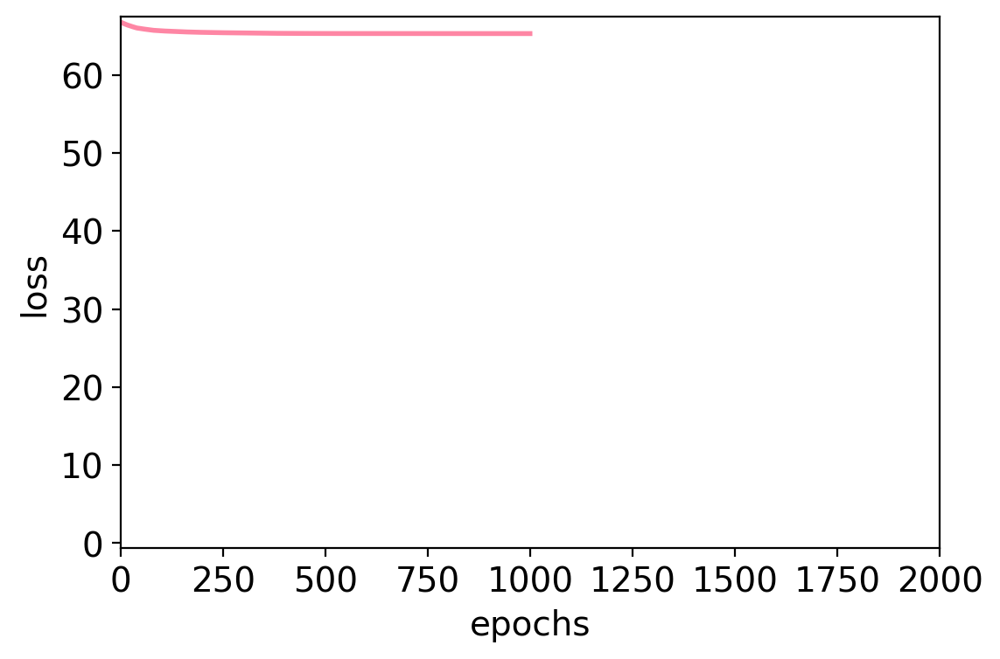

rho=0.05563467683763283
pval=0.662369726021441
obs_g2g=[[1.   1.   1.   1.   0.59 1.   0.89 1.  ]
 [1.   1.   0.96 1.   0.89 1.   0.63 1.  ]
 [1.   0.96 1.   1.   0.63 1.   0.24 0.61]
 [1.   1.   1.   1.   0.89 1.   0.51 1.  ]
 [0.59 0.89 0.63 0.89 1.   0.93 0.54 0.86]
 [1.   1.   1.   1.   0.93 1.   0.48 1.  ]
 [0.89 0.63 0.24 0.51 0.54 0.48 1.   0.59]
 [1.   1.   0.61 1.   0.86 1.   0.59 1.  ]]
exp_g2g=[[1.   0.71 0.61 0.71 0.36 0.93 0.32 0.32]
 [0.71 1.   0.29 0.29 0.61 0.04 0.46 0.46]
 [0.61 0.29 1.   0.21 0.04 0.36 0.79 0.46]
 [0.71 0.29 0.21 1.   0.21 0.29 0.86 0.32]
 [0.36 0.61 0.04 0.21 1.   0.71 0.43 0.39]
 [0.93 0.04 0.36 0.29 0.71 1.   0.04 0.21]
 [0.32 0.46 0.79 0.86 0.43 0.04 1.   0.75]
 [0.32 0.46 0.46 0.32 0.39 0.21 0.75 1.  ]]
rho=nan
pval=nan
simulation 59; time passed: 776.5635554790497


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.9816148335189244
plot losses_scc


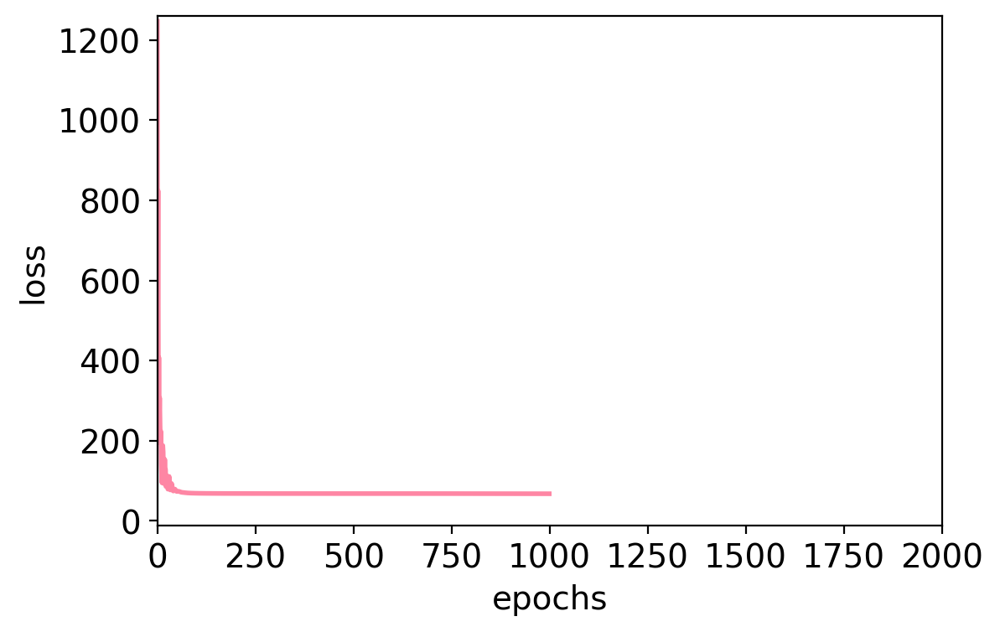

plot losses_ccc


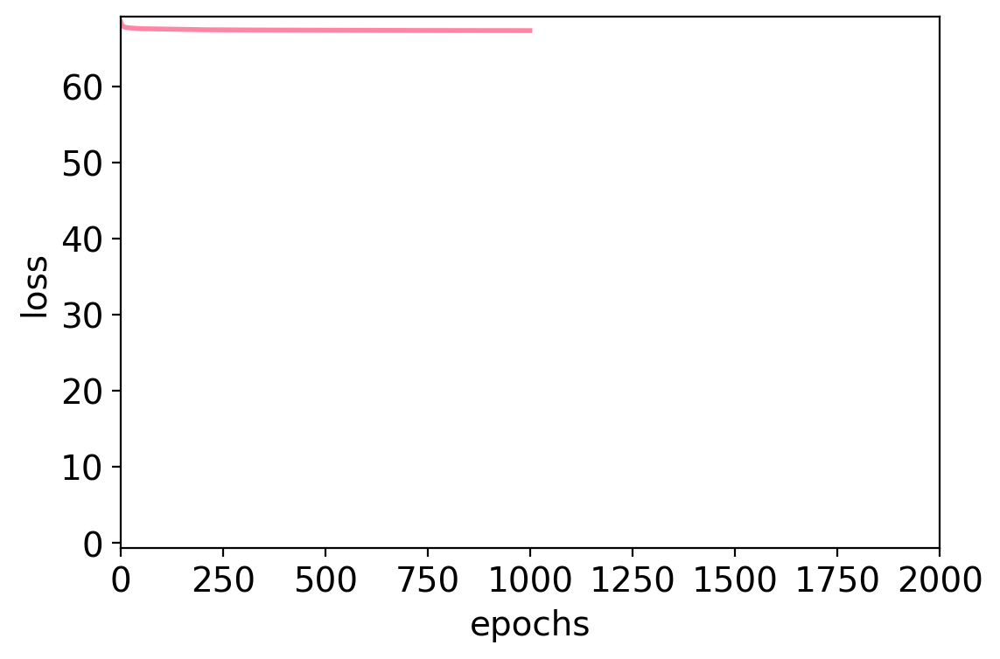

rho=0.5095438869185959
pval=1.706184471267169e-05
obs_g2g=[[1.   1.   0.   0.45 0.28 0.36 0.18 0.45]
 [1.   1.   0.49 1.   0.61 1.   0.42 1.  ]
 [0.   0.49 1.   0.84 0.63 0.45 0.55 0.37]
 [0.45 1.   0.84 1.   0.58 0.32 0.28 0.63]
 [0.28 0.61 0.63 0.58 1.   0.38 0.8  0.46]
 [0.36 1.   0.45 0.32 0.38 1.   0.71 0.91]
 [0.18 0.42 0.55 0.28 0.8  0.71 1.   0.62]
 [0.45 1.   0.37 0.63 0.46 0.91 0.62 1.  ]]
exp_g2g=[[1.   0.68 0.46 0.61 0.18 0.07 0.18 0.46]
 [0.68 1.   0.11 0.43 0.04 0.82 0.93 0.93]
 [0.46 0.11 1.   0.89 0.5  0.93 0.57 0.61]
 [0.61 0.43 0.89 1.   0.89 0.75 0.68 0.68]
 [0.18 0.04 0.5  0.89 1.   0.39 0.5  0.07]
 [0.07 0.82 0.93 0.75 0.39 1.   0.89 0.82]
 [0.18 0.93 0.57 0.68 0.5  0.89 1.   0.25]
 [0.46 0.93 0.61 0.68 0.07 0.82 0.25 1.  ]]
rho=0.5811405669349313
pval=4.78049483473522e-07
simulation 60; time passed: 789.6159770488739
spearman_corr=-0.8389711309711311
plot losses_scc


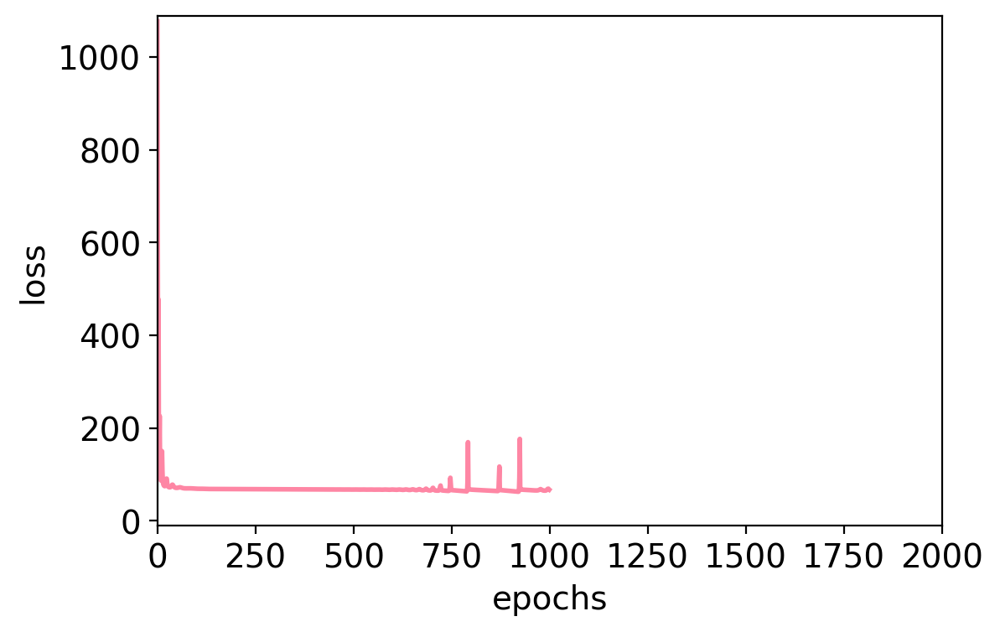

plot losses_ccc


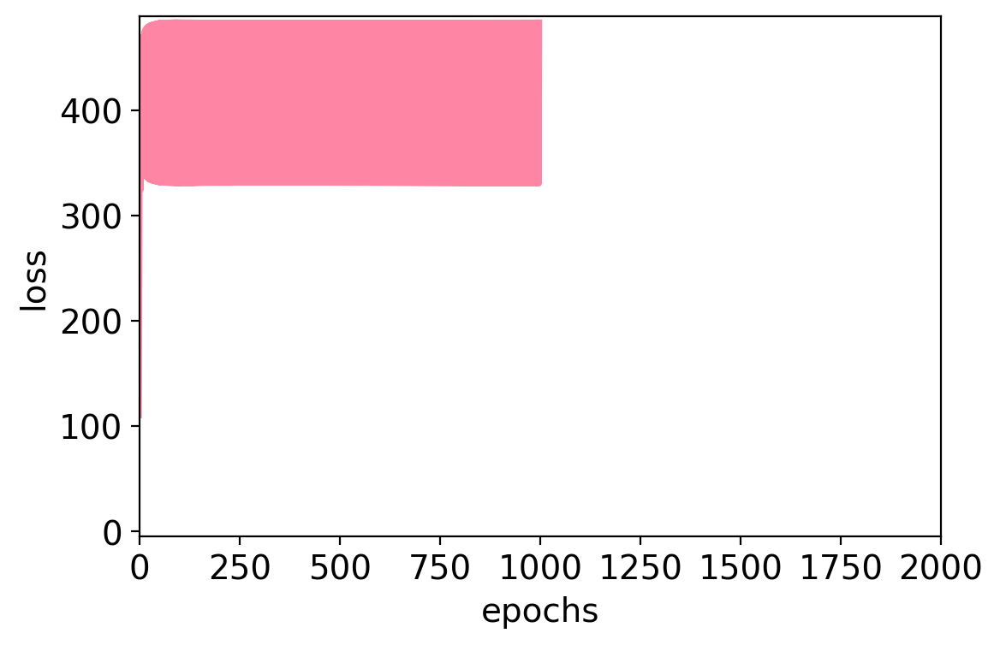

rho=0.3112249992440856
pval=0.012306376631305604
obs_g2g=[[1.   1.   1.   1.   1.   1.   0.   0.  ]
 [1.   1.   0.15 0.24 0.   0.   0.82 1.  ]
 [1.   0.15 1.   0.93 0.   0.47 0.18 1.  ]
 [1.   0.24 0.93 1.   0.   0.56 0.1  1.  ]
 [1.   0.   0.   0.   1.   0.   1.   1.  ]
 [1.   0.   0.47 0.56 0.   1.   0.53 1.  ]
 [0.   0.82 0.18 0.1  1.   0.53 1.   0.  ]
 [0.   1.   1.   1.   1.   1.   0.   1.  ]]
exp_g2g=[[1.   0.36 0.39 0.32 0.61 0.57 0.21 0.46]
 [0.36 1.   0.25 0.96 0.36 0.07 0.29 0.43]
 [0.39 0.25 1.   0.82 0.46 0.61 0.07 0.46]
 [0.32 0.96 0.82 1.   0.07 0.64 0.89 0.29]
 [0.61 0.36 0.46 0.07 1.   0.57 0.21 0.68]
 [0.57 0.07 0.61 0.64 0.57 1.   0.93 0.36]
 [0.21 0.29 0.07 0.89 0.21 0.93 1.   0.36]
 [0.46 0.43 0.46 0.29 0.68 0.36 0.36 1.  ]]
rho=0.4912863258509222
pval=3.7538887009733295e-05
simulation 61; time passed: 802.8084759712219
spearman_corr=-0.8385263005886162
plot losses_scc


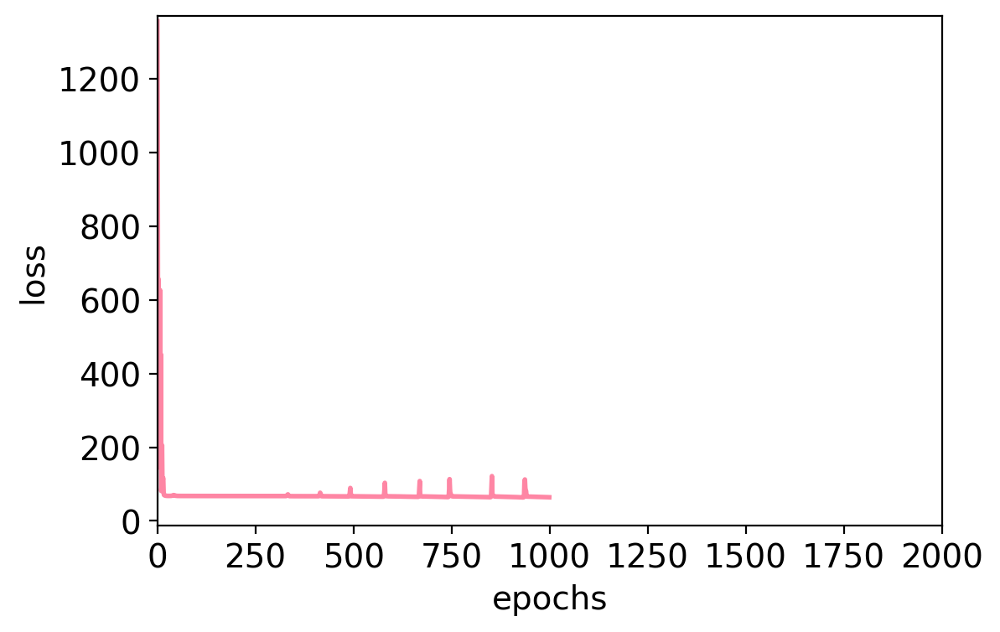

plot losses_ccc


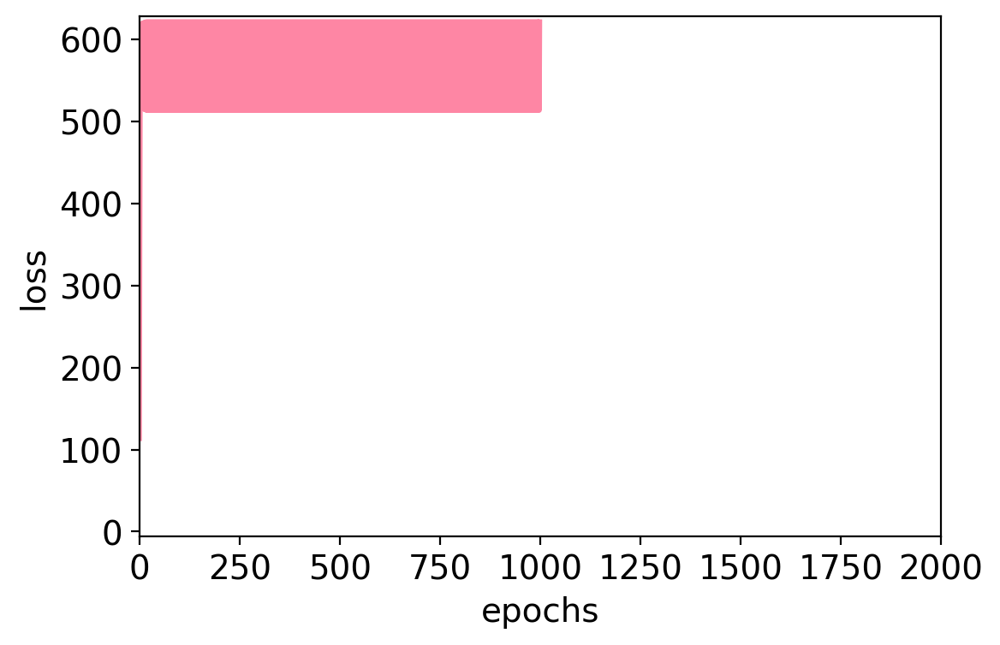

rho=0.23656079087810908
pval=0.059836686579473886
obs_g2g=[[1.   0.   1.   1.   0.   1.   0.   1.  ]
 [0.   1.   1.   1.   0.   1.   0.   1.  ]
 [1.   1.   1.   0.   1.   0.   1.   0.  ]
 [1.   1.   0.   1.   1.   0.   1.   0.  ]
 [0.   0.   1.   1.   1.   0.92 0.   1.  ]
 [1.   1.   0.   0.   0.92 1.   1.   0.  ]
 [0.   0.   1.   1.   0.   1.   1.   1.  ]
 [1.   1.   0.   0.   1.   0.   1.   1.  ]]
exp_g2g=[[1.   0.64 0.18 0.93 0.96 0.68 0.18 0.61]
 [0.64 1.   0.96 0.61 0.61 0.11 0.04 0.29]
 [0.18 0.96 1.   0.93 0.82 0.5  0.36 0.21]
 [0.93 0.61 0.93 1.   0.61 0.14 0.21 0.5 ]
 [0.96 0.61 0.82 0.61 1.   0.5  0.71 0.93]
 [0.68 0.11 0.5  0.14 0.5  1.   0.46 0.43]
 [0.18 0.04 0.36 0.21 0.71 0.46 1.   0.36]
 [0.61 0.29 0.21 0.5  0.93 0.43 0.36 1.  ]]
rho=0.36449016694505976
pval=0.003066004295183028
simulation 62; time passed: 816.0286026000977
spearman_corr=-0.9746186546186545
plot losses_scc


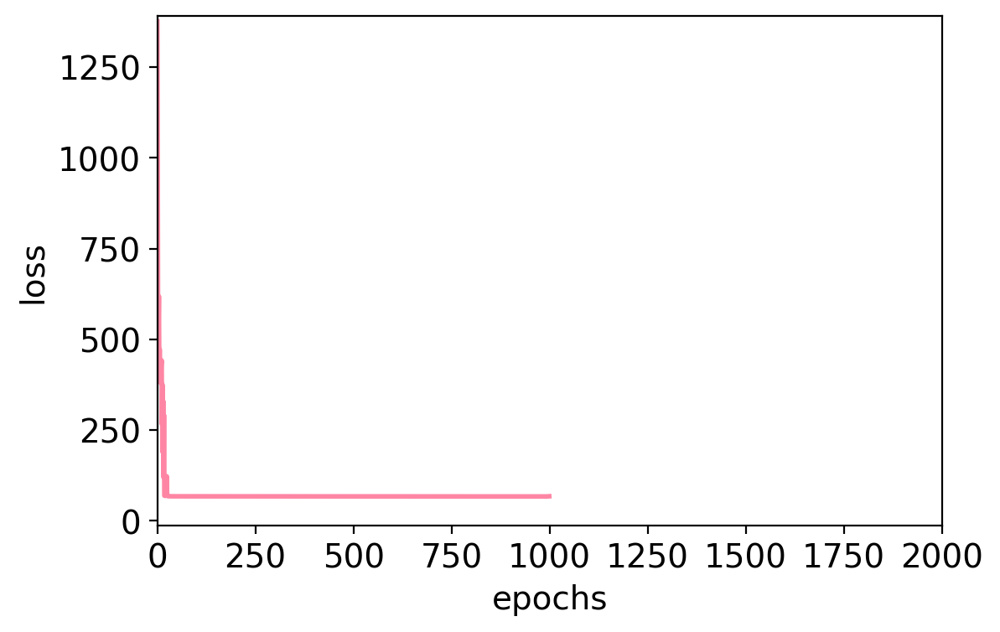

plot losses_ccc


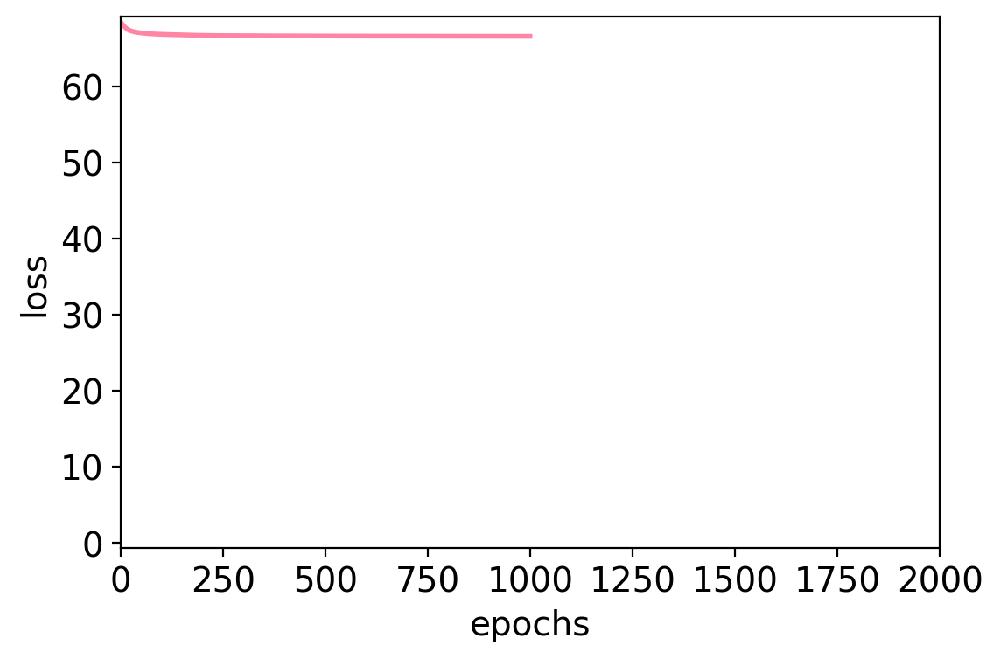

rho=0.4839065610070959
pval=5.098726308427505e-05
obs_g2g=[[1.   1.   0.01 1.   0.82 1.   0.   1.  ]
 [1.   1.   0.   1.   0.43 1.   0.   0.1 ]
 [0.01 0.   1.   0.   0.   0.26 0.   0.42]
 [1.   1.   0.   1.   0.   0.51 0.   0.48]
 [0.82 0.43 0.   0.   1.   0.56 0.   0.24]
 [1.   1.   0.26 0.51 0.56 1.   0.   1.  ]
 [0.   0.   0.   0.   0.   0.   1.   0.49]
 [1.   0.1  0.42 0.48 0.24 1.   0.49 1.  ]]
exp_g2g=[[1.   0.71 0.75 0.25 0.89 0.43 0.39 0.86]
 [0.71 1.   0.25 0.61 0.82 0.93 0.32 0.  ]
 [0.75 0.25 1.   0.54 0.93 0.68 0.57 0.68]
 [0.25 0.61 0.54 1.   0.71 0.18 0.11 0.71]
 [0.89 0.82 0.93 0.71 1.   0.61 0.04 0.04]
 [0.43 0.93 0.68 0.18 0.61 1.   0.25 0.46]
 [0.39 0.32 0.57 0.11 0.04 0.25 1.   0.93]
 [0.86 0.   0.68 0.71 0.04 0.46 0.93 1.  ]]
rho=0.5404815932156867
pval=4.025300681025429e-06
simulation 63; time passed: 829.5324068069458
spearman_corr=-0.39144522979390123
plot losses_scc


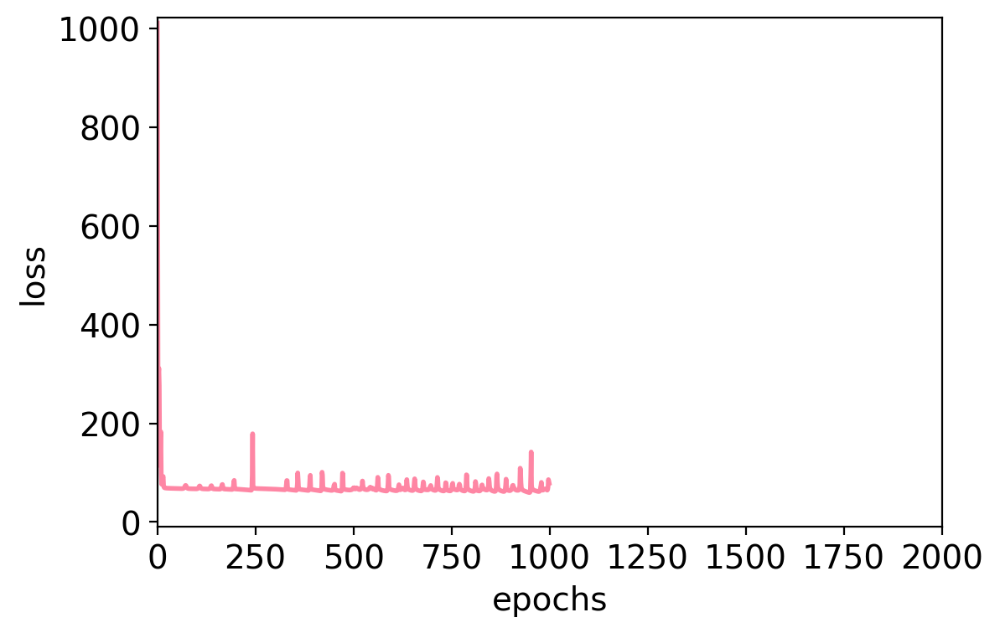

plot losses_ccc


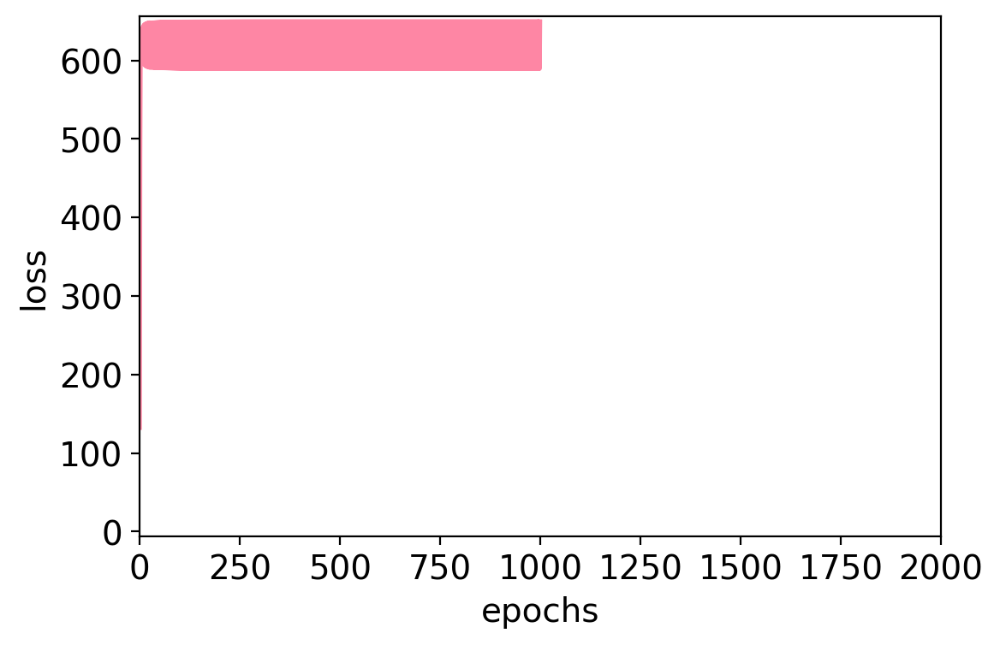

rho=0.2869163715575096
pval=0.021524707304795762
obs_g2g=[[1.   1.   0.   1.   1.   1.   0.   1.  ]
 [1.   1.   1.   0.   0.   0.   1.   0.  ]
 [0.   1.   1.   1.   1.   1.   0.   1.  ]
 [1.   0.   1.   1.   0.81 0.   0.   0.  ]
 [1.   0.   1.   0.81 1.   0.   0.41 0.  ]
 [1.   0.   1.   0.   0.   1.   1.   0.  ]
 [0.   1.   0.   0.   0.41 1.   1.   1.  ]
 [1.   0.   1.   0.   0.   0.   1.   1.  ]]
exp_g2g=[[1.   0.25 0.07 0.21 0.25 0.93 0.39 0.25]
 [0.25 1.   0.5  0.57 0.25 0.07 0.54 0.32]
 [0.07 0.5  1.   0.29 0.68 0.11 0.79 0.89]
 [0.21 0.57 0.29 1.   0.04 0.21 0.25 0.36]
 [0.25 0.25 0.68 0.04 1.   0.93 0.93 0.32]
 [0.93 0.07 0.11 0.21 0.93 1.   0.96 0.57]
 [0.39 0.54 0.79 0.25 0.93 0.96 1.   0.46]
 [0.25 0.32 0.89 0.36 0.32 0.57 0.46 1.  ]]
rho=0.4037226852511391
pval=0.0009391421776857925
simulation 64; time passed: 842.563668012619
spearman_corr=-0.990510288396412
plot losses_scc


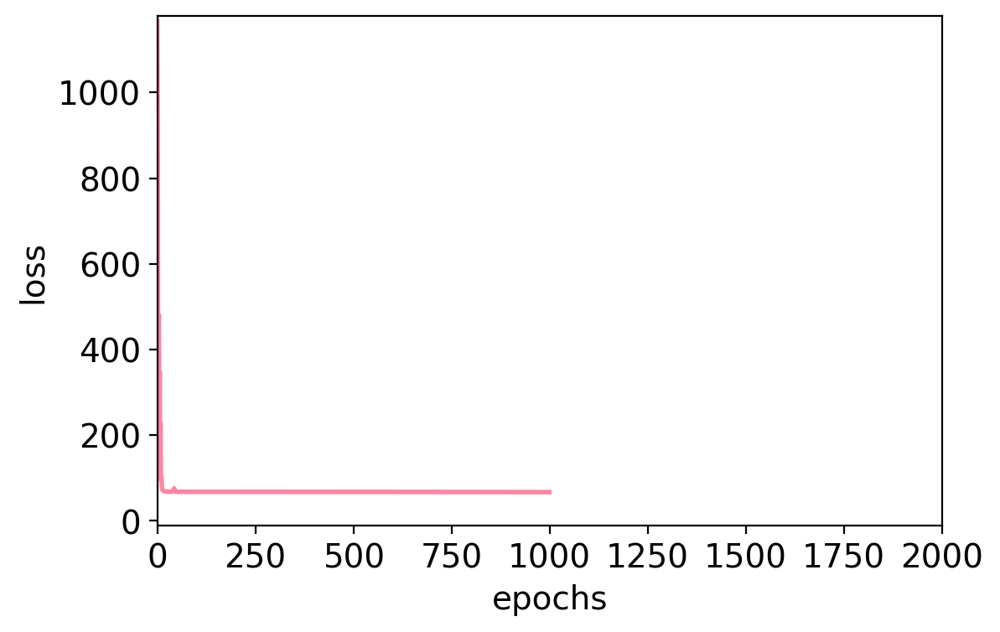

plot losses_ccc


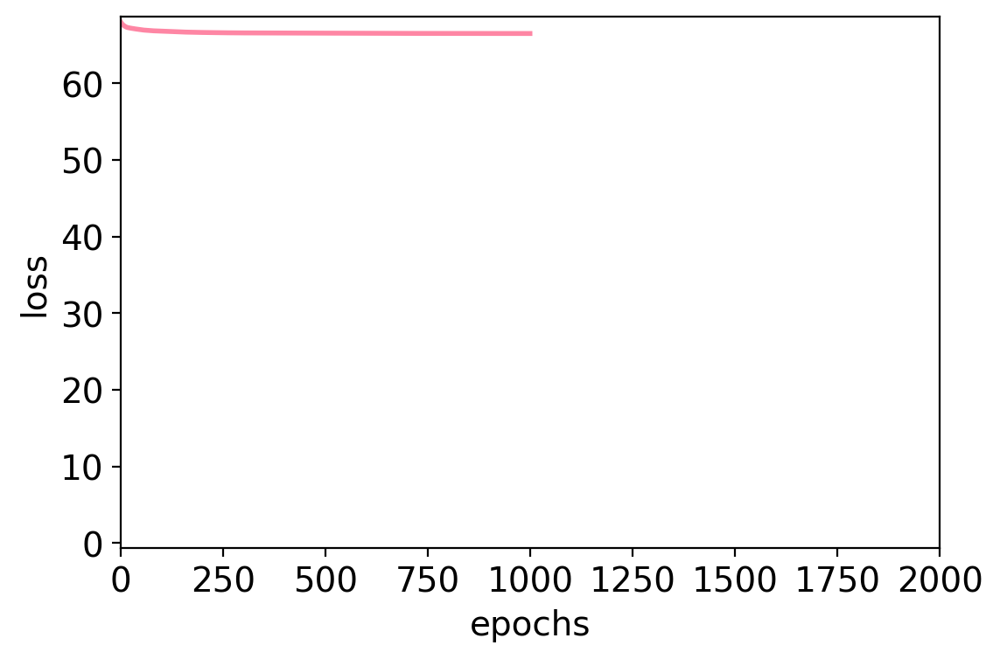

rho=0.4371610467628359
pval=0.0003039382946305436
obs_g2g=[[1.   0.69 0.01 0.62 0.   0.38 1.   0.57]
 [0.69 1.   0.46 1.   1.   0.92 0.77 0.69]
 [0.01 0.46 1.   0.16 0.83 0.91 0.29 0.71]
 [0.62 1.   0.16 1.   0.42 0.22 0.47 0.7 ]
 [0.   1.   0.83 0.42 1.   0.98 0.33 0.93]
 [0.38 0.92 0.91 0.22 0.98 1.   0.34 0.8 ]
 [1.   0.77 0.29 0.47 0.33 0.34 1.   0.24]
 [0.57 0.69 0.71 0.7  0.93 0.8  0.24 1.  ]]
exp_g2g=[[1.   0.71 0.18 0.96 0.32 0.39 0.46 0.25]
 [0.71 1.   0.39 0.86 0.18 0.36 0.07 0.32]
 [0.18 0.39 1.   0.5  0.57 0.86 0.5  0.14]
 [0.96 0.86 0.5  1.   0.82 0.   0.14 0.68]
 [0.32 0.18 0.57 0.82 1.   0.93 0.32 0.39]
 [0.39 0.36 0.86 0.   0.93 1.   0.57 0.5 ]
 [0.46 0.07 0.5  0.14 0.32 0.57 1.   0.71]
 [0.25 0.32 0.14 0.68 0.39 0.5  0.71 1.  ]]
rho=0.03269187874705605
pval=0.7976042239911769
simulation 65; time passed: 855.8310256004333
spearman_corr=-0.9865560742334198
plot losses_scc


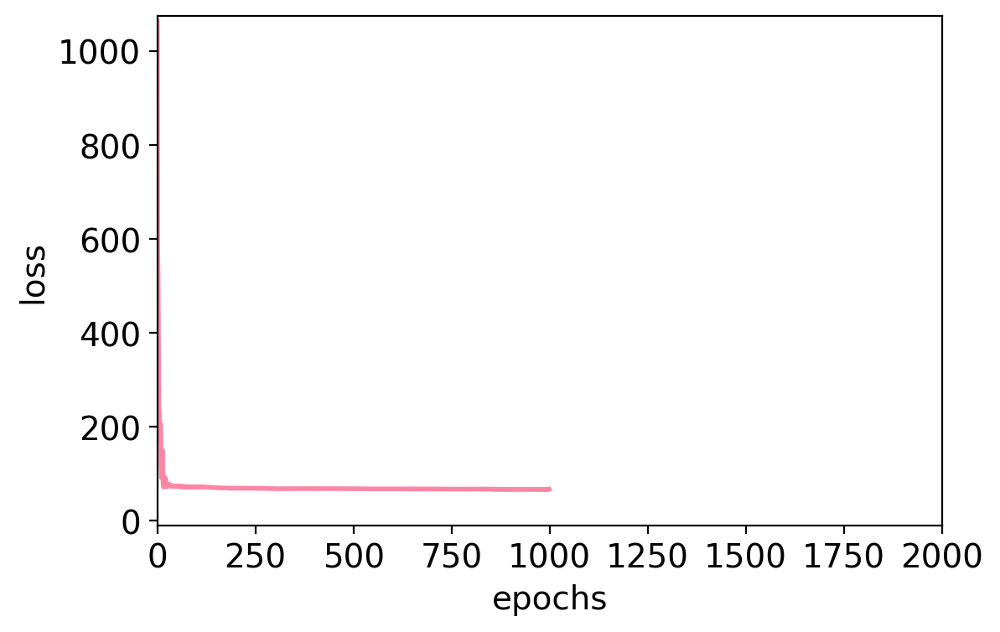

plot losses_ccc


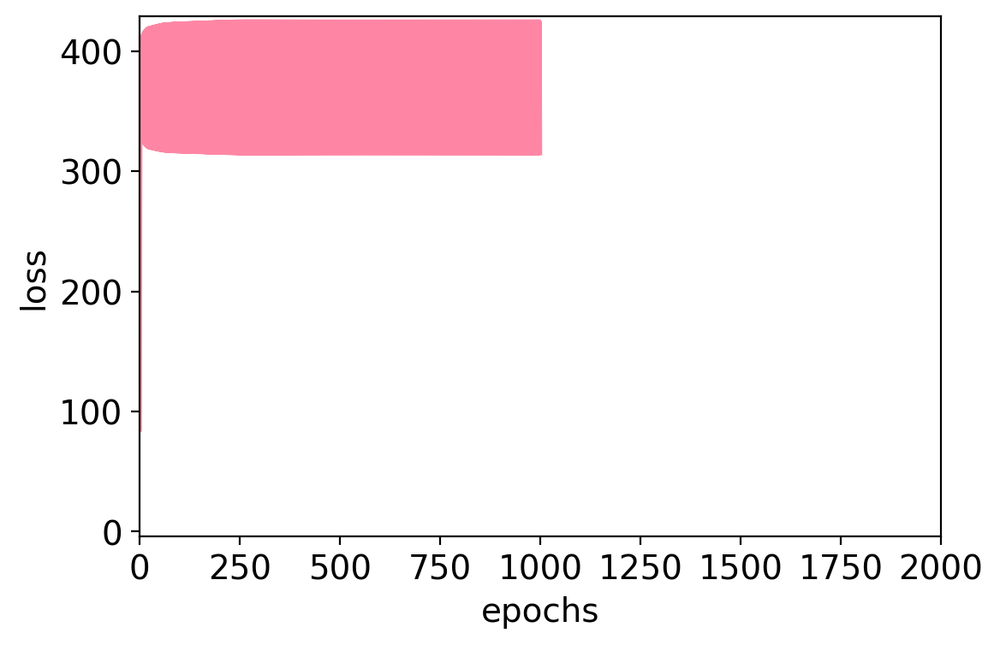

rho=0.2575980502577287
pval=0.039880062864298085
obs_g2g=[[1.   1.   0.13 0.   1.   0.   1.   1.  ]
 [1.   1.   1.   0.   1.   0.   1.   1.  ]
 [0.13 1.   1.   0.   1.   0.   0.   0.  ]
 [0.   0.   0.   1.   0.   1.   0.   0.  ]
 [1.   1.   1.   0.   1.   0.   1.   1.  ]
 [0.   0.   0.   1.   0.   1.   0.   0.  ]
 [1.   1.   0.   0.   1.   0.   1.   0.17]
 [1.   1.   0.   0.   1.   0.   0.17 1.  ]]
exp_g2g=[[1.   0.68 0.07 0.61 0.14 0.   0.04 0.07]
 [0.68 1.   0.96 0.68 0.75 0.5  0.29 0.57]
 [0.07 0.96 1.   0.64 0.32 0.71 0.07 0.36]
 [0.61 0.68 0.64 1.   0.79 0.07 0.25 0.54]
 [0.14 0.75 0.32 0.79 1.   0.21 0.82 0.93]
 [0.   0.5  0.71 0.07 0.21 1.   0.54 0.21]
 [0.04 0.29 0.07 0.25 0.82 0.54 1.   0.36]
 [0.07 0.57 0.36 0.54 0.93 0.21 0.36 1.  ]]
rho=0.1711828092352229
pval=0.17622226818074063
simulation 66; time passed: 869.005862236023
spearman_corr=-0.9997635217550087
plot losses_scc


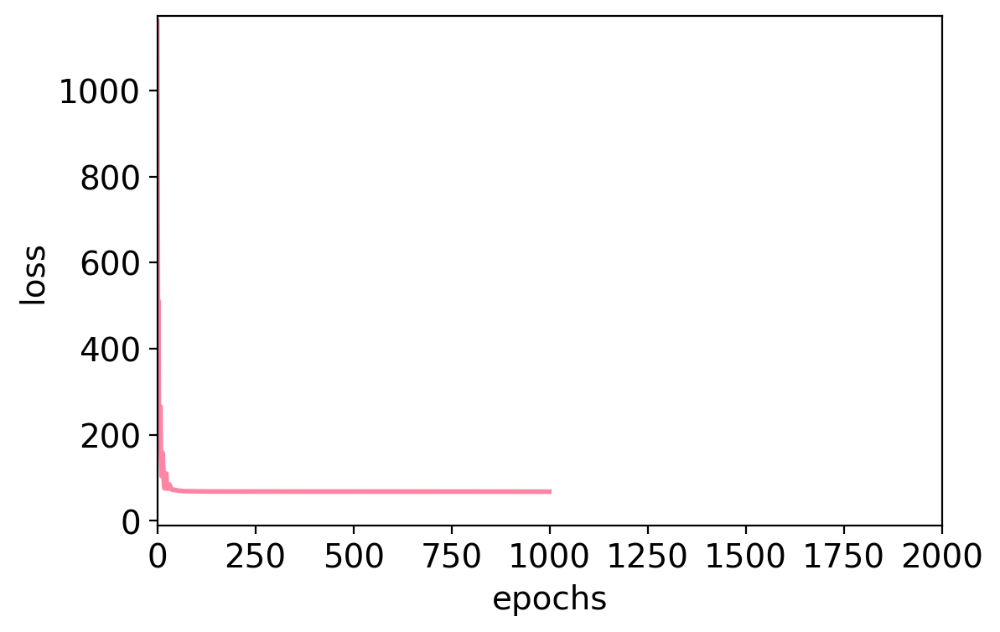

plot losses_ccc


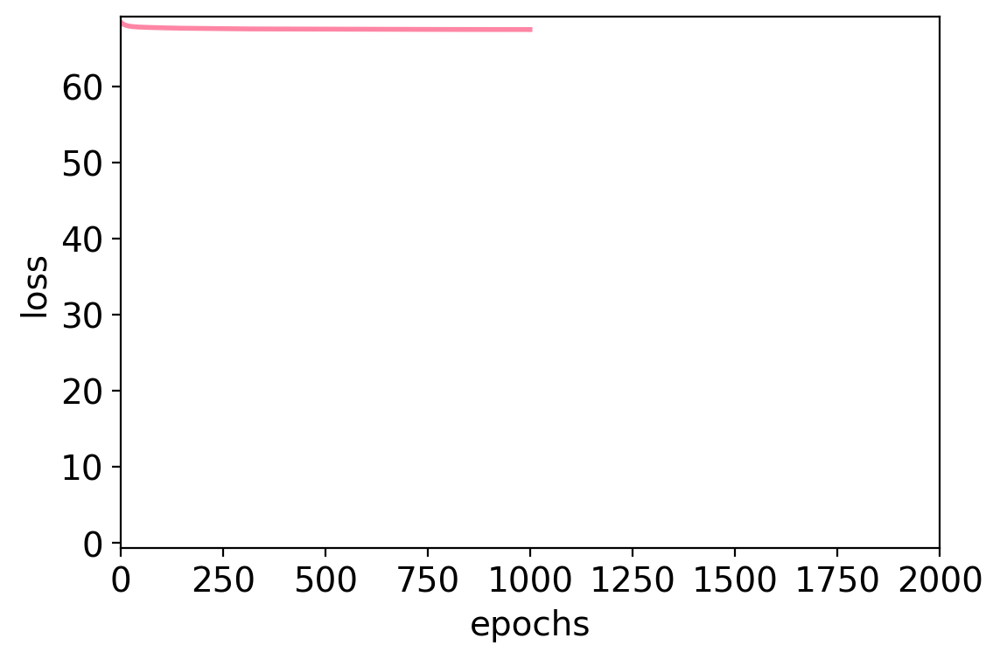

rho=0.27539887371363436
pval=0.02762641938624357
obs_g2g=[[1.   1.   1.   1.   1.   1.   0.64 0.45]
 [1.   1.   0.41 0.59 0.89 0.99 0.23 0.  ]
 [1.   0.41 1.   1.   0.84 0.91 0.77 0.62]
 [1.   0.59 1.   1.   0.91 0.87 1.   0.58]
 [1.   0.89 0.84 0.91 1.   0.9  0.76 0.23]
 [1.   0.99 0.91 0.87 0.9  1.   0.92 0.23]
 [0.64 0.23 0.77 1.   0.76 0.92 1.   0.69]
 [0.45 0.   0.62 0.58 0.23 0.23 0.69 1.  ]]
exp_g2g=[[1.   0.07 0.14 0.43 0.79 0.61 0.07 0.32]
 [0.07 1.   0.25 0.93 0.64 0.5  0.54 0.11]
 [0.14 0.25 1.   0.61 0.68 0.71 0.25 0.79]
 [0.43 0.93 0.61 1.   0.29 0.79 0.21 0.32]
 [0.79 0.64 0.68 0.29 1.   0.39 0.29 0.46]
 [0.61 0.5  0.71 0.79 0.39 1.   0.71 0.64]
 [0.07 0.54 0.25 0.21 0.29 0.71 1.   0.11]
 [0.32 0.11 0.79 0.32 0.46 0.64 0.11 1.  ]]
rho=0.4744978406785399
pval=7.458363324230717e-05
simulation 67; time passed: 882.2338178157806
spearman_corr=-0.9642390190205309
plot losses_scc


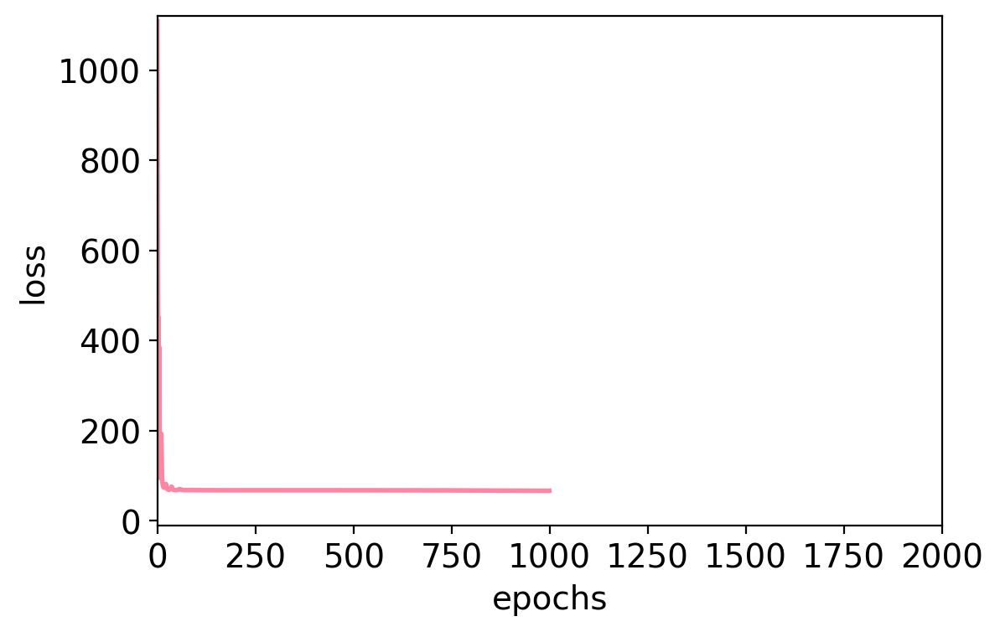

plot losses_ccc


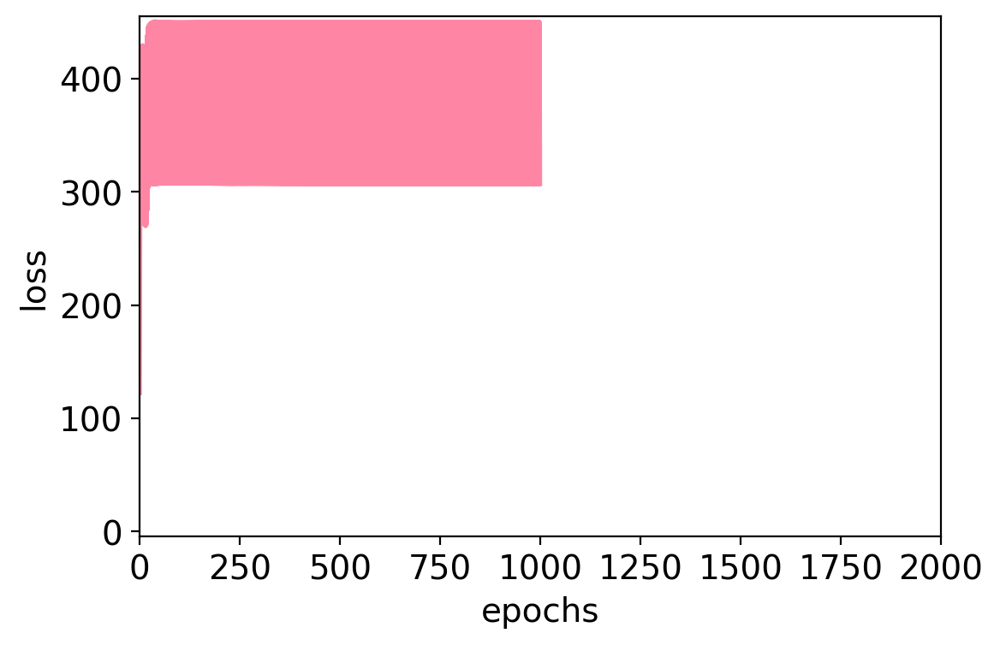

rho=0.08654157065327359
pval=0.4965268623111171
obs_g2g=[[1.   1.   0.   1.   0.77 0.   1.   0.  ]
 [1.   1.   0.   1.   1.   0.   1.   0.  ]
 [0.   0.   1.   0.   0.   1.   0.   1.  ]
 [1.   1.   0.   1.   0.65 0.   1.   0.  ]
 [0.77 1.   0.   0.65 1.   0.   1.   0.  ]
 [0.   0.   1.   0.   0.   1.   0.   1.  ]
 [1.   1.   0.   1.   1.   0.   1.   0.  ]
 [0.   0.   1.   0.   0.   1.   0.   1.  ]]
exp_g2g=[[1.   0.29 0.89 0.43 0.57 0.25 0.54 0.32]
 [0.29 1.   0.39 0.43 0.14 0.57 0.   0.61]
 [0.89 0.39 1.   0.57 0.25 0.57 0.71 0.68]
 [0.43 0.43 0.57 1.   0.5  0.96 0.64 0.04]
 [0.57 0.14 0.25 0.5  1.   0.32 0.07 0.75]
 [0.25 0.57 0.57 0.96 0.32 1.   0.36 0.68]
 [0.54 0.   0.71 0.64 0.07 0.36 1.   0.93]
 [0.32 0.61 0.68 0.04 0.75 0.68 0.93 1.  ]]
rho=0.17510694388419445
pval=0.16636913268000436
simulation 68; time passed: 895.430205821991
spearman_corr=-0.8118208158208159
plot losses_scc


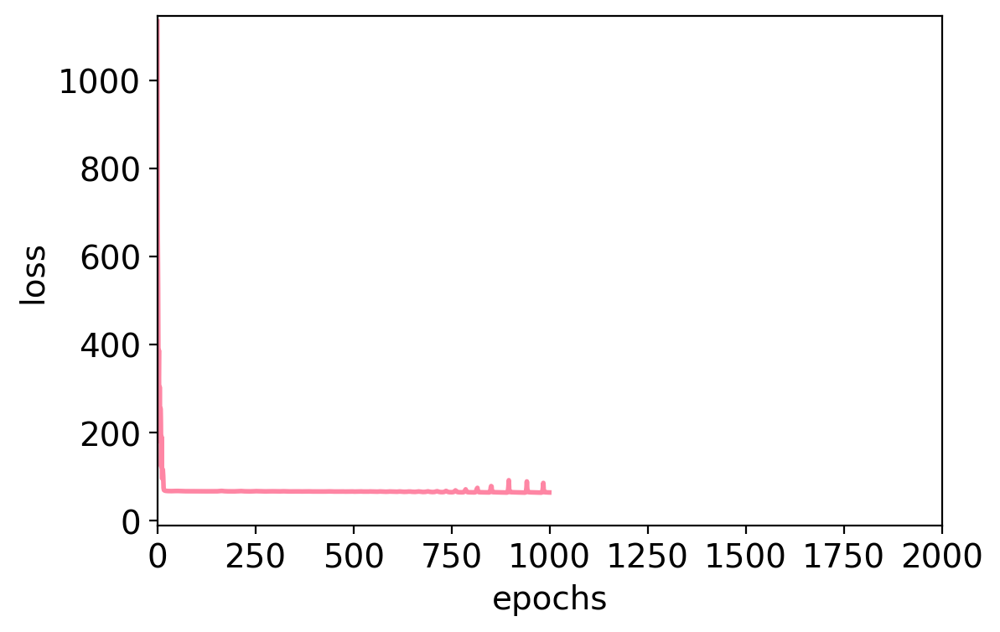

plot losses_ccc


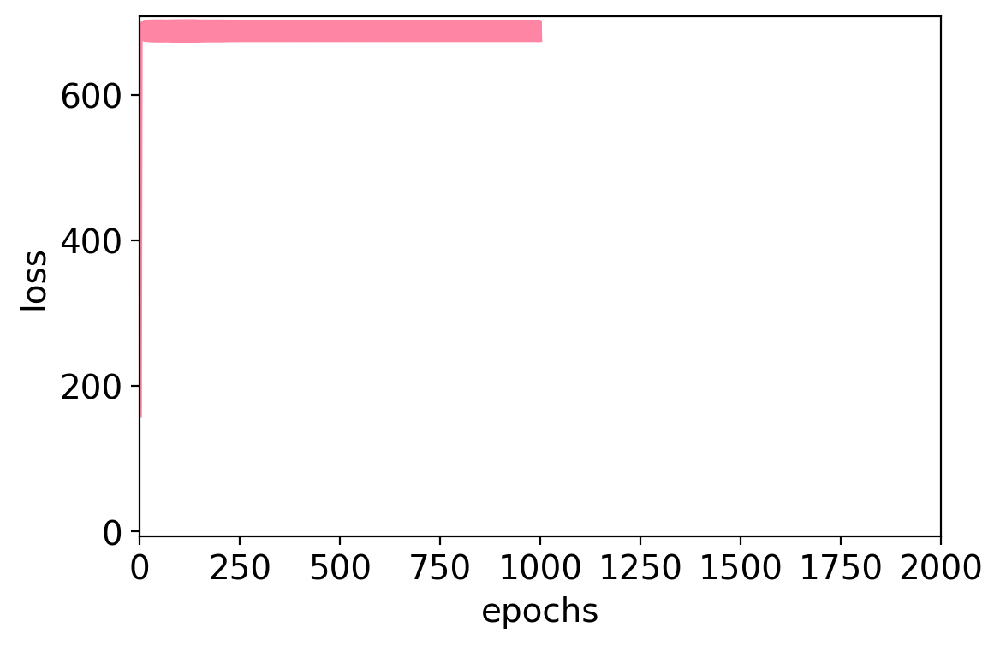

rho=0.1017516383841545
pval=0.4236823294274361
obs_g2g=[[1. 0. 0. 1. 0. 1. 1. 0.]
 [0. 1. 1. 0. 1. 0. 0. 1.]
 [0. 1. 1. 0. 1. 0. 0. 1.]
 [1. 0. 0. 1. 0. 1. 1. 0.]
 [0. 1. 1. 0. 1. 0. 0. 1.]
 [1. 0. 0. 1. 0. 1. 1. 0.]
 [1. 0. 0. 1. 0. 1. 1. 0.]
 [0. 1. 1. 0. 1. 0. 0. 1.]]
exp_g2g=[[1.   0.57 0.29 0.04 0.71 0.   0.54 0.68]
 [0.57 1.   0.93 0.29 0.18 0.64 0.68 0.82]
 [0.29 0.93 1.   0.93 0.57 0.36 0.21 0.21]
 [0.04 0.29 0.93 1.   0.5  0.54 0.04 0.32]
 [0.71 0.18 0.57 0.5  1.   0.36 0.82 0.75]
 [0.   0.64 0.36 0.54 0.36 1.   0.43 0.64]
 [0.54 0.68 0.21 0.04 0.82 0.43 1.   0.04]
 [0.68 0.82 0.21 0.32 0.75 0.64 0.04 1.  ]]
rho=0.16707662710545115
pval=0.18697983647658625
simulation 69; time passed: 908.4726617336273
spearman_corr=-0.7848954636048364
plot losses_scc


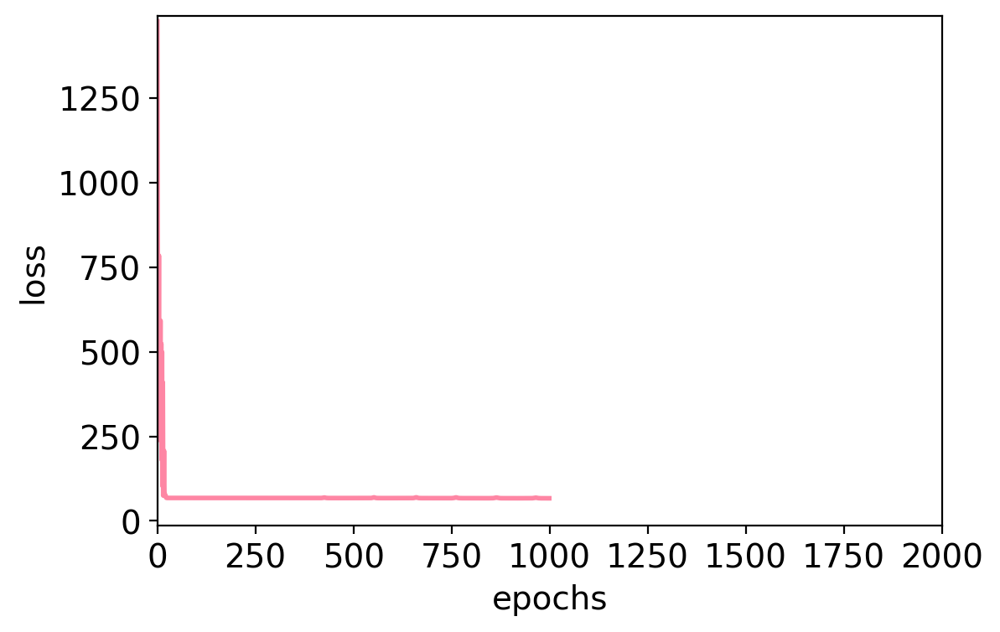

plot losses_ccc


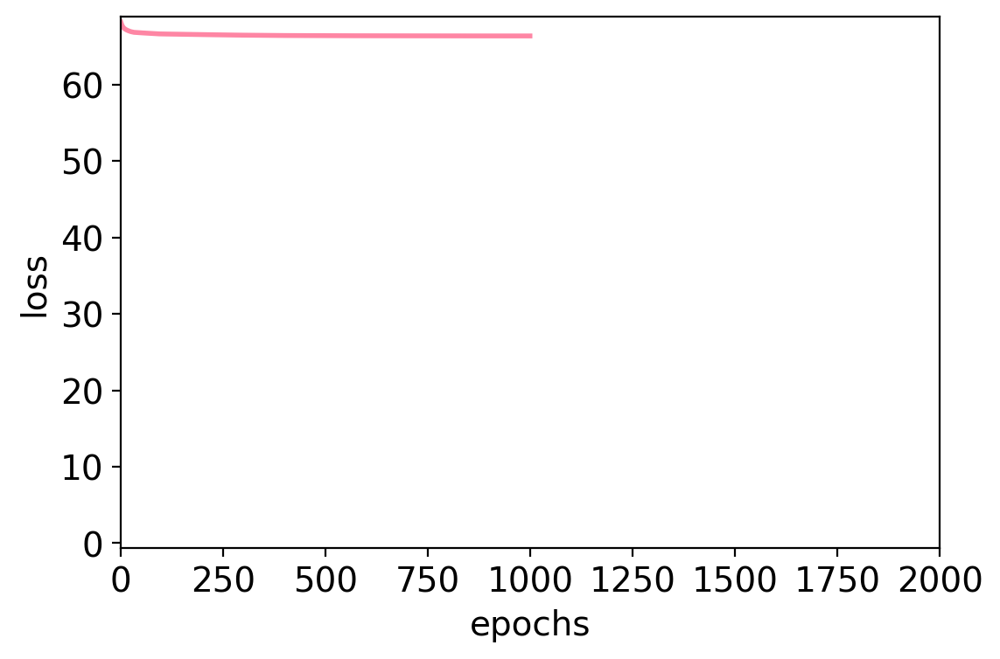

rho=0.4210886137326764
pval=0.0005303762787643261
obs_g2g=[[1.   1.   1.   0.66 0.62 1.   0.98 0.75]
 [1.   1.   1.   0.58 0.68 0.82 1.   1.  ]
 [1.   1.   1.   0.82 0.76 0.99 1.   1.  ]
 [0.66 0.58 0.82 1.   0.45 0.27 1.   0.87]
 [0.62 0.68 0.76 0.45 1.   0.38 0.46 0.83]
 [1.   0.82 0.99 0.27 0.38 1.   0.67 0.35]
 [0.98 1.   1.   1.   0.46 0.67 1.   0.75]
 [0.75 1.   1.   0.87 0.83 0.35 0.75 1.  ]]
exp_g2g=[[1.   0.29 0.89 0.04 0.11 0.89 0.64 0.64]
 [0.29 1.   0.54 0.61 0.64 0.86 0.93 0.86]
 [0.89 0.54 1.   0.82 0.5  0.25 0.61 0.64]
 [0.04 0.61 0.82 1.   0.   0.96 0.68 0.89]
 [0.11 0.64 0.5  0.   1.   0.57 0.75 0.39]
 [0.89 0.86 0.25 0.96 0.57 1.   0.07 0.68]
 [0.64 0.93 0.61 0.68 0.75 0.07 1.   0.43]
 [0.64 0.86 0.64 0.89 0.39 0.68 0.43 1.  ]]
rho=0.21864876355384974
pval=0.08260178183755233
simulation 70; time passed: 921.6969654560089
spearman_corr=-0.9981290960617436
plot losses_scc


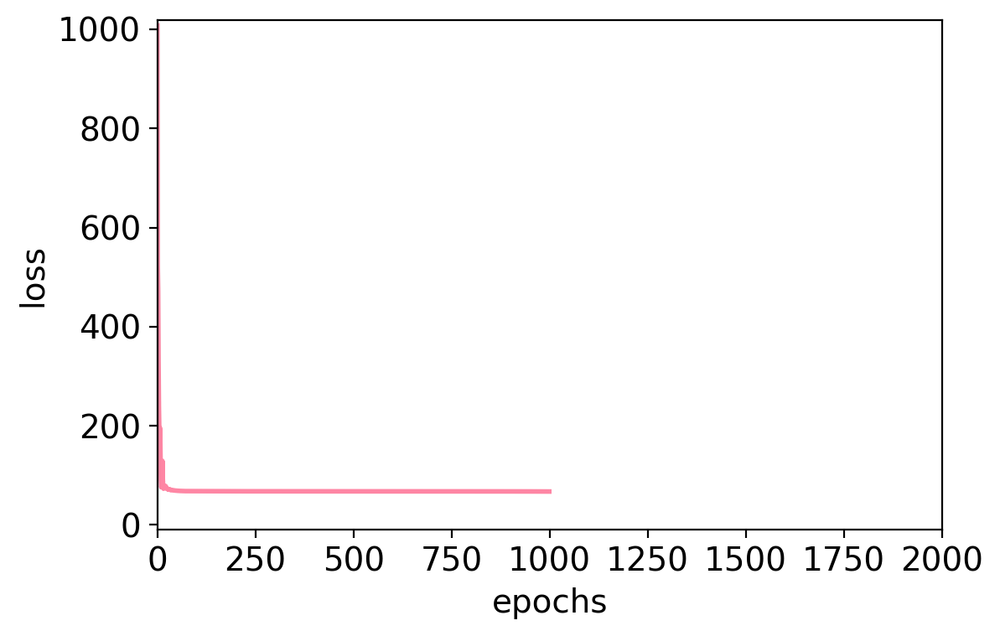

plot losses_ccc


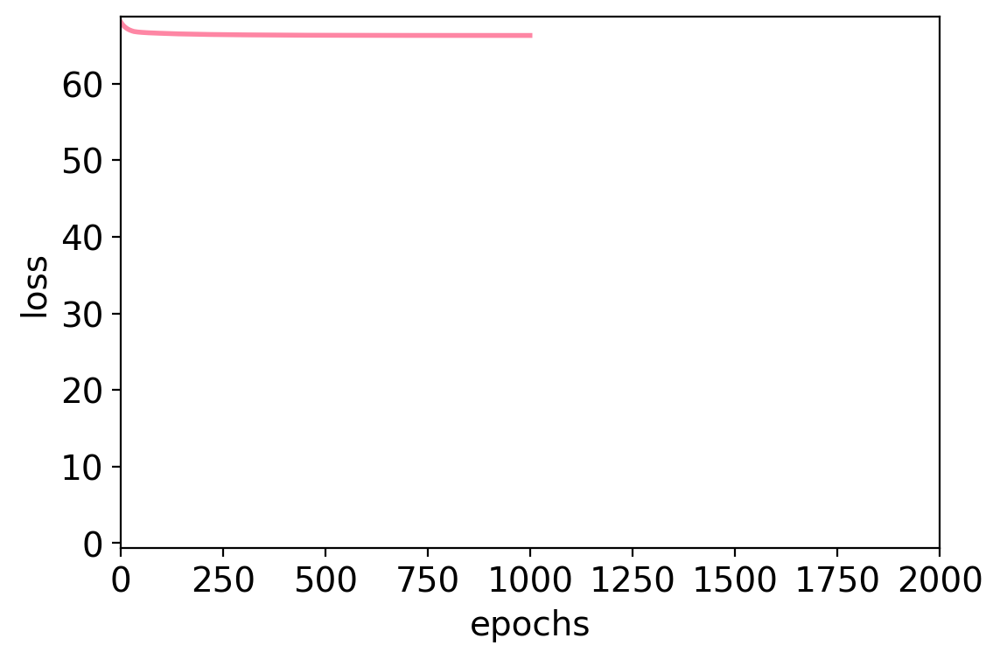

rho=0.23991217094198397
pval=0.056202948413900874
obs_g2g=[[1.   1.   1.   0.06 0.07 0.05 0.14 0.15]
 [1.   1.   1.   1.   0.48 0.21 1.   0.42]
 [1.   1.   1.   1.   0.41 0.37 1.   0.25]
 [0.06 1.   1.   1.   0.53 0.61 0.78 0.8 ]
 [0.07 0.48 0.41 0.53 1.   0.28 0.67 0.  ]
 [0.05 0.21 0.37 0.61 0.28 1.   0.85 0.  ]
 [0.14 1.   1.   0.78 0.67 0.85 1.   0.42]
 [0.15 0.42 0.25 0.8  0.   0.   0.42 1.  ]]
exp_g2g=[[1.   0.04 0.46 0.32 0.04 0.25 0.75 0.11]
 [0.04 1.   0.96 0.25 0.39 0.75 0.39 0.86]
 [0.46 0.96 1.   0.25 0.11 0.93 0.25 0.36]
 [0.32 0.25 0.25 1.   0.64 0.21 0.46 0.32]
 [0.04 0.39 0.11 0.64 1.   0.79 0.79 0.14]
 [0.25 0.75 0.93 0.21 0.79 1.   0.07 0.71]
 [0.75 0.39 0.25 0.46 0.79 0.07 1.   0.  ]
 [0.11 0.86 0.36 0.32 0.14 0.71 0.   1.  ]]
rho=-0.08775295159959898
pval=0.49049658047431377
simulation 71; time passed: 934.898309469223
spearman_corr=-0.9998168318146338
plot losses_scc


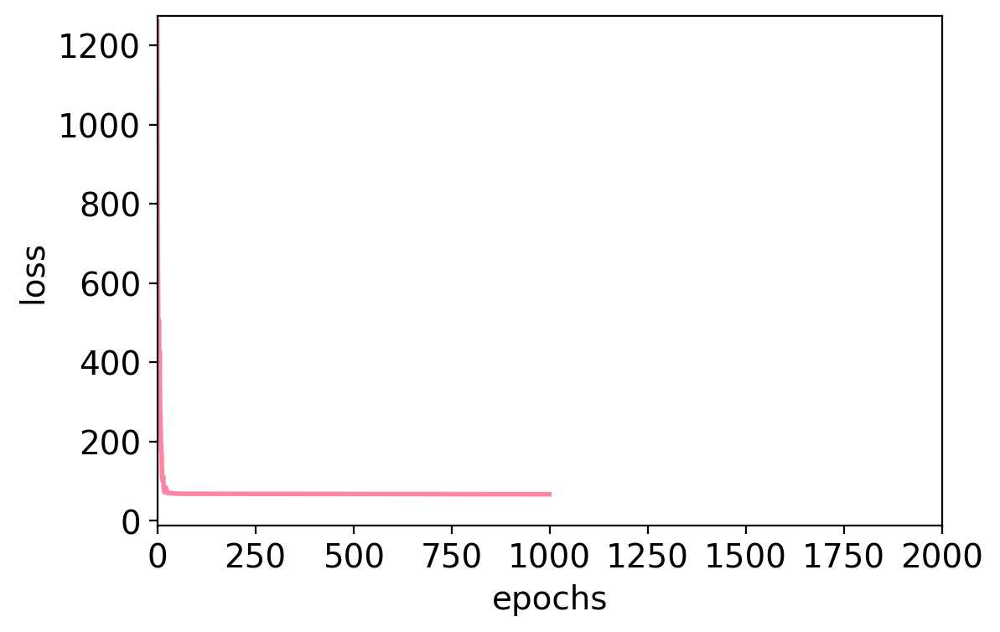

plot losses_ccc


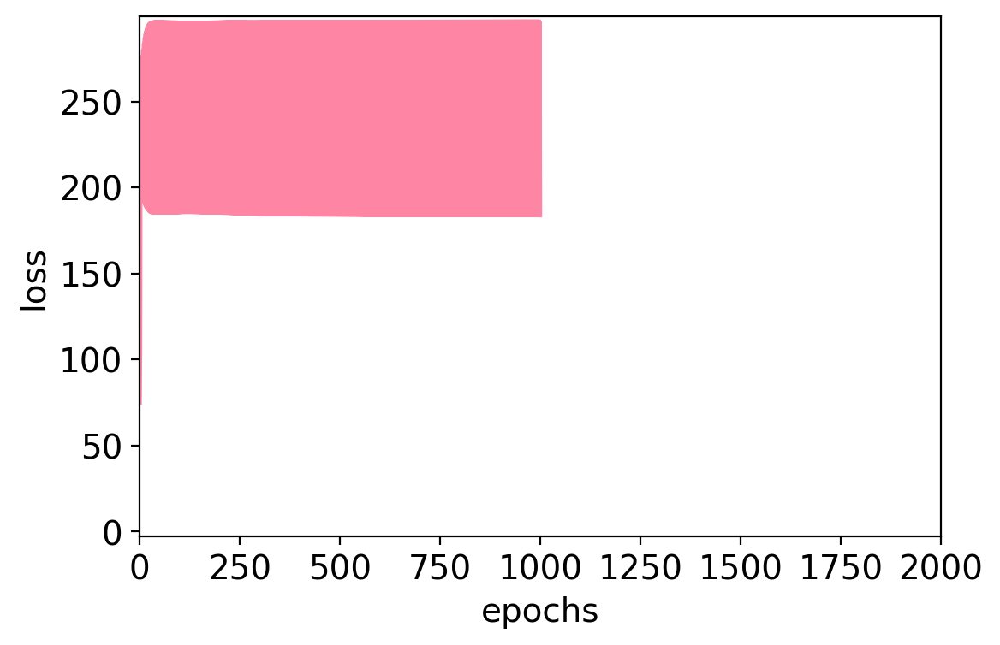

rho=0.10217667209834119
pval=0.42173857100389256
obs_g2g=[[1.   1.   1.   0.75 0.   0.85 0.   0.  ]
 [1.   1.   1.   0.54 0.   0.72 0.   0.  ]
 [1.   1.   1.   0.21 0.   0.66 0.   0.  ]
 [0.75 0.54 0.21 1.   1.   0.59 1.   1.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]
 [0.85 0.72 0.66 0.59 1.   1.   1.   1.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]]
exp_g2g=[[1.   0.43 0.57 0.29 0.36 0.18 0.54 0.82]
 [0.43 1.   0.61 0.25 0.54 0.04 0.89 0.39]
 [0.57 0.61 1.   0.89 0.75 0.89 0.79 0.29]
 [0.29 0.25 0.89 1.   0.39 0.89 0.89 0.04]
 [0.36 0.54 0.75 0.39 1.   0.36 0.93 0.04]
 [0.18 0.04 0.89 0.89 0.36 1.   0.   0.79]
 [0.54 0.89 0.79 0.89 0.93 0.   1.   0.79]
 [0.82 0.39 0.29 0.04 0.04 0.79 0.79 1.  ]]
rho=0.11228813242330557
pval=0.37702098799526107
simulation 72; time passed: 948.1222171783447
spearman_corr=-0.961749103765534
plot losses_scc


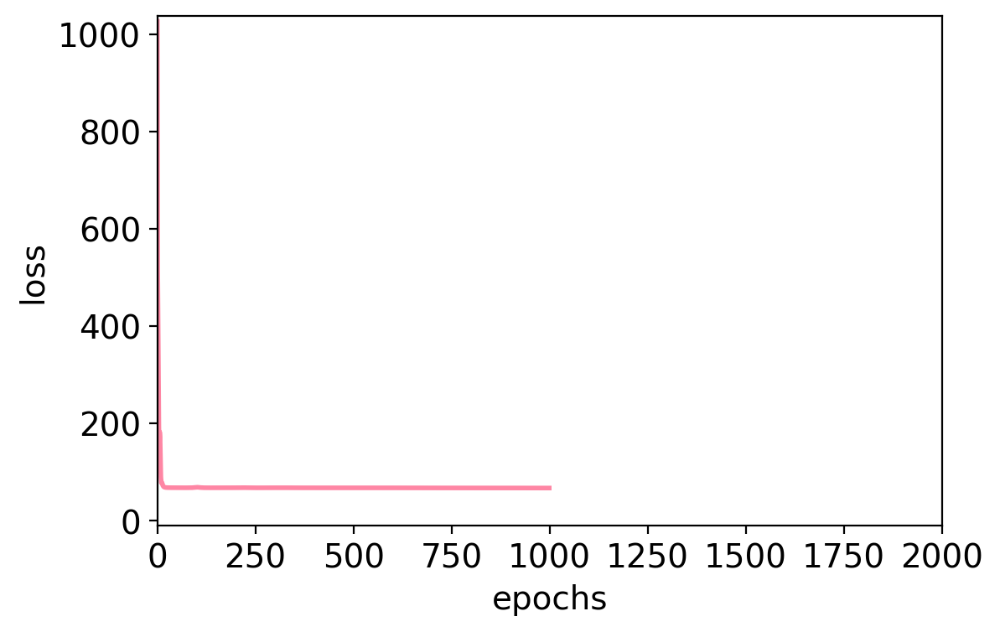

plot losses_ccc


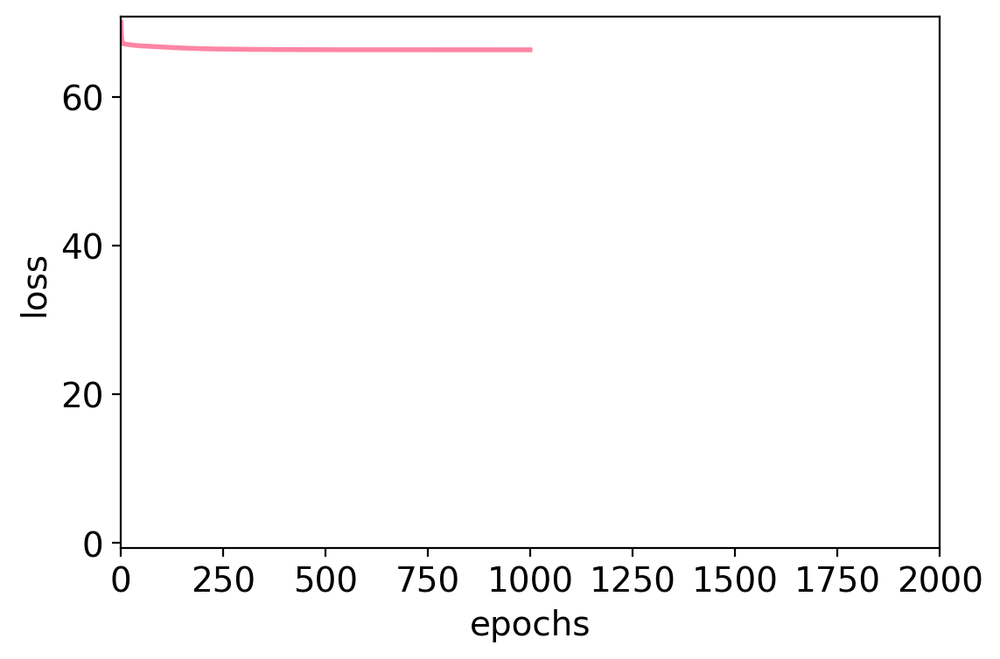

rho=0.28782915859462566
pval=0.02109441813235804
obs_g2g=[[1.   1.   0.   0.23 0.9  0.   0.47 0.64]
 [1.   1.   0.85 1.   1.   0.21 0.98 1.  ]
 [0.   0.85 1.   0.53 0.73 0.   0.27 0.37]
 [0.23 1.   0.53 1.   1.   0.89 0.93 1.  ]
 [0.9  1.   0.73 1.   1.   0.39 0.72 1.  ]
 [0.   0.21 0.   0.89 0.39 1.   0.21 0.41]
 [0.47 0.98 0.27 0.93 0.72 0.21 1.   0.53]
 [0.64 1.   0.37 1.   1.   0.41 0.53 1.  ]]
exp_g2g=[[1.   0.18 0.04 0.   0.29 0.54 0.11 0.82]
 [0.18 1.   0.32 0.14 0.29 0.32 0.61 0.46]
 [0.04 0.32 1.   0.68 0.07 0.68 0.79 0.57]
 [0.   0.14 0.68 1.   0.86 0.96 0.29 0.57]
 [0.29 0.29 0.07 0.86 1.   0.25 0.75 0.18]
 [0.54 0.32 0.68 0.96 0.25 1.   0.11 0.75]
 [0.11 0.61 0.79 0.29 0.75 0.11 1.   0.39]
 [0.82 0.46 0.57 0.57 0.18 0.75 0.39 1.  ]]
rho=nan
pval=nan
simulation 73; time passed: 961.1329514980316


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.9807914843304798
plot losses_scc


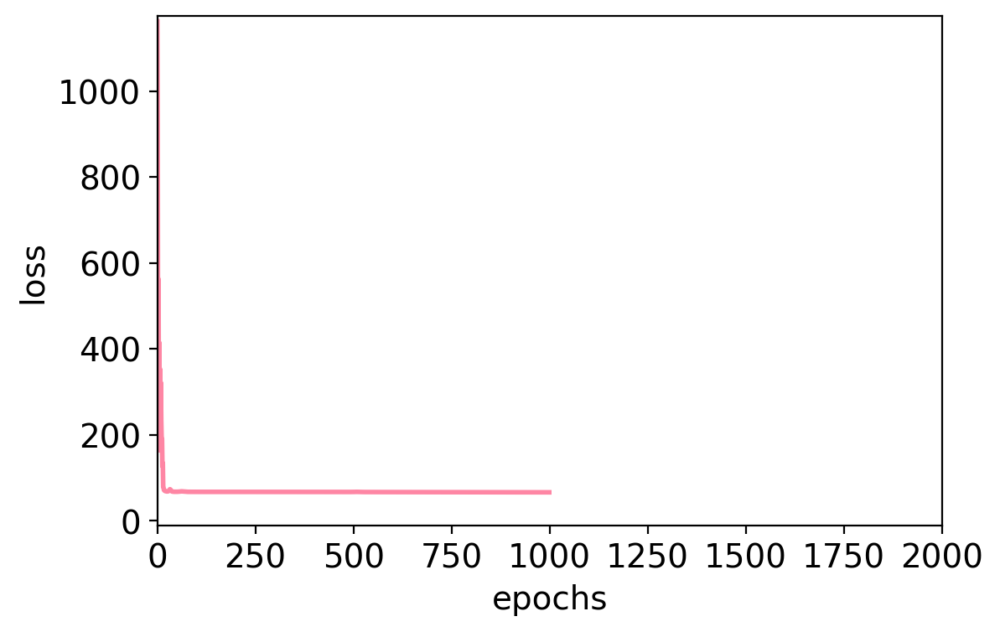

plot losses_ccc


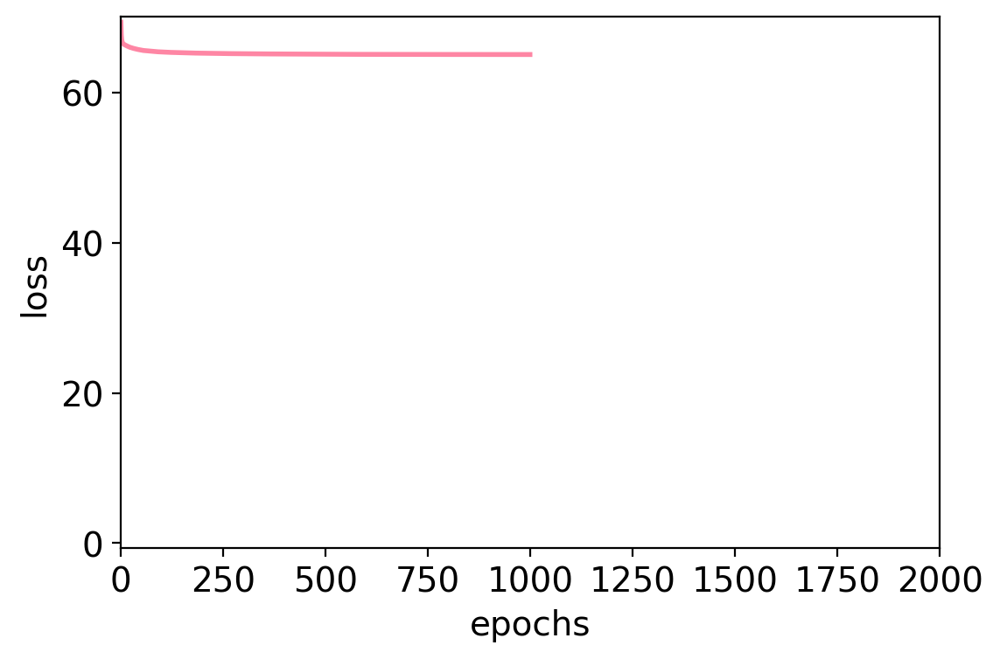

rho=0.3995953251896008
pval=0.0010709724145485822
obs_g2g=[[1.   1.   1.   1.   0.45 0.86 1.   0.89]
 [1.   1.   1.   1.   1.   1.   1.   0.84]
 [1.   1.   1.   1.   1.   1.   1.   0.72]
 [1.   1.   1.   1.   0.91 0.71 1.   0.84]
 [0.45 1.   1.   0.91 1.   0.82 1.   0.5 ]
 [0.86 1.   1.   0.71 0.82 1.   0.57 0.53]
 [1.   1.   1.   1.   1.   0.57 1.   0.71]
 [0.89 0.84 0.72 0.84 0.5  0.53 0.71 1.  ]]
exp_g2g=[[1.   0.64 0.54 0.79 0.29 0.   0.25 0.71]
 [0.64 1.   0.79 0.61 0.93 0.43 0.18 0.11]
 [0.54 0.79 1.   0.04 0.75 0.61 0.43 0.39]
 [0.79 0.61 0.04 1.   0.32 0.   0.57 0.64]
 [0.29 0.93 0.75 0.32 1.   0.21 0.5  0.21]
 [0.   0.43 0.61 0.   0.21 1.   0.93 0.43]
 [0.25 0.18 0.43 0.57 0.5  0.93 1.   0.61]
 [0.71 0.11 0.39 0.64 0.21 0.43 0.61 1.  ]]
rho=-0.048733689983214014
pval=0.7021551494135901
simulation 74; time passed: 974.5036337375641
spearman_corr=-0.999998235998236
plot losses_scc


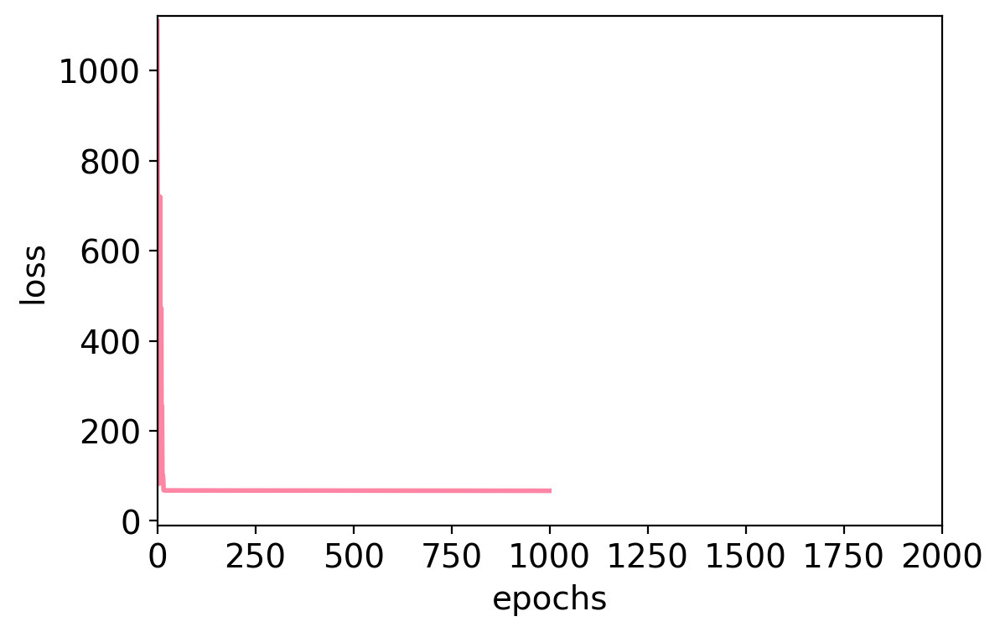

plot losses_ccc


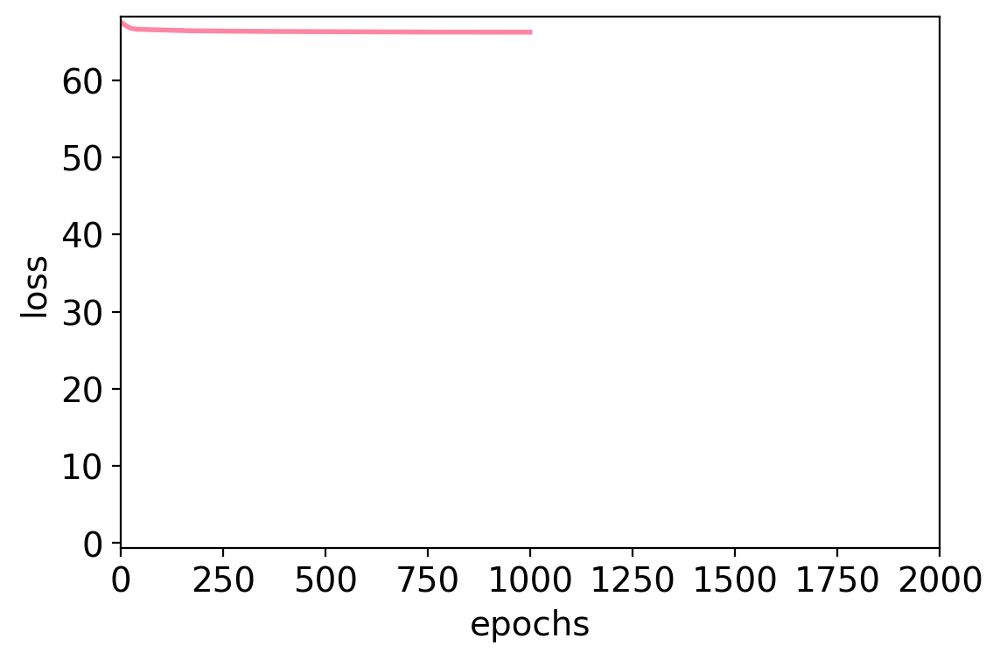

rho=0.36719302528782677
pval=0.002838900915930737
obs_g2g=[[1.   0.37 1.   0.79 0.75 0.24 0.96 0.69]
 [0.37 1.   1.   1.   0.92 0.85 0.36 1.  ]
 [1.   1.   1.   1.   0.97 0.46 0.66 0.82]
 [0.79 1.   1.   1.   1.   0.62 0.77 1.  ]
 [0.75 0.92 0.97 1.   1.   0.65 0.53 0.94]
 [0.24 0.85 0.46 0.62 0.65 1.   0.2  0.67]
 [0.96 0.36 0.66 0.77 0.53 0.2  1.   1.  ]
 [0.69 1.   0.82 1.   0.94 0.67 1.   1.  ]]
exp_g2g=[[1.   0.75 0.96 0.43 0.25 0.14 0.14 0.14]
 [0.75 1.   0.46 0.21 0.21 0.29 0.32 0.96]
 [0.96 0.46 1.   0.32 0.96 0.11 0.   0.89]
 [0.43 0.21 0.32 1.   0.04 0.43 0.57 0.79]
 [0.25 0.21 0.96 0.04 1.   0.32 0.75 0.82]
 [0.14 0.29 0.11 0.43 0.32 1.   0.43 0.93]
 [0.14 0.32 0.   0.57 0.75 0.43 1.   0.25]
 [0.14 0.96 0.89 0.79 0.82 0.93 0.25 1.  ]]
rho=0.18238163184787948
pval=0.14918239110911205
simulation 75; time passed: 987.7126274108887
spearman_corr=-0.9997886437861075
plot losses_scc


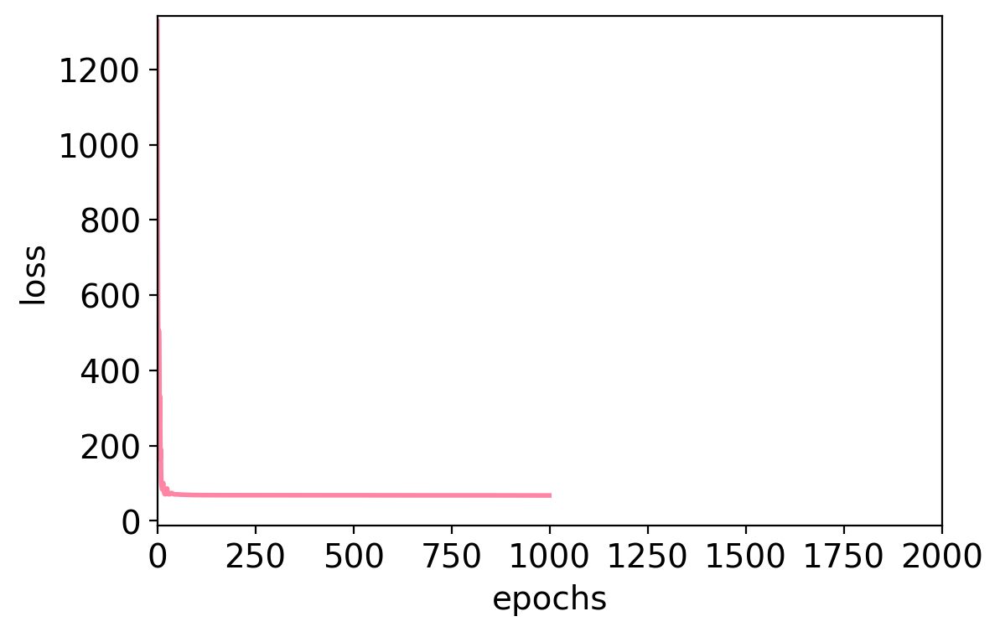

plot losses_ccc


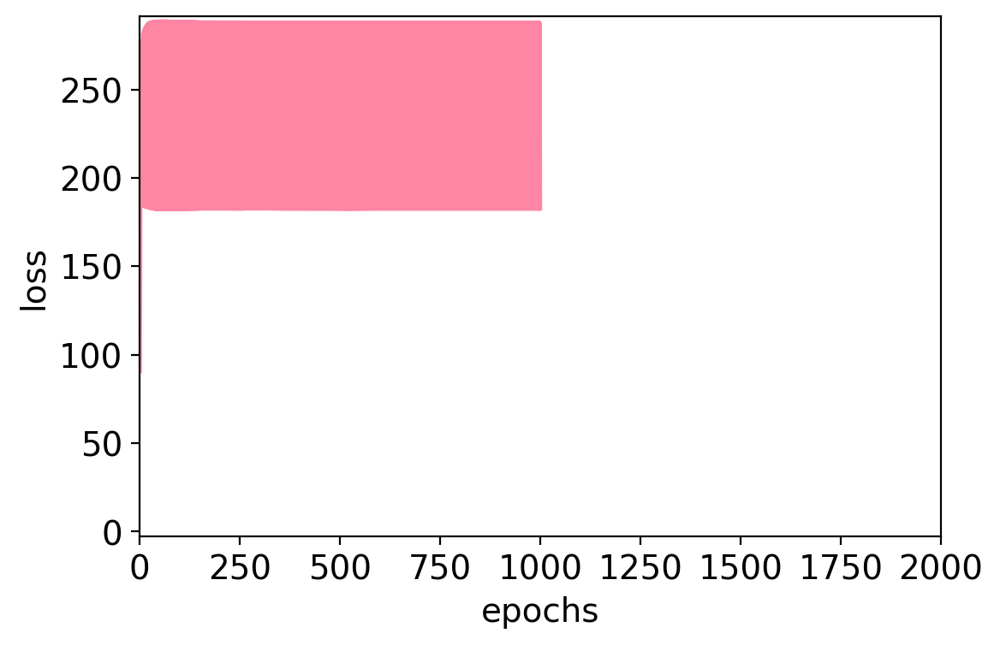

rho=0.21315528011877574
pval=0.09081215951139637
obs_g2g=[[1.   1.   1.   1.   0.   0.81 0.   0.  ]
 [1.   1.   0.7  1.   0.   1.   0.   0.  ]
 [1.   0.7  1.   0.79 0.   0.45 0.   0.24]
 [1.   1.   0.79 1.   0.   0.56 0.   0.  ]
 [0.   0.   0.   0.   1.   0.   1.   1.  ]
 [0.81 1.   0.45 0.56 0.   1.   0.12 0.  ]
 [0.   0.   0.   0.   1.   0.12 1.   1.  ]
 [0.   0.   0.24 0.   1.   0.   1.   1.  ]]
exp_g2g=[[1.   0.36 0.29 0.79 0.43 0.5  0.71 0.64]
 [0.36 1.   0.18 0.21 0.71 0.93 0.46 0.18]
 [0.29 0.18 1.   0.93 0.46 0.96 0.36 0.61]
 [0.79 0.21 0.93 1.   0.71 0.86 0.21 0.32]
 [0.43 0.71 0.46 0.71 1.   0.82 0.32 0.11]
 [0.5  0.93 0.96 0.86 0.82 1.   0.43 0.79]
 [0.71 0.46 0.36 0.21 0.32 0.43 1.   0.79]
 [0.64 0.18 0.61 0.32 0.11 0.79 0.79 1.  ]]
rho=0.14166555747570841
pval=0.2641524268776605
simulation 76; time passed: 1000.9517376422882
spearman_corr=-0.9947763646823393
plot losses_scc


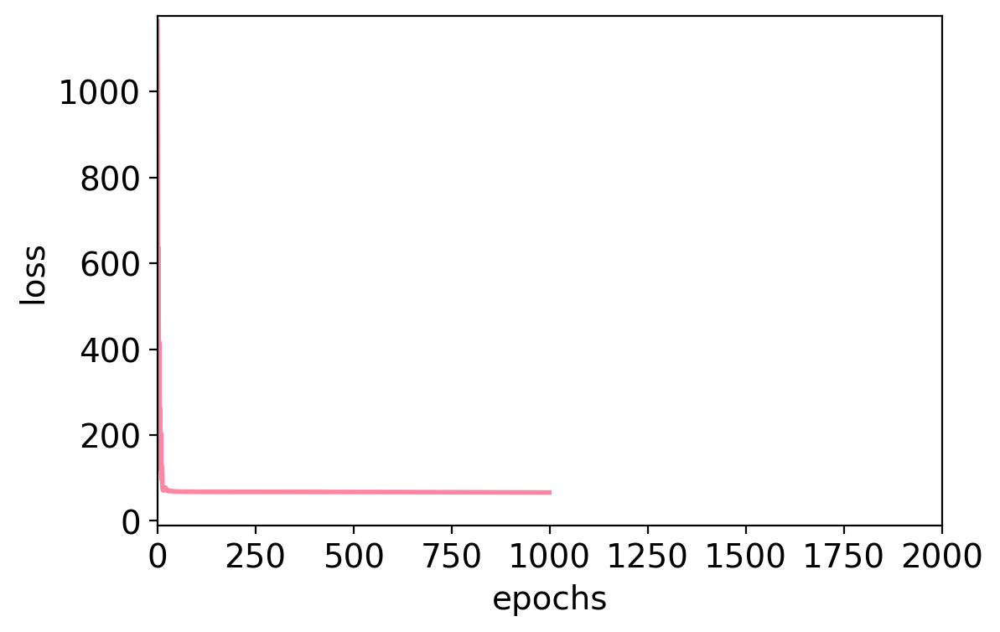

plot losses_ccc


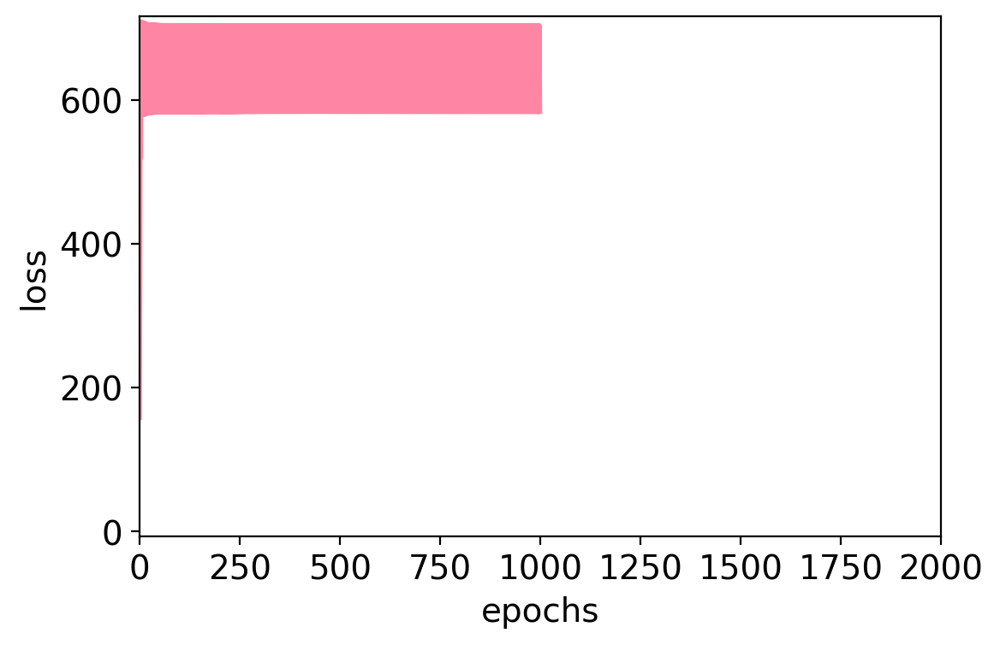

rho=0.10658104488387826
pval=0.40189893029274215
obs_g2g=[[1.   1.   1.   0.   0.   0.   0.   0.  ]
 [1.   1.   1.   0.   0.   0.   0.   0.  ]
 [1.   1.   1.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]
 [0.   0.   0.   1.   1.   1.   0.77 1.  ]
 [0.   0.   0.   1.   1.   0.77 1.   1.  ]
 [0.   0.   0.   1.   1.   1.   1.   1.  ]]
exp_g2g=[[1.   0.93 0.5  0.57 0.   0.75 0.29 0.43]
 [0.93 1.   0.96 0.54 0.64 0.21 0.29 0.68]
 [0.5  0.96 1.   0.57 0.36 0.14 0.93 0.46]
 [0.57 0.54 0.57 1.   0.04 0.11 0.18 0.18]
 [0.   0.64 0.36 0.04 1.   0.57 0.21 0.29]
 [0.75 0.21 0.14 0.11 0.57 1.   0.04 0.04]
 [0.29 0.29 0.93 0.18 0.21 0.04 1.   0.82]
 [0.43 0.68 0.46 0.18 0.29 0.04 0.82 1.  ]]
rho=0.13440082190640149
pval=0.2896780379613517
simulation 77; time passed: 1014.1624944210052
spearman_corr=-0.710527854791022
plot losses_scc


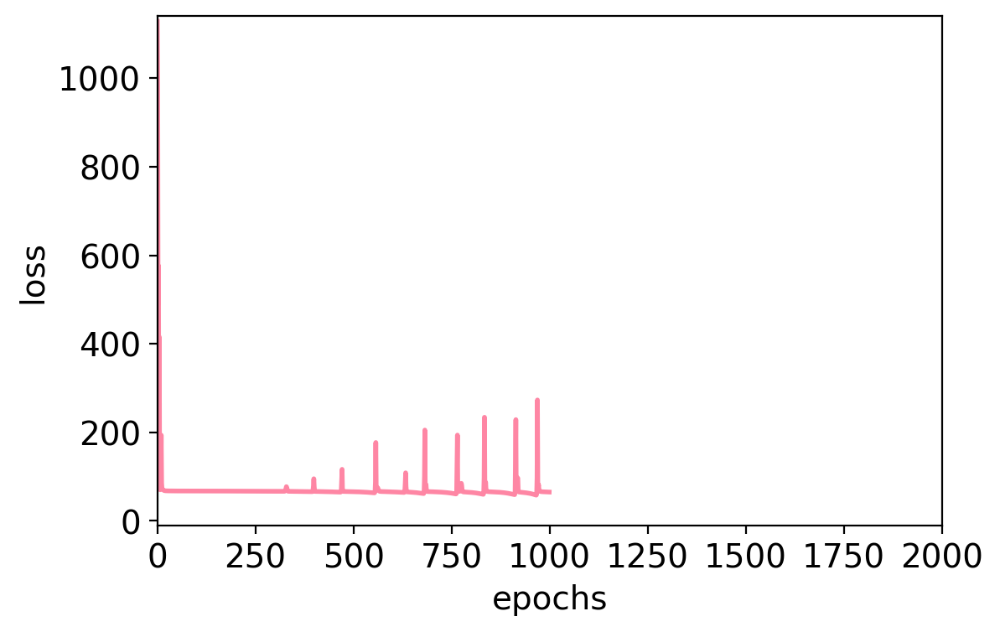

plot losses_ccc


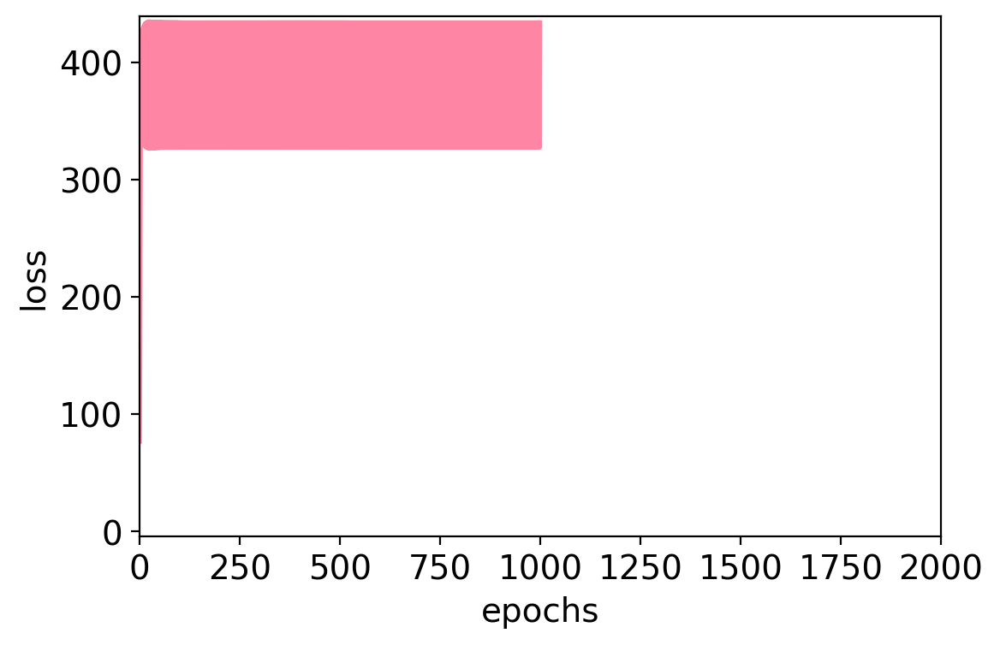

rho=0.22937361442523702
pval=0.06827090631430831
obs_g2g=[[1.   0.   1.   1.   0.38 1.   0.09 0.  ]
 [0.   1.   1.   1.   0.31 1.   0.02 0.  ]
 [1.   1.   1.   0.   1.   0.   1.   1.  ]
 [1.   1.   0.   1.   1.   0.   1.   1.  ]
 [0.38 0.31 1.   1.   1.   0.35 0.67 0.22]
 [1.   1.   0.   0.   0.35 1.   0.71 1.  ]
 [0.09 0.02 1.   1.   0.67 0.71 1.   0.  ]
 [0.   0.   1.   1.   0.22 1.   0.   1.  ]]
exp_g2g=[[1.   0.96 0.21 0.54 0.5  0.89 0.21 0.25]
 [0.96 1.   0.61 0.64 0.14 0.39 0.46 0.64]
 [0.21 0.61 1.   0.11 0.36 0.32 0.79 0.43]
 [0.54 0.64 0.11 1.   0.14 0.39 0.07 0.54]
 [0.5  0.14 0.36 0.14 1.   0.04 0.57 0.07]
 [0.89 0.39 0.32 0.39 0.04 1.   0.68 0.21]
 [0.21 0.46 0.79 0.07 0.57 0.68 1.   0.79]
 [0.25 0.64 0.43 0.54 0.07 0.21 0.79 1.  ]]
rho=0.23441812721965818
pval=0.062257867024308015
simulation 78; time passed: 1027.2359073162079
spearman_corr=-0.30240572640572644
plot losses_scc


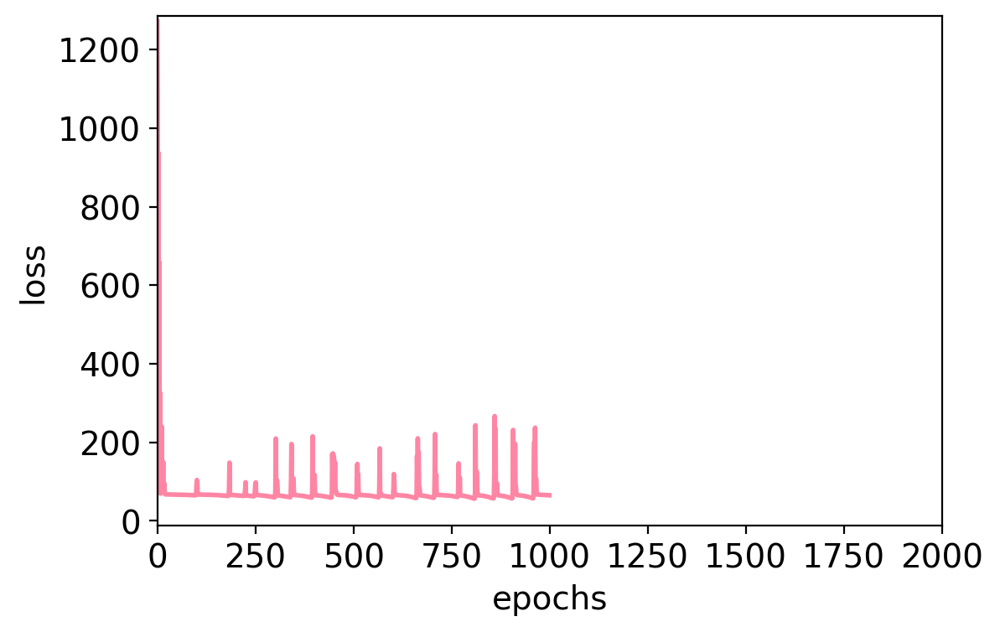

plot losses_ccc


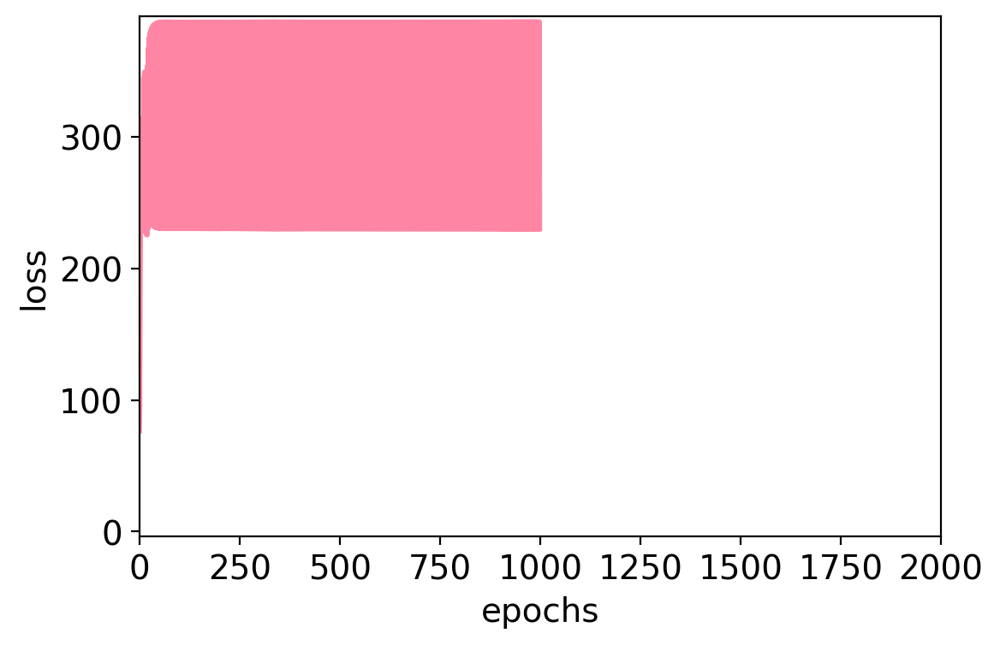

rho=0.163983948879795
pval=0.1953889566062879
obs_g2g=[[1.   0.   0.   1.   0.   0.   0.   1.  ]
 [0.   1.   1.   0.   1.   1.   1.   0.  ]
 [0.   1.   1.   0.   1.   1.   1.   0.  ]
 [1.   0.   0.   1.   0.   0.   0.   1.  ]
 [0.   1.   1.   0.   1.   1.   1.   0.  ]
 [0.   1.   1.   0.   1.   1.   1.   0.46]
 [0.   1.   1.   0.   1.   1.   1.   0.  ]
 [1.   0.   0.   1.   0.   0.46 0.   1.  ]]
exp_g2g=[[1.   0.32 0.75 0.39 0.61 0.79 0.79 0.18]
 [0.32 1.   0.89 0.93 0.39 0.57 0.54 0.32]
 [0.75 0.89 1.   0.39 0.68 0.64 0.04 0.46]
 [0.39 0.93 0.39 1.   0.5  0.21 0.21 0.29]
 [0.61 0.39 0.68 0.5  1.   0.29 0.36 0.04]
 [0.79 0.57 0.64 0.21 0.29 1.   0.64 0.29]
 [0.79 0.54 0.04 0.21 0.36 0.64 1.   0.39]
 [0.18 0.32 0.46 0.29 0.04 0.29 0.39 1.  ]]
rho=0.30608695235584454
pval=0.013902019938781863
simulation 79; time passed: 1040.4141771793365
spearman_corr=-0.6354599034599036
plot losses_scc


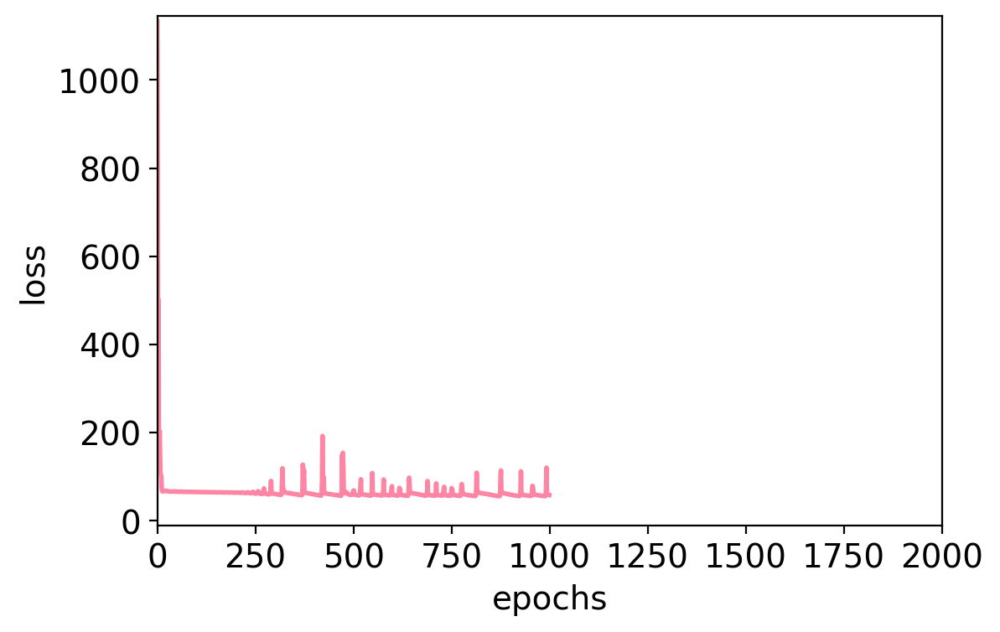

plot losses_ccc


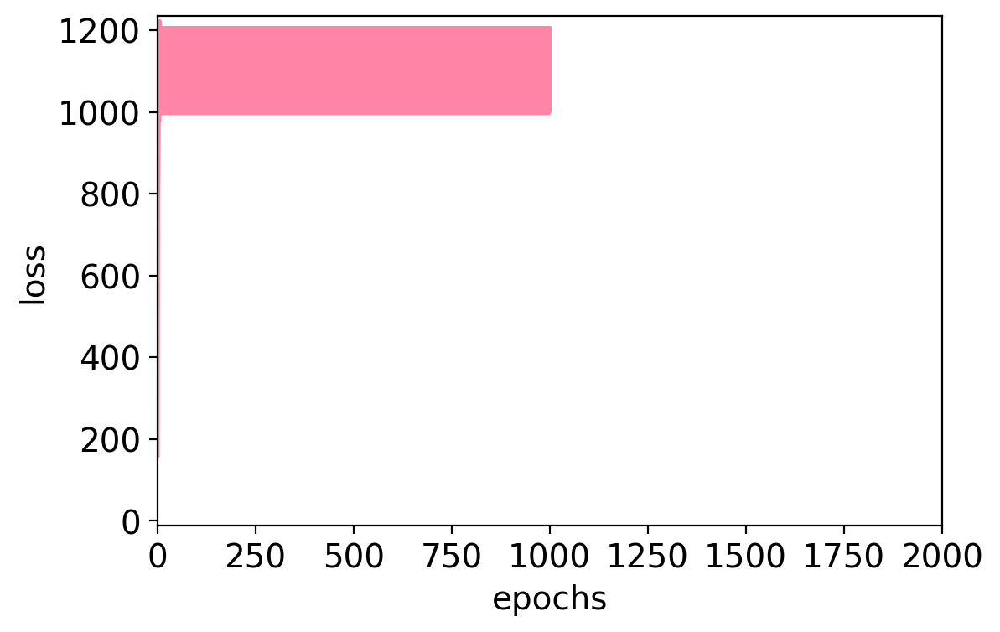

rho=-0.021023533249105466
pval=0.8690293132843852
obs_g2g=[[1. 1. 0. 0. 0. 0. 0. 0.]
 [1. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1.]]
exp_g2g=[[1.   0.25 0.54 0.39 0.07 0.68 0.57 0.57]
 [0.25 1.   0.5  0.79 0.89 0.21 0.36 0.71]
 [0.54 0.5  1.   0.43 0.39 0.   0.11 0.89]
 [0.39 0.79 0.43 1.   0.18 0.5  0.25 0.46]
 [0.07 0.89 0.39 0.18 1.   0.86 0.89 0.04]
 [0.68 0.21 0.   0.5  0.86 1.   0.11 0.07]
 [0.57 0.36 0.11 0.25 0.89 0.11 1.   0.89]
 [0.57 0.71 0.89 0.46 0.04 0.07 0.89 1.  ]]
rho=-0.021023533249105466
pval=0.8690293132843852
simulation 80; time passed: 1053.633061170578
spearman_corr=-0.9998982038969824
plot losses_scc


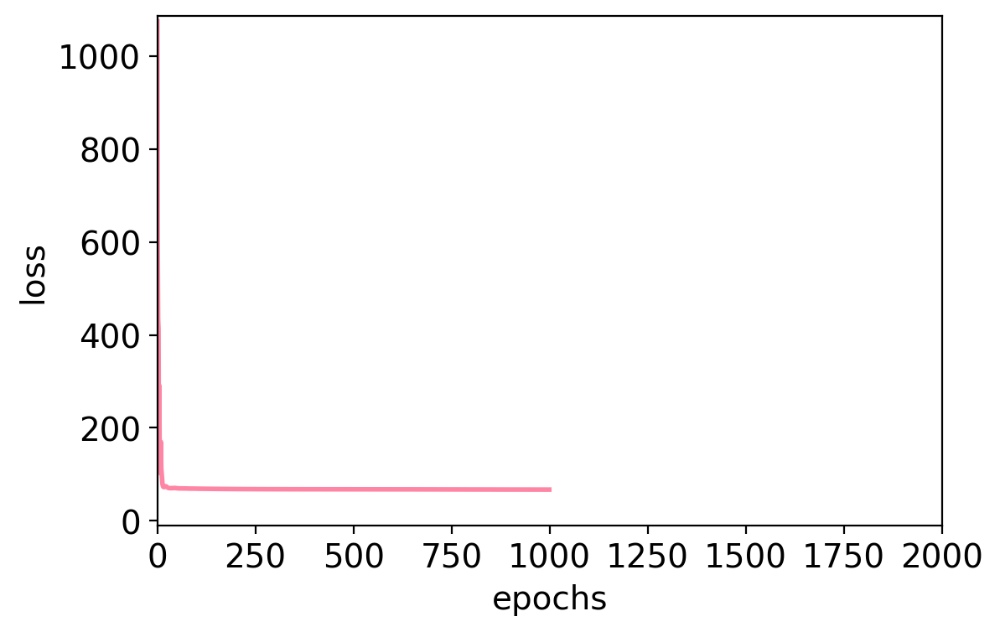

plot losses_ccc


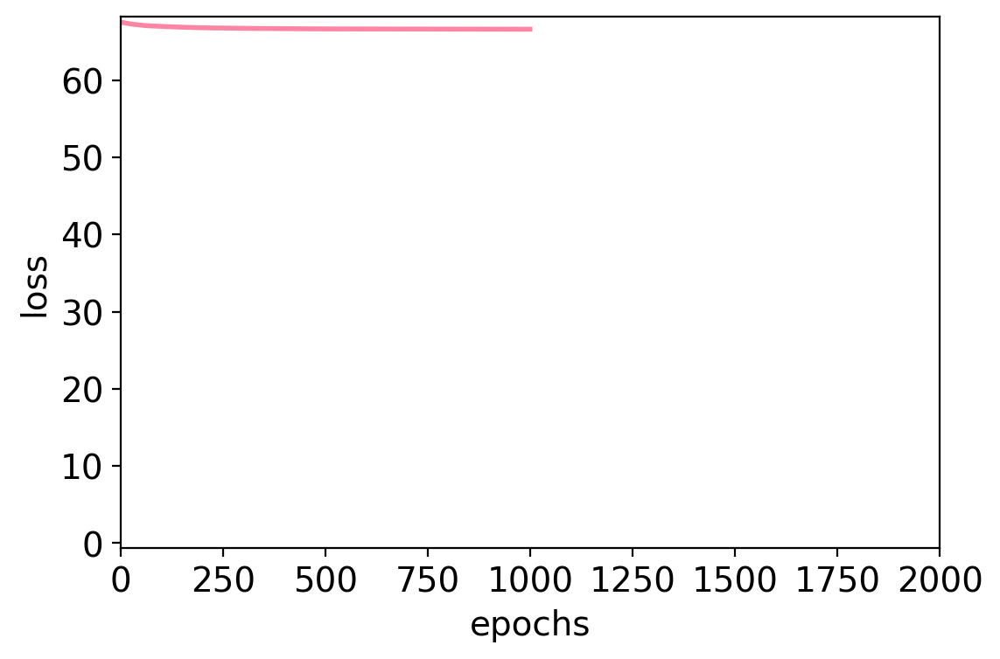

rho=0.4681511268219854
pval=9.58032748023034e-05
obs_g2g=[[1.   0.75 0.87 0.   0.54 0.57 0.11 0.01]
 [0.75 1.   0.32 0.   1.   0.9  0.02 0.62]
 [0.87 0.32 1.   0.31 1.   1.   0.89 1.  ]
 [0.   0.   0.31 1.   0.   0.   0.01 0.39]
 [0.54 1.   1.   0.   1.   1.   0.71 1.  ]
 [0.57 0.9  1.   0.   1.   1.   0.43 1.  ]
 [0.11 0.02 0.89 0.01 0.71 0.43 1.   0.79]
 [0.01 0.62 1.   0.39 1.   1.   0.79 1.  ]]
exp_g2g=[[1.   0.43 0.64 0.14 0.64 0.46 0.29 0.54]
 [0.43 1.   0.   0.29 0.46 0.75 0.39 0.21]
 [0.64 0.   1.   0.5  0.18 0.93 0.11 0.54]
 [0.14 0.29 0.5  1.   0.   0.68 0.75 0.71]
 [0.64 0.46 0.18 0.   1.   0.86 0.86 0.96]
 [0.46 0.75 0.93 0.68 0.86 1.   0.11 0.25]
 [0.29 0.39 0.11 0.75 0.86 0.11 1.   0.46]
 [0.54 0.21 0.54 0.71 0.96 0.25 0.46 1.  ]]
rho=0.26117504049805024
pval=0.03711012919626734
simulation 81; time passed: 1066.8125805854797
spearman_corr=-0.9993626793626794
plot losses_scc


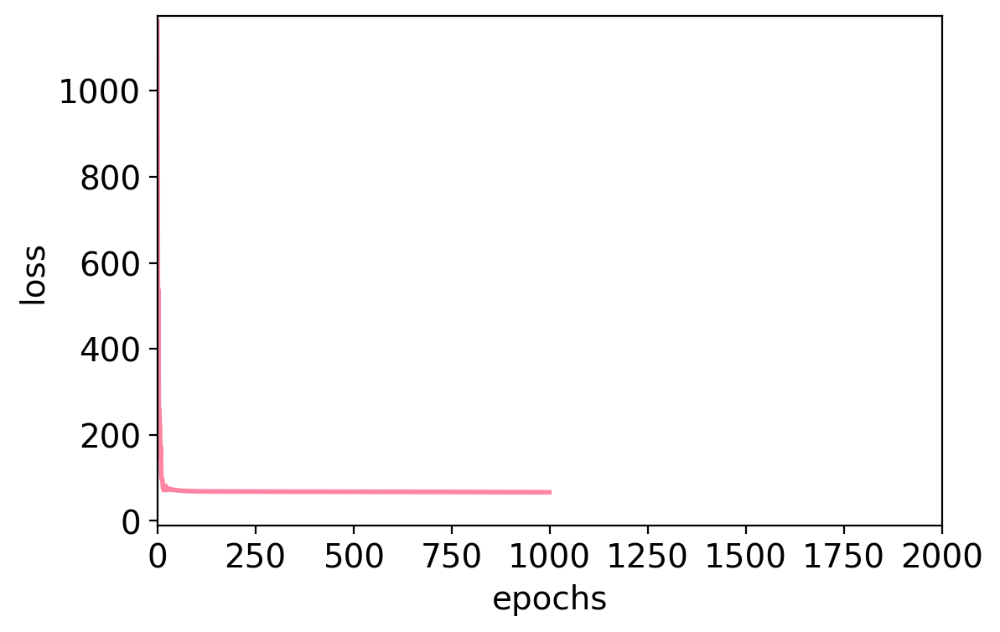

plot losses_ccc


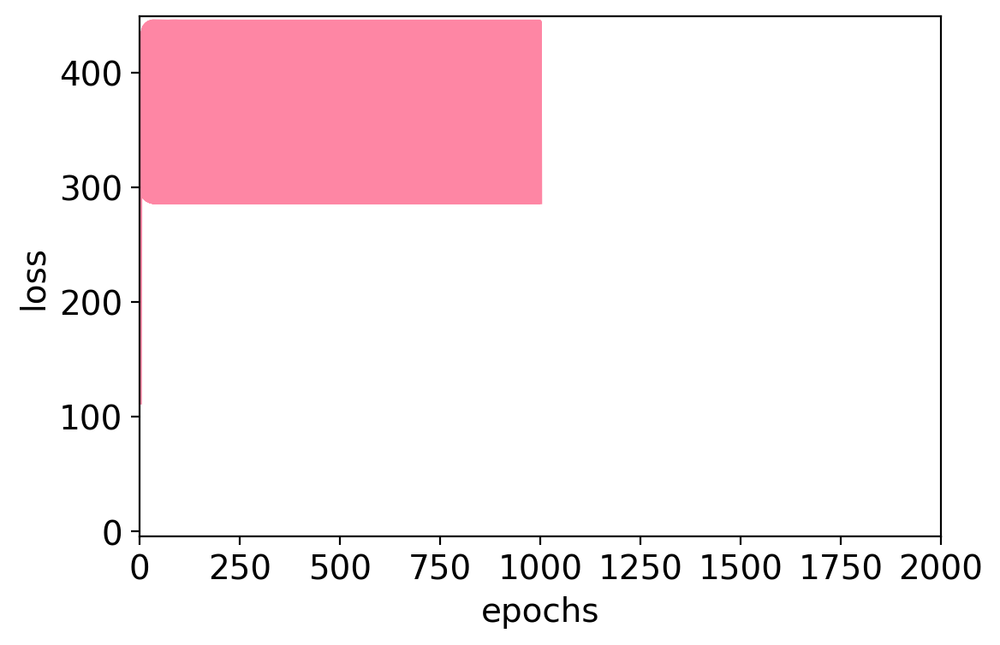

rho=0.04243517022909863
pval=0.7391792089126169
obs_g2g=[[1.   1.   0.   0.   0.   0.   0.   1.  ]
 [1.   1.   0.65 0.   0.   0.   0.   1.  ]
 [0.   0.65 1.   1.   0.94 1.   0.55 0.  ]
 [0.   0.   1.   1.   1.   1.   1.   0.  ]
 [0.   0.   0.94 1.   1.   1.   1.   0.  ]
 [0.   0.   1.   1.   1.   1.   1.   0.  ]
 [0.   0.   0.55 1.   1.   1.   1.   0.  ]
 [1.   1.   0.   0.   0.   0.   0.   1.  ]]
exp_g2g=[[1.   0.14 0.29 0.82 0.61 0.14 0.64 0.36]
 [0.14 1.   0.86 0.64 0.5  0.11 0.18 0.54]
 [0.29 0.86 1.   0.39 0.54 0.43 0.86 0.71]
 [0.82 0.64 0.39 1.   0.18 0.54 0.57 0.5 ]
 [0.61 0.5  0.54 0.18 1.   0.21 0.46 0.25]
 [0.14 0.11 0.43 0.54 0.21 1.   0.07 0.93]
 [0.64 0.18 0.86 0.57 0.46 0.07 1.   0.39]
 [0.36 0.54 0.71 0.5  0.25 0.93 0.39 1.  ]]
rho=0.06429883756358579
pval=0.6137166463897246
simulation 82; time passed: 1080.0207617282867
spearman_corr=-0.7851858926081233
plot losses_scc


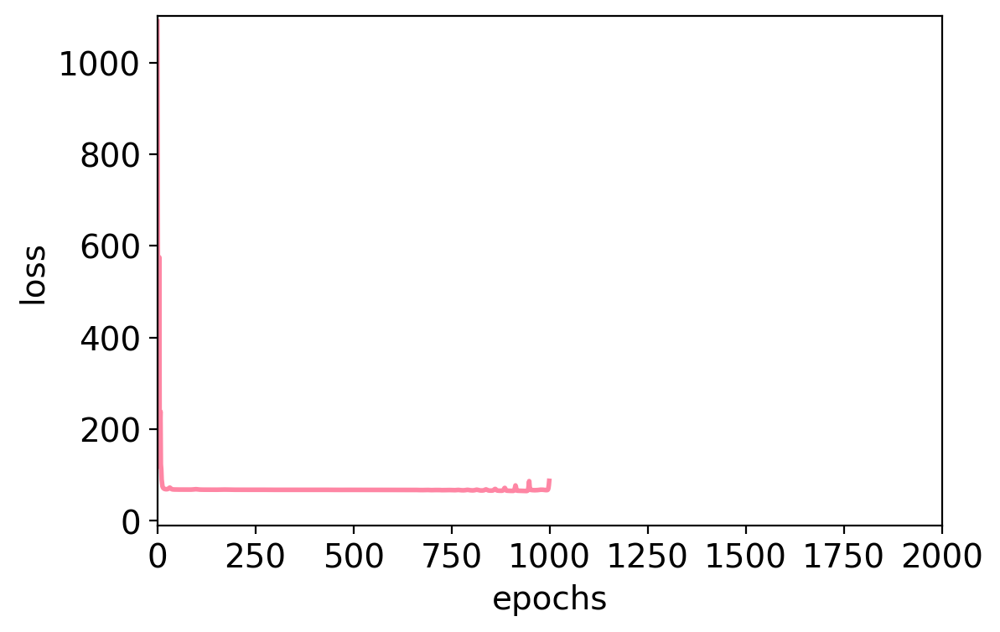

plot losses_ccc


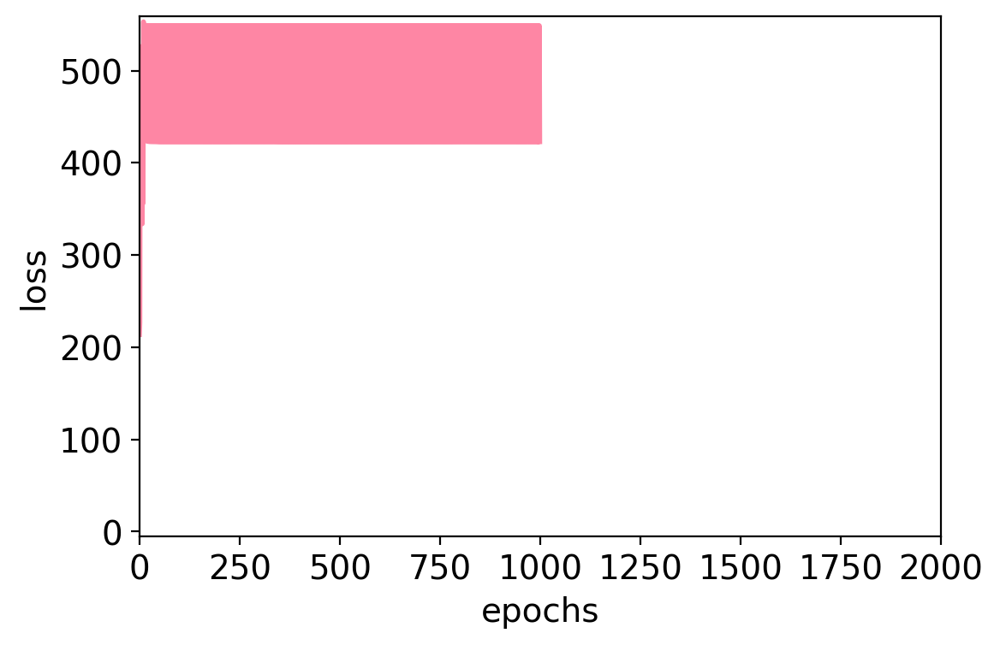

rho=0.06501776360608783
pval=0.6097494398465549
obs_g2g=[[1.   0.   1.   1.   0.   0.   0.82 1.  ]
 [0.   1.   0.   0.   1.   1.   0.23 0.  ]
 [1.   0.   1.   1.   0.   0.   1.   1.  ]
 [1.   0.   1.   1.   0.   0.   1.   1.  ]
 [0.   1.   0.   0.   1.   1.   0.79 0.  ]
 [0.   1.   0.   0.   1.   1.   0.   0.  ]
 [0.82 0.23 1.   1.   0.79 0.   1.   0.87]
 [1.   0.   1.   1.   0.   0.   0.87 1.  ]]
exp_g2g=[[1.   0.18 0.61 0.11 0.64 0.71 0.36 0.64]
 [0.18 1.   0.14 0.11 0.21 0.14 0.79 0.93]
 [0.61 0.14 1.   0.11 0.07 0.79 0.11 0.21]
 [0.11 0.11 0.11 1.   0.79 0.61 0.54 0.04]
 [0.64 0.21 0.07 0.79 1.   0.96 0.57 0.89]
 [0.71 0.14 0.79 0.61 0.96 1.   0.14 0.11]
 [0.36 0.79 0.11 0.54 0.57 0.14 1.   0.21]
 [0.64 0.93 0.21 0.04 0.89 0.11 0.21 1.  ]]
rho=0.16293519975590892
pval=0.19830104167972804
simulation 83; time passed: 1093.443282365799
spearman_corr=-0.7679520271674515
plot losses_scc


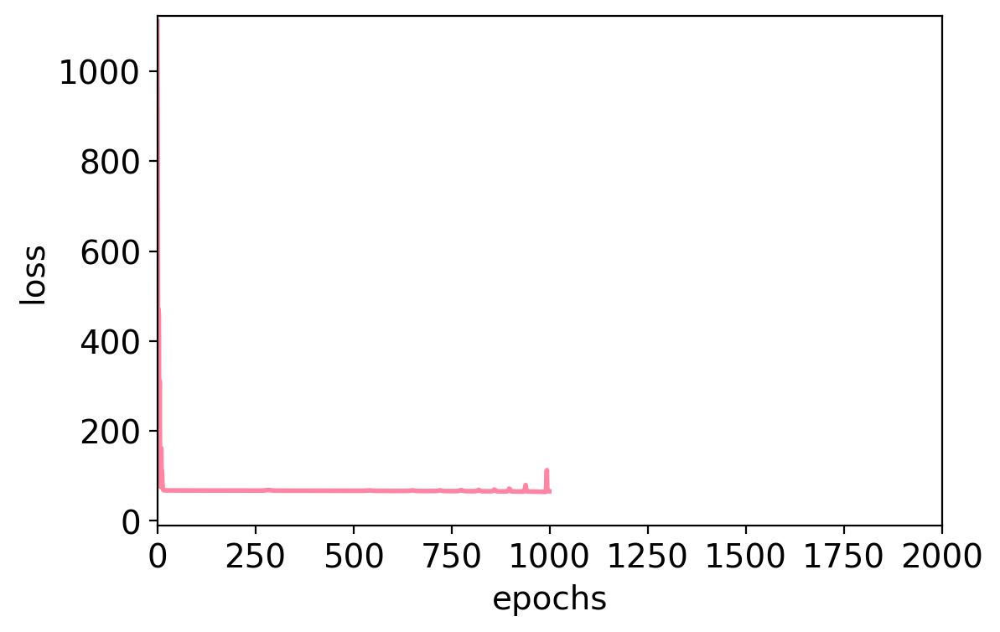

plot losses_ccc


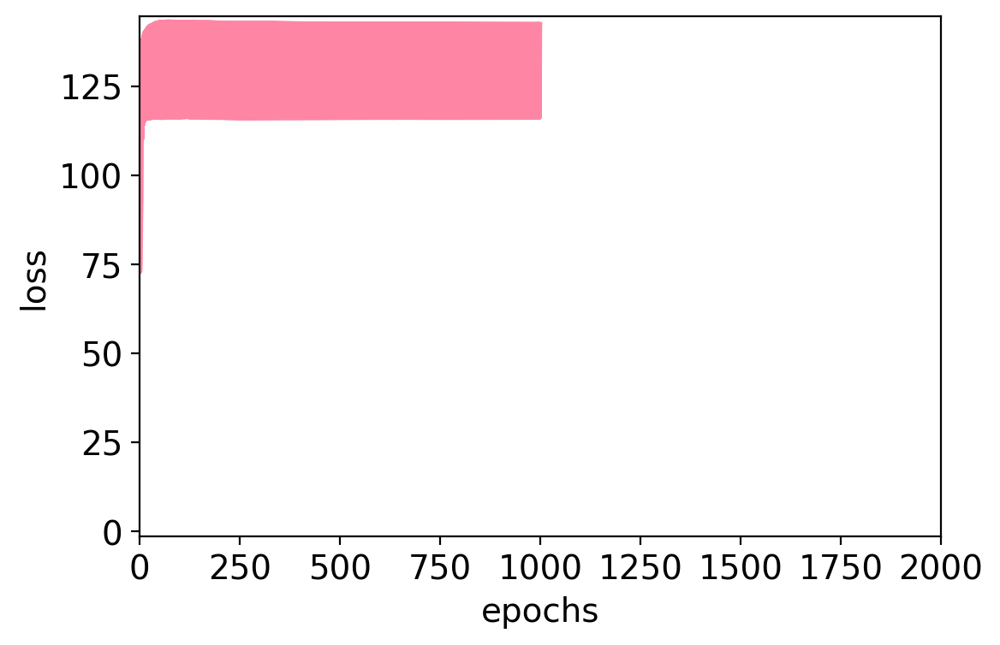

rho=0.5463468494998655
pval=3.011267205026459e-06
obs_g2g=[[1.   1.   0.7  0.51 0.89 1.   0.58 0.16]
 [1.   1.   0.   1.   1.   0.02 0.   1.  ]
 [0.7  0.   1.   0.45 0.51 0.97 0.   0.8 ]
 [0.51 1.   0.45 1.   0.89 0.84 0.77 0.18]
 [0.89 1.   0.51 0.89 1.   1.   0.42 0.81]
 [1.   0.02 0.97 0.84 1.   1.   0.94 0.28]
 [0.58 0.   0.   0.77 0.42 0.94 1.   1.  ]
 [0.16 1.   0.8  0.18 0.81 0.28 1.   1.  ]]
exp_g2g=[[1.   0.64 0.21 0.82 0.29 0.93 0.21 0.39]
 [0.64 1.   0.14 0.46 0.46 0.29 0.18 0.68]
 [0.21 0.14 1.   0.11 0.29 0.39 0.29 0.57]
 [0.82 0.46 0.11 1.   0.89 0.04 0.75 0.43]
 [0.29 0.46 0.29 0.89 1.   0.57 0.68 0.64]
 [0.93 0.29 0.39 0.04 0.57 1.   0.14 0.14]
 [0.21 0.18 0.29 0.75 0.68 0.14 1.   0.25]
 [0.39 0.68 0.57 0.43 0.64 0.14 0.25 1.  ]]
rho=0.2864395188456657
pval=0.02175244527336348
simulation 84; time passed: 1106.6084740161896
spearman_corr=-0.9648589424372498
plot losses_scc


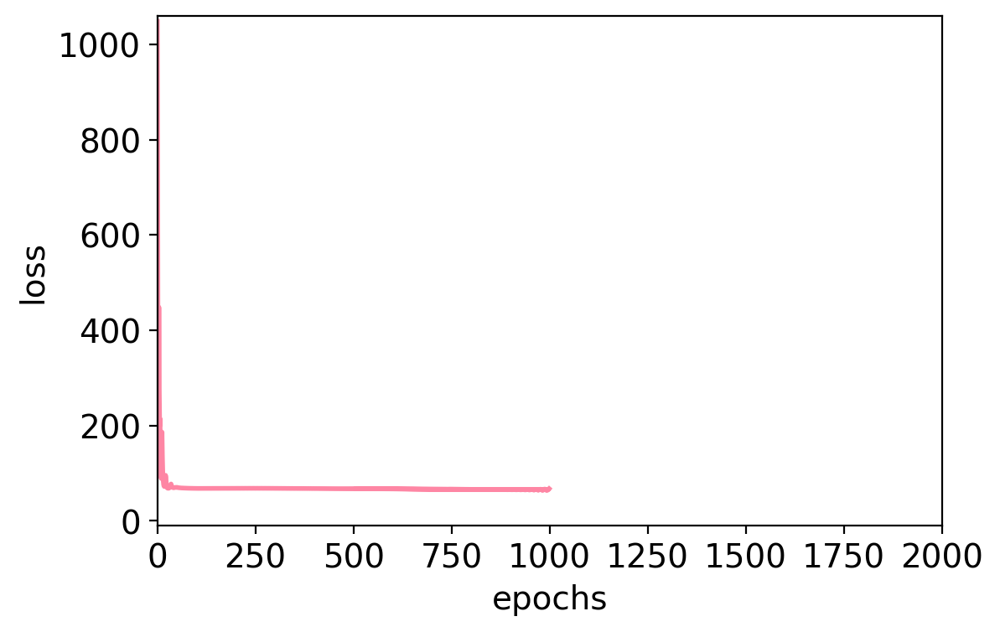

plot losses_ccc


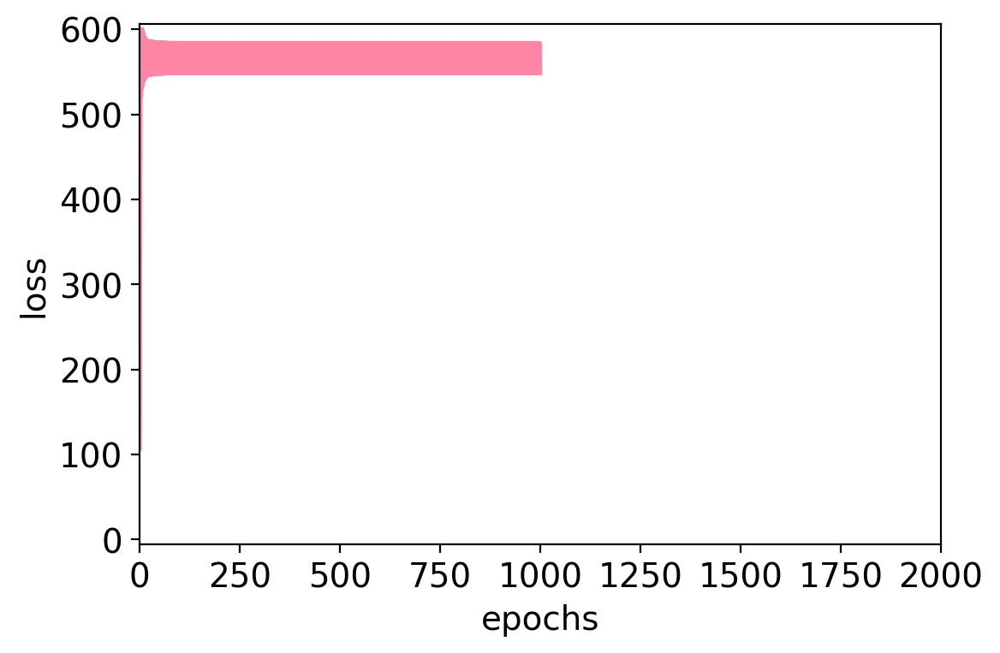

rho=0.12920924444458518
pval=0.30888025747902625
obs_g2g=[[1. 1. 0. 1. 1. 0. 0. 0.]
 [1. 1. 0. 1. 0. 1. 1. 0.]
 [0. 0. 1. 0. 1. 0. 0. 1.]
 [1. 1. 0. 1. 0. 1. 1. 0.]
 [1. 0. 1. 0. 1. 1. 1. 1.]
 [0. 1. 0. 1. 1. 1. 0. 0.]
 [0. 1. 0. 1. 1. 0. 1. 0.]
 [0. 0. 1. 0. 1. 0. 0. 1.]]
exp_g2g=[[1.   0.57 0.64 0.46 0.21 0.18 0.5  0.54]
 [0.57 1.   0.36 0.04 0.32 0.93 0.39 0.36]
 [0.64 0.36 1.   0.39 0.71 0.82 0.04 0.04]
 [0.46 0.04 0.39 1.   0.89 0.14 0.   0.68]
 [0.21 0.32 0.71 0.89 1.   0.57 0.89 0.32]
 [0.18 0.93 0.82 0.14 0.57 1.   0.04 0.93]
 [0.5  0.39 0.04 0.   0.89 0.04 1.   0.32]
 [0.54 0.36 0.04 0.68 0.32 0.93 0.32 1.  ]]
rho=0.27676922328549297
pval=0.02683163869603421
simulation 85; time passed: 1119.8434855937958
spearman_corr=-0.7299463567057131
plot losses_scc


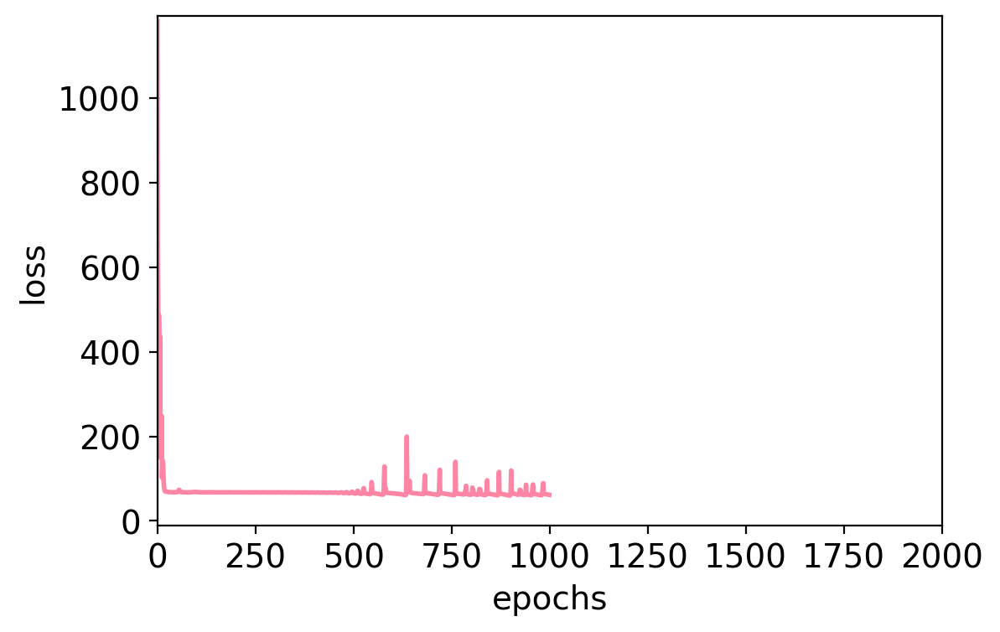

plot losses_ccc


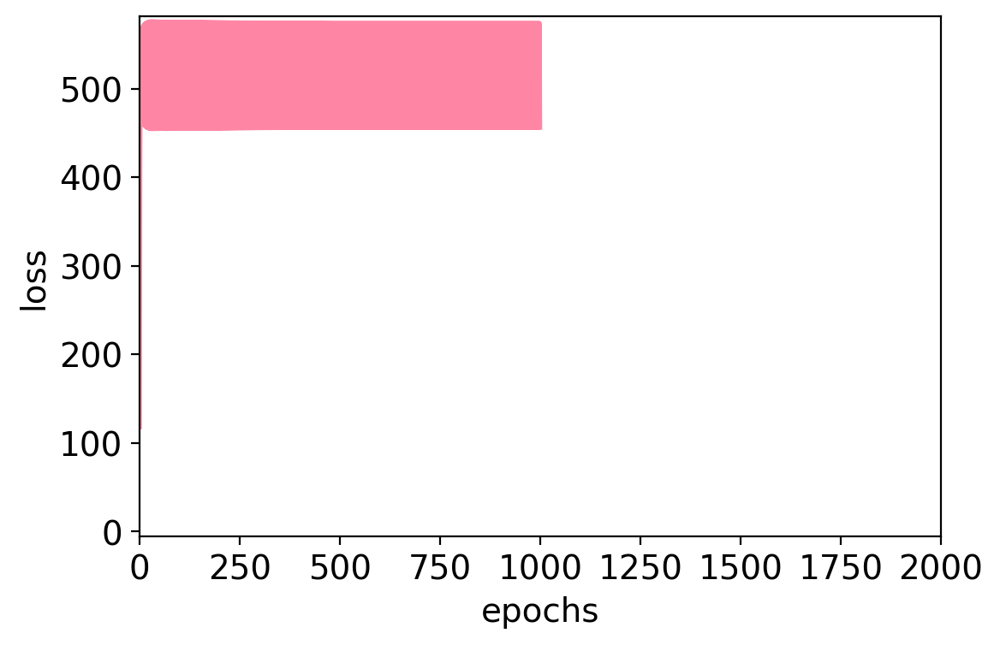

rho=0.23920931887442015
pval=0.05694977612385206
obs_g2g=[[1. 0. 1. 0. 0. 1. 0. 0.]
 [0. 1. 0. 1. 1. 0. 1. 1.]
 [1. 0. 1. 0. 0. 1. 0. 0.]
 [0. 1. 0. 1. 0. 1. 1. 1.]
 [0. 1. 0. 0. 1. 1. 1. 1.]
 [1. 0. 1. 1. 1. 1. 0. 0.]
 [0. 1. 0. 1. 1. 0. 1. 1.]
 [0. 1. 0. 1. 1. 0. 1. 1.]]
exp_g2g=[[1.   0.43 0.46 0.96 0.21 0.25 0.82 0.39]
 [0.43 1.   0.14 0.43 0.71 0.36 0.11 0.25]
 [0.46 0.14 1.   0.   0.82 0.86 0.32 0.96]
 [0.96 0.43 0.   1.   0.54 0.89 0.46 0.61]
 [0.21 0.71 0.82 0.54 1.   0.89 0.21 0.57]
 [0.25 0.36 0.86 0.89 0.89 1.   0.79 0.36]
 [0.82 0.11 0.32 0.46 0.21 0.79 1.   0.61]
 [0.39 0.25 0.96 0.61 0.57 0.36 0.61 1.  ]]
rho=0.24021071228524812
pval=0.05588814453702959
simulation 86; time passed: 1132.8895394802094
spearman_corr=-0.8483877914781183
plot losses_scc


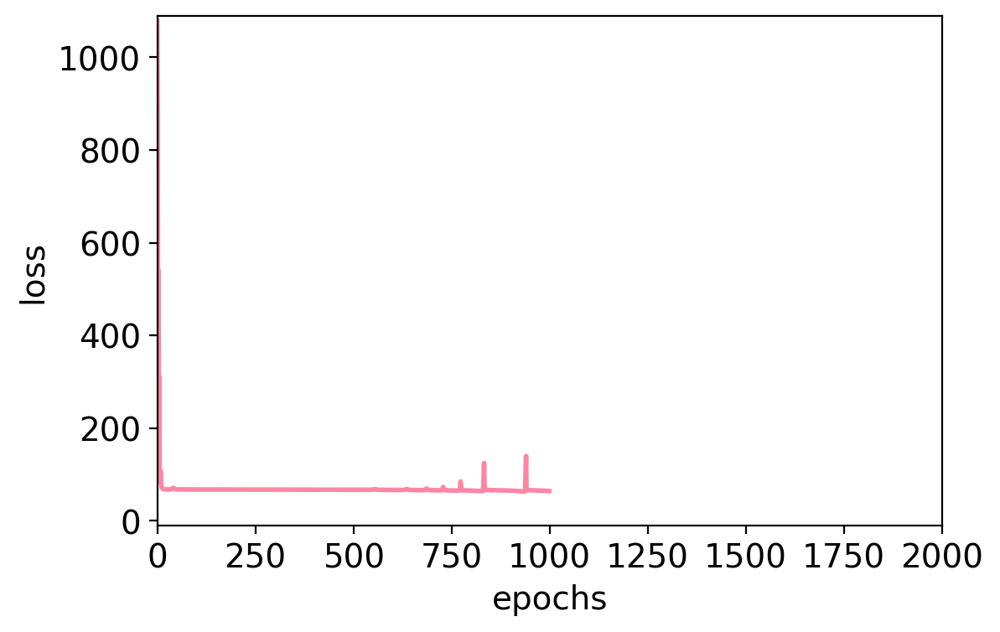

plot losses_ccc


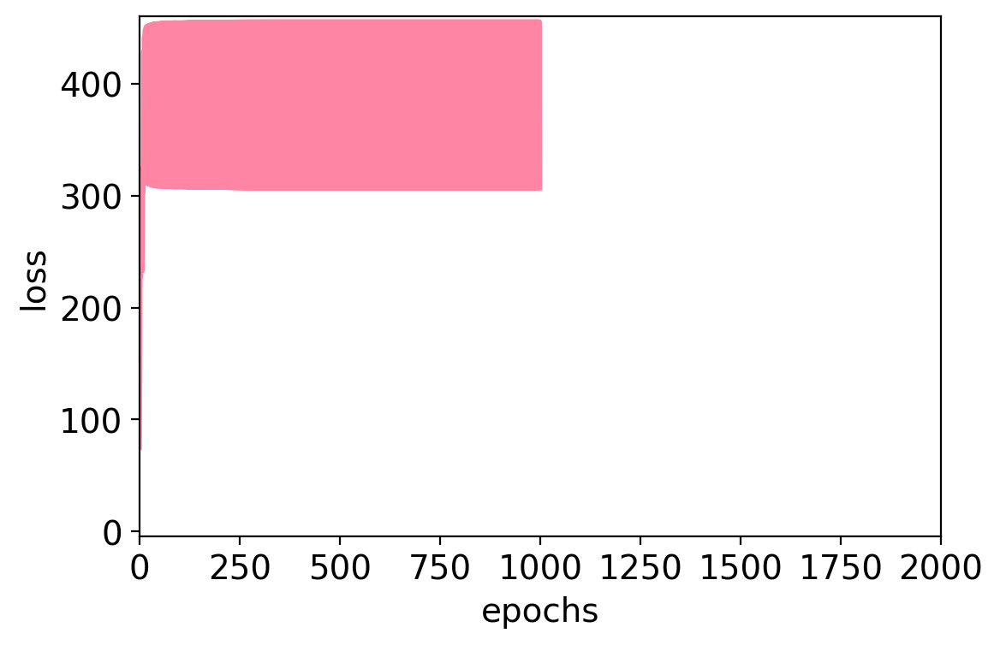

rho=0.14748730017833125
pval=0.24482263931104095
obs_g2g=[[1.   0.   1.   0.   1.   0.   0.   1.  ]
 [0.   1.   0.   1.   0.   0.52 1.   0.  ]
 [1.   0.   1.   0.   1.   0.   0.   1.  ]
 [0.   1.   0.   1.   0.   1.   1.   0.  ]
 [1.   0.   1.   0.   1.   0.   0.   1.  ]
 [0.   0.52 0.   1.   0.   1.   1.   0.  ]
 [0.   1.   0.   1.   0.   1.   1.   0.  ]
 [1.   0.   1.   0.   1.   0.   0.   1.  ]]
exp_g2g=[[1.   0.25 0.39 0.57 0.96 0.5  0.36 0.11]
 [0.25 1.   0.   0.07 0.71 0.79 0.07 0.18]
 [0.39 0.   1.   0.11 0.29 0.64 0.75 0.46]
 [0.57 0.07 0.11 1.   0.86 0.57 0.14 0.68]
 [0.96 0.71 0.29 0.86 1.   0.04 0.25 0.61]
 [0.5  0.79 0.64 0.57 0.04 1.   0.11 0.25]
 [0.36 0.07 0.75 0.14 0.25 0.11 1.   0.29]
 [0.11 0.18 0.46 0.68 0.61 0.25 0.29 1.  ]]
rho=0.24743073316467185
pval=0.0487009331447809
simulation 87; time passed: 1146.1043541431427
spearman_corr=-0.3896196366327901
plot losses_scc


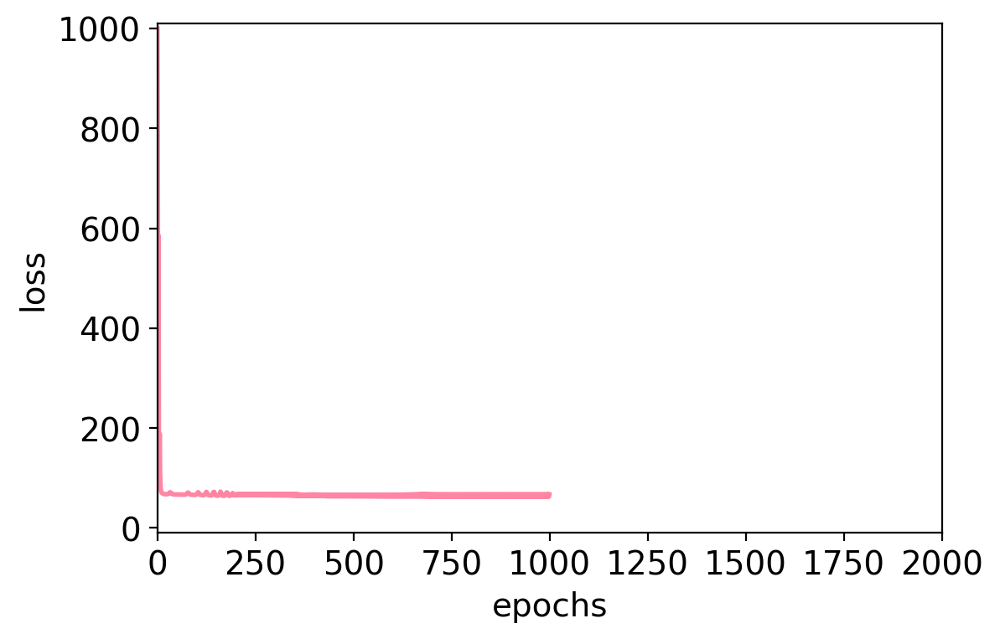

plot losses_ccc


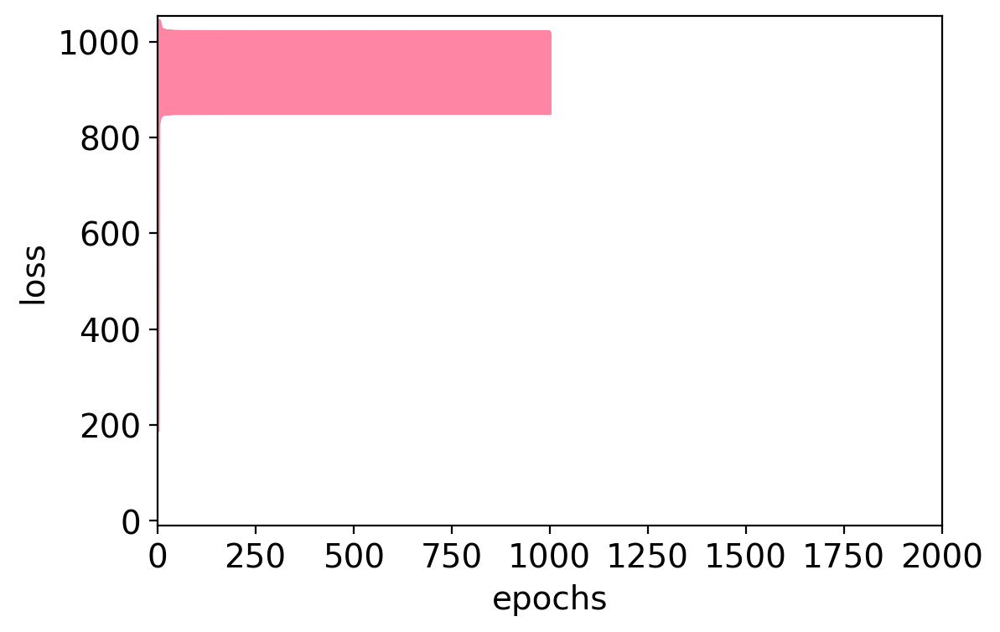

rho=0.2765301979804213
pval=0.026968866227668517
obs_g2g=[[1.   0.   1.   0.   1.   0.   0.   1.  ]
 [0.   1.   1.   1.   1.   0.   0.08 0.56]
 [1.   1.   1.   1.   0.   1.   1.   0.  ]
 [0.   1.   1.   1.   1.   0.33 1.   0.  ]
 [1.   1.   0.   1.   1.   1.   1.   0.  ]
 [0.   0.   1.   0.33 1.   1.   0.   1.  ]
 [0.   0.08 1.   1.   1.   0.   1.   0.06]
 [1.   0.56 0.   0.   0.   1.   0.06 1.  ]]
exp_g2g=[[1.   0.21 0.5  0.75 0.43 0.25 0.36 0.39]
 [0.21 1.   0.21 0.96 0.04 0.46 0.11 0.18]
 [0.5  0.21 1.   0.68 0.07 0.25 0.68 0.5 ]
 [0.75 0.96 0.68 1.   0.54 0.04 0.29 0.21]
 [0.43 0.04 0.07 0.54 1.   0.46 0.14 0.18]
 [0.25 0.46 0.25 0.04 0.46 1.   0.82 0.46]
 [0.36 0.11 0.68 0.29 0.14 0.82 1.   0.93]
 [0.39 0.18 0.5  0.21 0.18 0.46 0.93 1.  ]]
rho=0.2821125187466297
pval=0.023914071536750625
simulation 88; time passed: 1159.325566291809
spearman_corr=-0.771581636211126
plot losses_scc


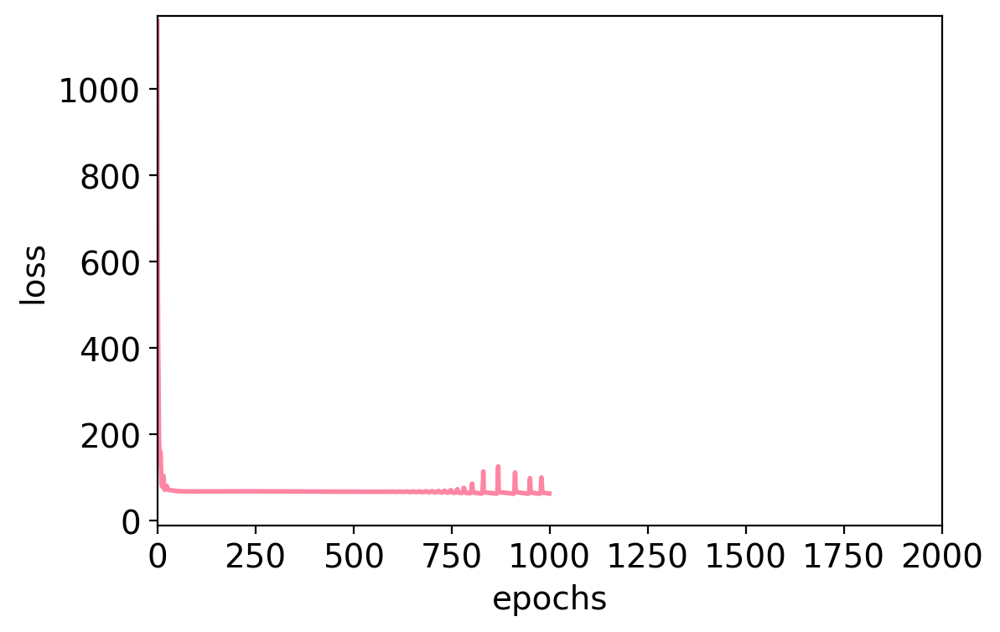

plot losses_ccc


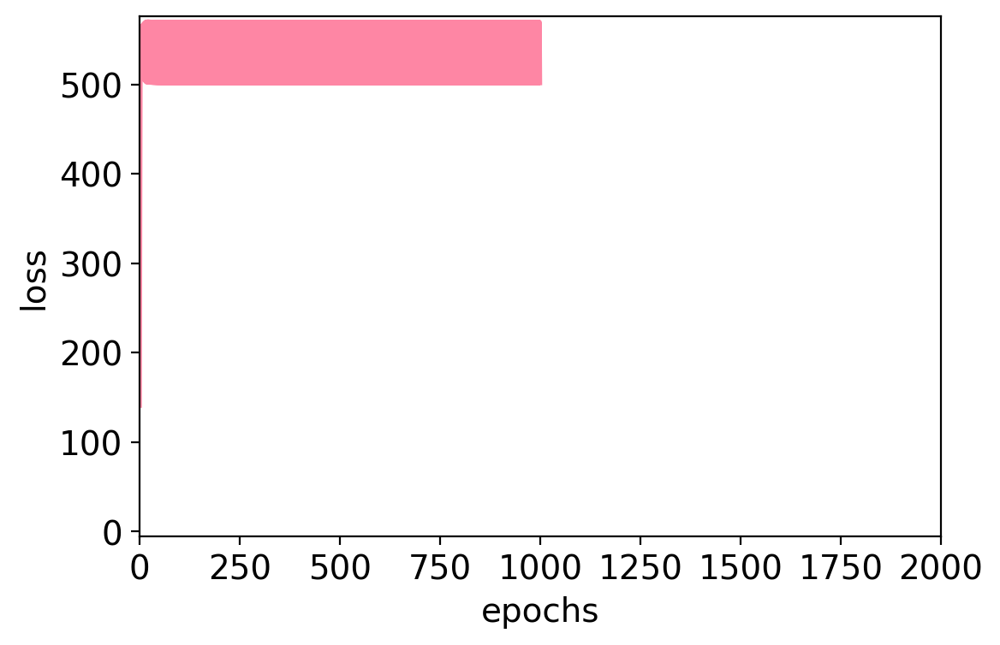

rho=0.06223313074482795
pval=0.6251769533850767
obs_g2g=[[1.   0.   0.   1.   0.   1.   0.69 1.  ]
 [0.   1.   1.   0.   1.   0.   1.   0.  ]
 [0.   1.   1.   0.   1.   0.   1.   0.  ]
 [1.   0.   0.   1.   0.   1.   0.   1.  ]
 [0.   1.   1.   0.   1.   0.   1.   0.  ]
 [1.   0.   0.   1.   0.   1.   1.   1.  ]
 [0.69 1.   1.   0.   1.   1.   1.   1.  ]
 [1.   0.   0.   1.   0.   1.   1.   1.  ]]
exp_g2g=[[1.   0.18 0.11 0.21 0.57 0.04 0.79 0.71]
 [0.18 1.   0.11 0.54 0.   0.07 0.96 0.86]
 [0.11 0.11 1.   0.11 0.11 0.82 0.29 0.96]
 [0.21 0.54 0.11 1.   0.64 0.96 0.46 0.96]
 [0.57 0.   0.11 0.64 1.   0.86 0.07 0.39]
 [0.04 0.07 0.82 0.96 0.86 1.   0.11 0.29]
 [0.79 0.96 0.29 0.46 0.07 0.11 1.   0.68]
 [0.71 0.86 0.96 0.96 0.39 0.29 0.68 1.  ]]
rho=0.0599750583013091
pval=0.6378063144854346
simulation 89; time passed: 1172.8276860713959
spearman_corr=-0.999992247992155
plot losses_scc


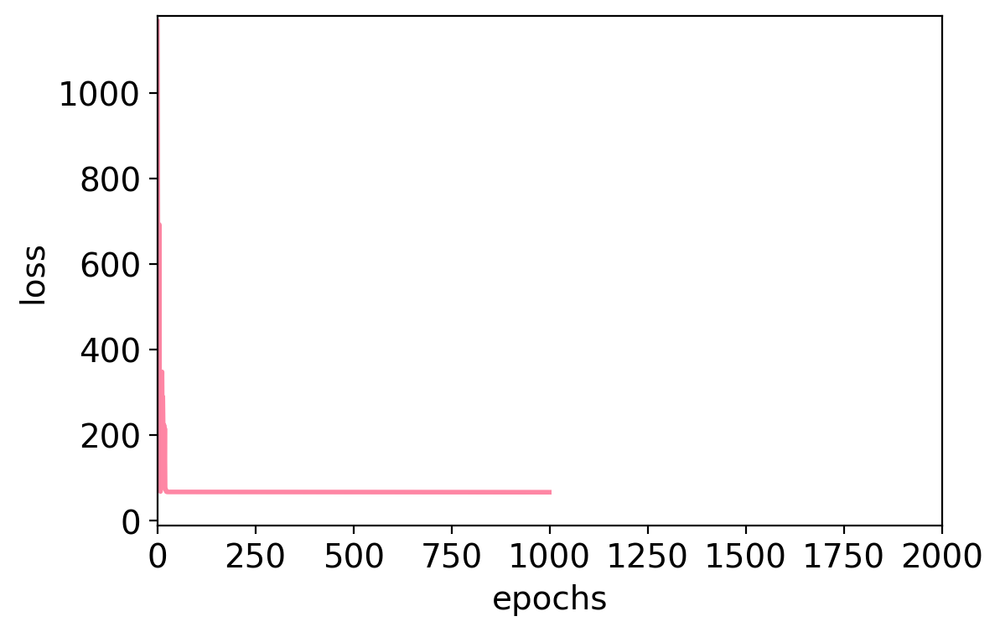

plot losses_ccc


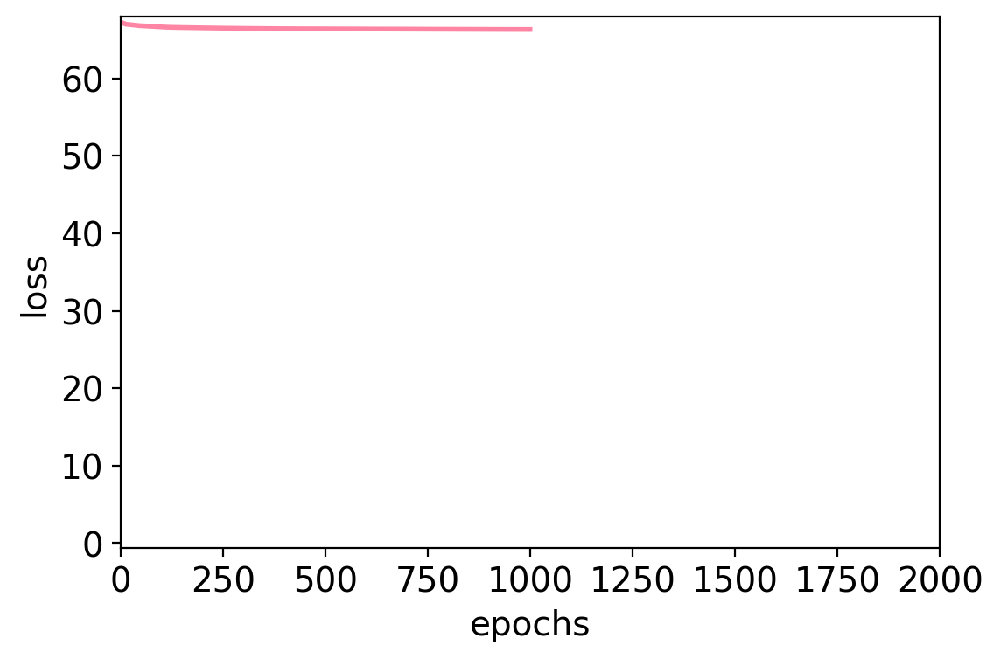

rho=0.5574110492129942
pval=1.7154319353333534e-06
obs_g2g=[[1.   0.   0.   0.   0.   0.   0.47 0.65]
 [0.   1.   1.   1.   1.   1.   0.77 0.32]
 [0.   1.   1.   0.91 0.93 0.85 0.88 0.84]
 [0.   1.   0.91 1.   1.   0.64 0.77 0.18]
 [0.   1.   0.93 1.   1.   1.   0.8  0.89]
 [0.   1.   0.85 0.64 1.   1.   0.71 0.56]
 [0.47 0.77 0.88 0.77 0.8  0.71 1.   0.5 ]
 [0.65 0.32 0.84 0.18 0.89 0.56 0.5  1.  ]]
exp_g2g=[[1.   0.64 0.68 0.46 0.   0.11 0.04 0.93]
 [0.64 1.   0.89 0.75 0.   0.71 0.68 0.14]
 [0.68 0.89 1.   0.04 0.39 0.89 0.89 0.68]
 [0.46 0.75 0.04 1.   0.75 0.29 0.43 0.11]
 [0.   0.   0.39 0.75 1.   0.93 0.11 0.21]
 [0.11 0.71 0.89 0.29 0.93 1.   0.36 0.21]
 [0.04 0.68 0.89 0.43 0.11 0.36 1.   0.04]
 [0.93 0.14 0.68 0.11 0.21 0.21 0.04 1.  ]]
rho=0.5363098514510849
pval=4.9319554978297765e-06
simulation 90; time passed: 1185.869249343872
spearman_corr=-0.8896950736950737
plot losses_scc


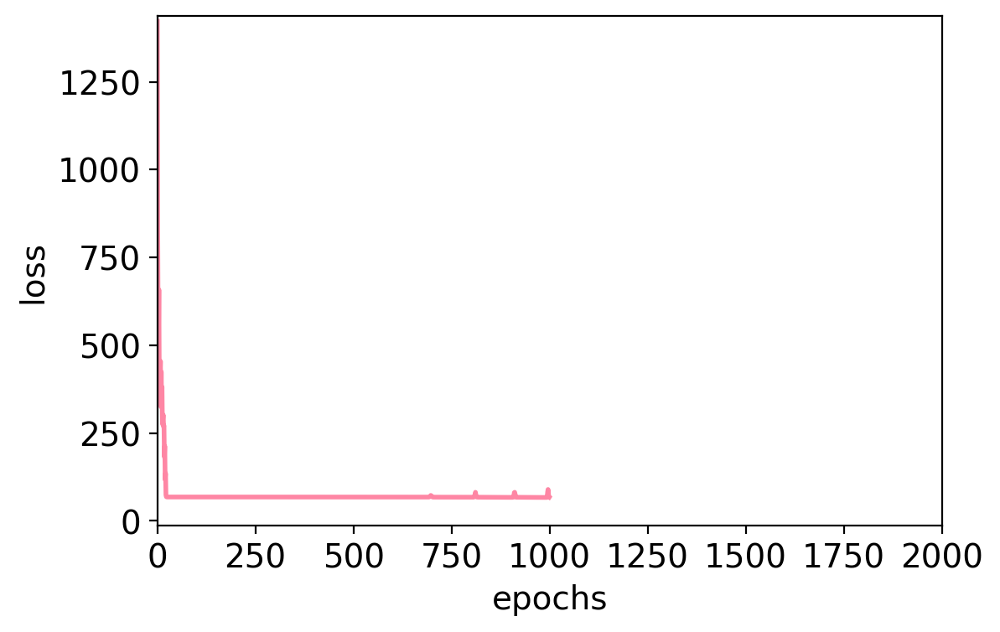

plot losses_ccc


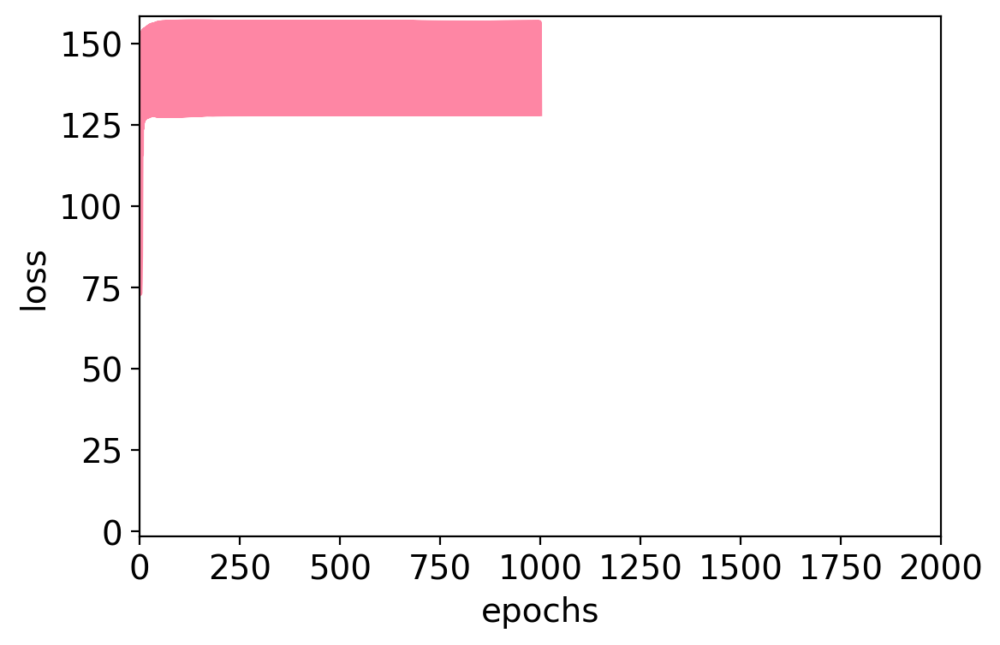

rho=0.39841354727930955
pval=0.0011116775685883003
obs_g2g=[[1.   0.   0.   0.99 1.   1.   0.09 0.22]
 [0.   1.   1.   0.1  0.   0.46 0.93 0.28]
 [0.   1.   1.   0.   0.   0.31 0.66 0.59]
 [0.99 0.1  0.   1.   1.   0.72 0.53 0.3 ]
 [1.   0.   0.   1.   1.   0.98 0.23 0.18]
 [1.   0.46 0.31 0.72 0.98 1.   0.3  0.43]
 [0.09 0.93 0.66 0.53 0.23 0.3  1.   0.76]
 [0.22 0.28 0.59 0.3  0.18 0.43 0.76 1.  ]]
exp_g2g=[[1.   0.43 0.96 0.39 0.68 0.82 0.25 0.36]
 [0.43 1.   0.39 0.61 0.89 0.89 0.07 0.07]
 [0.96 0.39 1.   0.39 0.11 0.96 0.25 0.93]
 [0.39 0.61 0.39 1.   0.82 0.89 0.79 0.82]
 [0.68 0.89 0.11 0.82 1.   0.96 0.46 0.64]
 [0.82 0.89 0.96 0.89 0.96 1.   0.18 0.61]
 [0.25 0.07 0.25 0.79 0.46 0.18 1.   0.79]
 [0.36 0.07 0.93 0.82 0.64 0.61 0.79 1.  ]]
rho=0.6196255368993647
pval=4.7859942944175154e-08
simulation 91; time passed: 1198.989500284195
spearman_corr=-0.9041343995592059
plot losses_scc


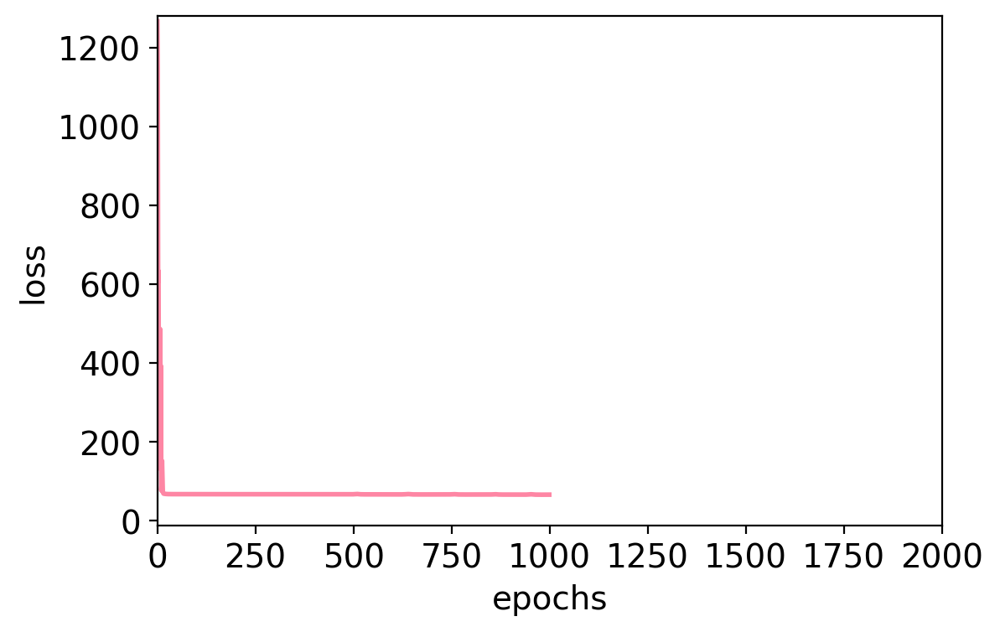

plot losses_ccc


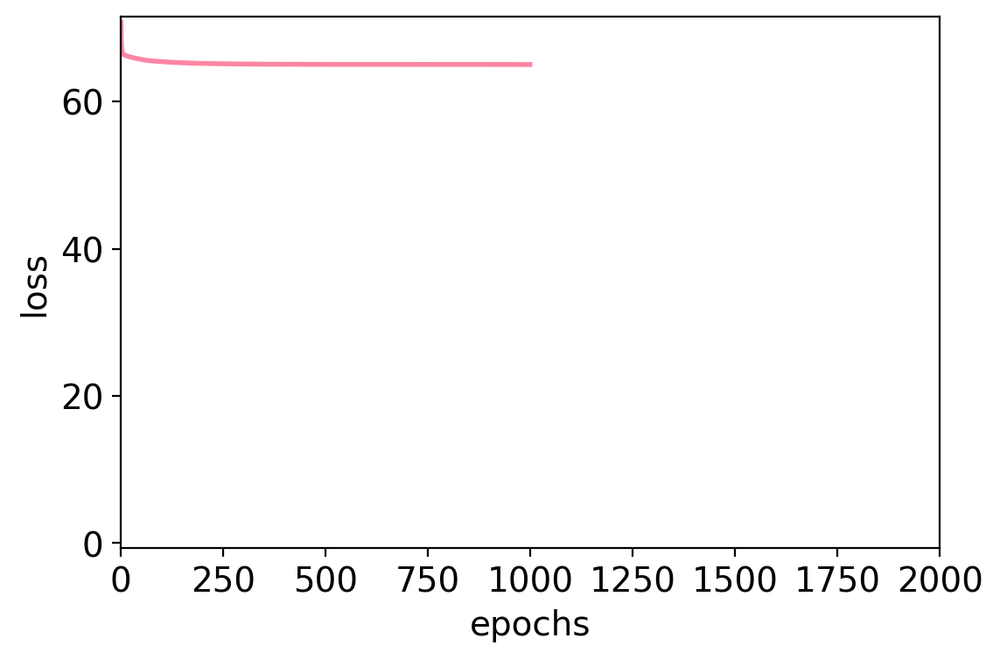

rho=0.42289022765278866
pval=0.0004989668025808017
obs_g2g=[[1.   0.47 1.   0.93 1.   1.   1.   0.29]
 [0.47 1.   1.   0.29 1.   0.51 0.77 0.24]
 [1.   1.   1.   0.18 1.   1.   0.8  0.76]
 [0.93 0.29 0.18 1.   0.56 0.38 0.77 0.  ]
 [1.   1.   1.   0.56 1.   1.   0.89 0.46]
 [1.   0.51 1.   0.38 1.   1.   1.   0.96]
 [1.   0.77 0.8  0.77 0.89 1.   1.   0.34]
 [0.29 0.24 0.76 0.   0.46 0.96 0.34 1.  ]]
exp_g2g=[[1.   0.11 0.54 0.64 0.96 0.89 0.64 0.75]
 [0.11 1.   0.82 0.25 0.71 0.21 0.96 0.07]
 [0.54 0.82 1.   0.14 0.25 0.18 0.61 0.39]
 [0.64 0.25 0.14 1.   0.36 0.96 0.14 0.11]
 [0.96 0.71 0.25 0.36 1.   0.36 0.07 0.46]
 [0.89 0.21 0.18 0.96 0.36 1.   0.07 0.07]
 [0.64 0.96 0.61 0.14 0.07 0.07 1.   0.25]
 [0.75 0.07 0.39 0.11 0.46 0.07 0.25 1.  ]]
rho=nan
pval=nan
simulation 92; time passed: 1212.1703782081604


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.30950724536428886
plot losses_scc


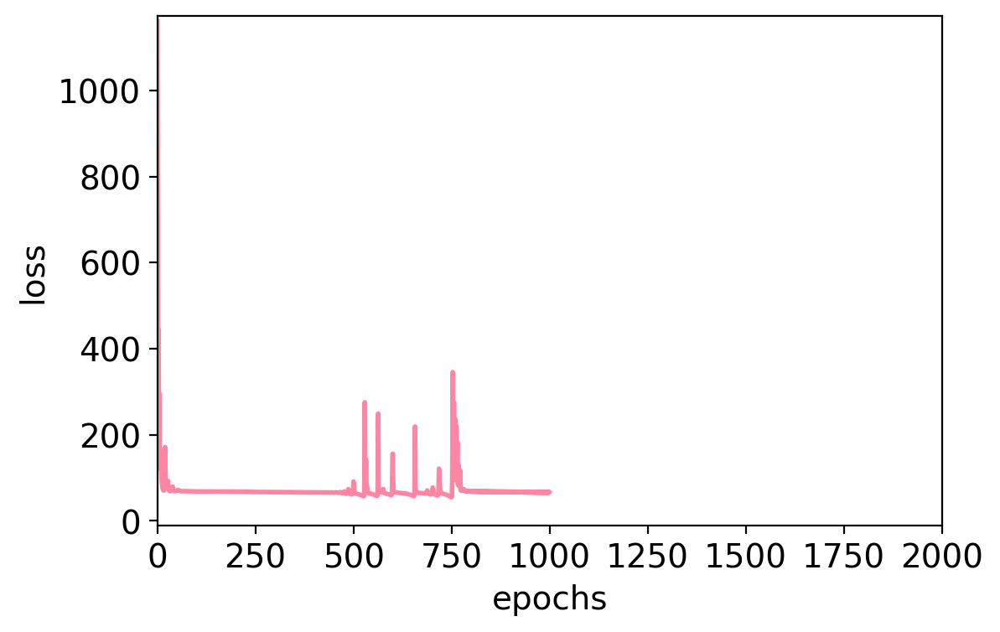

plot losses_ccc


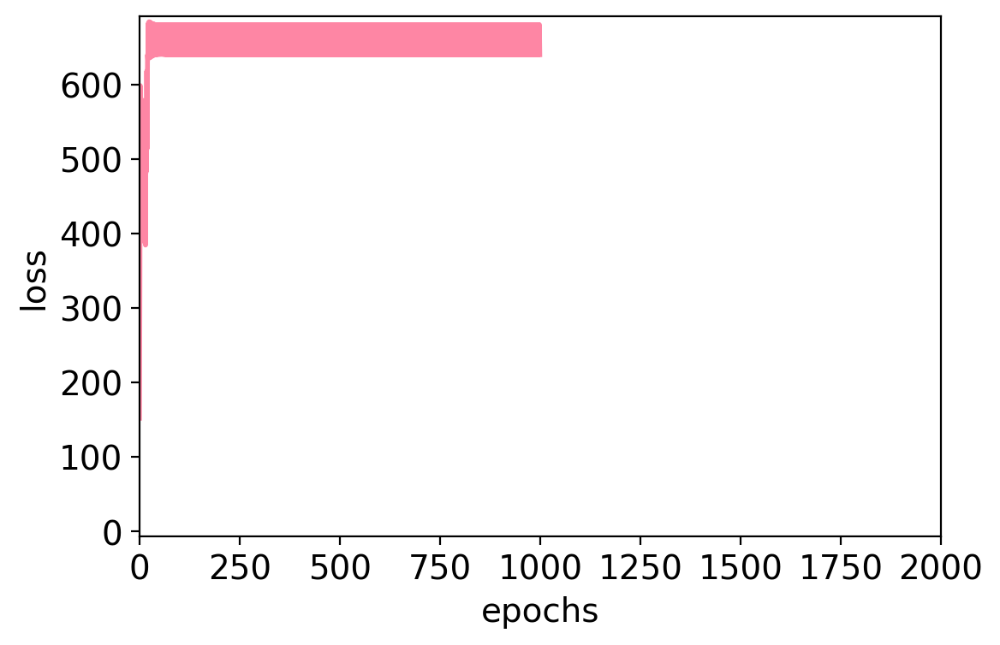

rho=0.11867748357079408
pval=0.3502966695238101
obs_g2g=[[1. 0. 0. 0. 1. 1. 1. 0.]
 [0. 1. 1. 1. 0. 0. 0. 1.]
 [0. 1. 1. 1. 0. 0. 0. 1.]
 [0. 1. 1. 1. 0. 0. 0. 1.]
 [1. 0. 0. 0. 1. 1. 1. 0.]
 [1. 0. 0. 0. 1. 1. 1. 0.]
 [1. 0. 0. 0. 1. 1. 1. 0.]
 [0. 1. 1. 1. 0. 0. 0. 1.]]
exp_g2g=[[1.   0.46 0.86 0.46 0.11 0.14 0.5  0.32]
 [0.46 1.   0.75 0.46 0.5  0.25 0.93 0.29]
 [0.86 0.75 1.   0.96 0.18 0.71 0.29 0.71]
 [0.46 0.46 0.96 1.   0.82 0.39 0.36 0.21]
 [0.11 0.5  0.18 0.82 1.   0.04 0.93 0.21]
 [0.14 0.25 0.71 0.39 0.04 1.   0.   0.54]
 [0.5  0.93 0.29 0.36 0.93 0.   1.   0.36]
 [0.32 0.29 0.71 0.21 0.21 0.54 0.36 1.  ]]
rho=0.22535525835271406
pval=0.07338678292240894
simulation 93; time passed: 1225.4449706077576
spearman_corr=-0.657542089487342
plot losses_scc


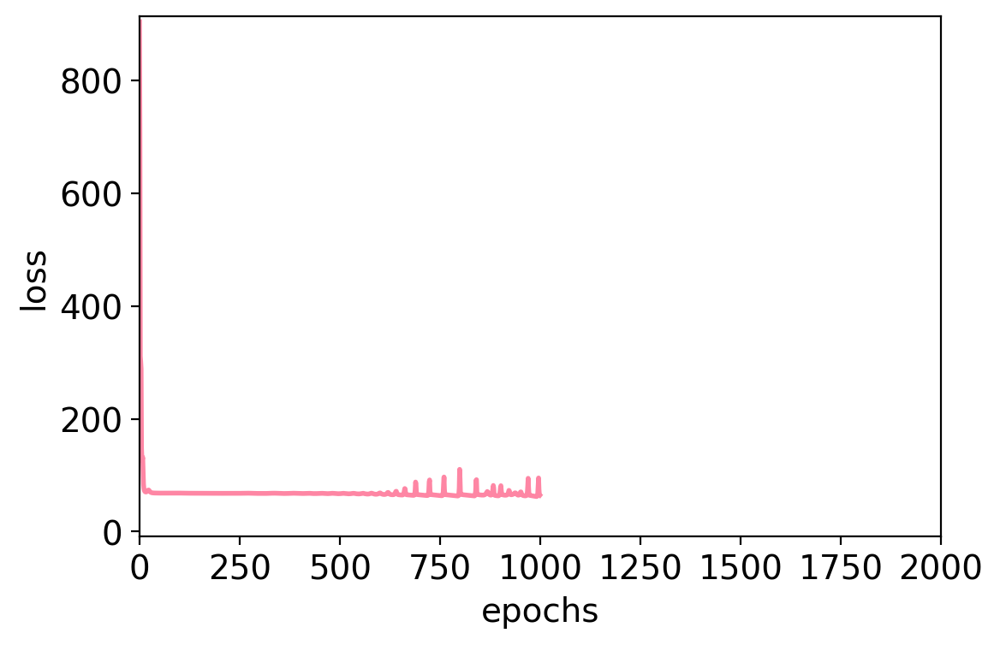

plot losses_ccc


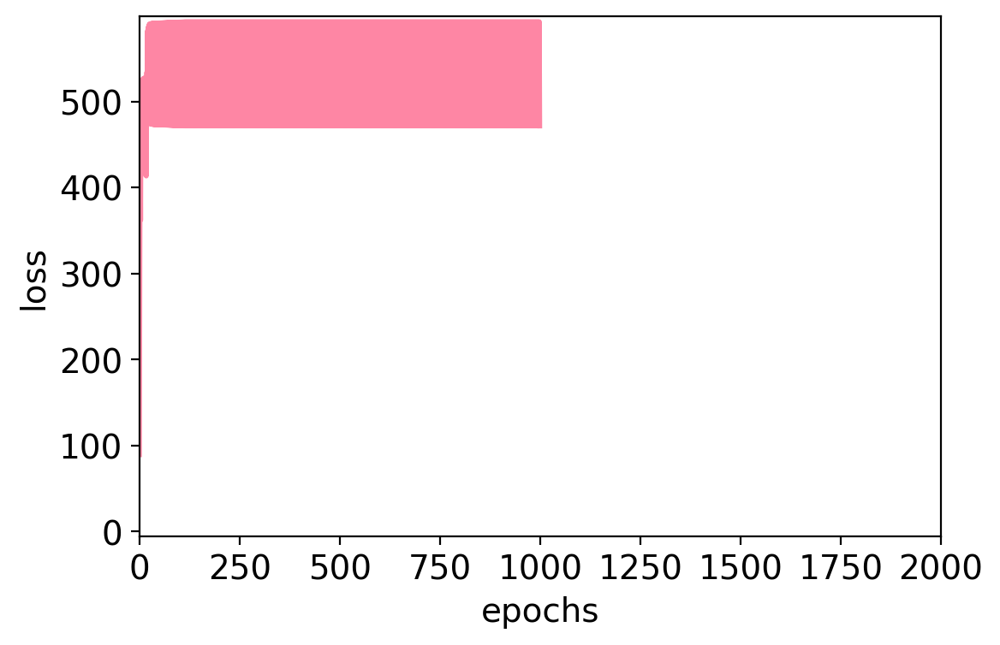

rho=0.10853508094309815
pval=0.3932749010778368
obs_g2g=[[1. 0. 1. 0. 0. 1. 0. 1.]
 [0. 1. 0. 1. 1. 0. 1. 0.]
 [1. 0. 1. 0. 0. 1. 0. 1.]
 [0. 1. 0. 1. 1. 0. 1. 0.]
 [0. 1. 0. 1. 1. 0. 1. 0.]
 [1. 0. 1. 0. 0. 1. 0. 1.]
 [0. 1. 0. 1. 1. 0. 1. 0.]
 [1. 0. 1. 0. 0. 1. 0. 1.]]
exp_g2g=[[1.   0.21 0.18 0.18 0.89 0.21 0.11 0.43]
 [0.21 1.   0.   0.04 0.46 0.   0.07 0.89]
 [0.18 0.   1.   0.96 0.36 0.25 0.11 0.5 ]
 [0.18 0.04 0.96 1.   0.25 0.04 0.14 0.68]
 [0.89 0.46 0.36 0.25 1.   0.61 0.39 0.18]
 [0.21 0.   0.25 0.04 0.61 1.   0.57 0.11]
 [0.11 0.07 0.11 0.14 0.39 0.57 1.   0.75]
 [0.43 0.89 0.5  0.68 0.18 0.11 0.75 1.  ]]
rho=0.10853508094309815
pval=0.3932749010778368
simulation 94; time passed: 1238.6869485378265
spearman_corr=-0.8924684564684566
plot losses_scc


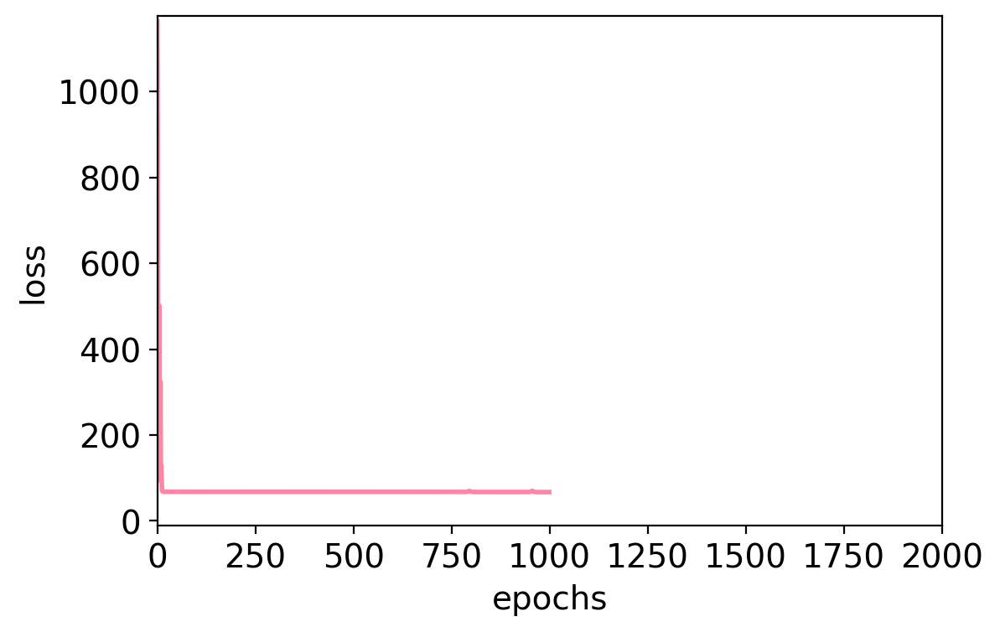

plot losses_ccc


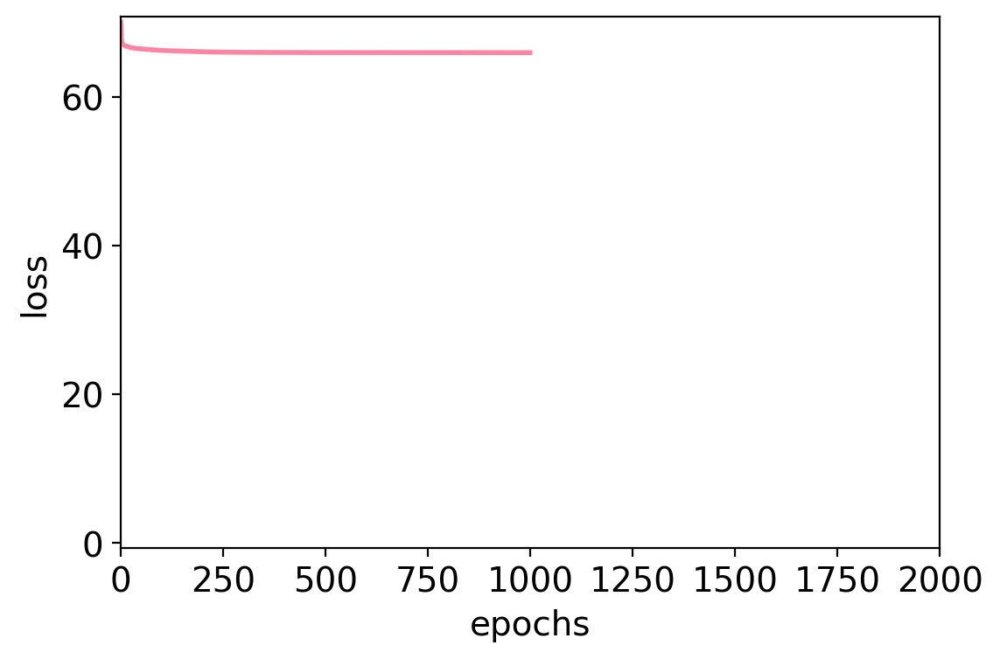

rho=0.45575929467808013
pval=0.00015404192227109565
obs_g2g=[[1.   0.   0.   0.   0.   0.06 0.25 0.39]
 [0.   1.   0.   0.45 0.63 0.29 0.14 0.67]
 [0.   0.   1.   0.74 0.53 0.72 0.51 0.8 ]
 [0.   0.45 0.74 1.   0.71 0.72 0.29 0.52]
 [0.   0.63 0.53 0.71 1.   0.66 0.3  0.79]
 [0.06 0.29 0.72 0.72 0.66 1.   0.25 0.42]
 [0.25 0.14 0.51 0.29 0.3  0.25 1.   0.94]
 [0.39 0.67 0.8  0.52 0.79 0.42 0.94 1.  ]]
exp_g2g=[[1.   0.21 0.93 0.46 0.   0.29 0.75 0.93]
 [0.21 1.   0.29 0.25 0.07 0.25 0.   0.86]
 [0.93 0.29 1.   0.36 0.25 0.68 0.32 0.54]
 [0.46 0.25 0.36 1.   0.64 0.11 0.89 0.32]
 [0.   0.07 0.25 0.64 1.   0.57 0.61 0.61]
 [0.29 0.25 0.68 0.11 0.57 1.   0.46 0.57]
 [0.75 0.   0.32 0.89 0.61 0.46 1.   0.5 ]
 [0.93 0.86 0.54 0.32 0.61 0.57 0.5  1.  ]]
rho=nan
pval=nan
simulation 95; time passed: 1251.7519602775574


/tmp/ipykernel_436922/1387078157.py:76: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  rho, pval = ss.spearmanr(obs_g2g.flatten(), exp_g2g.flatten())


spearman_corr=-0.9737403649043243
plot losses_scc


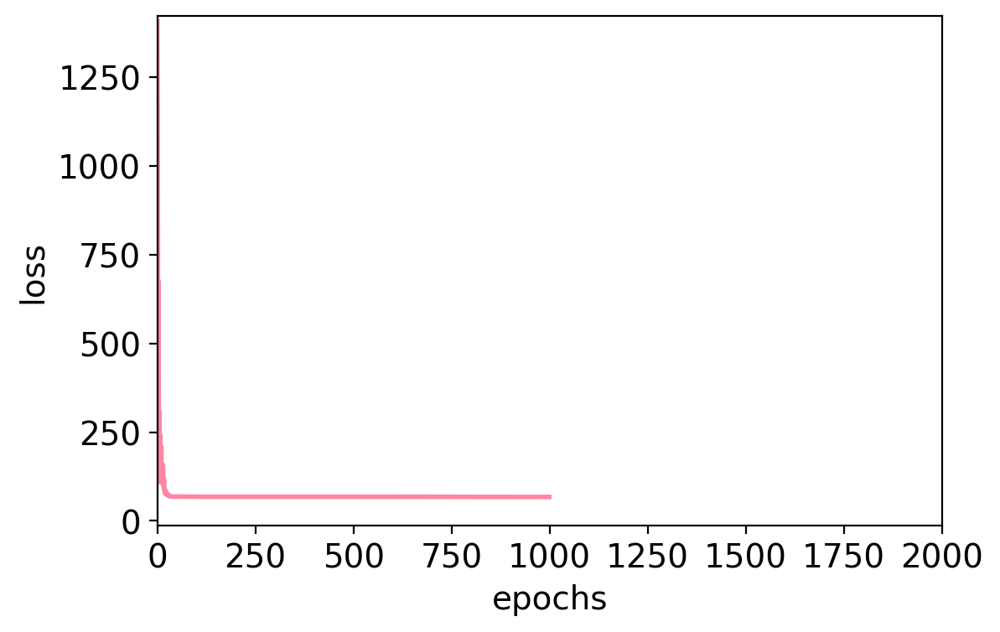

plot losses_ccc


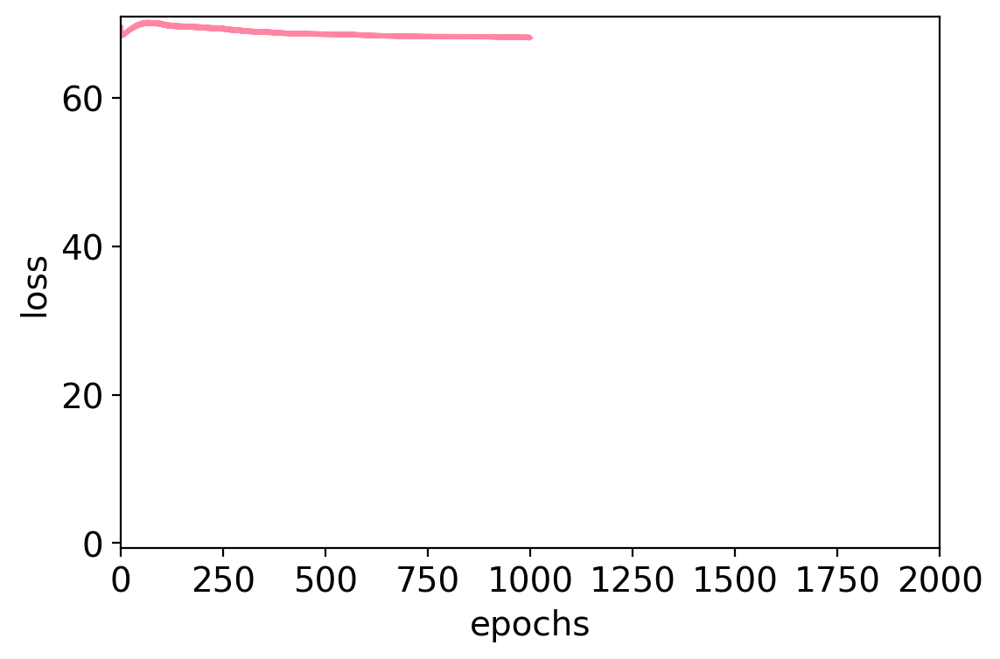

rho=0.5790672147507445
pval=5.366744414256681e-07
obs_g2g=[[1.   0.54 0.46 0.05 0.89 1.   1.   0.88]
 [0.54 1.   0.87 0.63 1.   0.84 0.91 1.  ]
 [0.46 0.87 1.   0.64 0.45 0.77 1.   0.3 ]
 [0.05 0.63 0.64 1.   0.66 0.44 0.78 0.28]
 [0.89 1.   0.45 0.66 1.   0.82 0.85 0.66]
 [1.   0.84 0.77 0.44 0.82 1.   0.48 0.89]
 [1.   0.91 1.   0.78 0.85 0.48 1.   0.56]
 [0.88 1.   0.3  0.28 0.66 0.89 0.56 1.  ]]
exp_g2g=[[1.   0.25 0.21 0.29 0.71 0.21 0.93 0.96]
 [0.25 1.   0.82 0.21 0.68 0.11 0.86 0.79]
 [0.21 0.82 1.   0.71 0.32 0.68 0.71 0.54]
 [0.29 0.21 0.71 1.   0.54 0.32 0.89 0.36]
 [0.71 0.68 0.32 0.54 1.   0.82 0.89 0.07]
 [0.21 0.11 0.68 0.32 0.82 1.   0.   0.04]
 [0.93 0.86 0.71 0.89 0.89 0.   1.   0.32]
 [0.96 0.79 0.54 0.36 0.07 0.04 0.32 1.  ]]
rho=-0.022113835452552248
pval=0.8623015934461966
simulation 96; time passed: 1264.9666616916656
spearman_corr=-0.9634248032053521
plot losses_scc


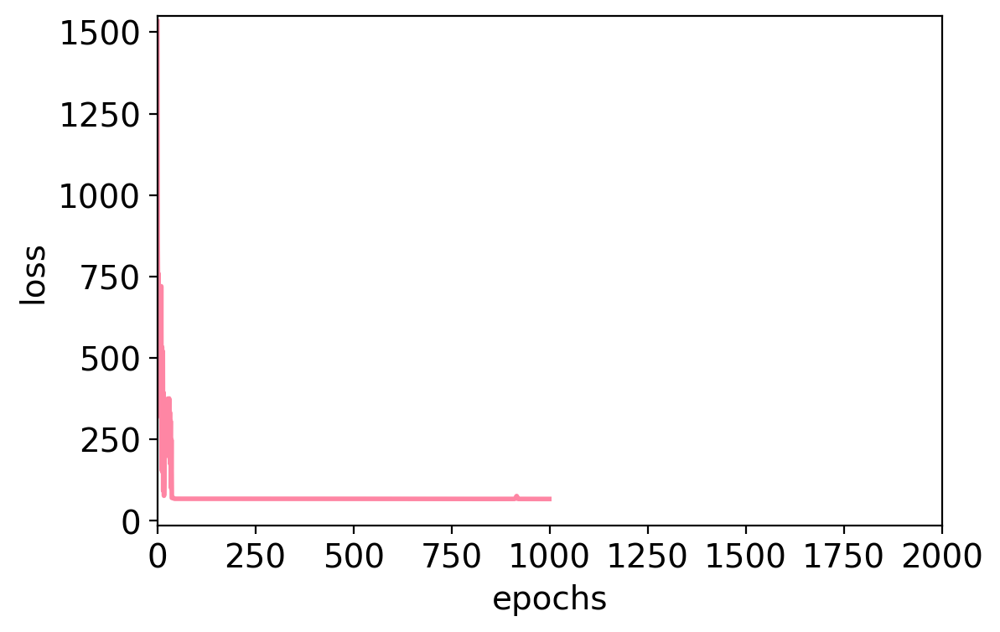

plot losses_ccc


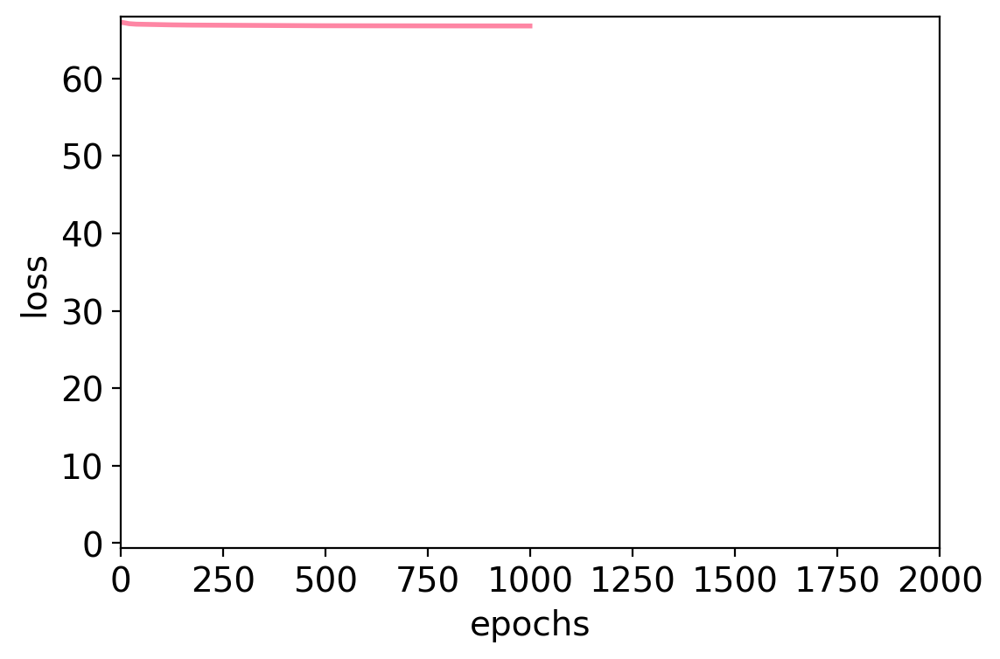

rho=0.45133603071572254
pval=0.0001817081195814711
obs_g2g=[[1.   1.   1.   0.   1.   1.   0.85 1.  ]
 [1.   1.   1.   0.82 1.   1.   0.89 0.7 ]
 [1.   1.   1.   0.   1.   1.   1.   1.  ]
 [0.   0.82 0.   1.   0.78 0.38 0.71 0.27]
 [1.   1.   1.   0.78 1.   0.95 0.59 0.63]
 [1.   1.   1.   0.38 0.95 1.   0.34 0.52]
 [0.85 0.89 1.   0.71 0.59 0.34 1.   0.45]
 [1.   0.7  1.   0.27 0.63 0.52 0.45 1.  ]]
exp_g2g=[[1.   0.18 0.5  0.25 0.75 0.82 0.18 0.93]
 [0.18 1.   0.93 0.82 0.5  0.75 0.82 0.71]
 [0.5  0.93 1.   0.04 0.82 0.89 0.54 0.79]
 [0.25 0.82 0.04 1.   0.57 0.68 0.54 0.54]
 [0.75 0.5  0.82 0.57 1.   0.29 0.39 0.96]
 [0.82 0.75 0.89 0.68 0.29 1.   0.5  0.43]
 [0.18 0.82 0.54 0.54 0.39 0.5  1.   0.93]
 [0.93 0.71 0.79 0.54 0.96 0.43 0.93 1.  ]]
rho=0.4060436184356913
pval=0.000871628233499355
simulation 97; time passed: 1278.1379051208496
spearman_corr=-0.9961337881337882
plot losses_scc


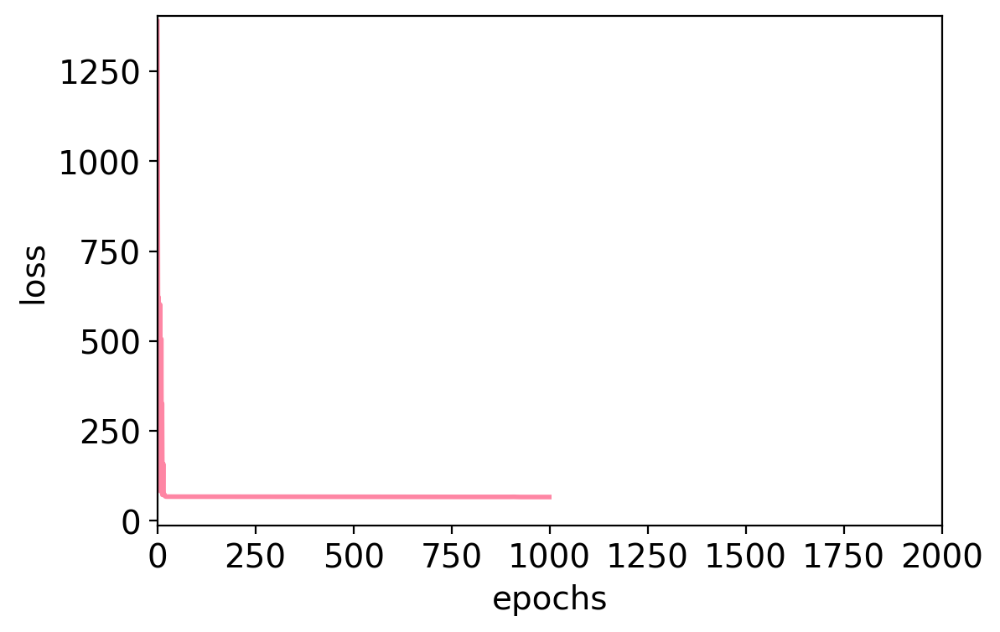

plot losses_ccc


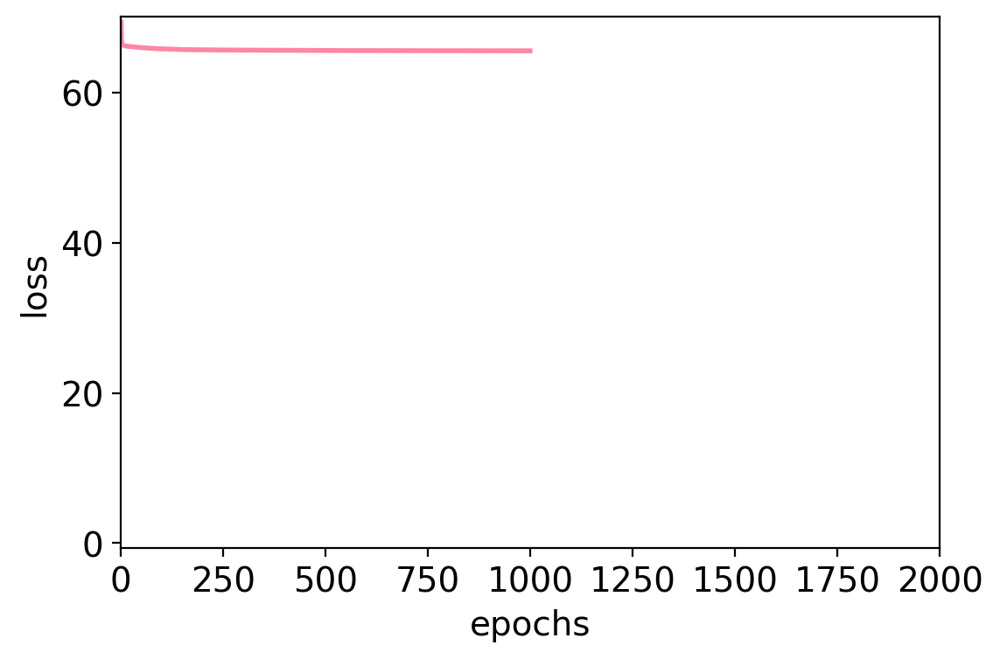

rho=0.5658526027716261
pval=1.101331990540141e-06
obs_g2g=[[1.   1.   0.05 0.42 0.66 0.19 0.98 0.76]
 [1.   1.   0.59 0.3  1.   0.   0.9  0.78]
 [0.05 0.59 1.   0.6  0.56 0.06 0.78 0.5 ]
 [0.42 0.3  0.6  1.   0.78 0.46 0.28 0.71]
 [0.66 1.   0.56 0.78 1.   0.72 1.   1.  ]
 [0.19 0.   0.06 0.46 0.72 1.   0.12 0.3 ]
 [0.98 0.9  0.78 0.28 1.   0.12 1.   1.  ]
 [0.76 0.78 0.5  0.71 1.   0.3  1.   1.  ]]
exp_g2g=[[1.   0.82 0.25 0.82 0.32 0.11 0.96 0.71]
 [0.82 1.   0.57 0.07 0.25 0.61 0.75 0.86]
 [0.25 0.57 1.   0.68 0.25 0.46 0.5  0.79]
 [0.82 0.07 0.68 1.   0.39 0.46 0.68 0.5 ]
 [0.32 0.25 0.25 0.39 1.   0.93 0.71 0.25]
 [0.11 0.61 0.46 0.46 0.93 1.   0.07 0.57]
 [0.96 0.75 0.5  0.68 0.71 0.07 1.   0.82]
 [0.71 0.86 0.79 0.5  0.25 0.57 0.82 1.  ]]
rho=0.21456650664674093
pval=0.08864427976324522
simulation 98; time passed: 1291.3347897529602
spearman_corr=-0.7843732277857066
plot losses_scc


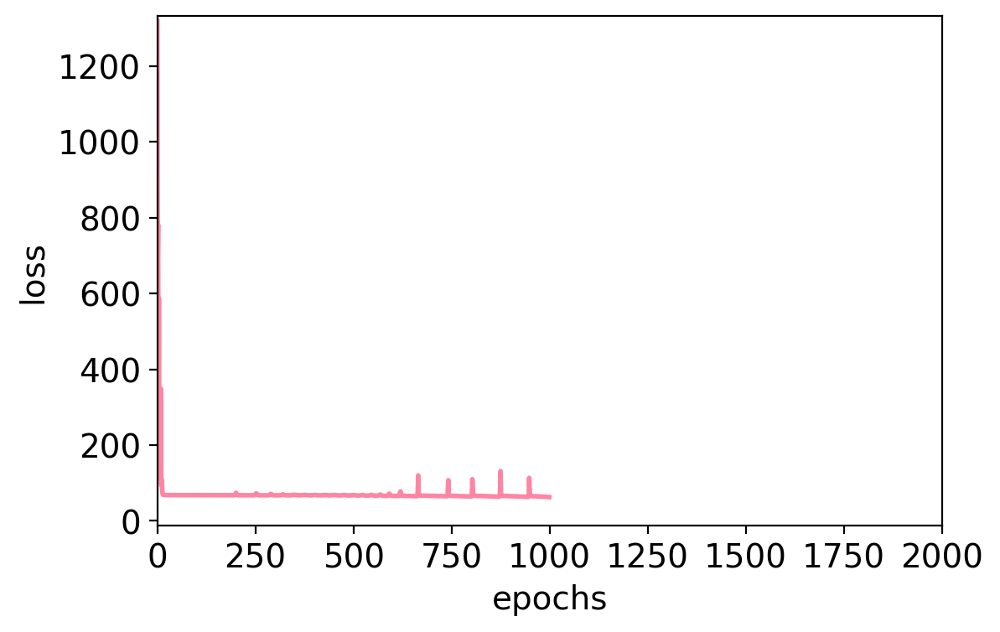

plot losses_ccc


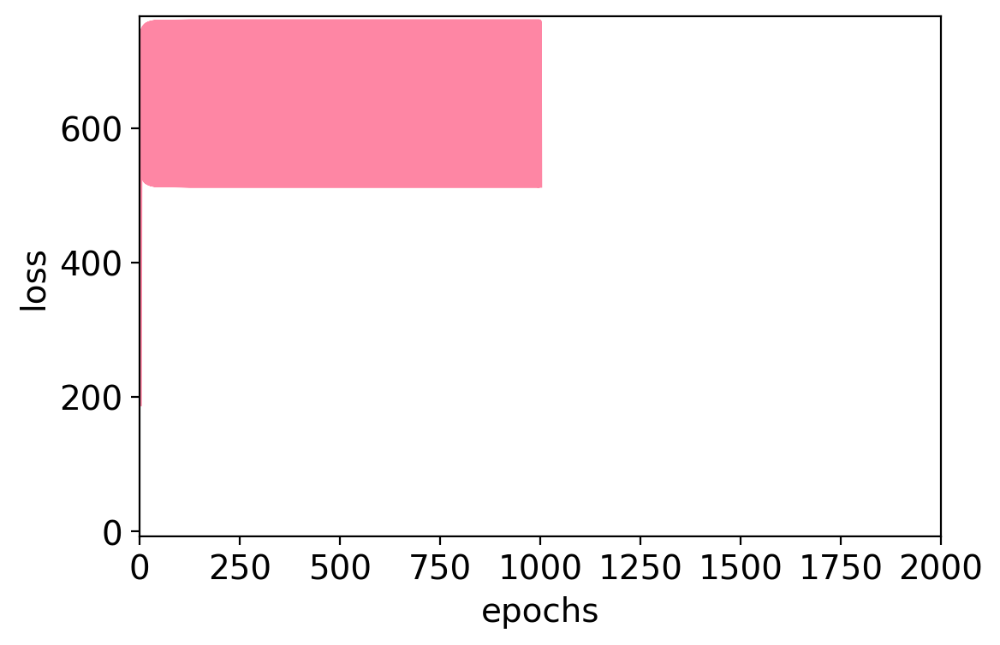

rho=-0.17254836148172398
pval=0.1727464767321496
obs_g2g=[[1. 1. 0. 1. 1. 1. 1. 1.]
 [1. 1. 0. 1. 1. 1. 1. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 1. 0. 1. 1. 1. 1. 1.]
 [1. 1. 0. 1. 1. 1. 1. 1.]
 [1. 1. 0. 1. 1. 1. 1. 1.]
 [1. 1. 0. 1. 1. 1. 1. 1.]
 [1. 1. 0. 1. 1. 1. 1. 1.]]
exp_g2g=[[1.   0.21 0.71 0.54 0.04 0.89 0.71 0.07]
 [0.21 1.   0.61 0.36 0.32 0.89 0.21 0.21]
 [0.71 0.61 1.   0.89 0.54 0.89 0.82 0.57]
 [0.54 0.36 0.89 1.   0.82 0.75 0.07 0.57]
 [0.04 0.32 0.54 0.82 1.   0.21 0.75 0.18]
 [0.89 0.89 0.89 0.75 0.21 1.   0.82 0.5 ]
 [0.71 0.21 0.82 0.07 0.75 0.82 1.   0.79]
 [0.07 0.21 0.57 0.57 0.18 0.5  0.79 1.  ]]
rho=-0.17254836148172398
pval=0.1727464767321496
simulation 99; time passed: 1304.4226305484772
spearman_corr=-0.999993273993153
plot losses_scc


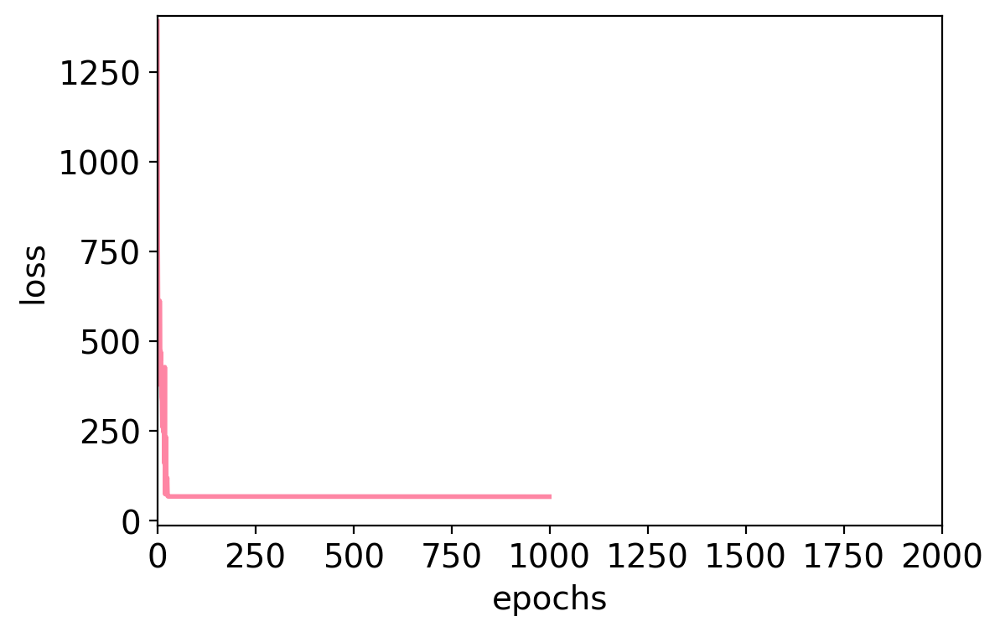

plot losses_ccc


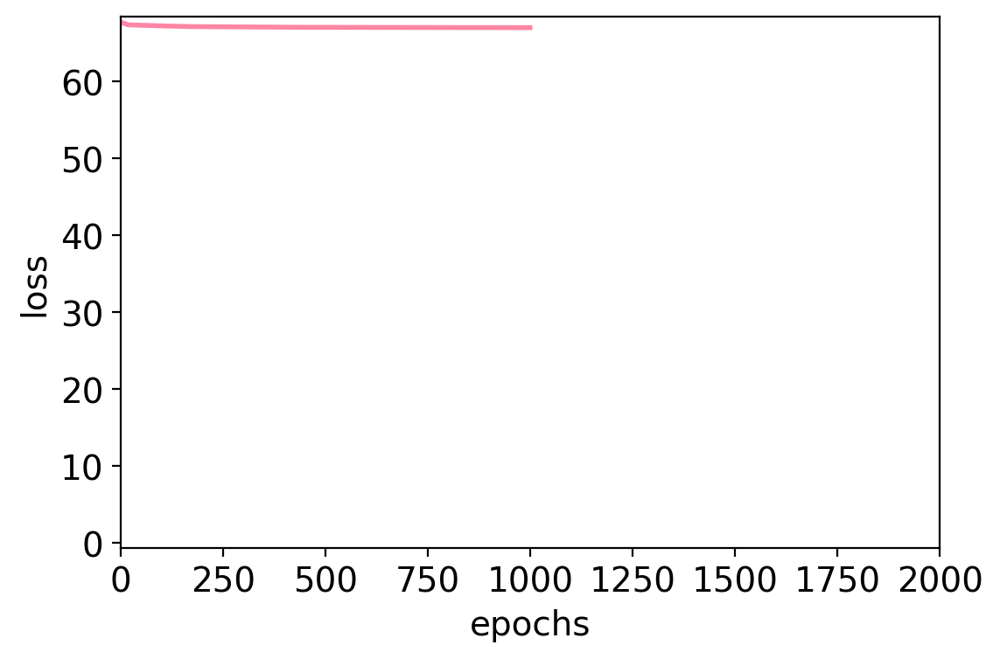

rho=0.6694268356939118
pval=1.469516918038116e-09
obs_g2g=[[1.   0.24 0.2  0.94 0.85 1.   0.79 0.97]
 [0.24 1.   0.51 0.43 0.33 0.61 0.53 0.6 ]
 [0.2  0.51 1.   0.51 0.77 0.56 0.8  0.56]
 [0.94 0.43 0.51 1.   0.45 0.79 0.73 0.3 ]
 [0.85 0.33 0.77 0.45 1.   0.44 0.47 0.56]
 [1.   0.61 0.56 0.79 0.44 1.   0.62 0.43]
 [0.79 0.53 0.8  0.73 0.47 0.62 1.   0.69]
 [0.97 0.6  0.56 0.3  0.56 0.43 0.69 1.  ]]
exp_g2g=[[1.   0.57 0.21 0.68 0.79 0.86 0.71 0.61]
 [0.57 1.   0.61 0.32 0.36 0.89 0.14 0.71]
 [0.21 0.61 1.   0.5  0.46 0.82 0.54 0.54]
 [0.68 0.32 0.5  1.   0.21 0.93 0.46 0.46]
 [0.79 0.36 0.46 0.21 1.   0.68 0.39 0.18]
 [0.86 0.89 0.82 0.93 0.68 1.   0.82 0.71]
 [0.71 0.14 0.54 0.46 0.39 0.82 1.   0.64]
 [0.61 0.71 0.54 0.46 0.18 0.71 0.64 1.  ]]
rho=0.4917018656662208
pval=3.6889463648297644e-05
[0.3584672667894611, 0.2461399198843247, 0.45579809294445917, 0.38448892111542265, 0.47682990195692304, 0.1615893189432946, 0.1595283948260007, 0.3540901986429394, 0.44493513081359454, 0.200265

In [24]:
import multiprocessing as mp
from tqdm import tqdm
import time
rhos_list = []
# define the parameters
n_x, n_y, n_genes = 10, 10, 8
learning_rate = 1e-1
zmft_scalar = 0.01
epochs = 1000
# define the parameters
n_sims = 100
params_list = [[n_x, n_y, n_genes, learning_rate, zmft_scalar, seed, epochs] for seed in list(range(0,100*n_sims, 100) ) ]
# run the simulations
results_list = []
t0 = time.time()
for i, params in enumerate(params_list):
    print(f"simulation {i}; time passed: {time.time() - t0}")
    results = run_sim(params)
    results_list.append(results)

print(rhos_list)

In [25]:
np.nanmean(rhos_list )


0.2769116315018701

In [26]:
# import multiprocessing as mp
# from tqdm import tqdm
# import time
# # define the parameters
# n_x, n_y, n_genes = 10, 10, 50
# learning_rate = 1e-1
# zmft_scalar = 1e-1
# epochs = 2000
# # define the parameters
# n_sims = 5
# params_list = [[n_x, n_y, n_genes, learning_rate, zmft_scalar, seed, epochs] for seed in range(n_sims)]
# # run the simulations
# results_list = []
# t0 = time.time()
# for i, params in enumerate(params_list):
#     print(f"simulation {i}; time passed: {time.time() - t0}")
#     results = run_sim(params)
#     results_list.append(results)

In [20]:
# import multiprocessing as mp
# from tqdm import tqdm
# # define the parameters
# n_x, n_y, n_genes = 10, 10, 4
# learning_rate = 1e-1
# zmft_scalar = 1e-1
# epochs = 2000
# # define the parameters
# n_sims = 100
# params_list = [[n_x, n_y, n_genes, learning_rate, zmft_scalar, seed, epochs] for seed in range(n_sims)]
# # run the simulations
# results_list = []
# with mp.Pool(30) as pool:
#     for results in tqdm(pool.imap(run_sim, params_list), total=n_sims):
#         results_list.append(results)

In [27]:
# define the order of the metrics
order = ['loss_scc','loss_ccc',
         'spearman_ccc_out_vs_scc_in.r','spearman_ccc_out_vs_scc_in.p',
         'spearman_scc_gex_corr_vs_scc_in.r','spearman_scc_gex_corr_vs_scc_in.p',
         'spearman_in_gex_corr_vs_scc_in.r','spearman_in_gex_corr_vs_scc_in.p',]
results_ccc = pd.concat([el[0] for el in results_list], axis=1).loc[order]
results_intra = pd.concat([el[1] for el in results_list], axis=1).loc[order]

In [28]:
# define the things we wish to plot
plotters = [['spearman.r', 'value', ['in-gex-corr','ccc-out']],
            ['spearman.p', 'nlog10p1en4_value', ['in-gex-corr','ccc-out']],
            ['spearman.r', 'value', ['in-gex-corr','scc-gex-corr']],
            ['spearman.p', 'nlog10p1en4_value', ['in-gex-corr','scc-gex-corr']]]

/nfs/users/nfs_s/sm58/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_436922/3718937763.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=0,
/tmp/ipykernel_436922/3718937763.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.stripplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=2,
/tmp/ipykernel_436922/3718937763.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue

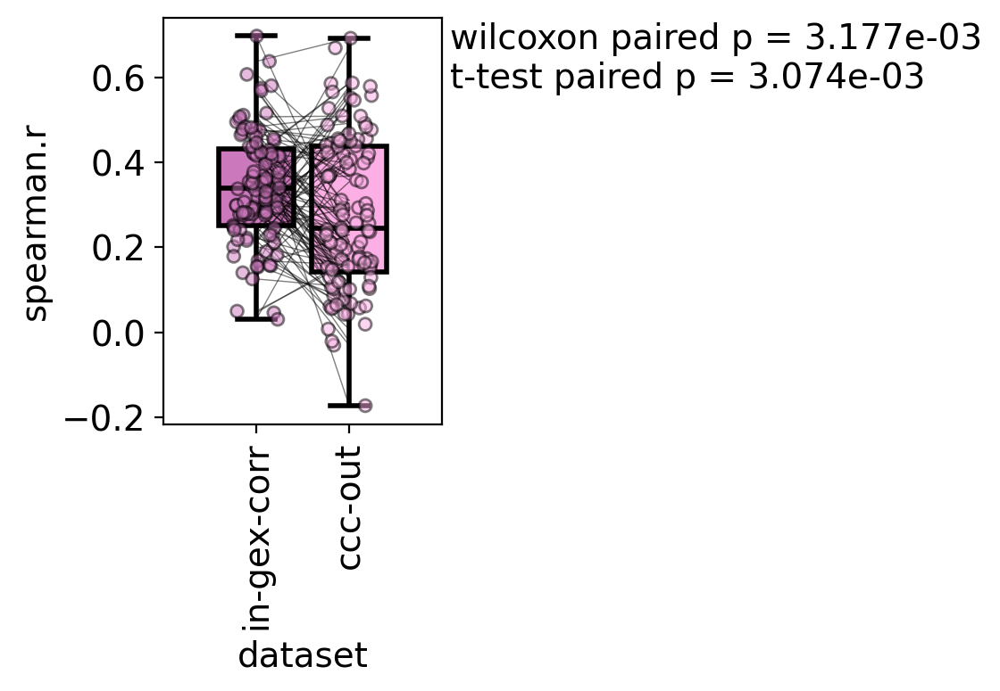

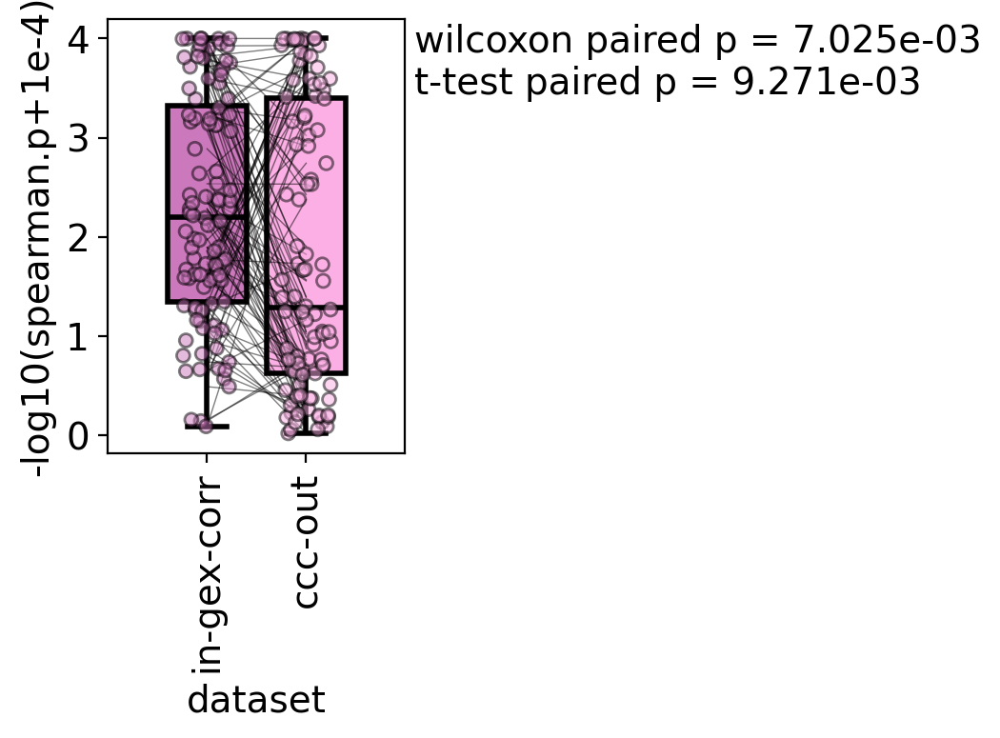

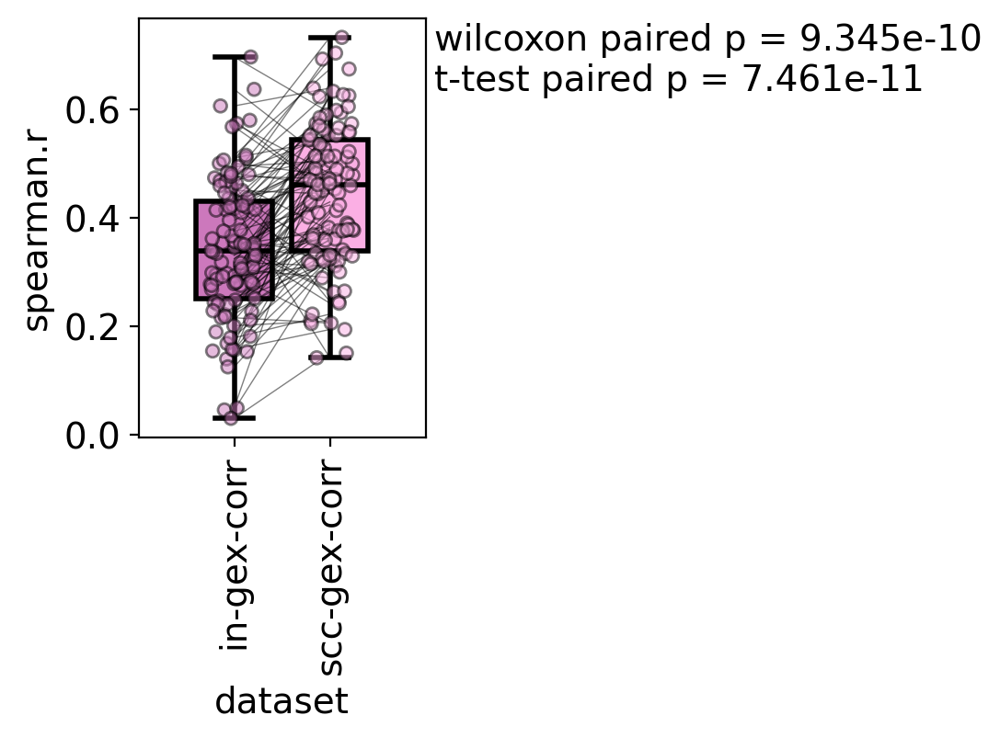

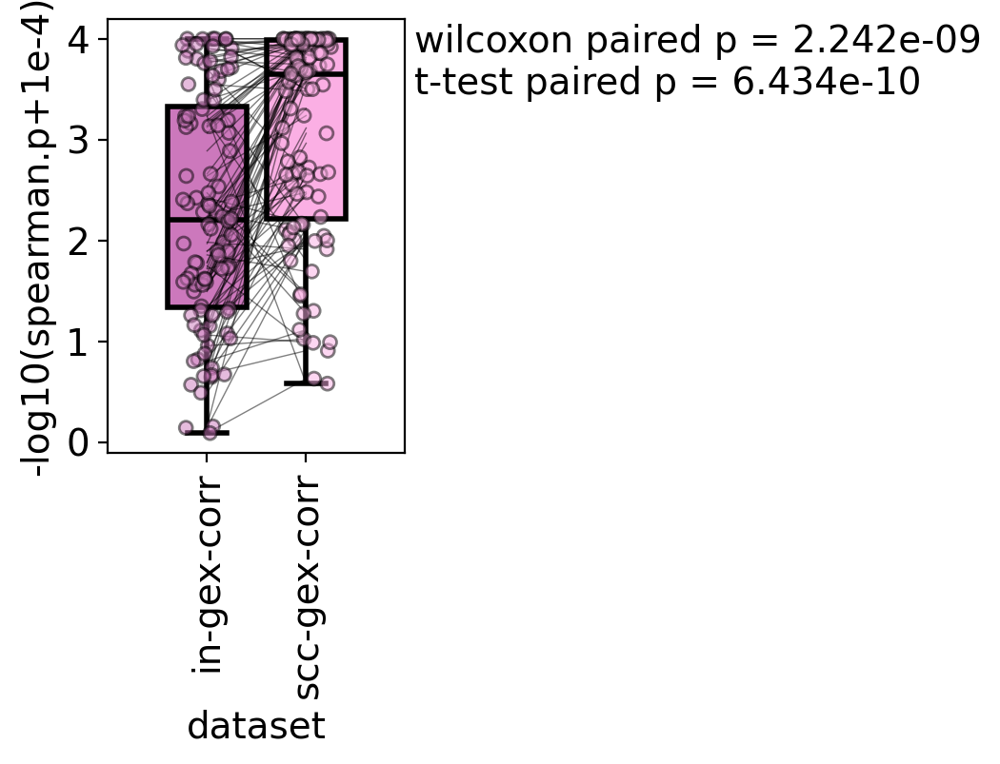

In [29]:
# melt the dataframe into a plottable function (complete this for CCC as before)
data = results_ccc.reset_index().melt(id_vars='index')
data['dataset'] = data['index'].apply(lambda x: '_'.join(x.split('_')[1:]).split('_vs_')[0]).str.replace('_','-')
data['metric'] = data['index'].apply(lambda x: x.split('_')[0]+'.'+x.split('.')[-1])
data['nlog10p1en4_value'] = -np.log10(data['value'].astype(float)+1e-4)
# run through all of the plots
for metric, value, datasets in plotters:
    # plot key pairwise metrics
    fig, ax = plt.subplots(figsize=[2, 3])
    ax.grid(False)
    ax = sns.boxplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=0,
                     saturation=1, ax=ax, order=datasets, linecolor='k', linewidth=2, palette=['#cc78bc','#fbafe4'])
    ax = sns.stripplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=2,
                       ax=ax, order=datasets, edgecolor='k', linewidth=1, jitter=0.25, alpha=0.5, palette=['#cc78bc','#fbafe4'])
    ax.tick_params(axis='x', labelrotation=90)
    if value == 'nlog10p1en4_value':
        ax.set_ylabel(f'-log10({metric}+1e-4)')
    else:
        ax.set_ylabel(f'{metric}')
    # derive the values
    x1 = data.loc[(data['metric'] == metric)&(data['dataset'] == datasets[0]), value].reset_index().iloc[:, 1]
    x2 = data.loc[(data['metric'] == metric)&(data['dataset'] == datasets[1]), value].reset_index().iloc[:, 1]
    mask = (~x1.isna()) & (~x2.isna())
    x1, x2 = x1.loc[mask], x2.loc[mask]
    for idx in x1.index:
        ax.plot(datasets, [x1.loc[idx], x2.loc[idx]], color='k', lw=0.5, alpha=0.5, zorder=1)
    # derive the p-value
    pval1 = ss.wilcoxon(x1, x2)[1]
    pval2 = ss.ttest_rel(x1, x2)[1]
    text = 'wilcoxon paired p = %.3e' % pval1
    text += '\nt-test paired p = %.3e' % pval2
    ax.text(1.03, .99, text, va='top', ha='left', transform=ax.transAxes)
    ax.set_xlim(-1, 2)

In [97]:
# let's try 25 genes and 20 simulations

import multiprocessing as mp
from tqdm import tqdm
import time
# define the parameters
n_x, n_y, n_genes = 10, 10, 25
learning_rate = 1e-1
zmft_scalar = 1e-1
epochs = 1500
# define the parameters
n_sims = 20
params_list = [[n_x, n_y, n_genes, learning_rate, zmft_scalar, seed, epochs] for seed in range(n_sims)]
# run the simulations
results_list = []
t0 = time.time()
for i, params in enumerate(params_list):
    print(f"simulation {i}; time passed: {time.time() - t0}")
    results = run_sim(params)
    results_list.append(results)

simulation 0; time passed: 5.364418029785156e-05
simulation 1; time passed: 119.2219705581665
simulation 2; time passed: 238.85009360313416
simulation 3; time passed: 358.73792481422424
simulation 4; time passed: 478.9817957878113
simulation 5; time passed: 598.1351537704468
simulation 6; time passed: 717.2348716259003
simulation 7; time passed: 836.5393576622009
simulation 8; time passed: 955.7894787788391
simulation 9; time passed: 1075.0545127391815
simulation 10; time passed: 1194.347981929779
simulation 11; time passed: 1314.1523268222809
simulation 12; time passed: 1433.8015913963318
simulation 13; time passed: 1553.4743888378143
simulation 14; time passed: 1672.6755421161652
simulation 15; time passed: 1791.8905103206635
simulation 16; time passed: 1911.4376089572906
simulation 17; time passed: 2030.1869404315948
simulation 18; time passed: 2149.013374567032
simulation 19; time passed: 2268.2048592567444


In [98]:
# define the order of the metrics
order = ['loss_scc','loss_ccc',
         'spearman_ccc_out_vs_scc_in.r','spearman_ccc_out_vs_scc_in.p',
         'spearman_scc_gex_corr_vs_scc_in.r','spearman_scc_gex_corr_vs_scc_in.p',
         'spearman_in_gex_corr_vs_scc_in.r','spearman_in_gex_corr_vs_scc_in.p',]
results_ccc = pd.concat([el[0] for el in results_list], axis=1).loc[order]
results_intra = pd.concat([el[1] for el in results_list], axis=1).loc[order]

In [99]:
# define the things we wish to plot
plotters = [['spearman.r', 'value', ['in-gex-corr','ccc-out']],
            ['spearman.p', 'nlog10p1en4_value', ['in-gex-corr','ccc-out']],
            ['spearman.r', 'value', ['in-gex-corr','scc-gex-corr']],
            ['spearman.p', 'nlog10p1en4_value', ['in-gex-corr','scc-gex-corr']]]

/nfs/users/nfs_s/sm58/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3134723/3718937763.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=0,
/tmp/ipykernel_3134723/3718937763.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.stripplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=2,
/tmp/ipykernel_3134723/3718937763.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `

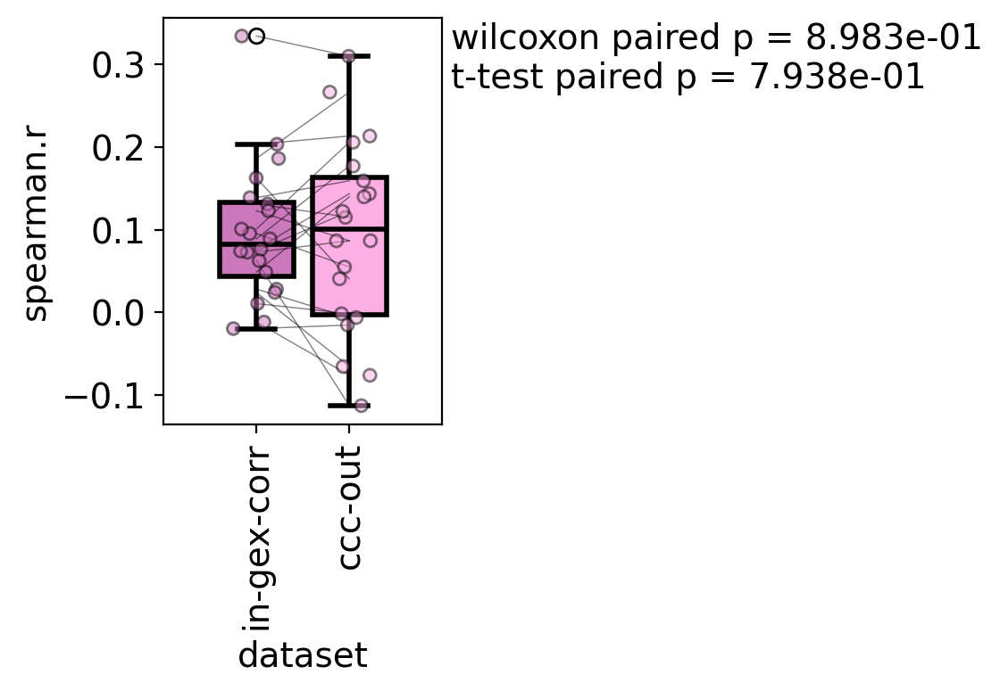

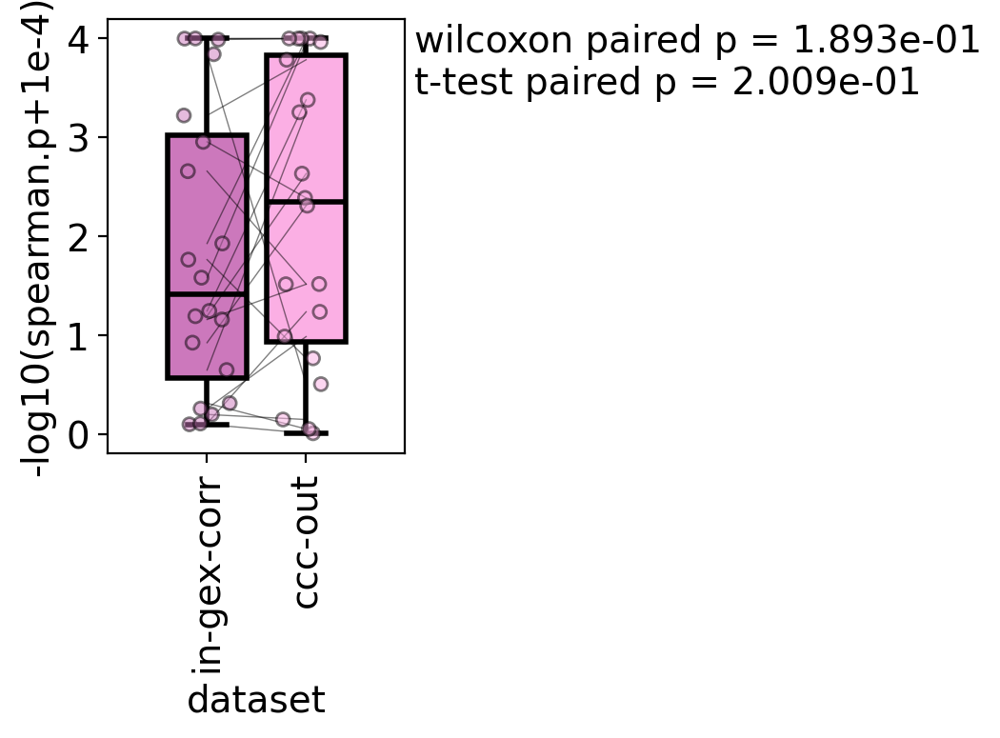

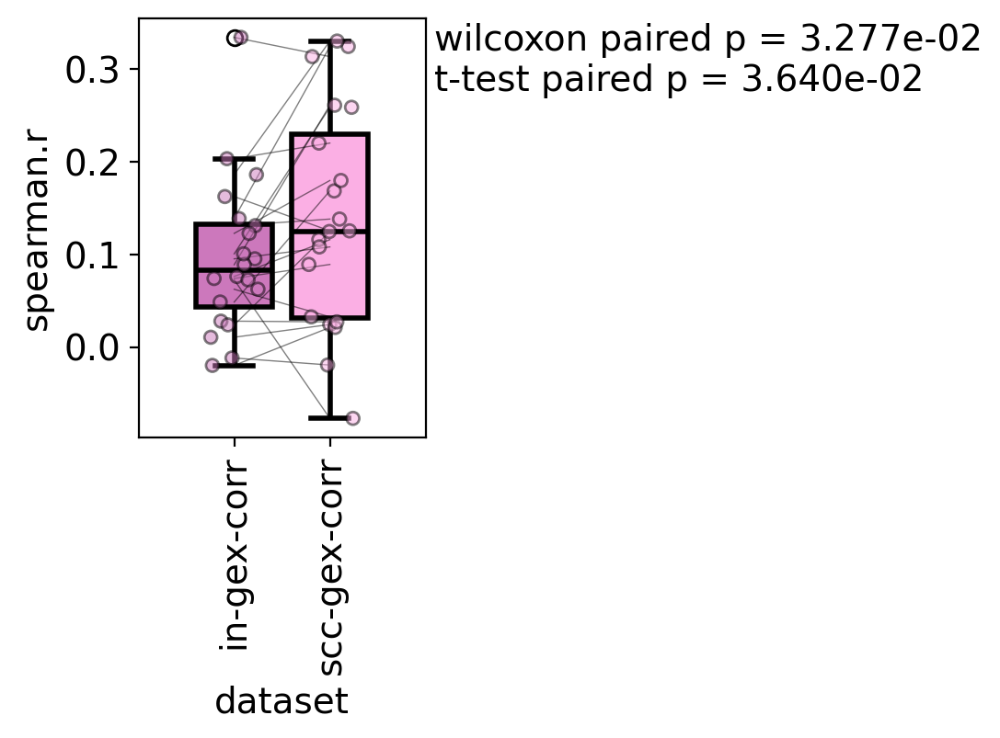

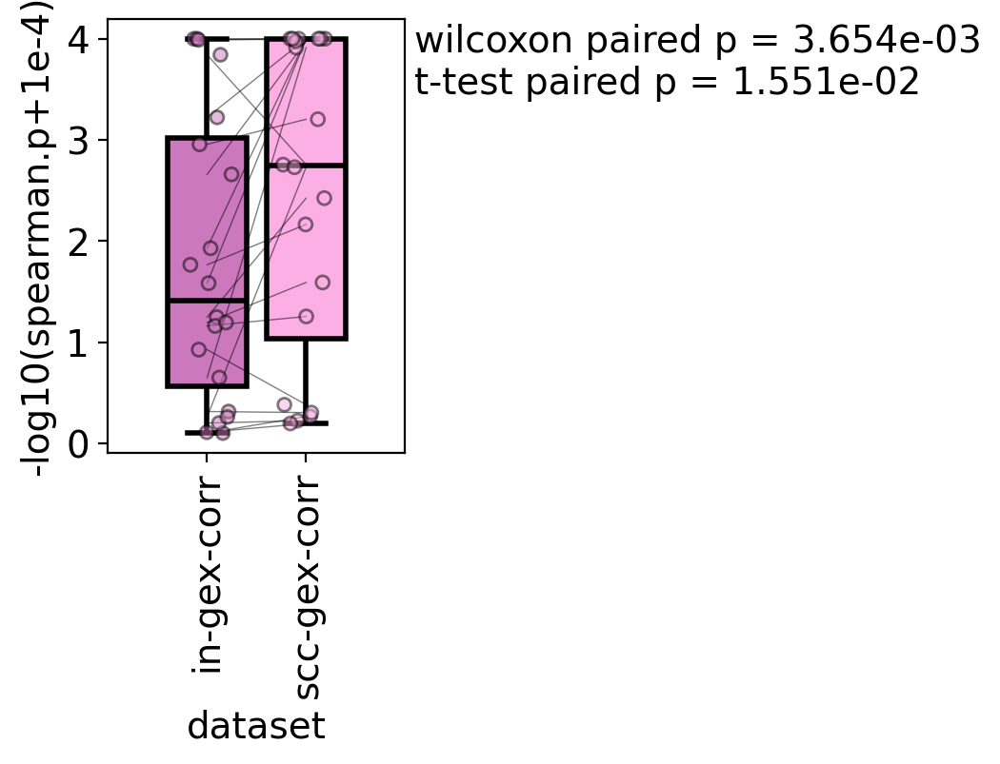

In [100]:
# melt the dataframe into a plottable function (complete this for CCC as before)
data = results_ccc.reset_index().melt(id_vars='index')
data['dataset'] = data['index'].apply(lambda x: '_'.join(x.split('_')[1:]).split('_vs_')[0]).str.replace('_','-')
data['metric'] = data['index'].apply(lambda x: x.split('_')[0]+'.'+x.split('.')[-1])
data['nlog10p1en4_value'] = -np.log10(data['value'].astype(float)+1e-4)
# run through all of the plots
for metric, value, datasets in plotters:
    # plot key pairwise metrics
    fig, ax = plt.subplots(figsize=[2, 3])
    ax.grid(False)
    ax = sns.boxplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=0,
                     saturation=1, ax=ax, order=datasets, linecolor='k', linewidth=2, palette=['#cc78bc','#fbafe4'])
    ax = sns.stripplot(x='dataset', y=value, data=data.loc[data['metric'] == metric], zorder=2,
                       ax=ax, order=datasets, edgecolor='k', linewidth=1, jitter=0.25, alpha=0.5, palette=['#cc78bc','#fbafe4'])
    ax.tick_params(axis='x', labelrotation=90)
    if value == 'nlog10p1en4_value':
        ax.set_ylabel(f'-log10({metric}+1e-4)')
    else:
        ax.set_ylabel(f'{metric}')
    # derive the values
    x1 = data.loc[(data['metric'] == metric)&(data['dataset'] == datasets[0]), value].reset_index().iloc[:, 1]
    x2 = data.loc[(data['metric'] == metric)&(data['dataset'] == datasets[1]), value].reset_index().iloc[:, 1]
    mask = (~x1.isna()) & (~x2.isna())
    x1, x2 = x1.loc[mask], x2.loc[mask]
    for idx in x1.index:
        ax.plot(datasets, [x1.loc[idx], x2.loc[idx]], color='k', lw=0.5, alpha=0.5, zorder=1)
    # derive the p-value
    pval1 = ss.wilcoxon(x1, x2)[1]
    pval2 = ss.ttest_rel(x1, x2)[1]
    text = 'wilcoxon paired p = %.3e' % pval1
    text += '\nt-test paired p = %.3e' % pval2
    ax.text(1.03, .99, text, va='top', ha='left', transform=ax.transAxes)
    ax.set_xlim(-1, 2)